In [1]:
import sys
sys.path.append('/home/aklantbhowmick/anaconda3/lib/python3.7/site-packages')
sys.path.append('/home/aklantbhowmick/anaconda3/lib/python3.7/site-packages/scalpy/')
sys.path.append('/home/aklantbhowmick/anaconda3/envs/nbodykit-env/lib/python3.6/site-packages/')
import mdot_to_Lbol
import arepo_package
import scipy.interpolate
radiative_efficiency=0.2
total_conv=mdot_to_Lbol.get_conversion_factor_arepo(radiative_efficiency)
import h5py
import illustris_python as il
import numpy 
import pandas as pd
import scipy.integrate
from scipy.optimize import curve_fit
import os
%pylab inline

title_fontsize=30
import warnings
warnings.filterwarnings("ignore")

label_fontsize=40

Populating the interactive namespace from numpy and matplotlib


In [28]:
help(h5py.h5dump)

AttributeError: module 'h5py' has no attribute 'h5dump'

In [2]:
import sys
sys.path.append('/home/aklantbhowmick/anaconda3/lib/python3.7/site-packages')
sys.path.append('/home/aklantbhowmick/anaconda3/lib/python3.7/site-packages/scalpy/')
sys.path.append('/home/aklantbhowmick/anaconda3/envs/nbodykit-env/lib/python3.6/site-packages/')
import mdot_to_Lbol
import arepo_package
import scipy.interpolate
import illustris_python

import scipy.integrate

radiative_efficiency=0.2
total_conv=mdot_to_Lbol.get_conversion_factor_arepo(radiative_efficiency)
import h5py

import warnings
warnings.filterwarnings('ignore')

%pylab inline

colors_res=['#83c995','orange','blue','black']


def show_seeding_histories2(basePath,col,labl='.',width=4,style='solid',nbins=40,cumulative=0,plot=1):
    #nbins=40
    scale_fac_complete2,BH_id_complete2,density_complete2,metallicity_complete2,SFR_complete2,FOFDMmass_complete2,indexmaxdens_complete2,file_id_complete2,FOFStarFormingGasMass_complete2,FOFStarFormingGasMetallicity_complete2,N_empty=arepo_package.get_seeding_events2(basePath)
    redshifts_fac=1./scale_fac_complete2-1
    return redshifts_fac


def show_seed_FOFmass(basePath,col,labl='.',width=4,style='solid',nbins=40,cumulative=0):
    #nbins=40
    scale_fac_complete2,BH_id_complete2,density_complete2,metallicity_complete2,SFR_complete2,FOFDMmass_complete2,indexmaxdens_complete2,file_id_complete2,FOFStarFormingGasMass_complete2,FOFStarFormingGasMetallicity_complete2,N_empty=arepo_package.get_seeding_events2(basePath)
    redshifts_fac=1./scale_fac_complete2-1

    seed_redshifts=1./scale_fac_complete2-1.
    mask=(seed_redshifts>redshift_cut)
    return FOFDMmass_complete2[mask]*1e10
 
    

def show_seed_SFGmass(basePath,col,labl='.',width=4,style='solid',nbins=40,cumulative=0):
    #nbins=40
    scale_fac_complete2,BH_id_complete2,density_complete2,metallicity_complete2,SFR_complete2,FOFDMmass_complete2,indexmaxdens_complete2,file_id_complete2,FOFStarFormingGasMass_complete2,FOFStarFormingGasMetallicity_complete2,N_empty=arepo_package.get_seeding_events2(basePath)
    redshifts_fac=1./scale_fac_complete2-1

    seed_redshifts=1./scale_fac_complete2-1.
    mask=(seed_redshifts>redshift_cut)
    return FOFStarFormingGasMass_complete2[mask]*1e10


def get_distribution(HM,Nbins,log_HM_min,log_HM_max,linear=0,cumulative=0,density=0):
    #print(HM)
    
    def extract(HM_min,HM_max):
        if (cumulative==1):
            mask=(HM>HM_min)
        else:
            mask=(HM>HM_min)&(HM<HM_max)
        return (HM_min+HM_max)/2,len(HM[mask])
    if (linear):
        HM_bin=numpy.linspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    else:
        HM_bin=numpy.logspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    out=[extract(HM_bin[i],HM_bin[i+1]) for i in range(0,len(HM_bin)-1)]
    #return out
    centers=numpy.array(list(zip(*out))[0])
    counts=numpy.array(list(zip(*out))[1])
    HMF=counts
    dHMF=numpy.sqrt(counts)
    norm=1.#sum(HMF)
    if (density==1):
        norm=numpy.diff(centers)
    return centers,HMF/norm,dHMF/norm

def show_seeding_halomass2(basePath,labl='.',width=4,style='solid',nbins=40,offset=0):
    #nbins=40
    scale_fac_complete2,BH_id_complete2,density_complete2,metallicity_complete2,SFR_complete2,FOFDMmass_complete2,indexmaxdens_complete2,file_id_complete2,FOFStarFormingGasMass_complete2,FOFStarFormingGasMetallicity_complete2,N_empty=arepo_package.get_seeding_events2(basePath)
    #scale_fac_complete,BH_id_complete,density_complete,metallicity_complete,SFR_complete,FOFDMmass_complete,indexmaxdens_complete,FOFTask_complete, file_id_complete,N_empty=arepo_package.get_seeding_events(basePath)
    #scale_fac_complete,BH_id_complete,density_complete,metallicity_complete,SFR_complete,FOFDMmas
    redshifts_fac=1./scale_fac_complete2-1
    print("No of seeds formed:", len(redshifts_fac[redshifts_fac>0]))
    #obj=ax
    seed_redshifts=1./scale_fac_complete2-1.
    mask=(seed_redshifts>redshift_cut)
    print(FOFDMmass_complete2[mask]) 
    return FOFDMmass_complete2




def get_distribution(HM,Nbins,log_HM_min,log_HM_max,linear=0):
    #print(HM)
    
    def extract(HM_min,HM_max):
        mask=(HM>HM_min)&(HM<HM_max)
        return (HM_min+HM_max)/2,len(HM[mask])
    if (linear):
        HM_bin=numpy.linspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    else:
        HM_bin=numpy.logspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    out=[extract(HM_bin[i],HM_bin[i+1]) for i in range(0,len(HM_bin)-1)]
    #return out
    centers=numpy.array(list(zip(*out))[0])
    counts=numpy.array(list(zip(*out))[1])
    HMF=counts
    dHMF=numpy.sqrt(counts)
    norm=1.#sum(HMF)
    return centers,HMF/norm,dHMF/norm


def get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=0,HDF5=0,path_to_hdf5='./'):
    if(HDF5):
        fobj=h5py.File(path_to_hdf5)
        scale_fac_complete_sorted=fobj.get('time')[:]
        primary_mass_sorted=fobj.get('mass_out')[:]
        secondary_mass_sorted=fobj.get('mass_in')[:]
    else:
        scale_fac_complete_sorted,primary_mass_sorted,secondary_mass_sorted,primary_id_sorted,secondary_id_sorted,file_id_complete_sorted,N_empty=arepo_package.get_merger_events_from_snapshot(basePath,upto_redshift,HOSTS=0)
    mass_ratio=secondary_mass_sorted/primary_mass_sorted
    #print(mass_ratio[mass_ratio>1.])
        #print(primary_mass_sorted,secondary_mass_sorted)
    merger_redshifts=1./scale_fac_complete_sorted-1.
    
    #print(merger_redshifts)
    
    #print("###",primary_mass_sorted)
    mask_primary=primary_mass_sorted>=mass_cut/1e10
    mask_secondary=secondary_mass_sorted>=mass_cut/1e10
    mask_total_mass=(primary_mass_sorted+secondary_mass_sorted)>=total_mass_cut/1e10
    mask_redshift=merger_redshifts>=redshift_cut
    mask_ratio_cut=mass_ratio>=mass_ratio_cut
    mask=((mask_primary&mask_secondary)&(mask_redshift&mask_ratio_cut))&mask_total_mass
    merger_redshifts=merger_redshifts[mask]
  
    #print("!!!",merger_redshifts)
    bins, dist, dist_err,norm,counts_sum=arepo_package.get_probability_density(merger_redshifts,nbins,min_value,max_value,linear=linear)
 
    dist*=counts_sum

    dist_err*=counts_sum
    dt=numpy.array([T(zz-norm/2,zz+norm/2) for zz in bins])
    

    dz=numpy.diff(bins)[0]
    #print("!!!",dist)    
    dz_dt=numpy.array([dz/T(zz-dz/2,zz+dz/2) for zz in bins])
    
    return bins,dist,dist_err,norm,dz_dt


def get_merger_distributions_hosts(basePath,nbins,min_value,max_value,mass_cut,linear=0,HDF5=0,path_to_hdf5='./'):
    if(HDF5):
        fobj=h5py.File(path_to_hdf5)
        scale_fac_complete_sorted=fobj.get('time')[:]
        primary_mass_sorted=fobj.get('mass_out')[:]
        secondary_mass_sorted=fobj.get('mass_in')[:]
    else:
        scale_fac_complete,BH_id_primary,BH_mass_primary,hosthalomass_primary,hosthalostellarmass_primary,hosthalogasmass_primary,hosthalodmmass_primary,BH_id_secondary,BH_mass_secondary,hosthalomass_secondary,hosthalostellarmass_secondary,hosthalogasmass_secondary,hosthalodmmass_secondary,file_id_complete=arepo_package.get_merger_events_hosts(basePath,HDF5=1)        #print(primary_mass_sorted,secondary_mass_sorted)
    mass_ratio=BH_id_secondary/BH_mass_primary
    mask_ratio_cut=mass_ratio>mass_ratio_cut
    merger_redshifts=1./scale_fac_complete-1.
    #print("###",BH_mass_primary)
    mask_primary=BH_mass_primary>mass_cut/1e10
    mask_secondary=BH_mass_secondary>mass_cut/1e10
    mask_total_mass=(BH_mass_primary+BH_mass_secondary)>total_mass_cut/1e10
    mask_redshift=merger_redshifts>redshift_cut
    mask=((mask_primary&mask_secondary)&(mask_redshift&mask_ratio_cut))&mask_total_mass
    
    maskhost1=hosthalomass_primary+hosthalomass_secondary>14.2e10/1e10*h
    maskhost2=hosthalomass_primary>7.1e10/1e10*h
    maskhost3=hosthalodmmass_primary>2e9/1e10*h
    maskhost4=hosthalodmmass_secondary>2e9/1e10*h
    maskhost5=hosthalostellarmass_primary>1e8/1e10*h   
    maskhost6=hosthalostellarmass_secondary>1e8/1e10*h
    
    if(apply_host_cuts==0):
        maskhost=mask
    else:
        maskhost=((((maskhost1&maskhost2)&maskhost3)&maskhost4)&maskhost5)&maskhost6
    
    
    merger_redshifts=merger_redshifts[mask&maskhost]
    
    #print("!!!",merger_redshifts)
    
    bins, dist, dist_err,norm,counts_sum=arepo_package.get_probability_density(merger_redshifts,nbins,min_value,max_value,linear=linear)
    
    dt=numpy.array([T(zz-norm/2,zz+norm/2) for zz in bins])
     
    
    dz=numpy.diff(bins)[0]
    #print("!!!",dist)
    dz_dt=numpy.array([dz/T(zz-dz/2,zz+dz/2) for zz in bins])
    
    return bins,dist,dist_err,norm,dz_dt

def get_merger_rate(basePath, nbins, min_value,max_value,ZOOM=0,HDF5=0,input_simulation_boxsize_in_Mpch=1.,path_to_hdf5='.',GasFractionCut=0.1,hosts=0):
    Mpc_to_kpc=1000
    if (hosts):
        bins,dist,dist_err,norm,dz_dt=get_merger_distributions_hosts(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    else:
        bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])
    if ZOOM:
        if (HDF5):
            simulation_volume=input_simulation_boxsize_in_Mpch**3
        else:
            output_redshifts,high_res_volumes,total_volumes=numpy.load(basePath+'/zoom_volumes_high_res_fraction_cut_%.2f.npy'%(GasFractionCut),allow_pickle=True)
            #print(output_redshifts,high_res_volumes)
            mask=high_res_volumes>0 
            get_volume=scipy.interpolate.interp1d(output_redshifts[mask],high_res_volumes[mask],fill_value='extrapolate')
            simulation_volume=get_volume(bins)
            print("Simulation volumes are:", simulation_volume)
    else:
        if (HDF5):
            simulation_volume=input_simulation_boxsize_in_Mpch**3
        else:
            simulation_volume=(arepo_package.get_box_size(basePath)/Mpc_to_kpc)**3
            print("Simulation volumes are:", simulation_volume)
        
    
    merger_rate=dist*1.
    merger_rate_err=dist_err*1
    
    merger_rate*=dz_dt
    merger_rate_err*=dz_dt
    
    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell
    
    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    return bins, dist, dist_err, merger_rate, merger_rate_err 


def make_LF(basePath, desired_redshift,col,mstyle,lstyle,obj,labl='.',make_scatter=1,ZOOM=0,alph=1,lwidth=3,offset=0):

    DM1Pos,output_redshift=arepo_package.get_particle_property(basePath,'Coordinates',1,desired_redshift)
    COM=numpy.average(DM1Pos,axis=0)
    
    GroupBHMdot,output_redshift=arepo_package.get_particle_property(basePath,'BH_Mdot',5,desired_redshift)
    GroupBHMdot=GroupBHMdot*total_conv
    #print(output_redshift)

    GroupBHMass,output_redshift=arepo_package.get_particle_property(basePath,'BH_Mass',5,desired_redshift)
    GroupBHMass=GroupBHMass*1e10

    
    Coordinates,output_redshift=arepo_package.get_particle_property(basePath,'Coordinates',5,desired_redshift)
    dist=numpy.sqrt(numpy.sum((Coordinates-COM)**2,axis=1))
      
    #GroupBHMdot=numpy.array([convert_mdot_to_Lbol(mdot,mass,radiative_efficiency,1) for mdot,mass in zip(GroupBHMdot,GroupBHMass)])

    
    if (ZOOM==1):
        mask_pos=dist<max_dist
        mask=mask_pos
        GroupBHMdot=GroupBHMdot[mask]
        GroupBHMass=GroupBHMass[mask]
        mask2=GroupBHMass>10**logmasscutov

        N_space= numpy.array([len(GroupBHMdot[mask2&(GroupBHMdot>10**loglumcut)]) for loglumcut in loglumcut_space]) 
        #print(N_space)
        obj.errorbar(loglumcut_space[N_space>0]+offset,N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl,linestyle=lstyle);           
    else:   
        mask1=GroupBHMdot>10**loglumcut
        mask2=GroupBHMass>10**logmasscutov

        N_space= numpy.array([len(GroupBHMdot[mask2&(GroupBHMdot>10**loglumcut)]) for loglumcut in loglumcut_space]) 
        obj.errorbar(loglumcut_space[N_space>0]+offset,N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl,linestyle=lstyle);
  
    #mask=GroupBHMass>0
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,alpha=1);
 
      

    #mask=(GroupLen>100)&(GroupBHMass>0)
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,label=labl);

    #print("Output_redshift is:",output_redshift)
    
    #median_log_halo_mass,median_log_bh_mass,IQR=arepo_package.get_median_with_IQR(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),False,False,10,25)
    #obj.errorbar(median_log_halo_mass,median_log_bh_mass,yerr=IQR,ms=10,linewidth=3,color=col,linestyle=lstyle,label=labl);
    #obj.set_xlim(3.5,12)
    obj.set_ylim(1e-1,1e3)
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    obj.set_yscale('log')
    obj.tick_params(labelsize=40)

def make_MF(basePath, desired_redshift,col,mstyle,lstyle,obj,labl='.',make_scatter=1,ZOOM=0,alph=1,lwidth=3):
    
    DM1Pos,output_redshift=arepo_package.get_particle_property(basePath,'Coordinates',1,desired_redshift)
    COM=numpy.average(DM1Pos,axis=0)
    
    GroupBHMass,output_redshift=arepo_package.get_particle_property(basePath,'BH_Mass',5,desired_redshift)
    GroupBHMass=GroupBHMass*1e10
    
    Coordinates,output_redshift=arepo_package.get_particle_property(basePath,'Coordinates',5,desired_redshift)
    dist=numpy.sqrt(numpy.sum((Coordinates-COM)**2,axis=1))


    if (ZOOM==1):
        
        mask_pos=dist<max_dist
        mask=mask_pos
       # GroupBHMdot=GroupBHMdot[mask]
        GroupBHMass=GroupBHMass[mask]
     
        N_space= numpy.array([len(GroupBHMass[GroupBHMass>10**logmasscut]) for logmasscut in logmasscut_space]) 
        print(N_space)
        obj.errorbar(logmasscut_space[N_space>0],N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl);           
    else:    
        N_space= numpy.array([len(GroupBHMass[GroupBHMass>10**logmasscut]) for logmasscut in logmasscut_space]) 
        obj.errorbar(logmasscut_space[N_space>0],N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl);
  
    #mask=GroupBHMass>0
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,alpha=1);
 
      

    #mask=(GroupLen>100)&(GroupBHMass>0)
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,label=labl);

    print("Output_redshift is:",output_redshift)
    
    #median_log_halo_mass,median_log_bh_mass,IQR=arepo_package.get_median_with_IQR(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),False,False,10,25)
    #obj.errorbar(median_log_halo_mass,median_log_bh_mass,yerr=IQR,ms=10,linewidth=3,color=col,linestyle=lstyle,label=labl);
    #obj.set_xlim(3.5,12)
    obj.set_ylim(1e-1,1e3)
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    obj.set_yscale('log')
    return logmasscut_space,N_space,numpy.sqrt(N_space)


def make_MF_group(basePath, desired_redshift,col,mstyle,lstyle,obj,labl='.',make_scatter=1,ZOOM=0,alph=1,lwidth=3):
    
    GroupMassType,output_redshift=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
    GroupLenType,output_redshift=arepo_package.get_group_property(basePath,'GroupLenType',desired_redshift)
    
    GroupMass1=GroupMassType[:,1]
    GroupMass2=GroupMassType[:,2]
    
    LowResFraction=GroupMass2/(GroupMass1+GroupMass2)
    
    GroupLen=GroupLenType[:,4]
    GroupMass=GroupMassType[:,4]
    #print(GroupLen)
    GroupBHMass,output_redshift=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift)
    GroupMass*=1e10
    GroupBHMass*=1e10

    if (ZOOM==1):
        mask=LowResFraction<0.1
        GroupBHMass=GroupBHMass[mask]    
        N_space= numpy.array([len(GroupBHMass[GroupBHMass>10**logmasscut]) for logmasscut in logmasscut_space]) 
        print(N_space)
        obj.errorbar(logmasscut_space[N_space>0],N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl);           
    else:    
        N_space= numpy.array([len(GroupBHMass[GroupBHMass>10**logmasscut]) for logmasscut in logmasscut_space]) 
        obj.errorbar(logmasscut_space[N_space>0],N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl);
  
    #mask=GroupBHMass>0
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,alpha=1);
 
      

    #mask=(GroupLen>100)&(GroupBHMass>0)
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,label=labl);

    print("Output_redshift is:",output_redshift)
    
    #median_log_halo_mass,median_log_bh_mass,IQR=arepo_package.get_median_with_IQR(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),False,False,10,25)
    #obj.errorbar(median_log_halo_mass,median_log_bh_mass,yerr=IQR,ms=10,linewidth=3,color=col,linestyle=lstyle,label=labl);
    #obj.set_xlim(3.5,12)
    obj.set_ylim(1e-1,1e3)
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    obj.set_yscale('log')

    


def make_LF_group(basePath, desired_redshift,col,mstyle,lstyle,obj,labl='.',make_scatter=1,ZOOM=0,alph=1,lwidth=3):
    
    GroupMassType,output_redshift=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
    GroupLenType,output_redshift=arepo_package.get_group_property(basePath,'GroupLenType',desired_redshift)
    
    GroupMass1=GroupMassType[:,1]
    GroupMass2=GroupMassType[:,2]
    
    LowResFraction=GroupMass2/(GroupMass1+GroupMass2)
    
    GroupLen=GroupLenType[:,4]
    GroupMass=GroupMassType[:,4]
    #print(GroupLen)
    GroupBHMdot,output_redshift=arepo_package.get_group_property(basePath,'GroupBHMdot',desired_redshift)
    GroupBHMdot=GroupBHMdot*total_conv

    GroupBHMass,output_redshift=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift)
    GroupBHMass=GroupBHMass*1e10
    
    if (ZOOM==1):
        mask=LowResFraction<0.1
        GroupBHMdot=GroupBHMdot[mask]
        GroupBHMass=GroupBHMass[mask]
    
        mask2=GroupBHMass>10**logmasscutov

        N_space= numpy.array([len(GroupBHMdot[mask2&(GroupBHMdot>10**loglumcut)]) for loglumcut in loglumcut_space]) 
        #print(N_space)
        obj.errorbar(loglumcut_space[N_space>0],N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl);           
    else:   
        mask1=GroupBHMdot>10**loglumcut
        mask2=GroupBHMass>10**logmasscutov

        N_space= numpy.array([len(GroupBHMdot[mask2&(GroupBHMdot>10**loglumcut)]) for loglumcut in loglumcut_space]) 
        obj.errorbar(loglumcut_space[N_space>0],N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl);
  
    #mask=GroupBHMass>0
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,alpha=1);
 
      

    #mask=(GroupLen>100)&(GroupBHMass>0)
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,label=labl);

    #print("Output_redshift is:",output_redshift)
    
    #median_log_halo_mass,median_log_bh_mass,IQR=arepo_package.get_median_with_IQR(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),False,False,10,25)
    #obj.errorbar(median_log_halo_mass,median_log_bh_mass,yerr=IQR,ms=10,linewidth=3,color=col,linestyle=lstyle,label=labl);
    #obj.set_xlim(3.5,12)
    obj.set_ylim(1e-1,1e3)
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    obj.set_yscale('log')
    obj.tick_params(labelsize=40)

 
    

from scipy.integrate import quad
global c,h,omm,oml,omk
omk=0
oml=0.6911
omm=0.3089
c=3*10**5
h=0.6771


def DC(z0, z1):
    # Comoving distance in Mpc                                                                                          $
    def integrand(z):
        return 1.0/E(z)
    return c/(100.0)*quad(integrand,z0,z1)[0]

def dx_dz(z):
    # Comoving distance in Mpc                                                                                          $
    def integrand(z):
        return 1.0/E(z)
    return c/(100.0)*integrand(z)


def E(z):
        #normalized hubble parameter                                                                                    $
    return np.sqrt(omm*(1.0+z)**3 + oml + omk*(1.0+z)**2)

def DL(z):
    #Luminosity distance in Mpcs                                                                                        $
    return (1.0+z)*DC(0,z)

def DM(z):
        #Distance Modulus                                                                                               $
        return 5*np.log10((DL(z)*1e6)/10.0)

def mtoM(m,z):
    return m - DM(z) - K(z)

def Mtom(M, z):
    return M + DM(z) + K(z)

def LtoM(L):
    M = -2.5 * np.log10(L*1e-7)+34.1
    return M

def MtoL(M):
    return 10**((-1/2.5*(M-34.1)))*1e7

def K(z):
    #K correction, assuming same filter size in emitted and observed frame                                              $
    return 2.5*np.log10(1.0/(1+z))

def T(z0,z1):
    sectoyrs=3.171e-08
    Mpctokm=3.0857E+19
    def integrand(z):
        return 1.0/E(z)/(1+z)
    return 1./(100.0)*quad(integrand,z0,z1)[0]*Mpctokm*sectoyrs






Populating the interactive namespace from numpy and matplotlib


In [3]:

def extract_distribution(basePath,d_type=1):
    boxsize=arepo_package.get_box_size(basePath)/1e3
    
    if(d_type==1):
        data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_min.npy'%LogTargetGroupBHMass)
        unique_LogGroupMass_min_redshift_space=data[0]
        unique_LogGroupStellarMass_min_redshift_space=data[1]
        unique_LogGroupSFR_min_redshift_space=data[2]
        unique_LogGroupSF_min_redshift_space=data[3]
        unique_LogGroupSFMP_min_redshift_space=data[4]
        unique_LogGroupStellarMetallicity_min_redshift_space=data[5]
        unique_LogGroupGasMetallicity_min_redshift_space=data[6]
        unique_min_redshift_space=data[7]

        data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_max.npy'%LogTargetGroupBHMass)
        unique_LogGroupMass_max_redshift_space=data[0]
        unique_LogGroupStellarMass_max_redshift_space=data[1]
        unique_LogGroupSFR_max_redshift_space=data[2]
        unique_LogGroupSF_max_redshift_space=data[3]
        unique_LogGroupSFMP_max_redshift_space=data[4]
        unique_LogGroupStellarMetallicity_max_redshift_space=data[5]
        unique_LogGroupGasMetallicity_max_redshift_space=data[6]
        unique_max_redshift_space=data[7]

        data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_target.npy'%LogTargetGroupBHMass)
        unique_LogGroupMass_target_redshift_space=data[0]
        unique_LogGroupStellarMass_target_redshift_space=data[1]
        unique_LogGroupSFR_target_redshift_space=data[2]
        unique_LogGroupSF_target_redshift_space=data[3]
        unique_LogGroupSFMP_target_redshift_space=data[4]
        unique_LogGroupStellarMetallicity_target_redshift_space=data[5]
        unique_LogGroupGasMetallicity_target_redshift_space=data[6]
        unique_target_redshift_space=data[7]

        unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)

        mask=(unique_target_redshift_space>redshift_cut) & (unique_target_redshift_space<redshift_max)
        a,b,c=get_distribution(unique_LogGroupMass_target_redshift_space[mask],Nbins,minimum,maximum,linear=1) 
        return a,b/boxsize**3,c/boxsize**3



    
    if(d_type==0):
        scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,kk=arepo_package.get_seeding_events4(basePath,GET_ENVIRONMENT=1)
        redshift_complete=1./scale_fac_complete-1.
        mask=(redshift_complete>redshift_cut) & (redshift_complete<redshift_max)
        a,b,c=get_distribution(numpy.log10(FOFDMmass_complete[mask]*1e10),Nbins,minimum,maximum,linear=1)
        return a,b/boxsize**3,c/boxsize**3

        



In [4]:

def extract_distribution(basePath,d_type=1):
    boxsize=arepo_package.get_box_size(basePath)/1e3
    
    if(d_type==1):
        data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_min.npy'%LogTargetGroupBHMass)
        unique_LogGroupMass_min_redshift_space=data[0]
        unique_LogGroupStellarMass_min_redshift_space=data[1]
        unique_LogGroupSFR_min_redshift_space=data[2]
        unique_LogGroupSF_min_redshift_space=data[3]
        unique_LogGroupSFMP_min_redshift_space=data[4]
        unique_LogGroupStellarMetallicity_min_redshift_space=data[5]
        unique_LogGroupGasMetallicity_min_redshift_space=data[6]
        unique_min_redshift_space=data[7]

        data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_max.npy'%LogTargetGroupBHMass)
        unique_LogGroupMass_max_redshift_space=data[0]
        unique_LogGroupStellarMass_max_redshift_space=data[1]
        unique_LogGroupSFR_max_redshift_space=data[2]
        unique_LogGroupSF_max_redshift_space=data[3]
        unique_LogGroupSFMP_max_redshift_space=data[4]
        unique_LogGroupStellarMetallicity_max_redshift_space=data[5]
        unique_LogGroupGasMetallicity_max_redshift_space=data[6]
        unique_max_redshift_space=data[7]

        data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_target.npy'%LogTargetGroupBHMass)
        unique_LogGroupMass_target_redshift_space=data[0]
        unique_LogGroupStellarMass_target_redshift_space=data[1]
        unique_LogGroupSFR_target_redshift_space=data[2]
        unique_LogGroupSF_target_redshift_space=data[3]
        unique_LogGroupSFMP_target_redshift_space=data[4]
        unique_LogGroupStellarMetallicity_target_redshift_space=data[5]
        unique_LogGroupGasMetallicity_target_redshift_space=data[6]
        unique_target_redshift_space=data[7]

        unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)

        mask=(unique_target_redshift_space>redshift_cut) & (unique_target_redshift_space<redshift_max)
        a,b,c=arepo_package.mean_plot2(unique_target_redshift_space[mask],unique_LogGroupMass_target_redshift_space[mask],False,False,minimum,maximum,Nbins) 
        return a[c>0],b[c>0],c[c>0]



    
    if(d_type==0):
        scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,kk=arepo_package.get_seeding_events4(basePath,GET_ENVIRONMENT=1)
        redshift_complete=1./scale_fac_complete-1.
        mask=(redshift_complete>redshift_cut) & (redshift_complete<redshift_max)
        a,b,c=arepo_package.mean_plot2(redshift_complete[mask],numpy.log10(FOFDMmass_complete[mask]*1e10),False,False,minimum,maximum,Nbins)
        return a[c>0],b[c>0],c[c>0]

        



1000 5 7.005417045544533
[8.6871245e-05 5.4200045e-05 1.4724473e-05 ... 0.0000000e+00 0.0000000e+00
 0.0000000e+00]
1000 5 9.00233985416247
[7.1168404e-05 9.3912913e-06 3.5953456e-06 ... 0.0000000e+00 0.0000000e+00
 0.0000000e+00]
1000 5 10.975643294137885
[3.9074580e-06 8.9142295e-06 1.4069635e-06 ... 0.0000000e+00 0.0000000e+00
 0.0000000e+00]
1000 5 7.005417045544533
[5.3451731e-05 3.8936392e-05 1.8805400e-05 ... 0.0000000e+00 0.0000000e+00
 0.0000000e+00]
1000 5 9.00233985416247
[4.9523638e-05 6.2605482e-06 0.0000000e+00 ... 0.0000000e+00 0.0000000e+00
 0.0000000e+00]
1000 5 10.975643294137885
[9.213832e-06 1.250044e-06 0.000000e+00 ... 0.000000e+00 0.000000e+00
 0.000000e+00]
1000 5 7.005417045544533
[7.06150240e-05 6.52210365e-05 1.07661486e-04 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
1000 5 9.00233985416247
[6.3831561e-05 1.3773182e-05 0.0000000e+00 ... 0.0000000e+00 0.0000000e+00
 0.0000000e+00]
1000 5 10.975643294137885
[1.2502078e-06 1.2507151e-06 0.0000000e+00 ... 

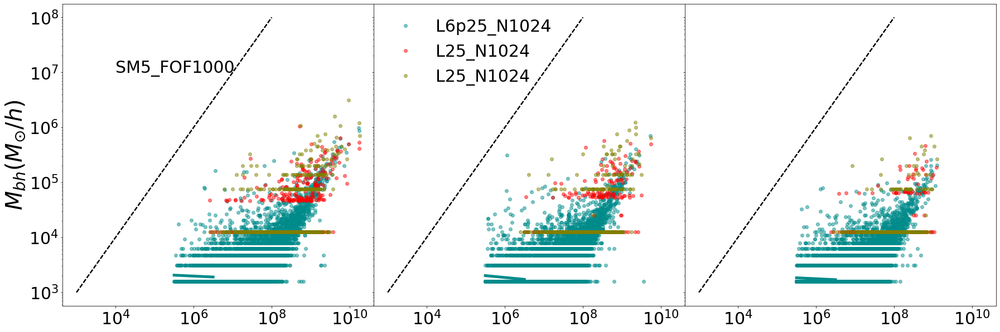

In [5]:



def make_plot(col='black',labl=''):
    i=0
    for desired_redshift in [7,9,11]:
        
        
        file_format='fof_sub_subfind'
        
        GroupMass,o=arepo_package.get_subhalo_property(basePath,'SubhaloMass',desired_redshift)
        print(Mh,Msfmp,o)
        
        GroupMassType,o=arepo_package.get_subhalo_property(basePath,'SubhaloMassType',desired_redshift)
        
        GroupSM=GroupMassType[:,4]

        GroupBHMass,o=arepo_package.get_subhalo_property(basePath,'SubhaloBHMass',desired_redshift)
        print(GroupBHMass)
        #GroupBHMass=GroupMassType[:,4]




        ax[i].errorbar(GroupMass*1e10,GroupBHMass*1e10,marker='o',linewidth=0,alpha=0.5,color=col,label=labl)
        mask=(GroupBHMass>0)&(GroupMass>0)
        a,b,c=arepo_package.mean_plot2(numpy.log10(GroupMass[mask]*1e10),numpy.log10(GroupBHMass[mask]*1e10),False,False,min_x,max_x,Nbins)
        ax[i].errorbar(10**a,10**b,color=col,linewidth=5)

        ax[i].set_yscale('log')
        ax[i].set_xscale('log')
        x_space=numpy.logspace(3,8)
        ax[i].errorbar(x_space,x_space,linewidth=2,color='black',linestyle='dashed')

        ax[i].tick_params(labelsize=30)
        


        i+=1
f,ax=plt.subplots(1,3,figsize=(30,10),sharex=True,sharey=True)
min_x,max_x,Nbins=3,7,5      


j=0
Msfmp,Mh=5,1000

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

make_plot('darkcyan','L6p25_N1024')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6_lin/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('red','L25_N1024')


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('olive','L25_N1024')










#ax[0,0].axhline(8e5)

ax[1].legend(loc='upper left',fontsize=30,frameon=False)
ax[0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=40)





ax[0].text(1e4,1e7,'SM5_FOF1000',fontsize=30)







plt.subplots_adjust(wspace=0,hspace=0)
plt.savefig('./Paper6_figures/SM_BHM.png',bbox_inches='tight')


Desired redshift:  15
Output redshift:  14.989173240042412
Output snapshot:  10
Desired redshift:  15
Output redshift:  14.989173240042412
Output snapshot:  10
Desired redshift:  15
Output redshift:  14.989173240042412
Output snapshot:  10
Desired redshift:  15
Output redshift:  14.989173240042412
Output snapshot:  10


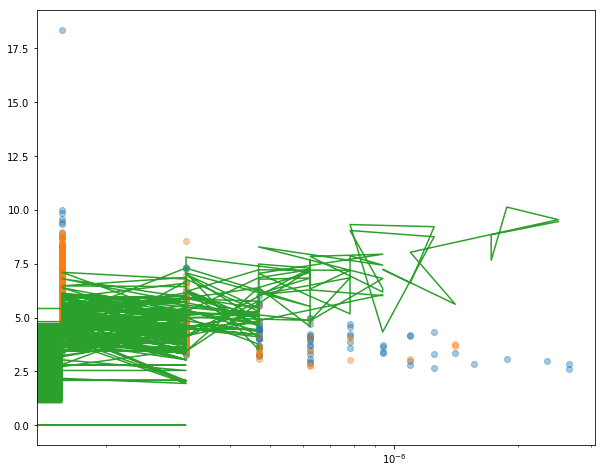

In [25]:


f,ax=plt.subplots(1,1,figsize=(10,8))


Mh,Msfmp=1000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
desired_redshift=15
BH_Hsml,o=arepo_package.get_particle_property(basePath,'BH_Hsml',5,desired_redshift)
BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,desired_redshift)

ax.errorbar(BH_Mass,BH_Hsml,marker='o',linewidth=0,alpha=0.4)



Mh,Msfmp=1000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF_no_repositioning/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
desired_redshift=15
BH_Hsml,o=arepo_package.get_particle_property(basePath,'BH_Hsml',5,desired_redshift)
BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,desired_redshift)
ax.errorbar(BH_Mass,BH_Hsml,marker='o',linewidth=0,alpha=0.4)


SubhaloHalfmassRad,o=arepo_package.get_group_property(basePath,'Group_R_Mean200',desired_redshift)
SubhaloBHMass,o=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift)
ax.errorbar(SubhaloBHMass,SubhaloHalfmassRad)


ax.set_xscale('log')
#ax.set_yscale('log')


Note: reading merger events from the post processed hdf5 files
Note: reading merger events from the post processed hdf5 files
Note: reading merger events from the post processed hdf5 files
Note: reading merger events from the post processed hdf5 files
Note: reading merger events from the post processed hdf5 files
Note: reading merger events from the post processed hdf5 files
Note: reading merger events from the post processed hdf5 files
Note: reading merger events from the post processed hdf5 files
Note: reading merger events from the post processed hdf5 files
Note: reading merger events from the post processed hdf5 files
Note: reading merger events from the post processed hdf5 files
Note: reading merger events from the post processed hdf5 files
Note: reading merger events from the post processed hdf5 files
Note: reading merger events from the post processed hdf5 files
Note: reading merger events from the post processed hdf5 files
Note: reading merger events from the post processed hdf

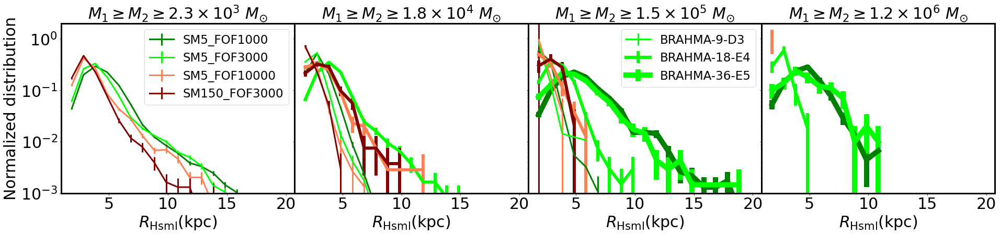

In [14]:
def get_distribution(HM,Nbins,log_HM_min,log_HM_max,linear=0,cumulative=0,density=0):
    #print(HM)
    
    def extract(HM_min,HM_max):
        if (cumulative==1):
            mask=(HM>HM_min)
        else:
            mask=(HM>HM_min)&(HM<HM_max)
        return (HM_min+HM_max)/2,len(HM[mask])
    if (linear):
        HM_bin=numpy.linspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    else:
        HM_bin=numpy.logspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    out=[extract(HM_bin[i],HM_bin[i+1]) for i in range(0,len(HM_bin)-1)]
    #return out
    centers=numpy.array(list(zip(*out))[0])
    counts=numpy.array(list(zip(*out))[1])
    HMF=counts
    dHMF=numpy.sqrt(counts)
    norm=sum(HMF)
    if (density==1):
        norm=numpy.diff(centers)
    return centers-log10(h),HMF/norm,dHMF/norm


def make_plot(mass_cut,convert=0,col='black',width=4,style='solid',labl=''):
    if(convert==1):
        print("converting to hdf5...")
        arepo_package.convert_merger_events_to_hdf5(basePath)

    scale_fac_complete,BH_mass1_complete,BH_mass2_complete,BH_id1_complete,BH_id2_complete,file_id_complete,N_empty,BH_Hsml1_complete,BH_Hsml2_complete=arepo_package.get_merger_events_debug(basePath,get_primary_secondary_indices=0,HDF5=1,SORT_PRIMARY_SECONDARY=0)
    mask=(BH_mass1_complete>=mass_cut/1e10)&(BH_mass2_complete>=mass_cut/1e10)
    BH_Hsml_max=numpy.amax([BH_Hsml1_complete,BH_Hsml2_complete],axis=0)
    a,b,c=get_distribution(BH_Hsml_max[mask],20,1,20,linear=1)
    #f,ax=plt.subplots(1,1,figsize=(8,6))
    mmask=b>0
    ax.errorbar(a[mmask]-log10(h),b[mmask],c[mmask],color=col,linewidth=width,linestyle=style,label=labl)
    ax.set_yscale('log')


f,axx=plt.subplots(1,4,figsize=(32,6),sharey=True,sharex=True)
ax=axx[0]


mass_cut=1.56e3
Mh,Msfmp=1000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(mass_cut,col='green',width=3,labl='SM5_FOF1000')


Mh,Msfmp=3000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(mass_cut,col='lime',width=3,labl='SM5_FOF3000')



Mh,Msfmp=10000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(mass_cut,col='coral',width=3,labl='SM5_FOF10000')

Mh,Msfmp=3000,150
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(mass_cut,col='maroon',width=3,labl='SM150_FOF3000')


ax=axx[1]


mass_cut=1.25e4
Mh,Msfmp=1000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(mass_cut,col='green',width=3)





Mh,Msfmp=3000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(mass_cut,col='lime',width=3)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(mass_cut,col='lime',width=6,convert=0)



Mh,Msfmp=10000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(mass_cut,col='coral',width=3)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(mass_cut,col='coral',width=6,convert=0)


Mh,Msfmp=3000,150
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(mass_cut,col='maroon',width=3)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(mass_cut,col='maroon',width=6,convert=0)


ax=axx[2]


mass_cut=1e5
Mh,Msfmp=1000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(mass_cut,col='green',width=3)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(mass_cut,col='green',width=10,convert=0)



Mh,Msfmp=3000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(mass_cut,col='lime',width=3,labl='BRAHMA-9-D3')


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(mass_cut,col='lime',width=6,convert=0,labl='BRAHMA-18-E4')


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(mass_cut,col='lime',width=10,convert=0,labl='BRAHMA-36-E5')



Mh,Msfmp=10000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(mass_cut,col='coral',width=3)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(mass_cut,col='coral',width=6,convert=0)


Mh,Msfmp=3000,150
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(mass_cut,col='maroon',width=3)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(mass_cut,col='maroon',width=6,convert=0)



ax=axx[3]


mass_cut=8e5
Mh,Msfmp=1000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(mass_cut,col='green',width=3)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(mass_cut,col='green',width=10,convert=0)


Mh,Msfmp=3000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(mass_cut,col='lime',width=3)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(mass_cut,col='lime',width=6,convert=0)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(mass_cut,col='lime',width=10,convert=0)



Mh,Msfmp=10000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(mass_cut,col='coral',width=3)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(mass_cut,col='coral',width=6,convert=0)

Mh,Msfmp=3000,150
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(mass_cut,col='maroon',width=3)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(mass_cut,col='maroon',width=6,convert=0)


ax.set_ylim(1e-3,2)


axx[0].set_title(r'$M_1\geq M_2 \geq 2.3\times10^3 \ M_{\odot}$',fontsize=30)
axx[1].set_title(r'$M_1\geq M_2 \geq 1.8\times10^4 \ M_{\odot}$',fontsize=30)
axx[2].set_title(r'$M_1\geq M_2 \geq 1.5\times10^5 \ M_{\odot}$',fontsize=30)
axx[3].set_title(r'$M_1\geq M_2 \geq 1.2\times10^6 \ M_{\odot}$',fontsize=30)






axx[0].tick_params(labelsize=30)
axx[1].tick_params(labelsize=30)
axx[2].tick_params(labelsize=30)
axx[3].tick_params(labelsize=30)
axx[0].set_ylabel('Normalized distribution',fontsize=30)

axx[0].set_xlabel('$R_{\mathrm{Hsml}}(\mathrm{kpc})$',fontsize=30)
axx[1].set_xlabel('$R_{\mathrm{Hsml}}(\mathrm{kpc})$',fontsize=30)
axx[2].set_xlabel('$R_{\mathrm{Hsml}}(\mathrm{kpc})$',fontsize=30)
axx[3].set_xlabel('$R_{\mathrm{Hsml}}(\mathrm{kpc})$',fontsize=30)

axx[0].legend(loc='upper right',fontsize=23)
axx[2].legend(loc='upper right',fontsize=23)

plt.subplots_adjust(wspace=0)


ax.set_yscale('log')

for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3) 


plt.savefig('./Paper6_figures/BH_hsml_at_merger.png',bbox_inches='tight')






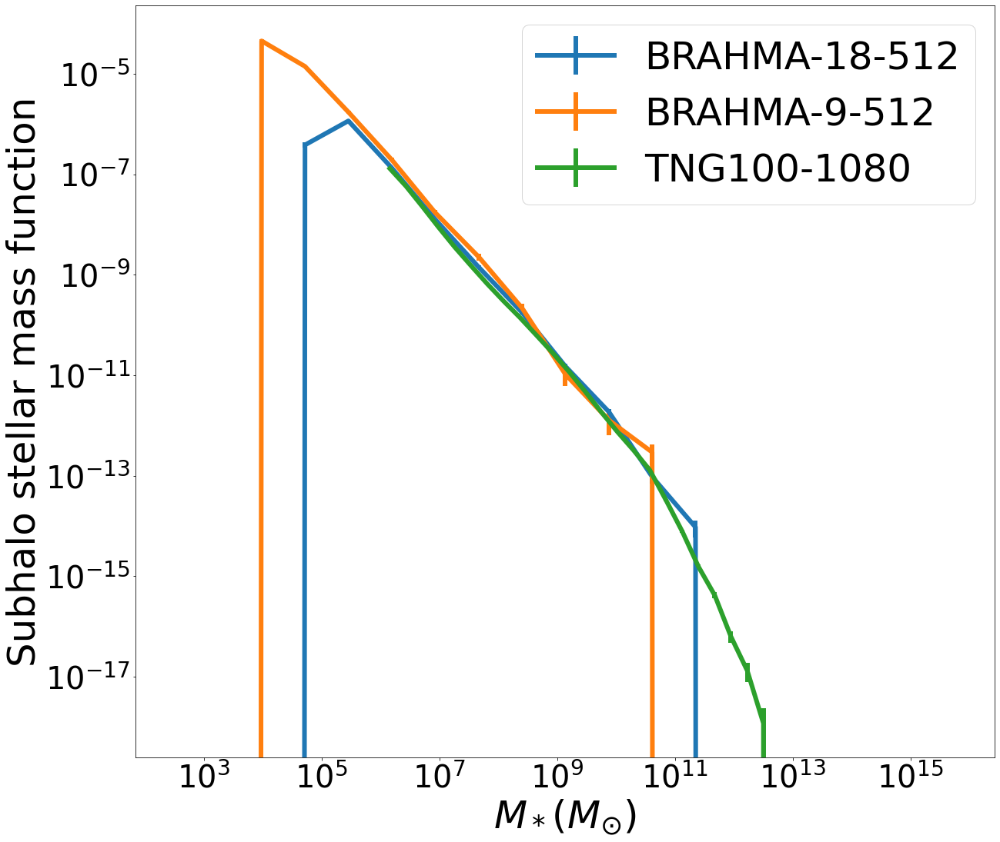

In [101]:
mass_cut=1.56e3
Mh,Msfmp=1000,5


category='stellar'
f,ax=plt.subplots(1,1,figsize=(20,18))
Nbins=20
log_mass_min=2
log_mass_max=16
for desired_redshift in [0]:
    
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n512//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    
    object_type='subhalo'
    centers,HMF,dHMF,o=arepo_package.get_mass_function(category,object_type,desired_redshift,basePath,Nbins,log_mass_min,log_mass_max)
    ax.errorbar(centers,HMF,dHMF,label='BRAHMA-18-512',linewidth=6)
    
    Mh,Msfmp=10000,5 
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    
    object_type='subhalo'
    centers,HMF,dHMF,o=arepo_package.get_mass_function(category,object_type,desired_redshift,basePath,Nbins,log_mass_min,log_mass_max)
    ax.errorbar(centers,HMF,dHMF,label='BRAHMA-9-512',linewidth=6)




centers,HMF,dHMF,o=numpy.load('/home/aklantbhowmick/Aklant/test_arepo_outputs/TNG_mass_functions/L75n1820TNG_subhalo_%s_z0.00_dyn.npy'%category,allow_pickle=True)

ax.errorbar(centers,HMF,dHMF,label='TNG100-1080',linewidth=6)

#axvline(32*1e4)

#axvline(1000*1.56e3)

ax.set_xscale('log')
ax.set_yscale('log')
ax.tick_params(labelsize=40)

ax.set_xlabel('$M_*(M_{\odot})$',fontsize=50)

ax.set_ylabel('Subhalo stellar mass function',fontsize=50)

ax.legend(loc='upper right',fontsize=50)


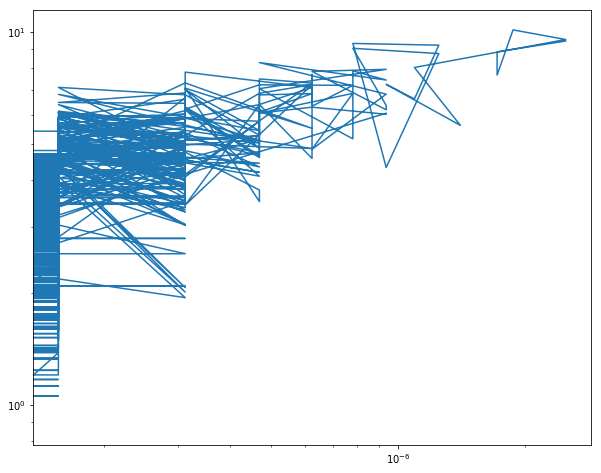

In [23]:
f,ax=plt.subplots(1,1,figsize=(10,8))

SubhaloHalfmassRad,o=arepo_package.get_group_property(basePath,'Group_R_Mean200',desired_redshift)
SubhaloBHMass,o=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift)

ax.errorbar(SubhaloBHMass,SubhaloHalfmassRad)

ax.set_xscale('log')
ax.set_yscale('log')




Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
{'NumPart_ThisFile': array([66493072, 67319987,        0,        0,    41155,       56],
      dtype=int32), 'NumPart_Total': array([1061151669, 1073741824,          0,          0,     532574,
              791], dtype=uint32), 'NumPart_Total_HighWord': array([0, 0, 0, 0, 0, 0], dtype=uint32), 'MassTable': array([0.00000000e+00, 1.31400861e-05, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00]), 'Time': 0.12491541593783131, 'Redshift': 7.005417045544533, 'BoxSize': 12500.0, 'NumFilesPerSnapshot': 16, 'Omega0': 0.3089, 'OmegaLambda': 0.6911, 'OmegaBaryon': 0.0486, 'HubbleParam': 0.6771, 'Flag_Sfr': 1, 'Flag_Cooling': 1, 'Flag_StellarAge': 0, 'Flag_Metals': 0, 'Flag_Feedback': 1, 'Flag_DoublePrecision': 0, 'Composition_vector_length': 0, 'Git_commit': b'2b799e5345ab5a3de4b1bcbe604bd98562d7dd11', 'Git_date': b'Tue Mar 2 09:19:29 2021 -0500', 'UnitLength_in_cm': 3.085678e+21, 'UnitMass_in_g':

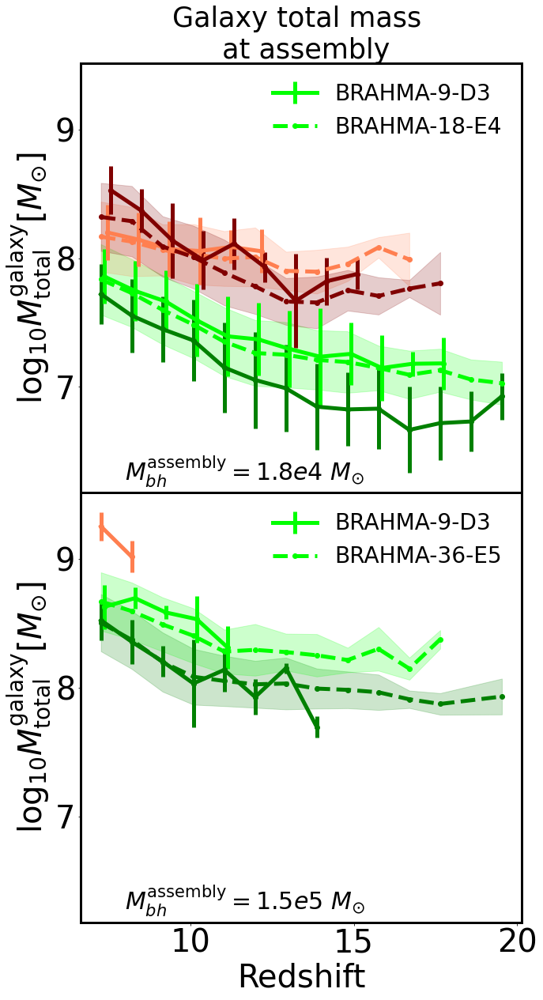

In [9]:
f,axxx=plt.subplots(2,1,figsize=(10,20),sharex=True,sharey=True)
Nbins,minimum,maximum=15,6.8,20

axx=axxx[0]
redshift_cut=7

redshift_max=25

LogTargetGroupBHMass=4.10
levelmax_gas,logseedmass_gas=12,3.19
levelmax,logseedmass=12,3.19


Msfmp,Mh=5,1000

col='green'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b-log10(h),c,marker='o',linewidth=5,color=col)

Msfmp,Mh=5,3000

col='lime'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a+0.1,b-log10(h),c,marker='o',linewidth=5,color=col,label='BRAHMA-9-D3')


box_label='L12p5n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

a,b,c=extract_distribution(basePath,d_type=0)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b-log10(h),marker='o',linewidth=5,color=col,label='BRAHMA-18-E4',linestyle='dashed')
axx.fill_between(a,b-c-log10(h),b-log10(h)+c,color=col,alpha=0.2)

Msfmp,Mh=5,10000
col='coral'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a+0.2,b-log10(h),c,marker='o',linewidth=5,color=col)


box_label='L6p25n512'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

a,b,c=extract_distribution(basePath,d_type=0)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b-log10(h),marker='o',linewidth=5,color=col,linestyle='dashed')
axx.fill_between(a,b-log10(h)-c,b-log10(h)+c,color=col,alpha=0.2)

Msfmp,Mh=150,3000
col='maroon'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a+0.3,b-log10(h),c,marker='o',linewidth=5,color=col)
#axx.fill_between(a,b-c,b+c,color=col,alpha=0.2)

box_label='L12p5n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

a,b,c=extract_distribution(basePath,d_type=0)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b-log10(h),marker='o',linewidth=5,color=col,linestyle='dashed')
axx.fill_between(a,b-log10(h)-c,b-log10(h)+c,color=col,alpha=0.2)
massdm=arepo_package.load_snapshot_header(basePath,7)['MassTable'][1]

#axx.axhline(numpy.log10(massdm*1e10*8),color='black',linewidth=2,linestyle='dotted')


#axx.set_yscale('log')

axx.tick_params(labelsize=label_fontsize)


axx=axxx[1]
redshift_cut=7

LogTargetGroupBHMass=5.00
levelmax_gas,logseedmass_gas=12,3.19
levelmax,logseedmass=12,3.19


Msfmp,Mh=5,1000

col='green'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b-log10(h),c,marker='o',linewidth=5,color=col)


box_label='L12p5n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

a,b,c=extract_distribution(basePath,d_type=0)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b-log10(h),marker='o',linewidth=5,color=col,linestyle='dashed')
axx.fill_between(a,b-log10(h)-c,b-log10(h)+c,color=col,alpha=0.2)

Msfmp,Mh=5,3000

col='lime'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a+0.1,b-log10(h),c,marker='o',linewidth=5,color=col,label='BRAHMA-9-D3')


box_label='L12p5n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

a,b,c=extract_distribution(basePath,d_type=0)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b-log10(h),marker='o',linewidth=5,color=col,label='BRAHMA-36-E5',linestyle='dashed')

axx.fill_between(a,b-log10(h)-c,b-log10(h)+c,color=col,alpha=0.2)

massdm=arepo_package.load_snapshot_header(basePath,7)['MassTable'][1]

#axx.axhline(numpy.log10(massdm*1e10*8),color='black',linewidth=2,linestyle='dotted')


Msfmp,Mh=5,10000

col='coral'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b-log10(h),c,marker='o',linewidth=5,color=col,label='')


Msfmp,Mh=150,3000

col='maroon'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b-log10(h),c,marker='o',linewidth=5,color=col,label='')



#axx.axhline(numpy.log10(massdm*1e10*32),color='black',linewidth=2,linestyle='dotted')



#axx.set_yscale('log')

axx.tick_params(labelsize=label_fontsize)



axx.set_xlabel('Redshift',fontsize=label_fontsize)

axxx[0].set_ylabel('$\log_{10} M^{\mathrm{galaxy}}_{\mathrm{total}}[M_{\odot}]$',fontsize=label_fontsize)
axxx[1].set_ylabel('$\log_{10} M^{\mathrm{galaxy}}_{\mathrm{total}}[M_{\odot}]$',fontsize=label_fontsize)


axxx[0].set_title('Galaxy total mass \n at assembly',fontsize=label_fontsize-5)

axxx[0].legend(loc='upper right',frameon=False,fontsize=28)
#axxx[1].legend(loc='upper right',frameon=False,fontsize=29)


axx.legend(loc='upper right',fontsize=28,frameon=False)

#axx[1].legend(loc='upper right',fontsize=label_fontsize-20)

plt.subplots_adjust(wspace=0,hspace=0)

axxx[1].text(8,6.1-log10(h),r'$M^{\mathrm{assembly}}_{bh} = 1.5e5 \ M_{\odot}$',fontsize=30)

axxx[0].text(8,6.1-log10(h),r'$M^{\mathrm{assembly}}_{bh} = 1.8e4 \ M_{\odot}$',fontsize=30)

#axx[1].set_yscale('log')

for ax in axxx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3) 



plt.savefig('./Paper6_figures/galaxy_mass_distributions.png',bbox_inches='tight')


In [10]:
help(arepo_package.mean_plot2)

Help on function mean_plot2 in module arepo_package:

mean_plot2(x, y, xscl, yscl, min_x, max_x, nbins)



Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
{'NumPart_ThisFile': array([66118795, 66950540,        0,        0,    46504,       74],
      dtype=int32), 'NumPart_Total': array([1061153045, 1073741824,          0,          0,     530931,
             1153], dtype=uint32), 'NumPart_Total_HighWord': array([0, 0, 0, 0, 0, 0], dtype=uint32), 'MassTable': array([0.00000000e+00, 1.31400861e-05, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00]), 'Time': 0.12491541593783131, 'Redshift': 7.005417045544533, 'BoxSize': 12500.0, 'NumFilesPerSnapshot': 16, 'Omega0': 0.3089, 'OmegaLambda': 0.6911, 'OmegaBaryon': 0.0486, 'HubbleParam': 0.6771, 'Flag_Sfr': 1, 'Flag_Cooling': 1, 'Flag_StellarAge': 0, 'Flag_Metals': 0, 'Flag_Feedback': 1, 'Flag_DoublePrecision': 0, 'Composition_vector_length': 0, 'Git_commit': b'2b799e5345ab5a3de4b1bcbe604bd98562d7dd11', 'Git_date': b'Tue Mar 2 09:19:29 2021 -0500', 'UnitLength_in_cm': 3.085678e+21, 'UnitMass_in_g':

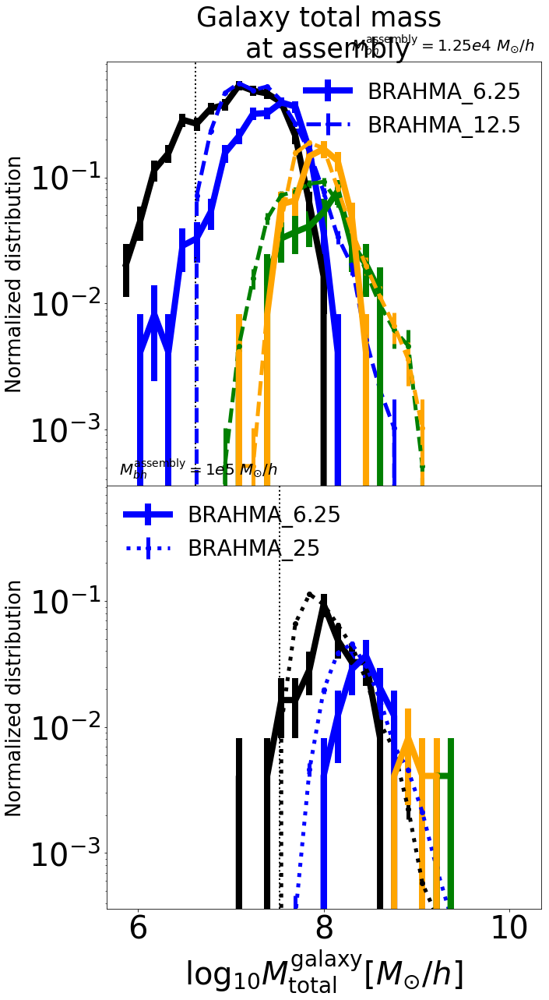

In [7]:
f,axxx=plt.subplots(2,1,figsize=(10,20),sharey=True)
Nbins,minimum,maximum=30,5.8,10.2

axx=axxx[0]
redshift_cut=7

redshift_max=25

LogTargetGroupBHMass=4.10
levelmax_gas,logseedmass_gas=12,3.19
levelmax,logseedmass=12,3.19


Msfmp,Mh=5,1000

col='black'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=8,color=col)

Msfmp,Mh=5,3000

col='blue'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=8,color=col,label='BRAHMA_6.25')


box_label='L12p5n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

a,b,c=extract_distribution(basePath,d_type=0)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=5,color=col,linestyle='dashed',label='BRAHMA_12.5')


Msfmp,Mh=150,3000
col='green'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=8,color=col)


box_label='L6p25n512'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

a,b,c=extract_distribution(basePath,d_type=0)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=5,color=col,linestyle='dashed')


Msfmp,Mh=5,10000
col='orange'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=8,color=col)


box_label='L12p5n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

a,b,c=extract_distribution(basePath,d_type=0)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=5,color=col,linestyle='dashed')

massdm=arepo_package.load_snapshot_header(basePath,7)['MassTable'][1]

axx.axvline(numpy.log10(massdm*1e10*32),color='black',linewidth=2,linestyle='dotted')


axx.set_yscale('log')

axx.tick_params(labelsize=label_fontsize)


axx=axxx[1]
redshift_cut=7

LogTargetGroupBHMass=5.00
levelmax_gas,logseedmass_gas=12,3.19
levelmax,logseedmass=12,3.19


Msfmp,Mh=5,1000

col='black'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=8,color=col)


box_label='L12p5n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

a,b,c=extract_distribution(basePath,d_type=0)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=5,color=col,linestyle='dotted')


Msfmp,Mh=5,3000

col='blue'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=8,color=col,label='BRAHMA_6.25')


box_label='L12p5n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

a,b,c=extract_distribution(basePath,d_type=0)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=5,color=col,linestyle='dotted',label='BRAHMA_25')

massdm=arepo_package.load_snapshot_header(basePath,7)['MassTable'][1]

axx.axvline(numpy.log10(massdm*1e10*32),color='black',linewidth=2,linestyle='dotted')




Msfmp,Mh=150,3000
col='green'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=8,color=col)




Msfmp,Mh=5,10000
col='orange'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=8,color=col)






axx.set_yscale('log')

axx.tick_params(labelsize=label_fontsize)



axx.set_xlabel('$\log_{10} M^{\mathrm{galaxy}}_{\mathrm{total}}[M_{\odot}/h]$',fontsize=label_fontsize)

axxx[0].set_ylabel('Normalized distribution',fontsize=label_fontsize-14)
axxx[1].set_ylabel('Normalized distribution',fontsize=label_fontsize-14)


axxx[0].set_title('Galaxy total mass \n at assembly',fontsize=label_fontsize-5)

axxx[0].legend(loc='upper right',frameon=False,fontsize=28)
#axxx[1].legend(loc='upper right',frameon=False,fontsize=29)


axx.legend(loc='upper left',fontsize=28,frameon=False)

#axx[1].legend(loc='upper right',fontsize=label_fontsize-20)

plt.subplots_adjust(wspace=0,hspace=0)

axxx[1].text(5.8,1,r'$M^{\mathrm{assembly}}_{bh} = 1e5 \ M_{\odot}/h$',fontsize=20)

axxx[0].text(8.3,1,r'$M^{\mathrm{assembly}}_{bh} = 1.25e4 \ M_{\odot}/h$',fontsize=20)

#axx[1].set_yscale('log')

plt.savefig('./Paper6_figures/galaxy_mass_distributions.png',bbox_inches='tight')


Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
[1.51586365e-02 6.71630992e-02 2.97578339e-01 1.31847501e+00
 5.84174361e+00 2.58829087e+01 1.14678939e+02 5.08105921e+02
 2.25125580e+03 9.97459870e+03]
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
[6.07401770e-03 2.69120413e-02 1.19238699e-01 5.28308767e-01
 2.34076818e+00 1.03711996e+01 4.59514882e+01 2.03596435e+02
 9.02071075e+02 3.99679014e+03]
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snap

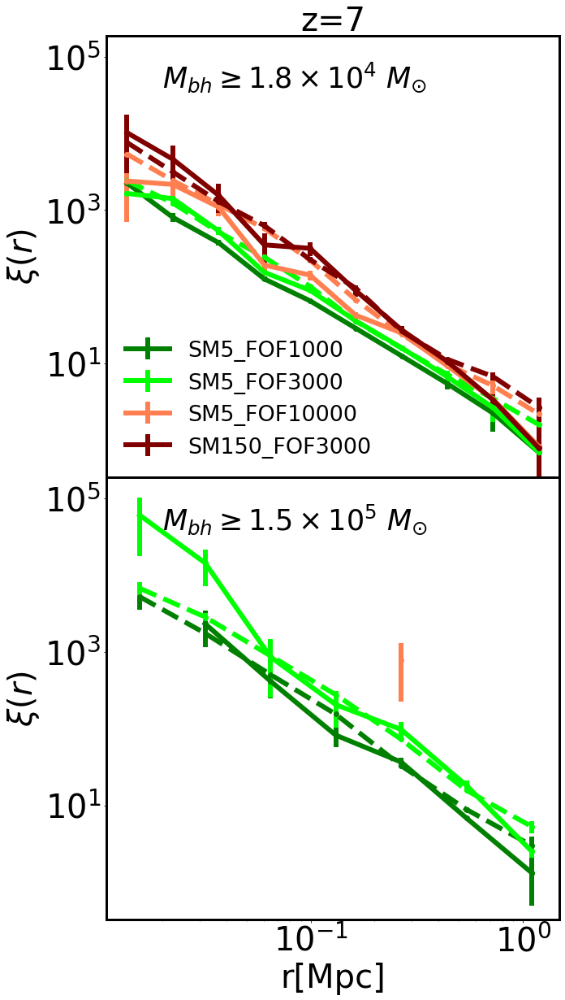

In [14]:



def make_plot(ax,style='solid',labl=''):
    for redshift in [7]:



        Coordinates,o=arepo_package.get_particle_property(basePath,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>=mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist,arepo_package.get_box_size(basePath), WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col,linewidth=6,linestyle=style,marker='o',label=labl)


        #ax.set_ylim(1e2,1e6)

        ax.tick_params(labelsize=label_fontsize)
        ax.set_yscale('log')
        ax.set_xscale('log')

        
        
f,ax=plt.subplots(2,1,figsize=(10,20),sharex=True,sharey=True)





mass_cut=1.25e4/1e10
lum_cut=0

dist_bins, max_dist,min_dist = 10, 7e-3, 1
axx=ax[0]



col='green'
Msfmp,Mh=5,1000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output 
make_plot(axx,labl='SM5_FOF1000')





col='lime'
Msfmp,Mh=5,3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output 
make_plot(axx,labl='SM5_FOF3000')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx,style='dashed')



col='coral'
Msfmp,Mh=5,10000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output 
make_plot(axx,labl='SM5_FOF10000')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx,style='dashed')


col='maroon'
Msfmp,Mh=150,3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output 
make_plot(axx,labl='SM150_FOF3000')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx,style='dashed')




dist_bins, max_dist,min_dist = 7, 7e-3, 1
axx=ax[1]
mass_cut=1e5/1e10


col='green'
Msfmp,Mh=5,1000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output 
make_plot(axx)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx,style='dashed')


col='lime'
Msfmp,Mh=5,3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output 
make_plot(axx)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx,style='dashed')


col='coral'
Msfmp,Mh=5,10000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output 
make_plot(axx)

col='maroon'
Msfmp,Mh=150,3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output 
make_plot(axx)






#axx.set_title(r'$M_{bh}>1.25\times10^{4}M_{\odot}/h$',fontsize=label_fontsize)

ax[0].set_title('z=7',fontsize=40)
ax[1].set_xlabel('r[Mpc]',fontsize=label_fontsize)

ax[0].set_ylabel(r'$\xi(r)$',fontsize=label_fontsize)
ax[1].set_ylabel(r'$\xi(r)$',fontsize=label_fontsize)

ax[0].text(0.02,4e4,r'$M_{bh}\geq 1.8\times 10^4 \ M_{\odot}$',fontsize=label_fontsize-5)
ax[1].text(0.02,4e4,r'$M_{bh}\geq 1.5\times 10^5 \ M_{\odot}$',fontsize=label_fontsize-5)

ax[0].legend(loc='lower left',fontsize=27,frameon=False)

for a in ax.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 



plt.subplots_adjust(wspace=0,hspace=0)

#plt.savefig('./Paper5_figures/subhalo_based_models4_Msfmp5_Mh3000_seed5.00.png',bbox_inches='tight')

plt.savefig('./Paper6_figures/small_scale_clustering.png',bbox_inches='tight')
        

Desired redshift:  0
Output redshift:  1.4955121664955557
Output snapshot:  24
Desired redshift:  0
Output redshift:  1.4955121664955557
Output snapshot:  24
Desired redshift:  1
Output redshift:  1.4955121664955557
Output snapshot:  24
Desired redshift:  1
Output redshift:  1.4955121664955557
Output snapshot:  24
Desired redshift:  3
Output redshift:  3.008131071630377
Output snapshot:  22
Desired redshift:  3
Output redshift:  3.008131071630377
Output snapshot:  22
Desired redshift:  5
Output redshift:  4.995933468164624
Output snapshot:  20
Desired redshift:  5
Output redshift:  4.995933468164624
Output snapshot:  20
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  11
Output redshift:  10.975643294137885
Out

Text(0.5, 0, '$M_{bh}(M_{\\odot}/h)$')

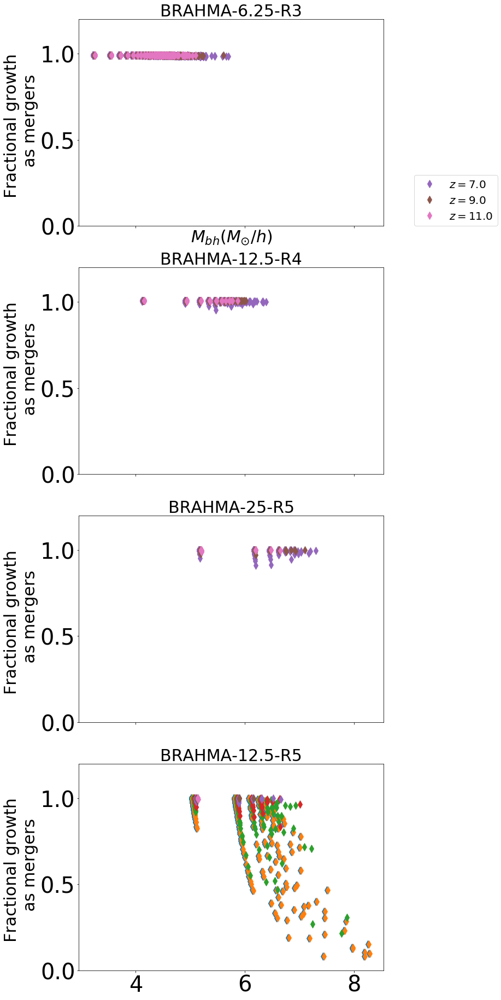

In [35]:
def make_plot(basePath, desired_redshift,col,mstyle,lstyle,obj,make_scatter=1,add_unresolved=0,unresolved_fac=4):
    if ('mirror' in basePath):
        suffix='$-1.6\sigma$'
    elif ('normal' in basePath):
        suffix='$0\sigma$'
    elif ('3sigma' in basePath):
        suffix='$3\sigma$'
    else:
        suffix='$1.6\sigma$'
    #GroupMassType,output_redshift=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
    BH_Mass,output_redshift=arepo_package.get_particle_property(basePath,'BH_Mass',5,desired_redshift)
    BH_Mass*=1e10
    #N_mergers=numpy.load(basePath+'/no_of_BH_mergers_%.2f.npy'%desired_redshift)
    
    BH_Progs,o=arepo_package.get_particle_property(basePath,'BH_Progs',5,desired_redshift)
    
    #print(BH_Progs*10**actual_logseedmass)
    BH_Mass_mergers=(BH_Progs)*10**actual_logseedmass 
    
    if(add_unresolved):
        BH_Mass_mergers+=(BH_Progs-1)*unresolved_fac*10**actual_logseedmass 
    #print(BH_Mass)
    
    Fractional_growth=BH_Mass_mergers/(BH_Mass)
    
    #print(BH_Mass,BH_Progs)
    
    

    if (make_scatter==1):
        obj.errorbar(numpy.log10(BH_Mass)+offset,Fractional_growth,ms=10,linewidth=0,color=col,marker=mstyle,label='$z=%.1f$'%(desired_redshift),alpha=1)
        #obj.errorbar(numpy.log10(BH_Mass),N_mergers_alternate,ms=10,linewidth=0,color='red',marker=mstyle,label='levelmax=%d,%s'%(levelmax,suffix));
    obj.set_ylim(0,1.2)
#    obj.errorbar(median_log_halo_mass,median_log_bh_mass,yerr=IQR,ms=10,linewidth=2,color=col,linestyle=lstyle);
    obj.set_ylabel('Fractional growth \n as mergers',fontsize=30)
    obj.tick_params(labelsize=40)
    


Mh,Msfmp=3000,5

f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)
ax=axx[3]

levelmax,logseedmass=12,3.19
offset=0

actual_logseedmass=5.00


ax.set_title('BRAHMA-12.5-R5',fontsize=30)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
offset=0
for desired_redshift,col in list(zip([0,1,3,5,7,9,11],['C0','C1','C2','C3','C4','C5','C6']))[:]:
    offset+=0.02
    #desired_redshift=6
    make_plot(basePath, desired_redshift,col,'d','solid',ax,add_unresolved=1)
    
ax=axx[2]    
ax.set_title('BRAHMA-25-R5',fontsize=30)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
offset
for desired_redshift,col in list(zip([7,9,11],['C4','C5','C6']))[:]:
    offset+=0.02
    #desired_redshift=6
    make_plot(basePath, desired_redshift,col,'d','solid',ax,add_unresolved=1,unresolved_fac=8)
    
Mh,Msfmp=3000,5    
actual_logseedmass=4.10    


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
offset=0
ax=axx[1]
ax.set_title('BRAHMA-12.5-R4',fontsize=30)


for desired_redshift,col in list(zip([7,9,11],['C4','C5','C6']))[:]:
    offset+=0.02
    #desired_redshift=6
    make_plot(basePath, desired_redshift,col,'d','solid',ax,add_unresolved=1)
    
    
    
Mh,Msfmp=3000,5    
actual_logseedmass=3.19    


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp) 
basePath=path_to_output+run+output
offset=0
ax=axx[0]
ax.set_title('BRAHMA-6.25-R3',fontsize=30)


for desired_redshift,col in list(zip([7,9,11],['C4','C5','C6']))[:]:
    offset+=0.02
    #desired_redshift=6
    make_plot(basePath, desired_redshift,col,'d','solid',ax)
    



ax.legend(loc=(1.1,0),fontsize=20)
ax.set_xlabel('$M_{bh}(M_{\odot}/h)$',fontsize=30)

#    median_log_halo_mass,median_log_bh_mass,IQR=arepo_package.get_median_with_IQR(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),False,False,10,25)



In [69]:
colors[1]

10.1010101010101

Desired redshift:  0
Output redshift:  2.220446049250313e-16
Output snapshot:  32
Desired redshift:  0
Output redshift:  2.220446049250313e-16
Output snapshot:  32
0.16666666666666666
Desired redshift:  1
Output redshift:  0.9972942257819404
Output snapshot:  25
Desired redshift:  1
Output redshift:  0.9972942257819404
Output snapshot:  25
0.16666666666666666
Desired redshift:  3
Output redshift:  3.008131071630377
Output snapshot:  22
Desired redshift:  3
Output redshift:  3.008131071630377
Output snapshot:  22
0.16666666666666666
Desired redshift:  5
Output redshift:  4.995933468164624
Output snapshot:  20
Desired redshift:  5
Output redshift:  4.995933468164624
Output snapshot:  20
0.16666666666666666
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
0.16666666666666666
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redsh

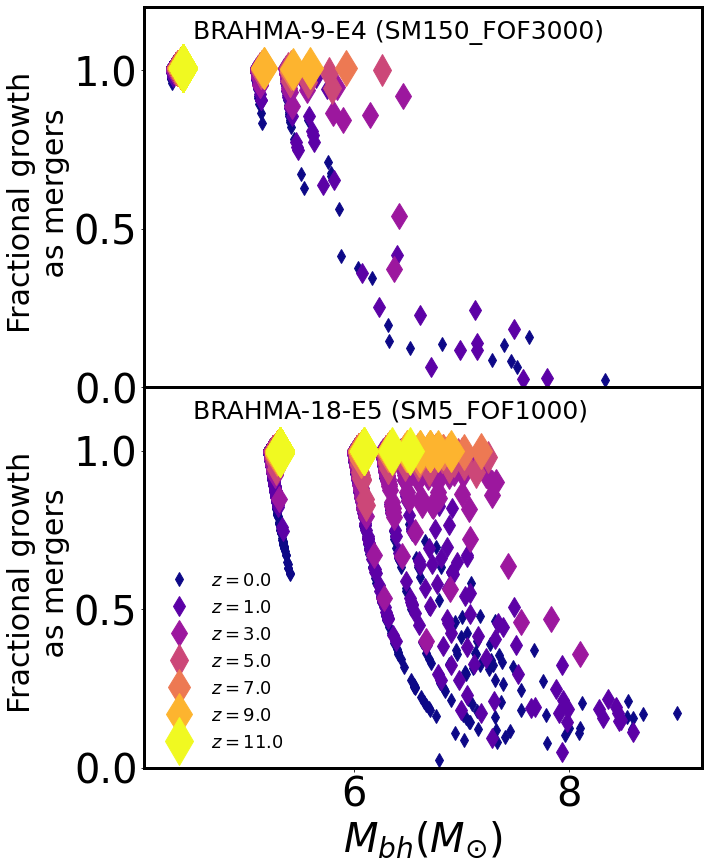

In [7]:
def make_plot(basePath, desired_redshift,col,mstyle,lstyle,obj,make_scatter=1,add_unresolved=0,unresolved_fac=4,LABL=1):
    if ('mirror' in basePath):
        suffix='$-1.6\sigma$'
    elif ('normal' in basePath):
        suffix='$0\sigma$'
    elif ('3sigma' in basePath):
        suffix='$3\sigma$'
    else:
        suffix='$1.6\sigma$'
    #GroupMassType,output_redshift=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
    BH_Mass,output_redshift=arepo_package.get_particle_property(basePath,'BH_Mass',5,desired_redshift)
    BH_Mass*=1e10
    #N_mergers=numpy.load(basePath+'/no_of_BH_mergers_%.2f.npy'%desired_redshift)
    
    BH_Progs,o=arepo_package.get_particle_property(basePath,'BH_Progs',5,desired_redshift)
    
    #print(BH_Progs*10**actual_logseedmass)
    BH_Mass_mergers=(BH_Progs)*10**actual_logseedmass 
    
    if(add_unresolved):
        BH_Mass_mergers+=(BH_Progs-1)*unresolved_fac*10**actual_logseedmass 
    #print(BH_Mass)
    
    Fractional_growth=BH_Mass_mergers/(BH_Mass)
    
    #print(BH_Mass,BH_Progs)
    if(LABL):
        labl='$z=%.1f$'%(desired_redshift)
    else:
        labl=''
    #colors = np.linspace(0, 1, #)
    if (make_scatter==1):
        print(colors[1])
        obj.errorbar(numpy.log10(BH_Mass)-log10(h)+offset,Fractional_growth,ms=10+float(i)*4,linewidth=0,color=cm.plasma(colors[i]),marker=mstyle,label=labl,alpha=1)
        #obj.errorbar(numpy.log10(BH_Mass),N_mergers_alternate,ms=10,linewidth=0,color='red',marker=mstyle,label='levelmax=%d,%s'%(levelmax,suffix));
    obj.set_ylim(0,1.2)
#    obj.errorbar(median_log_halo_mass,median_log_bh_mass,yerr=IQR,ms=10,linewidth=2,color=col,linestyle=lstyle);
    obj.set_ylabel('Fractional growth \n as mergers',fontsize=30)
    obj.tick_params(labelsize=40)
    


Mh,Msfmp=1000,5

f,axx=plt.subplots(2,1,figsize=(10,14),sharey=True,sharex=True)
ax=axx

levelmax,logseedmass=12,3.19
offset=0

actual_logseedmass=5.00


#ax.set_title('BRAHMA-12.5-R5',fontsize=30)
colors=numpy.linspace(0,1,7)
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
offset=0
i=0
for desired_redshift,col in list(zip([0,1,3,5,7,9,11],['C0','C1','C2','C3','C4','C5','C6','C7']))[:]:
    offset+=0.02
    #desired_redshift=6
    make_plot(basePath, desired_redshift,col,'d','solid',ax[1],add_unresolved=1)
    i+=1
    
Mh,Msfmp=3000,150
    
actual_logseedmass=4.10   
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
offset=0
i=0
for desired_redshift,col in list(zip([0.5,1,3,5,7,9,11],['C0','C1','C2','C3','C4','C5','C6','C7']))[:]:
    offset+=0.02
    #desired_redshift=6
    make_plot(basePath, desired_redshift,col,'d','solid',ax[0],add_unresolved=1,LABL=0)
    i+=1

ax[1].legend(loc='lower left',fontsize=18,frameon=False)
#ax[0].set_xlabel('$M_{bh}(M_{\odot}/h)$',fontsize=30)
ax[1].set_xlabel('$M_{bh}(M_{\odot})$',fontsize=40)
ax[1].text(4.5,1.1,'BRAHMA-18-E5 (SM5_FOF1000)',fontsize=25)
ax[0].text(4.5,1.1,'BRAHMA-9-E4 (SM150_FOF3000)',fontsize=25)


for axx in ax.flatten():
    axx.spines['top'].set_linewidth(3)    # Top axis
    axx.spines['bottom'].set_linewidth(3) # Bottom axis
    axx.spines['left'].set_linewidth(3)   # Left axis
    axx.spines['right'].set_linewidth(3) 


plt.subplots_adjust(hspace=0)
plt.savefig('./Paper6_figures/mergers_vs_accretion.png',bbox_inches='tight')

#    median_log_halo_mass,median_log_bh_mass,IQR=arepo_package.get_median_with_IQR(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),False,False,10,25)



Desired redshift:  0
Output redshift:  2.220446049250313e-16
Output snapshot:  32
Desired redshift:  0
Output redshift:  2.220446049250313e-16
Output snapshot:  32
0.16666666666666666
Desired redshift:  1
Output redshift:  0.9972942257819404
Output snapshot:  25
Desired redshift:  1
Output redshift:  0.9972942257819404
Output snapshot:  25
0.16666666666666666
Desired redshift:  3
Output redshift:  3.008131071630377
Output snapshot:  22
Desired redshift:  3
Output redshift:  3.008131071630377
Output snapshot:  22
0.16666666666666666
Desired redshift:  5
Output redshift:  4.995933468164624
Output snapshot:  20
Desired redshift:  5
Output redshift:  4.995933468164624
Output snapshot:  20
0.16666666666666666
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
0.16666666666666666
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redsh

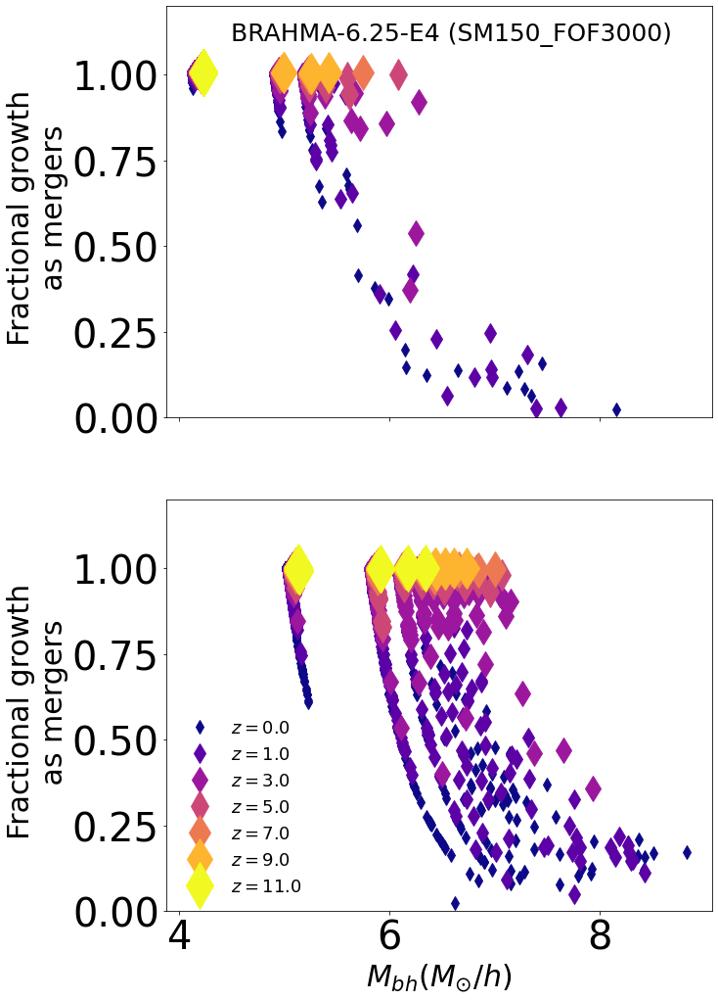

In [98]:
def make_plot(basePath, desired_redshift,col,mstyle,lstyle,obj,make_scatter=1,add_unresolved=0,unresolved_fac=4,LABL=1):
    if ('mirror' in basePath):
        suffix='$-1.6\sigma$'
    elif ('normal' in basePath):
        suffix='$0\sigma$'
    elif ('3sigma' in basePath):
        suffix='$3\sigma$'
    else:
        suffix='$1.6\sigma$'
    #GroupMassType,output_redshift=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
    BH_Mass,output_redshift=arepo_package.get_particle_property(basePath,'BH_Mass',5,desired_redshift)
    BH_Mass*=1e10
    #N_mergers=numpy.load(basePath+'/no_of_BH_mergers_%.2f.npy'%desired_redshift)
    
    BH_Progs,o=arepo_package.get_particle_property(basePath,'BH_Progs',5,desired_redshift)
    
    #print(BH_Progs*10**actual_logseedmass)
    BH_Mass_mergers=(BH_Progs)*10**actual_logseedmass 
    
    if(add_unresolved):
        BH_Mass_mergers+=(BH_Progs-1)*unresolved_fac*10**actual_logseedmass 
    #print(BH_Mass)
    
    Fractional_growth=BH_Mass_mergers/(BH_Mass)
    
    #print(BH_Mass,BH_Progs)
    if(LABL):
        labl='$z=%.1f$'%(desired_redshift)
    else:
        labl=''
    #colors = np.linspace(0, 1, #)
    if (make_scatter==1):
        print(colors[1])
        obj.errorbar(numpy.log10(BH_Mass)+offset,Fractional_growth,ms=10+float(i)*4,linewidth=0,color=cm.plasma(colors[i]),marker=mstyle,label=labl,alpha=1)
        #obj.errorbar(numpy.log10(BH_Mass),N_mergers_alternate,ms=10,linewidth=0,color='red',marker=mstyle,label='levelmax=%d,%s'%(levelmax,suffix));
    obj.set_ylim(0,1.2)
#    obj.errorbar(median_log_halo_mass,median_log_bh_mass,yerr=IQR,ms=10,linewidth=2,color=col,linestyle=lstyle);
    obj.set_ylabel('Fractional growth \n as mergers',fontsize=30)
    obj.tick_params(labelsize=40)
    


Mh,Msfmp=1000,5

f,axx=plt.subplots(2,1,figsize=(10,17),sharey=True,sharex=True)
ax=axx

levelmax,logseedmass=12,3.19
offset=0

actual_logseedmass=5.00


#ax.set_title('BRAHMA-12.5-R5',fontsize=30)
colors=numpy.linspace(0,1,7)
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
offset=0
i=0
for desired_redshift,col in list(zip([0,1,3,5,7,9,11],['C0','C1','C2','C3','C4','C5','C6','C7']))[:]:
    offset+=0.02
    #desired_redshift=6
    make_plot(basePath, desired_redshift,col,'d','solid',ax[1],add_unresolved=1)
    i+=1
    
Mh,Msfmp=3000,150
    
actual_logseedmass=4.10   
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
offset=0
i=0
for desired_redshift,col in list(zip([0.5,1,3,5,7,9,11],['C0','C1','C2','C3','C4','C5','C6','C7']))[:]:
    offset+=0.02
    #desired_redshift=6
    make_plot(basePath, desired_redshift,col,'d','solid',ax[0],add_unresolved=1,LABL=0)
    i+=1

ax[1].legend(loc='lower left',fontsize=18,frameon=False)
#ax[0].set_xlabel('$M_{bh}(M_{\odot}/h)$',fontsize=30)
ax[1].set_xlabel('$M_{bh}(M_{\odot}/h)$',fontsize=30)
#ax[1].text(6,1.1,'BRAHMA-12.5-E5',fontsize=25)
ax[0].text(4.5,1.1,'BRAHMA-6.25-E4 (SM150_FOF3000)',fontsize=25)

plt.subplots_adjust(hspace=0.2)
#plt.savefig('./Paper6_figures/mergers_vs_accretion.png',bbox_inches='tight')

#    median_log_halo_mass,median_log_bh_mass,IQR=arepo_package.get_median_with_IQR(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),False,False,10,25)



Desired redshift:  0
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  1
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  2
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  3
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  4
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  5
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  6
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  12
Output redshift:  11.980213315300293
Out

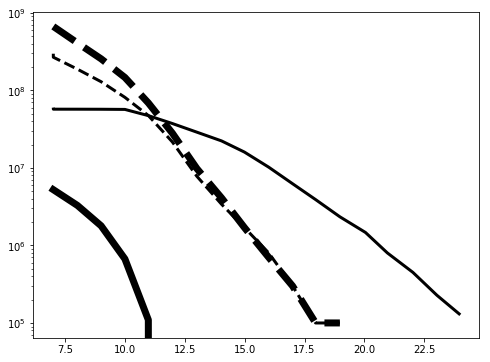

In [12]:


box_label='L12p5n512'




def make_plot(seed_mass,redo=0):
    box_size=arepo_package.get_box_size(basePath)
    scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,kk=arepo_package.get_seeding_events4(basePath,GET_ENVIRONMENT=1)
    redshift_complete=1./scale_fac_complete-1
    
    if (os.path.exists(basePath+'./total_mass_BHs.npy') & (redo==0)):
        redshift_space,total_mass,total_mass_seeds=numpy.load(basePath+'./total_mass_BHs.npy')
        return redshift_space,total_mass,total_mass_seeds
    else:
        redshift_space=[]
        total_mass=[]
        total_mass_seeds=[]
        for redshift in range(0,25):
            try:
                BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
                total_mass.append(sum(BH_Mass[BH_Mass>1e-5])*1e10)
                total_mass_seeds.append(len(redshift_complete[redshift_complete>=redshift])*seed_mass)
                redshift_space.append(o)
            except:
                aaa=1
        total_mass=numpy.array(total_mass)
        total_mass_seeds=numpy.array(total_mass_seeds)
        redshift_space=numpy.array(redshift_space)
        numpy.save(basePath+'./total_mass_BHs.npy',[redshift_space,total_mass,total_mass_seeds])
        return redshift_space,total_mass,total_mass_seeds


    
    
    
    

 
f,ax=plt.subplots(1,1,figsize=(8,6))
Msfmp,Mh=5,3000

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp) 
basePath=path_to_output+run+output
redshift_space,total_mass,total_mass_seeds=make_plot(1.56e3,redo=1)
ax.errorbar(redshift_space,total_mass,color='black',linewidth=7)
ax.errorbar(redshift_space,total_mass_seeds,color='black',linewidth=3)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
redshift_space,total_mass,total_mass_seeds=make_plot(1e5,redo=1)
ax.errorbar(redshift_space,total_mass,color='black',linewidth=7,linestyle='dashed')
ax.errorbar(redshift_space,total_mass_seeds,color='black',linewidth=3,linestyle='dashed')
ax.set_yscale('log')
        
        
        



In [9]:

def extract_distribution(basePath,d_type=1):
    boxsize=arepo_package.get_box_size(basePath)/1e3
    if(d_type==1):
        data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_min.npy'%LogTargetGroupBHMass)
        unique_LogGroupMass_min_redshift_space=data[0]
        unique_LogGroupStellarMass_min_redshift_space=data[1]
        unique_LogGroupSFR_min_redshift_space=data[2]
        unique_LogGroupSF_min_redshift_space=data[3]
        unique_LogGroupSFMP_min_redshift_space=data[4]
        unique_LogGroupStellarMetallicity_min_redshift_space=data[5]
        unique_LogGroupGasMetallicity_min_redshift_space=data[6]
        unique_min_redshift_space=data[7]

        data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_max.npy'%LogTargetGroupBHMass)
        unique_LogGroupMass_max_redshift_space=data[0]
        unique_LogGroupStellarMass_max_redshift_space=data[1]
        unique_LogGroupSFR_max_redshift_space=data[2]
        unique_LogGroupSF_max_redshift_space=data[3]
        unique_LogGroupSFMP_max_redshift_space=data[4]
        unique_LogGroupStellarMetallicity_max_redshift_space=data[5]
        unique_LogGroupGasMetallicity_max_redshift_space=data[6]
        unique_max_redshift_space=data[7]

        data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_target.npy'%LogTargetGroupBHMass)
        unique_LogGroupMass_target_redshift_space=data[0]
        unique_LogGroupStellarMass_target_redshift_space=data[1]
        unique_LogGroupSFR_target_redshift_space=data[2]
        unique_LogGroupSF_target_redshift_space=data[3]
        unique_LogGroupSFMP_target_redshift_space=data[4]
        unique_LogGroupStellarMetallicity_target_redshift_space=data[5]
        unique_LogGroupGasMetallicity_target_redshift_space=data[6]
        unique_target_redshift_space=data[7]

        unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)

        mask=(unique_target_redshift_space>redshift_cut) & (unique_target_redshift_space<redshift_max)
        a,b,c=get_distribution(unique_target_redshift_space,Nbins,minimum,maximum,linear=1) 
        norm=scipy.integrate.trapz(b,a) 
        norm=boxsize**3
        return a,b,c



    
    if(d_type==0):
        scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,kk=arepo_package.get_seeding_events4(basePath,GET_ENVIRONMENT=1)
        print(len(BH_id_complete),len(numpy.unique(BH_id_complete)))
        redshift_complete=1./scale_fac_complete-1.
        mask=(redshift_complete>redshift_cut)
        x,y=np.unique(BH_id_complete, return_index=True)
        
        print(len(redshift_complete[y]))
        
        
        a,b,c=get_distribution(redshift_complete[y],Nbins,minimum,maximum,linear=1)
        norm=scipy.integrate.trapz(b,a)
        norm=boxsize**3
        return a,b,c

        



50409 50022
50022
36675 36463
36463
16744 16744
16744
6865 6865
6865
6537 6434
6434
1091 1083
1083
1779 1767
1767
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
{'NumPart_ThisFile': array([66118795, 66950540,        0,        0,    46504,       74],
      dtype=int32), 'NumPart_Total': array([1061153045, 1073741824,          0,          0,     530931,
             1153], dtype=uint32), 'NumPart_Total_HighWord': array([0, 0, 0, 0, 0, 0], dtype=uint32), 'MassTable': array([0.00000000e+00, 1.31400861e-05, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00]), 'Time': 0.12491541593783131, 'Redshift': 7.005417045544533, 'BoxSize': 12500.0, 'NumFilesPerSnapshot': 16, 'Omega0': 0.3089, 'OmegaLambda': 0.6911, 'OmegaBaryon': 0.0486, 'HubbleParam': 0.6771, 'Flag_Sfr': 1, 'Flag_Cooling': 1, 'Flag_StellarAge': 0, 'Flag_Metals': 0, 'Flag_Feedback': 1, 'Flag_DoublePrecision': 0, 'Composition_vector_length': 0, 'Git_commit': b'2b799e5345ab5a3de4b1bcbe6

No handles with labels found to put in legend.


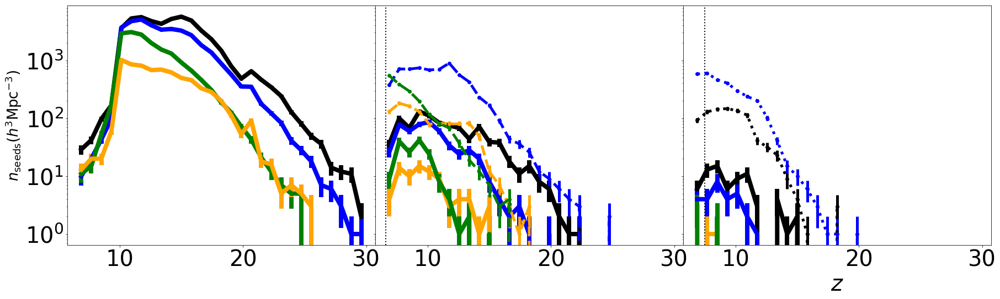

In [8]:
f,axxx=plt.subplots(1,3,figsize=(30,8),sharey=True)
Nbins,minimum,maximum=30,6.5,30

axx=axxx[0]
redshift_cut=7

redshift_max=40

LogTargetGroupBHMass=4.10
levelmax_gas,logseedmass_gas=12,3.19
levelmax,logseedmass=12,3.19


Msfmp,Mh=5,1000

col='black'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=0)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=8,color=col)

Msfmp,Mh=5,3000

col='blue'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=0)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=8,color=col)


Msfmp,Mh=5,10000
col='green'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=0)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=8,color=col)


Msfmp,Mh=150,3000
col='orange'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=0)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=8,color=col)






box_label='L12p5n1024'



axx=axxx[1]
redshift_cut=7

redshift_max=25

LogTargetGroupBHMass=4.10
levelmax_gas,logseedmass_gas=12,3.19
levelmax,logseedmass=12,3.19


Msfmp,Mh=5,1000

col='black'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=8,color=col)

Msfmp,Mh=5,3000

col='blue'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=8,color=col)


box_label='L12p5n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

a,b,c=extract_distribution(basePath,d_type=0)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=5,color=col,linestyle='dashed')


Msfmp,Mh=150,3000
col='orange'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=8,color=col)


box_label='L12p5n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

a,b,c=extract_distribution(basePath,d_type=0)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=5,color=col,linestyle='dashed')


Msfmp,Mh=5,10000
col='green'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=8,color=col)


box_label='L12p5n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

a,b,c=extract_distribution(basePath,d_type=0)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=5,color=col,linestyle='dashed')

massdm=arepo_package.load_snapshot_header(basePath,7)['MassTable'][1]

axx.axvline(numpy.log10(massdm*1e10*32),color='black',linewidth=2,linestyle='dotted')


axx.set_yscale('log')

axx.tick_params(labelsize=label_fontsize)


axx=axxx[2]
redshift_cut=7

LogTargetGroupBHMass=5.00
levelmax_gas,logseedmass_gas=12,3.19
levelmax,logseedmass=12,3.19


Msfmp,Mh=5,1000

col='black'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=8,color=col)


box_label='L12p5n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

a,b,c=extract_distribution(basePath,d_type=0)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=5,color=col,linestyle='dotted')


Msfmp,Mh=5,3000

col='blue'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=8,color=col)


box_label='L12p5n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

a,b,c=extract_distribution(basePath,d_type=0)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=5,color=col,linestyle='dotted')

massdm=arepo_package.load_snapshot_header(basePath,7)['MassTable'][1]

axx.axvline(numpy.log10(massdm*1e10*32),color='black',linewidth=2,linestyle='dotted')




Msfmp,Mh=150,3000
col='orange'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=8,color=col)




Msfmp,Mh=5,10000
col='green'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output  
             

a,b,c=extract_distribution(basePath,d_type=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b,c,marker='o',linewidth=8,color=col)






axx.set_yscale('log')

axx.tick_params(labelsize=label_fontsize)
axxx[0].tick_params(labelsize=label_fontsize)



axx.set_xlabel('$z$',fontsize=label_fontsize)

axxx[0].set_ylabel('$n_{\mathrm{seeds}}(h^3\mathrm{Mpc}^{-3})$',fontsize=label_fontsize-14)
#axxx[1].set_ylabel('$n_{\mathrm{seeds}}(h^3\mathrm{Mpc}^{-3})$',fontsize=label_fontsize-14)


#axxx[0].set_title('Redshift \n at assembly',fontsize=label_fontsize-5)


axx.legend(loc='upper left',fontsize=label_fontsize-11,frameon=False)

#axx[1].legend(loc='upper right',fontsize=label_fontsize-20)

plt.subplots_adjust(wspace=0,hspace=0)


#axx[1].set_yscale('log')



5.388974085791079e+44


(9, 9, 9)

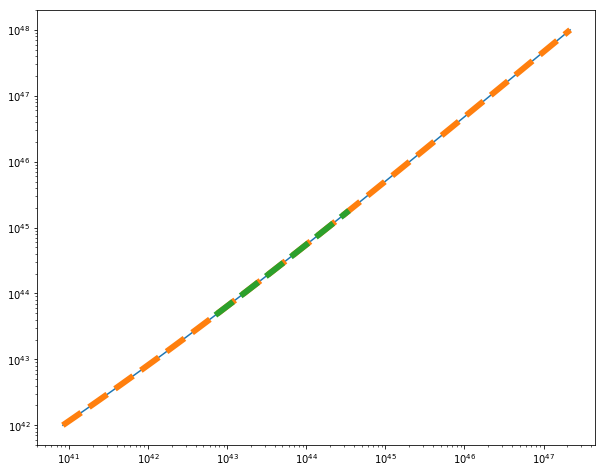

In [34]:
Lsun=3.846e33

def bolometric_correction(Lbol):
    c1,k1,c2,k2=1.862, -0.361, 4.870, -0.0063

    Lbolsun=Lbol/Lsun
    ratio = c1*(Lbolsun/1e10)**k1 + c2*(Lbolsun/1e10)**k2
    Lband=Lbol/ratio
    return Lband

def magnitude_to_luminosity(mag):
    return Lsun*10**(-mag/2.512)
    
    
print(magnitude_to_luminosity(-28))

Lbol_space=numpy.logspace(42,48,50)

Lband_space=bolometric_correction(Lbol_space)

f,ax=plt.subplots(1,1,figsize=(10,8))
ax.plot(Lband_space,Lbol_space)
ax.set_xscale('log')
ax.set_yscale('log')

gen_Lbol=scipy.interpolate.interp1d(numpy.log10(Lband_space),numpy.log10(Lbol_space))

Lbol_space_gen=10**gen_Lbol(numpy.log10(Lband_space))

ax.plot(Lband_space,Lbol_space,linewidth=6,linestyle='dashed')
                            
                            
data_mid=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/Matsuoka_22_UV_mid.txt')  

data_low=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/Matsuoka_22_UV_low.txt')  

data_high=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/Matsuoka_22_UV_high.txt')  


obs_x=data_mid[:,0]

obs_y_mid=data_mid[:,1]
obs_y_low=data_low[:,1]
obs_y_high=data_high[:,1]

obs_lum_band=magnitude_to_luminosity(obs_x)

obs_lum_bol=10**gen_Lbol(numpy.log10(obs_lum_band))

ax.plot(obs_lum_band,obs_lum_bol,linewidth=6,linestyle='dashed')





len(data_high),len(data_low),len(data_mid)

0.19728418237600986
2.220446049250313e-16
2.220446049250313e-16


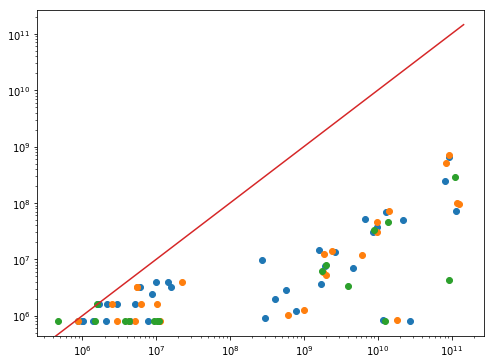

In [19]:
f,ax=plt.subplots(1,1,figsize=(8,6))
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax9_haloindex100_redshift0.00_logbhseedmass5.90_NSC///' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs

output='/output_debug6_test_painted0p5/'
basePath=path_to_output+run+output
desired_redshift=0
GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
GroupSM=GroupMassType[:,4]
GroupBHMass,o=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift)
print(o)
ax.errorbar(GroupSM*1e10,GroupBHMass*1e10,marker='o',linewidth=0)

output='/output_debug6_test_painted0p5_ratio1000/'
basePath=path_to_output+run+output
desired_redshift=0
GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
GroupSM=GroupMassType[:,4]
GroupBHMass,o=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift)
print(o)
#f,ax=plt.subplots(1,1,figsize=(8,6))
ax.errorbar(GroupSM*1e10,GroupBHMass*1e10,marker='o',linewidth=0)


output='/output_debug6_test_painted0p5_ratio3000/'
basePath=path_to_output+run+output 
desired_redshift=0
GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
GroupSM=GroupMassType[:,4]
GroupBHMass,o=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift)
print(o)
#f,ax=plt.subplots(1,1,figsize=(8,6))
ax.errorbar(GroupSM*1e10,GroupBHMass*1e10,marker='o',linewidth=0)

ax.errorbar(ax.get_xlim(),ax.get_xlim())


ax.set_yscale('log')
ax.set_xscale('log')

0.19728418237600986
0.19728418237600986
0.19728418237600986


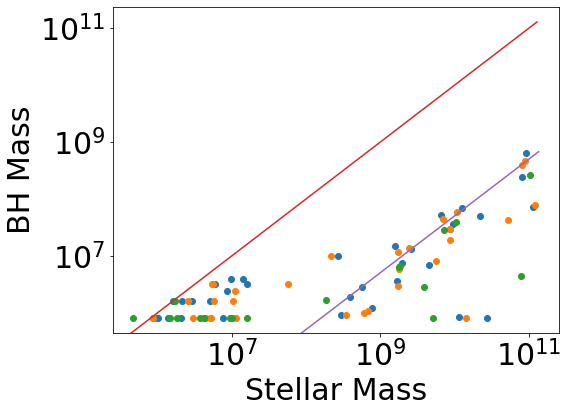

In [5]:
f,ax=plt.subplots(1,1,figsize=(8,6))
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax9_haloindex100_redshift0.00_logbhseedmass5.90_NSC///' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs

output='/output_debug6_test_painted0p5/'
basePath=path_to_output+run+output
desired_redshift=0.2
GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
GroupSM=GroupMassType[:,4]
GroupBHMass,o=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift)
print(o)
ax.errorbar(GroupSM*1e10,GroupBHMass*1e10,marker='o',linewidth=0)

output='/output_debug6_test_painted0p5_ratio1000/'
basePath=path_to_output+run+output

GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
GroupSM=GroupMassType[:,4]
GroupBHMass,o=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift)
print(o)
#f,ax=plt.subplots(1,1,figsize=(8,6))
ax.errorbar(GroupSM*1e10,GroupBHMass*1e10,marker='o',linewidth=0)


output='/output_debug6_test_painted0p5_ratio3000/'
basePath=path_to_output+run+output 

GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
GroupSM=GroupMassType[:,4]
GroupBHMass,o=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift)
print(o)
#f,ax=plt.subplots(1,1,figsize=(8,6))
ax.errorbar(GroupSM*1e10,GroupBHMass*1e10,marker='o',linewidth=0)


ax.errorbar(ax.get_xlim(),numpy.array(ax.get_xlim()))

ax.errorbar(ax.get_xlim(),numpy.array(ax.get_xlim())*0.005)

ax.tick_params(labelsize=30)

ax.set_xlabel('Stellar Mass',fontsize=30)

ax.set_ylabel('BH Mass',fontsize=30)


ax.set_yscale('log')
ax.set_xscale('log')

In [6]:
DL(7)

47860.567607364996

In [110]:
def flux_limit(band='2-10keV'):
    if band=='2-10keV':
        return 1e-19
    
def convert_mdot_to_Lbol(mdot,mass,radiative_efficiency,case):
    total_conv=mdot_to_Lbol.get_conversion_factor_arepo(radiative_efficiency)
    if (case==0):
        return mdot*total_conv        
    if (case==1):
        Lbol_eddington=mass*1.26e38/hubble
        Mdot_eddington=Lbol_eddington/total_conv
        if (mdot>0.1*Mdot_eddington):
            return mdot*total_conv
        else:
            #print("!!")
            return (10*mdot/Mdot_eddington)**2*0.1*Lbol_eddington
    else:
        print("Invalid case, returning 0")
        return 0


def flux_to_lum(f,redshift):

    Mpctokm=3.0857E+19
    luminosity_distance=DL(redshift)/h*Mpctokm*1e5
    print("sdsds",DL(redshift))
    return 4*3.14*luminosity_distance**2*f

def get_bol_lum_limit(redshift,limit,band='2-10keV'):
    print("sdsd",redshift,limit)
    band_lum_limit=flux_to_lum(limit,redshift)
    print("sdsd",band_lum_limit)
    #bol_lum_limit=band_lum_limit*bolometric_corrections(band_lum_limit,band)
    bol_lum_limit=band_lum_limit*bolometric_corrections2(band_lum_limit)#,band)
    return bol_lum_limit

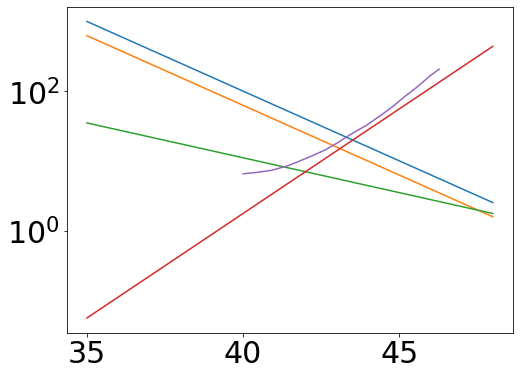

In [111]:
import scipy.interpolate
def bolometric_corrections(L,band):
    if (band=='5100A'):
        c,d=40,-0.2
    if (band=='3000A'):
        c,d=25,-0.2
    if (band=='1400A'):
        c,d=7,-0.1    
    if (band=='2-10keV'):
        c,d=7,0.3
    return c * (L/1e42)**d


log_bol_lum_space=numpy.linspace(35,48,30)

f,ax=plt.subplots(1,1,figsize=(8,6))
band='5100A'
ax.plot(log_bol_lum_space,bolometric_corrections(10**log_bol_lum_space,band))

band='3000A'
ax.plot(log_bol_lum_space,bolometric_corrections(10**log_bol_lum_space,band))

band='1400A'
ax.plot(log_bol_lum_space,bolometric_corrections(10**log_bol_lum_space,band))

band='2-10keV'
ax.plot(log_bol_lum_space,bolometric_corrections(10**log_bol_lum_space,band))


data=numpy.loadtxt('/home/aklantbhowmick/Aklant/data_from_papers/bol_correction_vasudevan.txt')
ax.plot(data[:,0],data[:,1])

ax.set_yscale('log')

ax.tick_params(labelsize=30)


def bolometric_corrections2(L):
    data=numpy.loadtxt('/home/aklantbhowmick/Aklant/data_from_papers/bol_correction_vasudevan.txt')
    gen=scipy.interpolate.interp1d(data[:,0],data[:,1],fill_value='extrapolate')
    return gen(numpy.log10(L))

In [112]:
def make_plot(j,ax,col='black',width=4,style='solid',labl1='',labl2='',redo=1):
    ii=0
    for desired_redshift in [7,9,11]:
        

        labll1,labll2='',''
     
        ax[j,0].set_ylim(3e-5,10)
        
        ax[0,ii].set_title('$z=%d$'%desired_redshift,fontsize=40)
        if(redo):
            BHMdot,o=arepo_package.get_particle_property(basePath,'BH_Mdot',5,desired_redshift)
            BHLum=BHMdot*total_conv
            
            BHMass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,desired_redshift)
            BHMass=BHMass*1e10

            log_HM_min, log_HM_max, Nbins=4,7,15

 
            numpy.save(basePath+'/LF_z%d.npy'%desired_redshift,[a,b,c,box_size])
        else:
            a,b,c,box_size=numpy.load(basePath+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)
        c[c>b]=0
        mask=b>0   
        if(ii==1):
            labl=labl1
        elif(ii==2):
            labl=labl2
        else:
            labl=''
            
        ax[j,ii].errorbar(a[mask],b[mask],c[mask],color=col,linewidth=width,linestyle=style,label=labl)
        ax[j,ii].tick_params(labelsize=40)
        ax[3,ii].set_xlabel('$L_{\mathrm{bol}}[\mathrm{ergs \ s^{-1}}]$',fontsize=40)
        ii+=1
        

Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14


KeyboardInterrupt: 

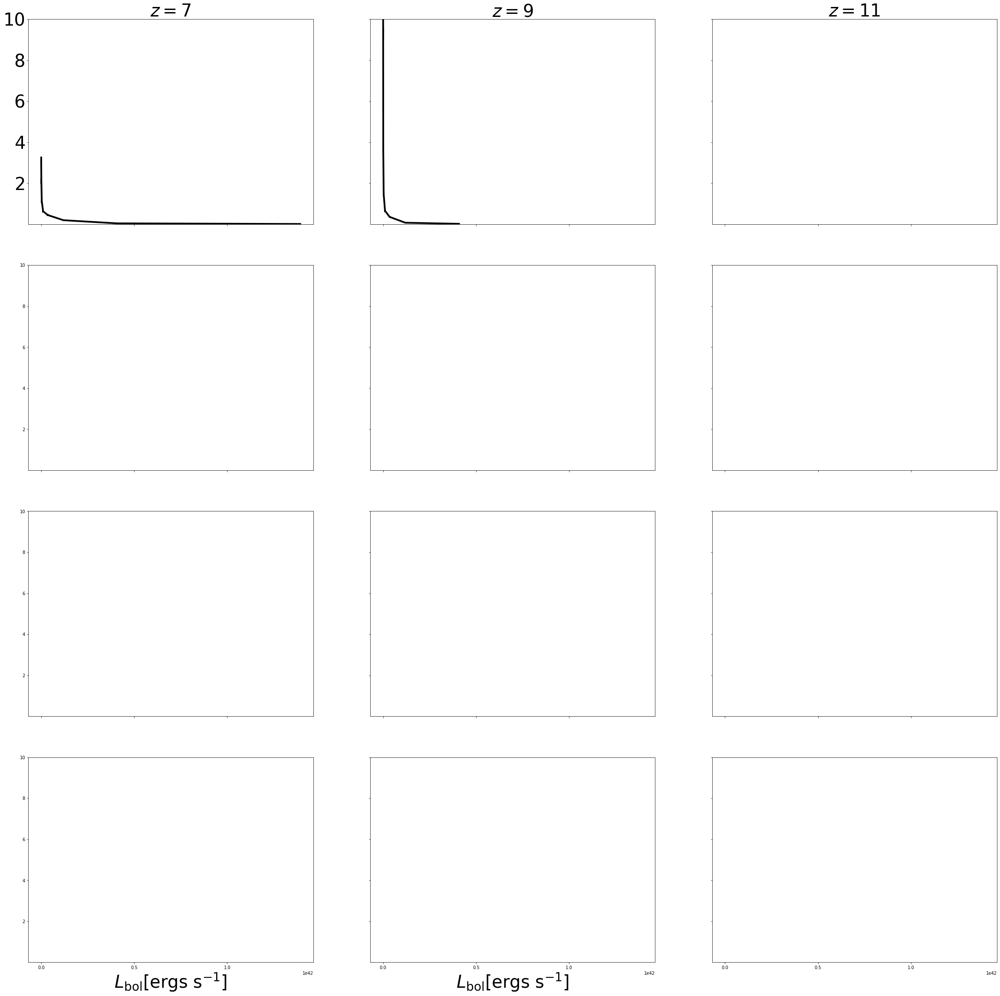

In [20]:
f,ax=plt.subplots(4,3,figsize=(40,40),sharey=True,sharex=True)



Gpc_to_Mpc=1000

def make_plot(j,ax,col='black',width=4,style='solid',labl1='',labl2='',redo=1):
    ii=0
    for desired_redshift in [7,9,11]:
        

        labll1,labll2='',''
     
        ax[j,0].set_ylim(3e-5,10)
        
        ax[0,ii].set_title('$z=%d$'%desired_redshift,fontsize=40)
        if(redo):
            BHMdot,o=arepo_package.get_particle_property(basePath,'BH_Mdot',5,desired_redshift)
            BHLum=BHMdot*total_conv
            box_size=arepo_package.get_box_size(basePath)/1e3

            log_HM_min, log_HM_max, Nbins=37,45,16

            a,b,c=arepo_package.luminosity_function(BHLum, box_size, log_HM_min, log_HM_max, Nbins)

 
            numpy.save(basePath+'/LF_z%d.npy'%desired_redshift,[a,b,c,box_size])
        else:
            a,b,c,box_size=numpy.load(basePath+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)
        c[c>b]=0
        mask=b>0   
        if(ii==1):
            labl=labl1
        elif(ii==2):
            labl=labl2
        else:
            labl=''
            
        ax[j,ii].errorbar(a[mask],b[mask],c[mask],color=col,linewidth=width,linestyle=style,label=labl)
        ax[j,ii].tick_params(labelsize=40)
        ax[3,ii].set_xlabel('$L_{\mathrm{bol}}[\mathrm{ergs \ s^{-1}}]$',fontsize=40)
        ii+=1
        

        
Mh,Msfmp=1000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output    
make_plot(0,ax,col='black',labl1='SM%d_FOF%d'%(Msfmp,Mh))
        
box_label='L25n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(0,ax,col='black',style='dotted',width=7)

        
Mh,Msfmp=3000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output    
make_plot(1,ax,col='blue',labl1='SM%d_FOF%d'%(Msfmp,Mh),labl2='BRAHMA_6.25')



box_label='L12p5n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot(1,ax,col='blue',style='dashed',labl2='BRAHMA_12.5')


box_label='L25n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot(1,ax,col='blue',style='dotted',labl2='BRAHMA_25',width=7)


Mh,Msfmp=3000,150
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output 
make_plot(2,ax,col='orange',style='solid',labl1='SM%d_FOF%d'%(Msfmp,Mh))


box_label='L12p5n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot(2,ax,col='orange',style='dashed')


Mh,Msfmp=10000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output    
make_plot(3,ax,col='green',labl1='SM%d_FOF%d'%(Msfmp,Mh))


box_label='L12p5n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot(3,ax,col='green',style='dashed')

'''
for jj in [0,1,2,3]:
    for desired_redshift in [6]: 
        data=numpy.loadtxt('../arepo_code_development/observational_data/Shen20_AGNLF_z%d_actualdata.txt'%desired_redshift)      
        ax[jj,0].errorbar(data[:,0],data[:,1]/0.7**3,color='black',marker='s',linewidth=0,ms=15)
        ax[jj,1].errorbar(data[:,0],data[:,1]/0.7**3,color='black',marker='s',linewidth=0,ms=15)
        ax[jj,2].errorbar(data[:,0],data[:,1]/0.7**3,color='black',marker='s',linewidth=0,ms=15)
        ax[jj,3].errorbar(data[:,0],data[:,1]/0.7**3,color='black',label='Shen20 ($z=6$)',marker='s',linewidth=0,ms=15)
'''

  
    #ax[0].errorbar(obs_lum_bol,obs_y_mid/Gpc_to_Mpc**3/0.7**3*2.512,color='black',marker='o',linewidth=0)
    #ax[1].errorbar(obs_lum_bol,obs_y_mid/Gpc_to_Mpc**3/0.7**3*2.512,color='black',marker='o',linewidth=0)
    #ax[2].errorbar(obs_lum_bol,obs_y_mid/Gpc_to_Mpc**3/0.7**3*2.512,color='black',marker='o',linewidth=0)
    #ax[3].errorbar(obs_lum_bol,obs_y_mid/Gpc_to_Mpc**3/0.7**3*2.512,color='black',label='Matsuoka+2023 (z=7)',marker='o',linewidth=0)

    


                #labl1,labl2='',''

        
Lsun=3.846e33


JWST_lim_z6=49784647411.71445*Lsun


for jj in [0,1,2,3]:
    for ii,desired_redshift in list(zip([0,1,2,3],[7,9,11])):
        labll1,labll2,labll3,labll4='','','',''
        if(ii==0):
            labll1,labll2,labll3,labll4='Lynx','Athena','Axis','JWST'

        limit=1e-19        
        ax[jj,ii].axvline(get_bol_lum_limit(desired_redshift,limit),color='black',linestyle='dashed',linewidth=3,label=labll1)

        limit=1.6e-16/2.4e-17*5e-19
        ax[jj,ii].axvline(get_bol_lum_limit(desired_redshift,limit),color='green',linestyle='dashed',linewidth=3,label=labll3)


        limit=1.6e-16
        ax[jj,ii].axvline(get_bol_lum_limit(desired_redshift,limit),color='blue',linestyle='dashed',linewidth=3,label=labll2)


        #ax[jj,ii].axvline(JWST_lim_z6*DL(desired_redshift)**2/DL(6)**2,color='red',linestyle='dashed',linewidth=3,label=labll4)



    ax[jj,0].set_ylabel('$n(\mathrm{Mpc}^{-3}h^{3}\mathrm{dex^{-1}})$',fontsize=40)


    ax[jj,1].legend(loc='upper right',fontsize=35)

    ax[jj,2].legend(loc='upper right',fontsize=30)

    ax[jj,0].legend(loc='upper right',fontsize=25)











    ax[jj,0].set_xscale('log')
    ax[jj,0].set_yscale('log')

plt.subplots_adjust(wspace=0.05,hspace=0)

plt.savefig('./Paper6_figures/LF_full.png',bbox_inches='tight')





In [113]:
radiative_efficiency

0.2

11 
sdsd 11 3.333333333333334e-18
sdsds 80184.74714464425
sdsd 5.590539060281286e+42
sdsd 11 1.6e-16
sdsds 80184.74714464425
sdsd 2.683458748935017e+44
9 1.6e-16
sdsd 9 3.333333333333334e-18
sdsds 63848.75154114455
sdsd 3.5446632089826217e+42
sdsd 9 1.6e-16
sdsds 63848.75154114455
sdsd 1.7014383403116582e+44
7 1.6e-16
sdsd 7 3.333333333333334e-18
sdsds 47860.567607364996
sdsd 1.991708825778304e+42
sdsd 7 1.6e-16
sdsds 47860.567607364996
sdsd 9.560202363735857e+43


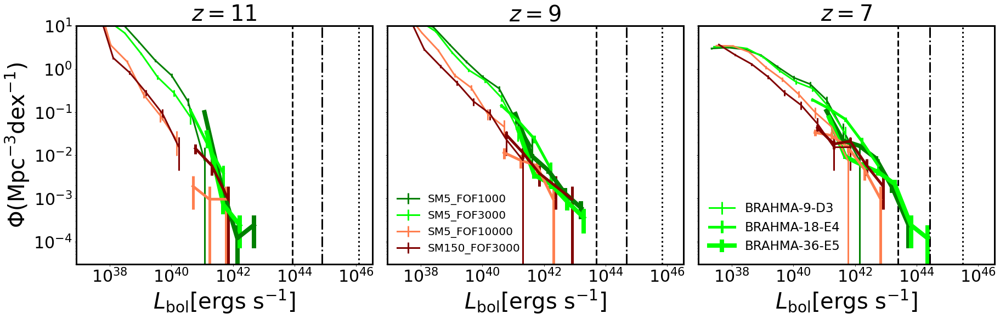

In [129]:

limit=''
f,ax=plt.subplots(1,3,figsize=(30,8),sharey=True,sharex=True)
Mh,Msfmp=1000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath1=path_to_output+run+output    

box_label='L25n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath3=path_to_output+run+output

Lsun=3.846e33
ll=''
ll2=''
ll3=''

JWST_lim_z6=49784647411.71445*Lsun
#f,ax=plt.subplots(1,3,figsize=(30,8),sharey=True,sharex=True)
i=0
offset=1
for desired_redshift in [11,9,7]:
    a1,b1,c1,box_size1=numpy.load(basePath1+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)

    a3,b3,c3,box_size3=numpy.load(basePath3+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)
    b3[a3<10**41]=0
    c3[a3<10**41]=0
    
    if (desired_redshift==9):
        ll='SM5_FOF1000'
        ll2=''
        ll3=''
    if (desired_redshift==7):
        ll=''
        ll2=''
        ll3=''
    ax[i].errorbar(a1[b1>0]*offset,b1[b1>0],c1[b1>0],color='green',linewidth=3,label=ll)

    ax[i].errorbar(a3[b3>0]*offset,b3[b3>0],c3[b3>0],color='green',linewidth=8,label=ll3)
    
    
    bf=numpy.amax([b1,b3],axis=0)
    cf=numpy.amin([c1,c3],axis=0)
    
    #ax[i].errorbar(a2[bf>0],bf[bf>0],color='black',linewidth=6,linestyle='solid')
    
    ax[i].set_ylim(3e-5,10)
    ax[i].tick_params(labelsize=30)
    ax[i].set_yscale('log')
    ax[i].set_xscale('log')
    i+=1
    


Mh,Msfmp=3000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath1=path_to_output+run+output    

box_label='L12p5n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath2=path_to_output+run+output

box_label='L25n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath3=path_to_output+run+output



i=0
offset*=1.2
for desired_redshift in [11,9,7]:
    a1,b1,c1,box_size1=numpy.load(basePath1+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)


    a2,b2,c2,box_size2=numpy.load(basePath2+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)
    b2[a2<10**40.5]=0
    c2[a2<10**40.5]=0

    a3,b3,c3,box_size3=numpy.load(basePath3+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)
    b3[a3<10**41]=0
    c3[a3<10**41]=0
    if (desired_redshift==9):
        ll='SM5_FOF3000'
        ll2=''
        ll3=''
    if (desired_redshift==7):
        ll='BRAHMA-9-D3'
        ll2='BRAHMA-18-E4'
        ll3='BRAHMA-36-E5'
    ax[i].errorbar(a1[b1>0]*offset,b1[b1>0],c1[b1>0],color='lime',linewidth=3,label=ll)
    ax[i].errorbar(a2[b2>0]*offset,b2[b2>0],c2[b2>0],color='lime',linewidth=5,label=ll2)

    ax[i].errorbar(a3[b3>0]*offset,b3[b3>0],c3[b3>0],color='lime',linewidth=8,label=ll3)
    
    #bf=numpy.amax([b1,b2,b3],axis=0)
    #cf=numpy.amin([c1,c2,c3],axis=0)
    
    #ax[i].errorbar(a2,bf,color='blue',linewidth=6,linestyle='solid')
    
    ax[i].set_ylim(3e-5,10)
    ax[i].tick_params(labelsize=30)
    ax[i].set_yscale('log')
    ax[i].set_xscale('log')
    i+=1
    
    

    
Mh,Msfmp=10000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath1=path_to_output+run+output    

box_label='L12p5n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath2=path_to_output+run+output



#f,ax=plt.subplots(1,3,figsize=(30,8),sharey=True,sharex=True)
i=0
offset*=1.2
for desired_redshift in [11,9,7]:
    a1,b1,c1,box_size1=numpy.load(basePath1+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)


    a2,b2,c2,box_size2=numpy.load(basePath2+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)
    b2[a2<10**40.5]=0
    c2[a2<10**40.5]=0


    if (desired_redshift==9):
        ll='SM5_FOF10000'
        ll2=''
        ll3=''
    if (desired_redshift==7):
        ll=''
        ll2=''
        ll3=''
    ax[i].errorbar(a1[b1>0]*offset,b1[b1>0],c1[b1>0],color='coral',linewidth=3,label=ll)
    ax[i].errorbar(a2[b2>0]*offset,b2[b2>0],c2[b2>0],color='coral',linewidth=5,label=ll2)

    
    #ax[i].errorbar(a3,b3,c3,color='blue',linewidth=6,linestyle='dotted')
    
    bf=numpy.amax([b1,b2],axis=0)
    cf=numpy.amax([c1,c2],axis=0)
    
    #ax[i].errorbar(a2,bf,color='green',linewidth=6,linestyle='solid')
    

    ax[i].tick_params(labelsize=30)
    ax[i].set_yscale('log')
    ax[i].set_xscale('log')
    i+=1
    
    
Mh,Msfmp=3000,150
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath1=path_to_output+run+output    

box_label='L12p5n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath2=path_to_output+run+output



#f,ax=plt.subplots(1,3,figsize=(30,8),sharey=True,sharex=True)
i=0
offset*=1.2
for desired_redshift in [11,9,7]:
    a1,b1,c1,box_size1=numpy.load(basePath1+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)


    a2,b2,c2,box_size2=numpy.load(basePath2+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)
    b2[a2<10**40.5]=0
    c2[a2<10**40.5]=0

    if (desired_redshift==9):
        ll='SM150_FOF3000'
        ll2=''
        ll3=''
    if (desired_redshift==7):
        ll=''
        ll2=''
        ll3=''
    ax[i].errorbar(a1[b1>0]*offset,b1[b1>0],c1[b1>0],color='maroon',linewidth=3,label=ll)
    ax[i].errorbar(a2[b2>0]*offset,b2[b2>0],c2[b2>0],color='maroon',linewidth=5,label=ll2)

    
   #ax[i].errorbar(a3,b3,c3,color='blue',linewidth=6,linestyle='dashed')
    
    #bf=numpy.amax([b1,b2],axis=0)
    #cf=numpy.amax([c1,c2],axis=0)
    
    #ax[i].errorbar(a2[bf>0],bf[bf>0],color='orange',linewidth=6,linestyle='solid')
    

    ax[i].tick_params(labelsize=30)
    ax[i].set_yscale('log')
    ax[i].set_xscale('log')
    i+=1
    
    
'''
for jj in [0,1,2]:
    for desired_redshift in [6]: 
        data=numpy.loadtxt('../arepo_code_development/observational_data/Shen20_AGNLF_z%d_actualdata.txt'%desired_redshift)      
        ax[jj].errorbar(data[:,0],data[:,1]/0.7**3,color='black',marker='s',linewidth=0,ms=15,label='Shen20 ($z=6$)')
        #ax[1].errorbar(data[:,0],data[:,1]/0.7**3,color='black',marker='s',linewidth=0,ms=15)
        #ax[2].errorbar(data[:,0],data[:,1]/0.7**3,color='black',marker='s',linewidth=0,ms=15)
        #ax[3].errorbar(data[:,0],data[:,1]/0.7**3,color='black',label='Shen20 ($z=6$)',marker='s',linewidth=0,ms=15)
'''
        
for ii,desired_redshift in list(zip([0,1,2,3],[11,9,7])):
        print(desired_redshift,limit)
        labll1,labll2,labll3,labll4='','','',''
        if(ii==0):
            labll1,labll2,labll3,labll4='Lynx','Athena','Axis','JWST'

        limit=1e-19        
        ax[ii].set_title('$z=%d$'%desired_redshift,fontsize=40)
        #ax[ii].axvline(get_bol_lum_limit(desired_redshift,limit),color='black',linestyle='solid',linewidth=3,label=labll1)

        limit=1.6e-16/2.4e-17*5e-19
        #limit=3.8e-14
        
        
        NewAthenaLimit=10**40.5 * DL(desired_redshift)**2/DL(1)**2
        bol_c=bolometric_corrections2(NewAthenaLimit)
        ax[ii].axvline(get_bol_lum_limit(desired_redshift,limit),color='black',linestyle='dashed',linewidth=3,label=labll3)
        #ax[ii].axvline(NewAthenaLimit*bol_c,color='black',linestyle='dashed',linewidth=3,label=labll3)


        limit=1.6e-16
        ax[ii].axvline(get_bol_lum_limit(desired_redshift,limit),color='black',linestyle='dotted',linewidth=3,label=labll2)


        ax[ii].axvline(JWST_lim_z6*DL(desired_redshift)**2/DL(6)**2,color='black',linestyle='dashdot',linewidth=3,label=labll4)

        ax[ii].set_xlabel('$L_{\mathrm{bol}}[\mathrm{ergs \ s^{-1}}]$',fontsize=40)

ax[0].set_ylabel('$\Phi(\mathrm{Mpc}^{-3} \mathrm{dex^{-1}})$',fontsize=40)
    
ax[0].set_ylim(3e-5,10)    
    
ax[1].legend(loc='lower left',fontsize=20,frameon=False) 
ax[2].legend(loc='lower left',fontsize=23,frameon=False) 
#ax[1].legend(loc='lower left',fontsize=20,frameon=False) 

plt.subplots_adjust(wspace=0.05,hspace=0)


for axx in ax.flatten():
    axx.spines['top'].set_linewidth(3)    # Top axis
    axx.spines['bottom'].set_linewidth(3) # Bottom axis
    axx.spines['left'].set_linewidth(3)   # Left axis
    axx.spines['right'].set_linewidth(3) 

plt.savefig('./Paper6_figures/LF.png',bbox_inches='tight')

    


In [30]:
desired_redshift

11

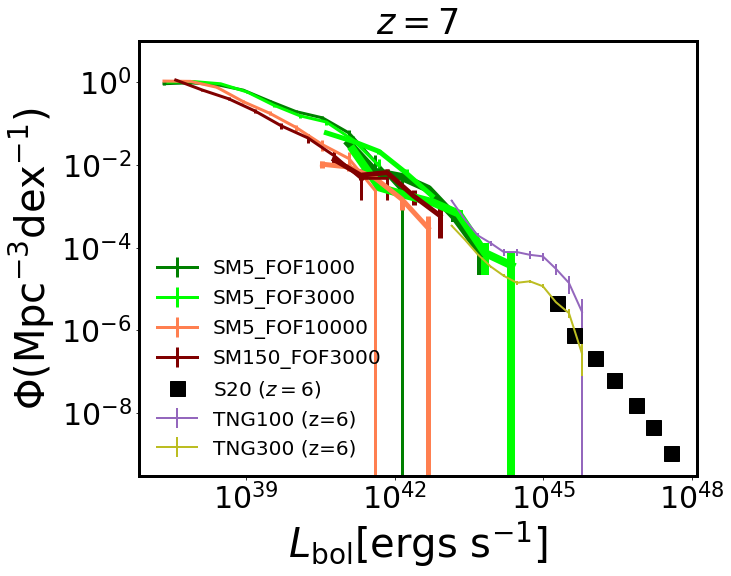

In [36]:
f,ax=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)
Mh,Msfmp=1000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath1=path_to_output+run+output    

box_label='L25n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath3=path_to_output+run+output

Lsun=3.846e33

lcut=39
JWST_lim_z6=49784647411.71445*Lsun
#f,ax=plt.subplots(1,3,figsize=(30,8),sharey=True,sharex=True)
i=0
offset=1
for desired_redshift in [7]:
    a1,b1,c1,box_size1=numpy.load(basePath1+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)

    a3,b3,c3,box_size3=numpy.load(basePath3+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)
    b3[a3<10**41]=0
    c3[a3<10**41]=0
    
    ax.errorbar(a1[b1>0]*offset,b1[b1>0]*h**3,c1[b1>0]*h**3,color='green',linewidth=3,label='SM5_FOF1000')
    #ax[i].errorbar(a2,b2,c2,color='blue',linewidth=6,linestyle='dashed')
    ax.errorbar(a3[b3>0]*offset,b3[b3>0]*h**3,c3[b3>0]*h**3,color='green',linewidth=8)
    
    bf=numpy.amax([b1,b3],axis=0)
    cf=numpy.amin([c1,c3],axis=0)
    
    #ax[i].errorbar(a2[bf>0],bf[bf>0],color='black',linewidth=6,linestyle='solid')
    
    ax.set_ylim(3e-5,10)
    ax.tick_params(labelsize=30)
    ax.set_yscale('log')
    ax.set_xscale('log')
    i+=1
    


Mh,Msfmp=3000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath1=path_to_output+run+output    

box_label='L12p5n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath2=path_to_output+run+output

box_label='L25n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath3=path_to_output+run+output



i=0
offset*=1.2
for desired_redshift in [7]:
    a1,b1,c1,box_size1=numpy.load(basePath1+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)


    a2,b2,c2,box_size2=numpy.load(basePath2+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)
    b2[a2<10**40.5]=0
    c2[a2<10**40.5]=0

    a3,b3,c3,box_size3=numpy.load(basePath3+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)
    b3[a3<10**41]=0
    c3[a3<10**41]=0
    
    ax.errorbar(a1[b1>0]*offset,b1[b1>0]*h**3,c1[b1>0]*h**3,color='lime',linewidth=3,label='SM5_FOF3000')
    ax.errorbar(a2[b2>0]*offset,b2[b2>0]*h**3,c2[b2>0]*h**3,color='lime',linewidth=5)

    ax.errorbar(a3[b3>0]*offset,b3[b3>0]*h**3,c3[b3>0]*h**3,color='lime',linewidth=8)
    
    #bf=numpy.amax([b1,b2,b3],axis=0)
    #cf=numpy.amin([c1,c2,c3],axis=0)
    
    #ax[i].errorbar(a2,bf,color='blue',linewidth=6,linestyle='solid')
    

    i+=1
    
    

    
Mh,Msfmp=10000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath1=path_to_output+run+output    

box_label='L12p5n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath2=path_to_output+run+output



#f,ax=plt.subplots(1,3,figsize=(30,8),sharey=True,sharex=True)
i=0
offset*=1.2
for desired_redshift in [7]:
    a1,b1,c1,box_size1=numpy.load(basePath1+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)


    a2,b2,c2,box_size2=numpy.load(basePath2+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)
    b2[a2<10**40.5]=0
    c2[a2<10**40.5]=0


    
    ax.errorbar(a1[b1>0]+offset,b1[b1>0]*h**3,c1[b1>0]*h**3,color='coral',linewidth=3,label='SM5_FOF10000')
    ax.errorbar(a2[b2>0]+offset,b2[b2>0]*h**3,c2[b2>0]*h**3,color='coral',linewidth=5)
    #ax[i].errorbar(a3,b3,c3,color='blue',linewidth=6,linestyle='dotted')
    
    bf=numpy.amax([b1,b2],axis=0)
    cf=numpy.amax([c1,c2],axis=0)
    
    #ax[i].errorbar(a2,bf,color='green',linewidth=6,linestyle='solid')
    

    i+=1
    
    
Mh,Msfmp=3000,150
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath1=path_to_output+run+output    

box_label='L12p5n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath2=path_to_output+run+output



#f,ax=plt.subplots(1,3,figsize=(30,8),sharey=True,sharex=True)
i=0
offset*=1.2
for desired_redshift in [7]:
    a1,b1,c1,box_size1=numpy.load(basePath1+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)


    a2,b2,c2,box_size2=numpy.load(basePath2+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)
    b2[a2<10**40.5]=0
    c2[a2<10**40.5]=0


    
    ax.errorbar(a1[b1>0]*offset,b1[b1>0]*h**3,c1[b1>0]*h**3,color='maroon',linewidth=3,label='SM150_FOF3000')
    ax.errorbar(a2[b2>0]*offset,b2[b2>0]*h**3,c2[b2>0]*h**3,color='maroon',linewidth=5)
   #ax[i].errorbar(a3,b3,c3,color='blue',linewidth=6,linestyle='dashed')
    
    #bf=numpy.amax([b1,b2],axis=0)
    #cf=numpy.amax([c1,c2],axis=0)
    
    #ax[i].errorbar(a2[bf>0],bf[bf>0],color='orange',linewidth=6,linestyle='solid')
    

    ax.tick_params(labelsize=30)
    ax.set_yscale('log')
    ax.set_xscale('log')
    i+=1
    
    

for jj in [0]:
    for desired_redshift in [6]: 
        data=numpy.loadtxt('../arepo_code_development/observational_data/Shen20_AGNLF_z%d_actualdata.txt'%desired_redshift)      
        ax.errorbar(data[:,0],data[:,1],color='black',marker='s',linewidth=0,ms=15,label='S20 ($z=6$)')
        #ax[1].errorbar(data[:,0],data[:,1]/0.7**3,color='black',marker='s',linewidth=0,ms=15)
        #ax[2].errorbar(data[:,0],data[:,1]/0.7**3,color='black',marker='s',linewidth=0,ms=15)
        #ax[3].errorbar(data[:,0],data[:,1]/0.7**3,color='black',label='Shen20 ($z=6$)',marker='s',linewidth=0,ms=15)

'''       
for ii,desired_redshift in list(zip([0,1,2,3],[7])):
        labll1,labll2,labll3,labll4='','','',''
        if(ii==0):
            labll1,labll2,labll3,labll4='Lynx','Athena','Axis','JWST'

        limit=1e-19        
        ax.set_title('$z=%d$'%desired_redshift,fontsize=40)
        ax.axvline(get_bol_lum_limit(desired_redshift,limit),color='black',linestyle='dashed',linewidth=3,label=labll1)

        limit=1.6e-16/2.4e-17*5e-19
        ax.axvline(get_bol_lum_limit(desired_redshift,limit),color='green',linestyle='dashed',linewidth=3,label=labll3)


        limit=1.6e-16
        ax.axvline(get_bol_lum_limit(desired_redshift,limit),color='blue',linestyle='dashed',linewidth=3,label=labll2)


        ax.axvline(JWST_lim_z6*DL(desired_redshift)**2/DL(6)**2,color='red',linestyle='dashed',linewidth=3,label=labll4)

        
'''
ax.set_xlabel('$L_{\mathrm{bol}}[\mathrm{ergs \ s^{-1}}]$',fontsize=40)
log_HM_min, log_HM_max, Nbins=43,48,20
iii=0
for desired_redshift in [6]:
    BHMass,BHMdot,o=numpy.load('/home/aklantbhowmick/TNG100_BH_mass_mdot_z0/TNG100_BH_mass_mdot_z%.6f.npy'%desired_redshift,allow_pickle=True)
    BHLum=BHMdot*total_conv
    box_size=75
    a,b,c=arepo_package.luminosity_function(BHLum[BHLum>lcut], box_size, log_HM_min, log_HM_max, Nbins)
    mask=b>0
    ax.errorbar(a[mask],b[mask]*h**3,c[mask]*h**3,color='C4',label='TNG100 (z=6)',marker='',linewidth=2)
    
    BHMass,BHMdot,o=numpy.load('/home/aklantbhowmick/TNG100_BH_mass_mdot_z0/TNG300_BH_mass_mdot_z%.6f.npy'%desired_redshift,allow_pickle=True)
    BHLum=BHMdot*total_conv
    box_size=205
    a,b,c=arepo_package.luminosity_function(BHLum[BHLum>lcut], box_size, log_HM_min, log_HM_max, Nbins)
    mask=b>0
    ax.errorbar(a[mask],b[mask]*h**3,c[mask]*h**3,color='C8',label='TNG300 (z=6)',marker='',linewidth=2)
    
    
    iii+=1
        
        
ax.set_title('$z=7$',fontsize=35)        
ax.set_ylabel('$\Phi(\mathrm{Mpc}^{-3}\mathrm{dex^{-1}})$',fontsize=40)
    
ax.set_ylim(3e-10,10)    
    
ax.legend(loc='lower left',fontsize=20,frameon=False) 
#ax[1].legend(loc='lower left',fontsize=20,frameon=False) 


#for axx in ax.flatten():
ax.spines['top'].set_linewidth(3)    # Top axis
ax.spines['bottom'].set_linewidth(3) # Bottom axis
ax.spines['left'].set_linewidth(3)   # Left axis
ax.spines['right'].set_linewidth(3) 



plt.subplots_adjust(wspace=0.05,hspace=0)

plt.savefig('./Paper6_figures/LF2.png',bbox_inches='tight')

    


[0.      0.      0.      0.      0.      0.      0.19296 0.12096 0.06816
 0.02112 0.00576 0.      0.      0.      0.     ]
sdsd 7 1e-19
sdsds 47860.567607364996
sdsd 5.97512647733491e+40
sdsd 7 3.333333333333334e-18
sdsds 47860.567607364996
sdsd 1.991708825778304e+42
sdsd 7 1.6e-16
sdsds 47860.567607364996
sdsd 9.560202363735857e+43


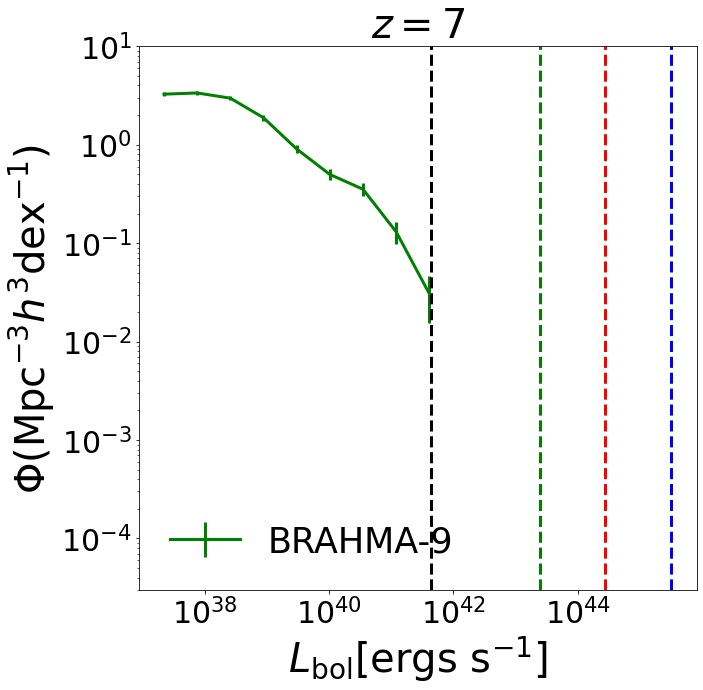

In [17]:
f,ax=plt.subplots(1,1,figsize=(10,10),sharey=True,sharex=True)


Lsun=3.846e33

lcut=39
JWST_lim_z6=49784647411.71445*Lsun
#f,ax=plt.subplots(1,3,figsize=(30,8),sharey=True,sharex=True)
i=0

Mh,Msfmp=1000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath1=path_to_output+run+output    

box_label='L25n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath3=path_to_output+run+output

Lsun=3.846e33

lcut=39
JWST_lim_z6=49784647411.71445*Lsun
#f,ax=plt.subplots(1,3,figsize=(30,8),sharey=True,sharex=True)
i=0
offset=1
for desired_redshift in [7]:
    a1,b1,c1,box_size1=numpy.load(basePath1+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)

    a3,b3,c3,box_size3=numpy.load(basePath3+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)
    b3[a3<10**41]=0
    c3[a3<10**41]=0
    
    #ax.errorbar(a1[b1>0]*offset,b1[b1>0],c1[b1>0],color='lime',linewidth=3)
    #ax[i].errorbar(a2,b2,c2,color='blue',linewidth=6,linestyle='dashed')
    #ax.errorbar(a3[b3>0]*offset,b3[b3>0],c3[b3>0],color='lime',linewidth=10)


Mh,Msfmp=3000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath1=path_to_output+run+output    

box_label='L12p5n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath2=path_to_output+run+output

box_label='L25n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath3=path_to_output+run+output



i=0
offset=1
for desired_redshift in [7]:
    a1,b1,c1,box_size1=numpy.load(basePath1+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)


    a2,b2,c2,box_size2=numpy.load(basePath2+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)
    b2[a2<10**40.5]=0
    c2[a2<10**40.5]=0

    a3,b3,c3,box_size3=numpy.load(basePath3+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)
    b3[a3<10**42]=0
    c3[a3<10**42]=0
    print(b2)
    ax.errorbar(a1[b1>0]*offset,b1[b1>0],c1[b1>0],color='green',linewidth=3,label='BRAHMA-9')
    #ax.errorbar(a2[b2>0]*offset,b2[b2>0],c2[b2>0],color='green',linewidth=6,label='BRAHMA-18')

    #ax.errorbar(a3[b3>0]*offset,b3[b3>0],c3[b3>0],color='green',linewidth=10,label='BRAHMA-36')
    
    ax.set_ylim(3e-5,10)
    ax.tick_params(labelsize=30)
    ax.set_yscale('log')
    ax.set_xscale('log')
    i+=1
    
Mh,Msfmp=10000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath1=path_to_output+run+output    

box_label='L12p5n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath2=path_to_output+run+output



#f,ax=plt.subplots(1,3,figsize=(30,8),sharey=True,sharex=True)
i=0
offset*=1.2
for desired_redshift in [7]:
    a1,b1,c1,box_size1=numpy.load(basePath1+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)


    a2,b2,c2,box_size2=numpy.load(basePath2+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)
    b2[a2<10**40.5]=0
    c2[a2<10**40.5]=0


    
    #ax.errorbar(a1[b1>0]+offset,b1[b1>0],c1[b1>0],color='coral',linewidth=3)
    #ax.errorbar(a2[b2>0]+offset,b2[b2>0],c2[b2>0],color='coral',linewidth=6)
    
    
Mh,Msfmp=3000,150
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath1=path_to_output+run+output    

box_label='L12p5n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath2=path_to_output+run+output



#f,ax=plt.subplots(1,3,figsize=(30,8),sharey=True,sharex=True)
i=0
offset*=1.2
for desired_redshift in [7]:
    a1,b1,c1,box_size1=numpy.load(basePath1+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)


    a2,b2,c2,box_size2=numpy.load(basePath2+'/LF_z%d.npy'%desired_redshift,allow_pickle=True)
    b2[a2<10**40.5]=0
    c2[a2<10**40.5]=0


    
    #ax.errorbar(a1[b1>0]*offset,b1[b1>0],c1[b1>0],color='maroon',linewidth=3)
    #ax.errorbar(a2[b2>0]*offset,b2[b2>0],c2[b2>0],color='maroon',linewidth=6)

ax.set_ylim(3e-5,10)         
        
ax.set_title('$z=7$',fontsize=35)        
ax.set_ylabel('$\Phi(\mathrm{Mpc}^{-3}h^{3}\mathrm{dex^{-1}})$',fontsize=40)
    
#ax.set_ylim(3e-10,10)    
    
ax.legend(loc='lower left',fontsize=35,frameon=False) 
#ax[1].legend(loc='lower left',fontsize=20,frameon=False) 

plt.subplots_adjust(wspace=0.05,hspace=0)


for ii,desired_redshift in list(zip([0,1,2,3],[7])):
        labll1,labll2,labll3,labll4='','','',''
        if(ii==0):
            labll1,labll2,labll3,labll4='Lynx','Athena','Axis','JWST'

        limit=1e-19        
        ax.set_title('$z=%d$'%desired_redshift,fontsize=40)
        ax.axvline(get_bol_lum_limit(desired_redshift,limit),color='black',linestyle='dashed',linewidth=3,label=labll1)

        limit=1.6e-16/2.4e-17*5e-19
        ax.axvline(get_bol_lum_limit(desired_redshift,limit),color='green',linestyle='dashed',linewidth=3,label=labll3)


        limit=1.6e-16
        ax.axvline(get_bol_lum_limit(desired_redshift,limit),color='blue',linestyle='dashed',linewidth=3,label=labll2)


        ax.axvline(JWST_lim_z6*DL(desired_redshift)**2/DL(6)**2,color='red',linestyle='dashed',linewidth=3,label=labll4)

        ax.set_xlabel('$L_{\mathrm{bol}}[\mathrm{ergs \ s^{-1}}]$',fontsize=40)


#plt.savefig('./Paper6_figures/LF2.png',bbox_inches='tight',frameon=False)

    


Desired redshift:  5
Output redshift:  4.995933468164624
Output snapshot:  20
Desired redshift:  3
Output redshift:  3.008131071630377
Output snapshot:  22
Desired redshift:  1
Output redshift:  0.9972942257819404
Output snapshot:  25
Desired redshift:  5
Output redshift:  4.995933468164624
Output snapshot:  20
Desired redshift:  3
Output redshift:  3.008131071630377
Output snapshot:  22
Desired redshift:  1
Output redshift:  0.9972942257819404
Output snapshot:  25
Desired redshift:  5
Output redshift:  4.995933468164624
Output snapshot:  20
Desired redshift:  3
Output redshift:  3.008131071630377
Output snapshot:  22
Desired redshift:  1
Output redshift:  0.9972942257819404
Output snapshot:  25
Desired redshift:  5
Output redshift:  4.995933468164624
Output snapshot:  20
Desired redshift:  3
Output redshift:  3.008131071630377
Output snapshot:  22
Desired redshift:  1
Output redshift:  0.9972942257819404
Output snapshot:  25
[[4.19937842e+14 3.06986613e-09]
 [2.85278683e+14 1.00649195

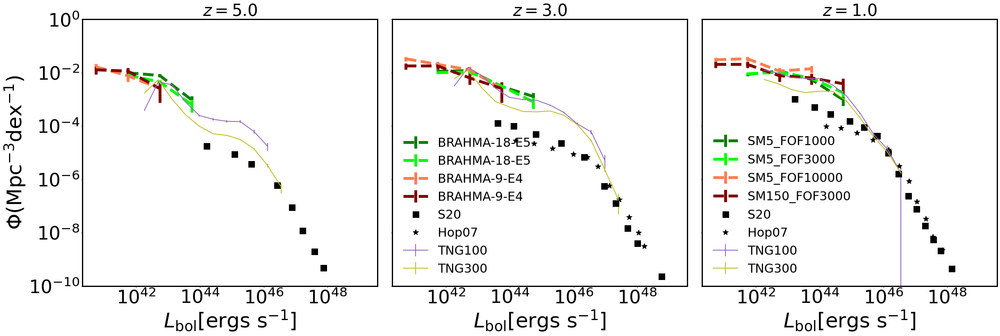

In [39]:
f,ax=plt.subplots(1,3,figsize=(40,12),sharey=True,sharex=True)



Gpc_to_Mpc=1000

def make_plot(ax,col='black',width=4,style='solid',labl1='',labl2=''):
    ii=0
    for desired_redshift in [5,3,1]:
        

        labll1,labll2='',''
     
        ax[0].set_ylim(1e-10,1)
        
        ax[ii].set_title('$z=%.1f$'%desired_redshift,fontsize=40)
        BHMdot,o=arepo_package.get_particle_property(basePath,'BH_Mdot',5,desired_redshift)
        BHLum=BHMdot*total_conv
        box_size=arepo_package.get_box_size(basePath)/1e3

        log_HM_min, log_HM_max, Nbins=36,45,10
        
        

        a,b,c=arepo_package.luminosity_function(BHLum[BHLum>lcut], box_size, log_HM_min, log_HM_max, Nbins)
        c[c>b]=0
        mask=b>0
        
   
        if(ii==1):
            labl=labl1
        elif(ii==2):
            labl=labl2
        else:
            labl=''
            
        ax[ii].errorbar(a[mask],b[mask]*h**3,c[mask]*h**3,color=col,linewidth=width,linestyle=style,label=labl)
        ax[ii].tick_params(labelsize=45)
        ax[ii].set_xlabel('$L_{\mathrm{bol}}[\mathrm{ergs \ s^{-1}}]$',fontsize=50)
        ii+=1

lcut=1e41
Mh,Msfmp=1000,5
        
box_label='L25n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(ax,col='green',style='dashed',labl1='BRAHMA-18-E5',labl2='SM5_FOF1000',width=7)

        
Mh,Msfmp=3000,5

box_label='L25n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot(ax,col='lime',style='dashed',labl1='BRAHMA-18-E5',labl2='SM5_FOF3000',width=7)


lcut=1e40
Mh,Msfmp=10000,5

box_label='L25n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot(ax,col='coral',style='dashed',labl1='BRAHMA-9-E4',labl2='SM5_FOF10000',width=7)


Mh,Msfmp=3000,150

box_label='L25n1024'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot(ax,col='maroon',style='dashed',labl1='BRAHMA-9-E4',labl2='SM150_FOF3000',width=7)






L_sun=3.846e33

ii=0
for desired_redshift in [5,3,1]: 
    data=numpy.loadtxt('../arepo_code_development/observational_data/Shen20_AGNLF_z%d_actualdata.txt'%desired_redshift)      
    #print(data)
    ax[ii].errorbar(data[:,0],data[:,1],color='black',label='S20',marker='s',linewidth=0,ms=15)
    ii+=1
ii=1  
for desired_redshift in [3,1]: 
    data=numpy.loadtxt('../arepo_code_development/observational_data/Hop07_AGNLF_z%d_actual_data.txt'%desired_redshift)
    ax[ii].errorbar(data[:,0]*L_sun,data[:,1],color='black',label='Hop07',marker='*',linewidth=0,ms=15)
    print(data)
    ii+=1

    
#ii=3
#for desired_redshift in [0.7]: 

#    data=numpy.loadtxt('../arepo_code_development/observational_data/Lac15_AGNLF_z0p7_actualdata.txt')
#    ax[ii].errorbar(data[:,0]*L_sun,data[:,1]/0.7**3.,color='grey',label='Lac15',marker='o',linewidth=0,ms=15)

     
desired_redshift=5.0
log_HM_min, log_HM_max, Nbins=42,48,15
iii=0
for desired_redshift in [5,3,1]:
    BHMass,BHMdot,o=numpy.load('/home/aklantbhowmick/TNG100_BH_mass_mdot_z0/TNG100_BH_mass_mdot_z%.6f.npy'%desired_redshift,allow_pickle=True)
    BHLum=BHMdot*total_conv
    box_size=75
    a,b,c=arepo_package.luminosity_function(BHLum[BHLum>lcut], box_size, log_HM_min, log_HM_max, Nbins)
    mask=b>0
    ax[iii].errorbar(a[mask],b[mask]*h**3,c[mask]*h**3,color='C4',label='TNG100',marker='',linewidth=2)
    
    BHMass,BHMdot,o=numpy.load('/home/aklantbhowmick/TNG100_BH_mass_mdot_z0/TNG300_BH_mass_mdot_z%.6f.npy'%desired_redshift,allow_pickle=True)
    BHLum=BHMdot*total_conv
    box_size=205
    a,b,c=arepo_package.luminosity_function(BHLum[BHLum>lcut], box_size, log_HM_min, log_HM_max, Nbins)
    mask=b>0
    ax[iii].errorbar(a[mask],b[mask]*h**3,c[mask]*h**3,color='C8',label='TNG300',marker='',linewidth=2)
    
    
    iii+=1


ax[0].set_ylabel('$\Phi(\mathrm{Mpc}^{-3}\mathrm{dex^{-1}})$',fontsize=50)


#ax[3].legend(loc='upper right',fontsize=25)

ax[2].legend(loc='lower left',fontsize=30,frameon=False)

ax[1].legend(loc='lower left',fontsize=30,frameon=False)




for axx in ax.flatten():
    axx.spines['top'].set_linewidth(3)    # Top axis
    axx.spines['bottom'].set_linewidth(3) # Bottom axis
    axx.spines['left'].set_linewidth(3)   # Left axis
    axx.spines['right'].set_linewidth(3) 






ax[0].set_xscale('log')
ax[0].set_yscale('log')



plt.subplots_adjust(wspace=0.05,hspace=0)

plt.savefig('./Paper6_figures/LFs_z0.png',bbox_inches='tight')





In [11]:

def make():
    for desired_redshift in [5,3,1,0.7][0:1]:
        BHMass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,desired_redshift)
        BHMdot,o=arepo_package.get_particle_property(basePath,'BH_Mdot',5,desired_redshift)
        numpy.save('%s_BH_mass_mdot_z%1f.npy'%(name,desired_redshift),[BHMass,BHMdot,o])   

name='TNG100'
basePath='put the path to TNG100'        
make()

name='TNG300'
basePath='put the path to TNG300'
make()

FileNotFoundError: [Errno 2] No such file or directory: 'put the path to TNG100'

In [12]:
numpy.log10(49784647411.71445*Lsun)

44.28210471558711

In [159]:
if desired_redshift in [6]: 
    data=numpy.loadtxt('../arepo_code_development/observational_data/Shen20_AGNLF_z%d_actualdata.txt'%desired_redshift)      
    ax.errorbar(data[:,0],data[:,1]/0.7**3,color='black',label='Shen20 (actual data)',marker='d',linewidth=0)
#data

In [5]:
iii=2.58
hhh=0.45


redshift_cut=11

levelmax_gas=12
logseedmass_gas=3.19

levelmax=11




def get_info():
    data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_min.npy'%LogTargetGroupBHMass)
    unique_LogGroupMass_min_redshift_space=data[0]
    unique_LogGroupStellarMass_min_redshift_space=data[1]
    unique_LogGroupSFR_min_redshift_space=data[2]
    unique_LogGroupSF_min_redshift_space=data[3]
    unique_LogGroupSFMP_min_redshift_space=data[4]
    unique_LogGroupStellarMetallicity_min_redshift_space=data[5]
    unique_LogGroupGasMetallicity_min_redshift_space=data[6]
    unique_min_redshift_space=data[7]

    data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_max.npy'%LogTargetGroupBHMass)
    unique_LogGroupMass_max_redshift_space=data[0]
    unique_LogGroupStellarMass_max_redshift_space=data[1]
    unique_LogGroupSFR_max_redshift_space=data[2]
    unique_LogGroupSF_max_redshift_space=data[3]
    unique_LogGroupSFMP_max_redshift_space=data[4]
    unique_LogGroupStellarMetallicity_max_redshift_space=data[5]
    unique_LogGroupGasMetallicity_max_redshift_space=data[6]
    unique_max_redshift_space=data[7]

    data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_target.npy'%LogTargetGroupBHMass)
    unique_LogGroupMass_target_redshift_space=data[0]
    unique_LogGroupStellarMass_target_redshift_space=data[1]
    unique_LogGroupSFR_target_redshift_space=data[2]
    unique_LogGroupSF_target_redshift_space=data[3]
    unique_LogGroupSFMP_target_redshift_space=data[4]
    unique_LogGroupStellarMetallicity_target_redshift_space=data[5]
    unique_LogGroupGasMetallicity_target_redshift_space=data[6]
    unique_target_redshift_space=data[7]

    unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)
    mask=(unique_target_redshift_space>6) &(unique_LogGroupMass_target_redshift_space>0)
    a,b,d=arepo_package.mean_plot2(unique_target_redshift_space[mask],unique_LogGroupMass_target_redshift_space[mask],False,False,minx,miny,Nbins)
    if(LogTargetGroupBHMass==5.90):
        print(unique_target_redshift_space,unique_LogGroupMass_target_redshift_space)
    
    return a,b,d,unique_target_redshift_space[mask],unique_LogGroupMass_target_redshift_space[mask]



def get_info2():
    scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete=arepo_package.get_seeding_events3(basePath,GET_ENVIRONMENT=1)
    unique_target_redshift_space=1./scale_fac_complete-1
    unique_LogGroupMass_target_redshift_space = numpy.log10(FOFDMmass_complete*1e10)
    mask=unique_target_redshift_space>6
    a,b,d=arepo_package.mean_plot(unique_target_redshift_space[mask],unique_LogGroupMass_target_redshift_space[mask],False,False,minx,miny,Nbins)

    
    return a,b,d,unique_target_redshift_space[mask],unique_LogGroupMass_target_redshift_space[mask]


def bFOF_mass_model(z, slope_l, slope_u):
    y = np.zeros(z.shape)
    y += (z < z_trans) * (slope_l*(z-z_trans) + value)
    #print(y)
    y += (z > z_trans) * (slope_u*(z-z_trans) + value)
    return y
   

def fit_and_plot():
    global value
    a,b,std,e,f=get_info()

    mask2=std>=0.1
    ax.set_title('L12_SM%d_FOF%d'%(Msfmp,Mh),fontsize=label_fontsize)
    #ax.errorbar(e,f,color=col,marker='o',linewidth=0)
    ax.errorbar(a,b,linewidth=3,color=col,label='Mean')
    ax.fill_between(a,b-std,b+std,alpha=0.3,color=col)
    gen_bFOF_mass=scipy.interpolate.interp1d(a,b,fill_value='extrapolate')
    value=gen_bFOF_mass(z_trans)
    print("LogMinHaloMassSeedingThresholdAverageTransition          ",value)
    print("TransitionRedshift        ",z_trans)
    popt=scipy.optimize.curve_fit(bFOF_mass_model,a[mask2],b[mask2])
    print("Slope_lowz       ",popt[0][0])
    print("Slope_highz      ",popt[0][1])
    
    print("Scatter",std,numpy.mean(std[std>0]))
    
    print("-----")

    z_space_cont = numpy.linspace(7,25,100)
    bFOF_mass_cont=bFOF_mass_model(z_space_cont,popt[0][0],popt[0][1])
    
    ax.errorbar(z_space_cont,bFOF_mass_cont,linewidth=3,color=col,linestyle='dashed',label='Double power-law fit')
    ax.tick_params(labelsize=label_fontsize)
    ax.set_xlabel('Redshift at assembly',fontsize=label_fontsize)
    
 


In [8]:

def do():
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
    basePath=path_to_output+run+output

    redshift_space=numpy.arange(7,25)



    Mseed=1.5625e3

    z_space=[]
    n0_space=[]
    n1_space=[]
    n2_space=[]
    n3_space=[]
    for zz in redshift_space:
        try:
            print(zz)
            GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',zz)
            GroupStarFormingGasMass,o=arepo_package.get_group_property(basePath,'GroupStarFormingGasMass',zz)
            GroupStarFormingMetalFreeGasMass,o=arepo_package.get_group_property(basePath,'GroupStarFormingMetalFreeGasMass',zz)
            mask0=GroupMass>t0/1e10
            mask1=GroupMass>t1*Mseed/1e10
            mask2=GroupStarFormingGasMass>t2*Mseed/1e10
            mask3=GroupStarFormingMetalFreeGasMass>t2*Mseed/1e10
            n0_space.append(len(GroupMass[mask0]))
            n1_space.append(len(GroupMass[mask1]))
            n2_space.append(len(GroupMass[mask2]))
            n3_space.append(len(GroupMass[mask3]))
            z_space.append(o)
        except:
            aaaa=1
    n0_space=numpy.array(n0_space)
    n1_space=numpy.array(n1_space)
    n2_space=numpy.array(n2_space)
    n3_space=numpy.array(n3_space)
    z_space=numpy.array(z_space)
    numpy.save(basePath+'halo_numbers3.19_%d_%d.npy'%(t1,t2),[z_space,n1_space,n2_space,n3_space,n0_space])
    return z_space,n1_space,n2_space,n3_space




In [43]:
Msfmp,Mh=150,3000
t0=1e6

t1=1000
t2=5
z_space,n1_space,n2_space,n3_space=do()

t1=3000
t2=5
z_space,n1_space,n2_space,n3_space=do()


t1=3000
t2=50
z_space,n1_space,n2_space,n3_space=do()

t1=3000
t2=150
z_space,n1_space,n2_space,n3_space=do()


t1=10000
t2=5
z_space,n1_space,n2_space,n3_space=do()



7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24


[ 3244.  2790.  4131. 14159. 13451. 11635.  9687.  7712.  7125.  5293.
  3747.  2544.  1623.  1071.   714.   719.   432.   291.]
[ 3244.  2790.  4131. 14159. 13451. 11635.  9687.  7712.  7125.  5293.
  3747.  2544.  1623.  1071.   714.   719.   432.   291.]
[ 716.  760. 1390. 4257. 3641. 3278. 2722. 2063. 1548. 1091.  710.  427.
  238.  127.   60.   32.   19.   12.]
[ 3244.  2790.  4131. 14159. 13451. 11635.  9687.  7712.  7125.  5293.
  3747.  2544.  1623.  1071.   714.   719.   432.   291.]


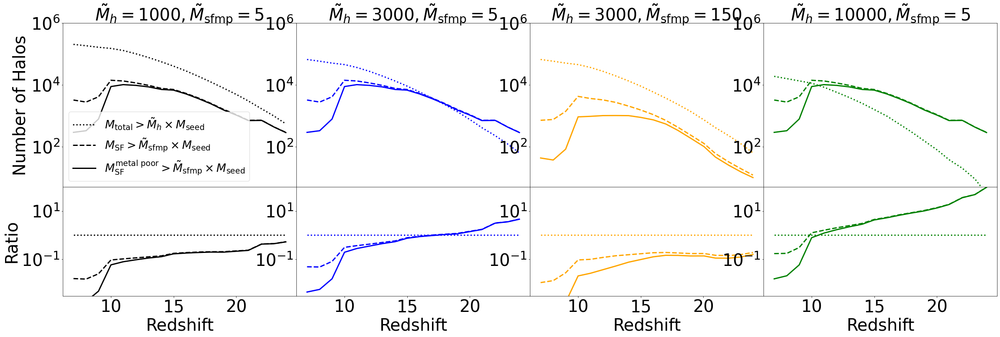

In [44]:
def make_plot(ax0,ax1,col):

    
    
    z_space,n1_space,n2_space,n3_space,n0_space=numpy.load(basePath+'halo_numbers3.19_%d_%d.npy'%(t1,t2))
    #ax0.errorbar(z_space,n0_space,linewidth=3,color='black')
    ax0.errorbar(z_space,n1_space,linewidth=3,color=col,linestyle='dotted',label=r'$M_{\mathrm{total}} > \tilde{M}_{h} \times M_{\mathrm{seed}}$')
    ax0.errorbar(z_space,n2_space,linewidth=3,color=col,linestyle='dashed',label=r'$M_{\mathrm{SF}}>\tilde{M}_{\mathrm{sfmp}} \times M_{\mathrm{seed}}$')
    ax0.errorbar(z_space,n3_space,linewidth=3,color=col,label=r'$M^{\mathrm{metal \ poor}}_{\mathrm{SF}}> \tilde{M}_{\mathrm{sfmp}}\times M_{\mathrm{seed}}$')
    ax0.set_yscale('log')
    ax1.errorbar(z_space,n1_space/n1_space,linewidth=3,color=col,linestyle='dotted')
    ax1.errorbar(z_space,n2_space/n1_space,linewidth=3,color=col,linestyle='dashed',label='Dashed/Dotted')
    ax1.errorbar(z_space,n3_space/n1_space,linewidth=3,color=col,label='Solid/Dotted')
    print(n2_space)
    ax0.set_yscale('log')
    ax1.set_yscale('log')
    
    ax0.set_ylim(5,1000000)
    ax1.set_ylim(3e-3,100)

    ax0.tick_params(labelsize=label_fontsize)
    ax1.tick_params(labelsize=label_fontsize)
    ax1.set_xlabel('Redshift',fontsize=label_fontsize)


    
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
    
f,axx=plt.subplots(2,4,figsize=(40,12),sharex=True,gridspec_kw={'height_ratios': [3, 2]})

t1=1000
t2=5



ax0=axx[0,0]
ax1=axx[1,0]
ax0.set_title(r'$\tilde{M}_h = %d,\tilde{M}_{\mathrm{sfmp}} = %d$'%(t1,t2),fontsize=label_fontsize)
col='black'
make_plot(ax0,ax1,col)




t1=3000
t2=5
ax0=axx[0,1]
ax1=axx[1,1]
ax0.set_title(r'$\tilde{M}_h = %d, \tilde{M}_{\mathrm{sfmp}} = %d$'%(t1,t2),fontsize=label_fontsize)
ax0.tick_params(labelleft='off')
ax1.tick_params(labelleft='off')
col='blue'
make_plot(ax0,ax1,col)

t1=3000
t2=150
ax0=axx[0,2]
ax1=axx[1,2]
ax0.set_title(r'$\tilde{M}_h = %d, \tilde{M}_{\mathrm{sfmp}} = %d$'%(t1,t2),fontsize=label_fontsize)
ax0.tick_params(labelleft='off')
ax1.tick_params(labelleft='off')
col='orange'
make_plot(ax0,ax1,col)



t1=10000
t2=5
ax0=axx[0,3]
ax1=axx[1,3]
ax0.set_title(r'$\tilde{M}_h = %d, \tilde{M}_{\mathrm{sfmp}} = %d$'%(t1,t2),fontsize=label_fontsize)

ax0.tick_params(labelleft='off')
ax1.tick_params(labelleft='off')
col='green'
make_plot(ax0,ax1,col)


axx[0,0].set_ylabel('Number of Halos',fontsize=label_fontsize)

axx[1,0].set_ylabel('Ratio',fontsize=label_fontsize)

axx[0,0].legend(loc='lower left',fontsize=label_fontsize-13)

plt.subplots_adjust(hspace=0,wspace=0)


#axx[2].set_yscale('log')

plt.savefig('./Paper6_figures/halo_numbers.png',bbox_inches='tight')








LogMinHaloMassSeedingThresholdAverageTransition           6.662843671483329
TransitionRedshift         14
Slope_lowz        -0.13171793355393147
Slope_highz       -0.016467280631411504
Scatter [       nan 0.19989594 0.21906816 0.29938575 0.2081826  0.26485501
 0.30608236 0.31622875 0.40792716 0.32365679 0.37210796 0.34292192
 0.28323859 0.35052523 0.29643112 0.30850907 0.27689924 0.36218924
 0.28727848 0.28208611 0.30045665 0.20821311 0.14962006 0.16849237] 0.2840978989076361
-----
LogMinHaloMassSeedingThresholdAverageTransition           7.945922983705702
TransitionRedshift         10.0
Slope_lowz        -0.15338667980727339
Slope_highz       -0.014383992116902
Scatter [       nan 0.15559218 0.17993075 0.1516786  0.32742458 0.17945629
 0.05104397 0.16503321 0.         0.04213894        nan        nan
        nan        nan] 0.15653731330388743
-----
[-1.          7.53435118  8.00127806] [-1.          9.29660927  9.07336813]
[7.53435118 8.00127806] [9.29660927 9.07336813]
LogMinHaloMas

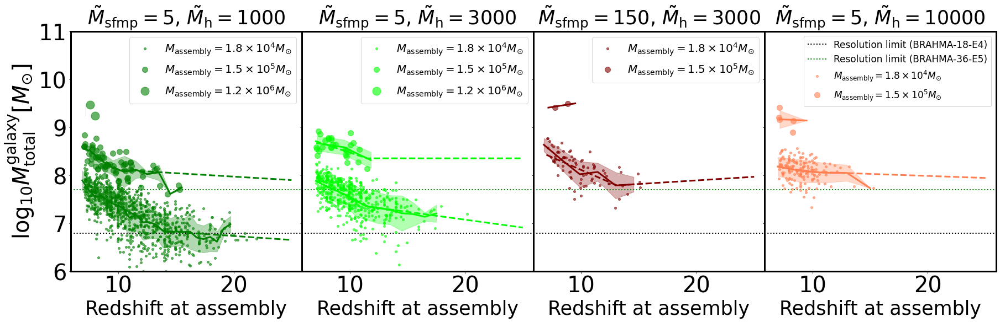

In [10]:
def bFOF_mass_model(z, slope_l, slope_u,labl=''):
    y = np.zeros(z.shape)
    y += (z < z_trans) * (slope_l*(z-z_trans) + value)
    #print(y)
    y += (z > z_trans) * (slope_u*(z-z_trans) + value)
    return y
   

def fit_and_plot(manual_slope=0,slope_value=0,labl='',do_fit=1):
    global value
    a,b,std,e,f=get_info()
    if(LogTargetGroupBHMass==5.90):
        print(e,f)


    mask2=(std>=0.15)&(a<20)
    ax.set_title(r'$\tilde{M}_{\mathrm{sfmp}}=%d$, $\tilde{M}_{\mathrm{h}}=%d$'%(Msfmp,Mh),fontsize=label_fontsize-5)
    ax.errorbar(e,f-log10(h),color=col,marker=mrk,ms=msize,linewidth=0,alpha=0.6,label=labl)
    ax.errorbar(a,b-log10(h),linewidth=3,color=col)
    ax.fill_between(a,b-log10(h)-std,b-log10(h)+std,alpha=0.3,color=col)
    gen_bFOF_mass=scipy.interpolate.interp1d(a,b,fill_value='extrapolate')
    if(do_fit==1):
        value=gen_bFOF_mass(z_trans)
        print("LogMinHaloMassSeedingThresholdAverageTransition          ",value)
        print("TransitionRedshift        ",z_trans)
        popt=scipy.optimize.curve_fit(bFOF_mass_model,a[mask2],b[mask2])
        print("Slope_lowz       ",popt[0][0])
        print("Slope_highz      ",popt[0][1])

        print("Scatter",std,numpy.mean(std[std>0]))

        print("-----")

        z_space_cont = numpy.linspace(7,25,100)
        if(manual_slope==1):
            slope_highz=slope_value
        else:
            slope_highz=popt[0][1]

        bFOF_mass_cont=bFOF_mass_model(z_space_cont,popt[0][0],slope_highz)

        ax.errorbar(z_space_cont,bFOF_mass_cont-log10(h),linewidth=3,color=col,linestyle='dashed')
    ax.tick_params(labelsize=label_fontsize)
    ax.set_xlabel('Redshift at assembly',fontsize=label_fontsize-5)
    
 
   

fig,axx=plt.subplots(1,4,figsize=(30,8),sharex=True,sharey=True)
logseedmass=5.00

Mh,Msfmp=1000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

mrk='o'
msize=4
LogTargetGroupBHMass=4.10
minx,miny,Nbins=6,20,25
ax=axx[0]
col='green'
z_trans=14
fit_and_plot(manual_slope=0,labl=r'$M_{\mathrm{assembly}}=1.8 \times 10^4 M_{\odot}$')

mrk='o'
msize=10
logseedmass=3.00
LogTargetGroupBHMass=5.00
minx,miny,Nbins=6,20,15
ax=axx[0]
col='green'
z_trans=10.0
fit_and_plot(manual_slope=0,labl=r'$M_{\mathrm{assembly}}=1.5 \times 10^5 M_{\odot}$')

mrk='o'
msize=15
logseedmass=3.00
LogTargetGroupBHMass=5.90
minx,miny,Nbins=6,20,7
ax=axx[0]
col='green'
z_trans=11.5
fit_and_plot(manual_slope=1,do_fit=0,labl=r'$M_{\mathrm{assembly}}=1.2 \times 10^6 M_{\odot}$')



Mh,Msfmp=3000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

mrk='o'
msize=4
LogTargetGroupBHMass=4.10
minx,miny,Nbins=6,20,15
ax=axx[1]
col='lime'
z_trans=11.6
fit_and_plot(labl=r'$M_{\mathrm{assembly}}=1.8 \times 10^4 M_{\odot}$')

mrk='o'
msize=10
logseedmass=3.00
LogTargetGroupBHMass=5.00
minx,miny,Nbins=6,20,7
ax=axx[1]
col='lime'
z_trans=11.5
fit_and_plot(manual_slope=1,labl=r'$M_{\mathrm{assembly}}=1.5 \times 10^5 M_{\odot}$')

mrk='o'
msize=15
logseedmass=3.00
LogTargetGroupBHMass=5.90
minx,miny,Nbins=6,20,7
ax=axx[1]
col='lime'
z_trans=11.5
fit_and_plot(manual_slope=1,do_fit=0,labl=r'$M_{\mathrm{assembly}}=1.2 \times 10^6 M_{\odot}$')


Mh,Msfmp=3000,150
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

mrk='o'
msize=4
LogTargetGroupBHMass=4.10
minx,miny,Nbins=6,20,10
ax=axx[2]
col='maroon'
z_trans=13.1
fit_and_plot(labl=r'$M_{\mathrm{assembly}}=1.8 \times 10^4 M_{\odot}$')

mrk='o'
msize=10
logseedmass=3.00
LogTargetGroupBHMass=5.00
minx,miny,Nbins=6,20,7
ax=axx[2]
col='maroon'
z_trans=13.1
fit_and_plot(manual_slope=1,do_fit=0,labl=r'$M_{\mathrm{assembly}}=1.5 \times 10^5 M_{\odot}$')


Mh,Msfmp=10000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

mrk='o'
msize=4
LogTargetGroupBHMass=4.10
minx,miny,Nbins=6,20,8
ax=axx[3]
col='coral'
z_trans=10
fit_and_plot(labl=r'$M_{\mathrm{assembly}}=1.8 \times 10^4 M_{\odot}$')

mrk='o'
msize=10
logseedmass=3.00
LogTargetGroupBHMass=5.00
minx,miny,Nbins=6,20,7
ax=axx[3]
col='coral'
z_trans=10
fit_and_plot(manual_slope=1,do_fit=0,labl=r'$M_{\mathrm{assembly}}=1.5 \times 10^5 M_{\odot}$')


massdm=arepo_package.load_snapshot_header(basePath,7)['MassTable'][1]

for ii in [0,1,2,3]:
    labl1,labl2='',''
    if(ii==3):
        labl1,labl2='Resolution limit (BRAHMA-18-E4)','Resolution limit (BRAHMA-36-E5)'
    axx[ii].axhline(numpy.log10(massdm*1e10*32*8/h),color='black',linewidth=2,linestyle='dotted',label=labl1)
    axx[ii].axhline(numpy.log10(massdm*1e10*32*64/h),color='green',linewidth=2,linestyle='dotted',label=labl2)




axx[0].set_ylim(6,11)








#Msfmp,Mh=5,3000
#path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
#run='/AREPO/' # name of the simulation runs
#output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
#basePath=path_to_output+run+output

#logseedmass=5.00
#LogTargetGroupBHMass=5.00
#minx,miny,Nbins=6,20,15
#ax=axx
#col='red'
#z_trans=11.5
#fit_and_plot()


#axx.set_ylim(5.8,8.8)

axx[0].set_ylabel(r'$\log_{10}M^{\mathrm{galaxy}}_{\mathrm{total}}[M_{\odot}]$',fontsize=label_fontsize)
axx[0].legend(loc='upper right',fontsize=label_fontsize-20,frameon=True)
axx[1].legend(loc='upper right',fontsize=label_fontsize-20,frameon=True)
axx[2].legend(loc='upper right',fontsize=label_fontsize-20,frameon=True)
axx[3].legend(loc='upper right',fontsize=label_fontsize-23,frameon=True)



for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3) 



plt.subplots_adjust(wspace=0,hspace=0)

plt.savefig('./Paper6_figures/bFOFmass_vs_redshift_at_assembly.png',bbox_inches='tight')

#plt.savefig('./Paper5_figures/bFOFmass_vs_redshift_at_assembly.png',bbox_inches='tight')


In [20]:
massdm*1e10*32*8

4204827.566927999

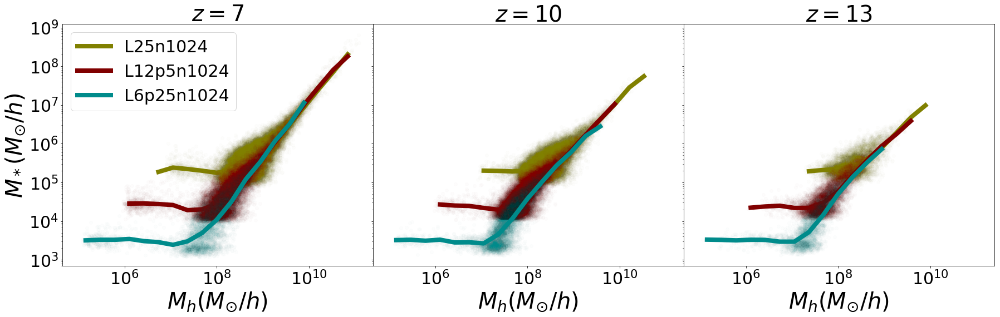

In [3]:



def make_plot(col='black',labl=''):
    i=0
    for desired_redshift in [7,10,13]:

        GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',desired_redshift)

        GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
        GroupStellarMass=GroupMassType[:,4]




        ax[i].errorbar(GroupMass*1e10,GroupStellarMass*1e10,marker='o',linewidth=0,alpha=0.01,color=col)
        
        mask=(GroupStellarMass>0)&(GroupMass>0)
        a,b,c=arepo_package.mean_plot2(numpy.log10(GroupMass[mask]*1e10),numpy.log10(GroupStellarMass[mask]*1e10),False,False,min_x,max_x,Nbins)
        ax[i].errorbar(10**a,10**b,color=col,linewidth=8,label=labl)

        ax[i].set_yscale('log')
        ax[i].set_xscale('log')

        ax[i].tick_params(labelsize=30)
        ax[i].set_xlabel('$M_h(M_{\odot}/h)$',fontsize=40)
        ax[i].set_title('$z=%d$'%desired_redshift,fontsize=40)
       
        i+=1

min_x,max_x,Nbins=5,11,20        
        
f,ax=plt.subplots(1,3,figsize=(30,8),sharex=True,sharey=True)
        
Msfmp,Mh=5,3000

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('olive','L25n1024')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('maroon','L12p5n1024')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

make_plot('darkcyan','L6p25n1024')

ax[0].set_ylabel('$M_*(M_{\odot}/h)$',fontsize=40)

ax[0].legend(loc='upper left',fontsize=30)

plt.subplots_adjust(wspace=0,hspace=0)
plt.savefig('./Paper6_figures/HM_SM.png',bbox_inches='tight')



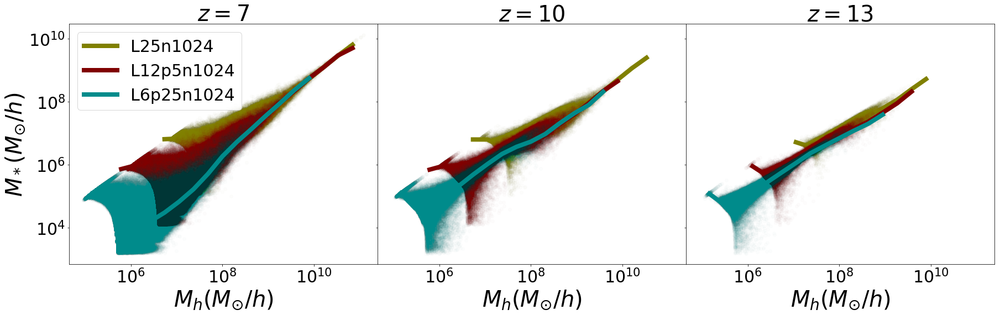

In [13]:



def make_plot(col='black',labl=''):
    i=0
    for desired_redshift in [7,10,13]:

        GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',desired_redshift)

        GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
        GroupStellarMass=GroupMassType[:,0]




        ax[i].errorbar(GroupMass*1e10,GroupStellarMass*1e10,marker='o',linewidth=0,alpha=0.01,color=col)
        
        mask=(GroupStellarMass>0)&(GroupMass>0)
        a,b,c=arepo_package.mean_plot2(numpy.log10(GroupMass[mask]*1e10),numpy.log10(GroupStellarMass[mask]*1e10),False,False,min_x,max_x,Nbins)
        ax[i].errorbar(10**a,10**b,color=col,linewidth=8,label=labl)

        ax[i].set_yscale('log')
        ax[i].set_xscale('log')

        ax[i].tick_params(labelsize=30)
        ax[i].set_xlabel('$M_h(M_{\odot}/h)$',fontsize=40)
        ax[i].set_title('$z=%d$'%desired_redshift,fontsize=40)
       
        i+=1

min_x,max_x,Nbins=5,11,20        
        
f,ax=plt.subplots(1,3,figsize=(30,8),sharex=True,sharey=True)
        
Msfmp,Mh=5,3000

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('olive','L25n1024')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('maroon','L12p5n1024')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

make_plot('darkcyan','L6p25n1024')

ax[0].set_ylabel('$M_*(M_{\odot}/h)$',fontsize=40)

ax[0].legend(loc='upper left',fontsize=30)

plt.subplots_adjust(wspace=0,hspace=0)
plt.savefig('./Paper6_figures/HM_SM.png',bbox_inches='tight')



In [42]:
mu=0.59
VirialTemperature2=1e4
o=30
AtomicCoolingLimit=(VirialTemperature2/(4e4*(mu/1.2)*(1+o)/10))**(3./2)*1e8
print(numpy.log10(AtomicCoolingLimit))

o=7
AtomicCoolingLimit=(VirialTemperature2/(4e4*(mu/1.2)*(1+o)/10))**(3./2)*1e8
print(AtomicCoolingLimit)
VirialTemperature= 4e4*(mu/1.2)* (AtomicCoolingLimit/1e8)**(2./3) * (1+o)/10
print(VirialTemperature)



6.977263283850611
7.859670844114105
10000.0


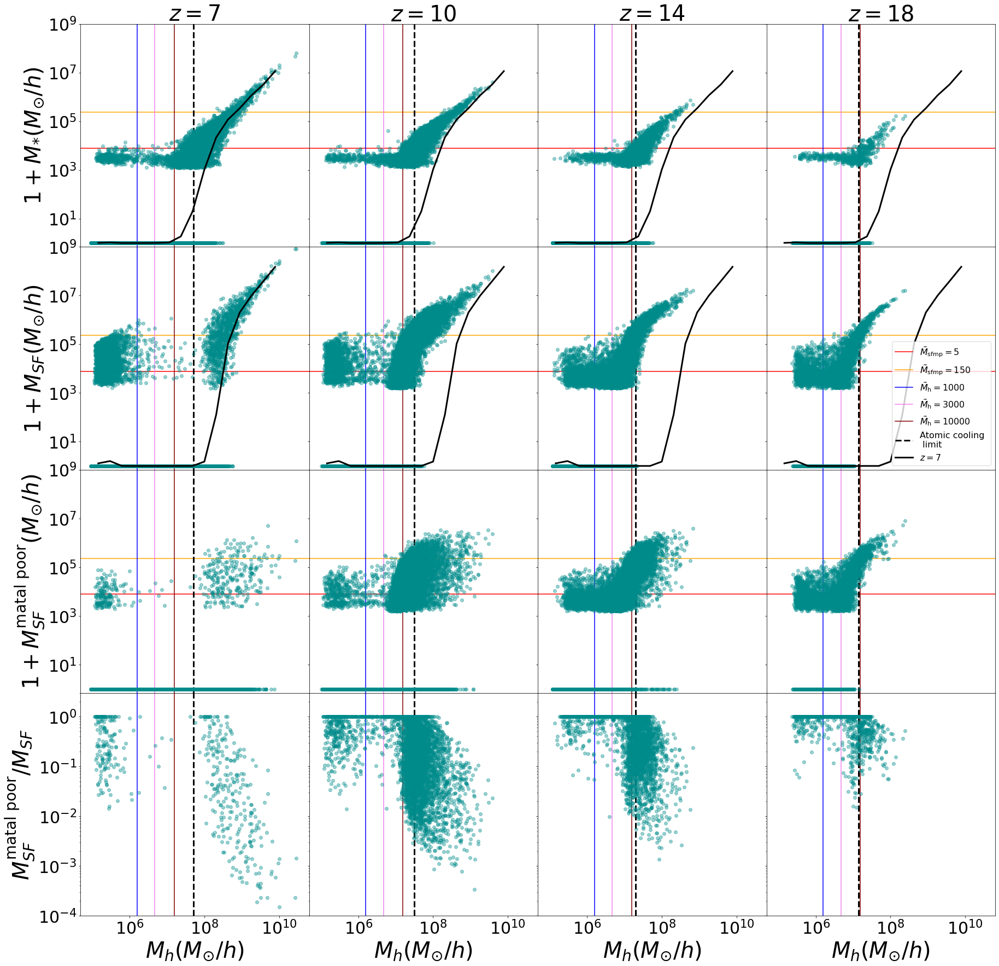

In [29]:



def make_plot(col='black',labl=''):
    i=0
    

    for desired_redshift in [7,10,14,18]:


        GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',desired_redshift)
        GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
        GroupStellarMass0=GroupMassType[:,4]

       #GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
        GroupStellarMass,o=arepo_package.get_group_property(basePath,'GroupStarFormingGasMass',desired_redshift)

        GroupStellarMass2,o=arepo_package.get_group_property(basePath,'GroupStarFormingMetalFreeGasMass',desired_redshift)

        GroupMass1=GroupMassType[:,1]
        GroupMass2=GroupMassType[:,2]
        LowResFraction=GroupMass2/(GroupMass1+GroupMass2)
        mask=(LowResFraction==0) 
        
        
        ax[0,i].errorbar(GroupMass[mask]*1e10,1+GroupStellarMass0[mask]*1e10,marker='o',linewidth=0,alpha=0.4,color=col)
        ax[1,i].errorbar(GroupMass[mask]*1e10,1+GroupStellarMass[mask]*1e10,marker='o',linewidth=0,alpha=0.4,color=col)
        ax[2,i].errorbar(GroupMass[mask]*1e10,1+GroupStellarMass2[mask]*1e10,marker='o',linewidth=0,alpha=0.4,color=col)
        ax[3,i].errorbar(GroupMass[mask]*1e10,GroupStellarMass2[mask]/GroupStellarMass[mask],marker='o',linewidth=0,alpha=0.4,color=col)
       



        ax[3,i].set_xlabel('$M_h(M_{\odot}/h)$',fontsize=40)
        ax[0,i].set_title('$z=%d$'%desired_redshift,fontsize=40)
        
        mu=0.59
        VirialTemperature2=1e4
        AtomicCoolingLimit=(VirialTemperature2/(4e4*(mu/1.2)*(1+o)/10))**(3./2)*1e8
        for jj in [0,1,2,3]:
            if(jj<3):
                ax[jj,i].axhline(5*1.56e3,color='red',label=r'$\tilde{M}_{\mathrm{sfmp}}=5$')     

                ax[jj,i].axhline(150*1.56e3,color='orange',label=r'$\tilde{M}_{\mathrm{sfmp}}=150$')

            ax[jj,i].axvline(1000*1.56e3,color='blue',label=r'$\tilde{M}_{\mathrm{h}}=1000$')

            ax[jj,i].axvline(3000*1.56e3,color='violet',label=r'$\tilde{M}_{\mathrm{h}}=3000$')

            ax[jj,i].axvline(10000*1.56e3,color='maroon',label=r'$\tilde{M}_{\mathrm{h}}=10000$')
            

            ax[jj,i].axvline(AtomicCoolingLimit,color='black',linestyle='dashed',label='Atomic cooling \n limit',linewidth=3)

            ax[jj,i].set_yscale('log')
            ax[jj,i].set_xscale('log')
            
            

            ax[jj,i].tick_params(labelsize=30)
            
            if(i>0):
                ax[jj,i].tick_params(labelleft=False)
                

            
        ax[0,i].set_ylim(7e-1,1e9)
        ax[1,i].set_ylim(7e-1,1e9)
        ax[2,i].set_ylim(7e-1,1e9)
        ax[3,i].set_ylim(1e-4,3)
        i+=1
        
    for desired_redshift in [7]:


        GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',desired_redshift)
        GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
        GroupStellarMass0=GroupMassType[:,4]

       #GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
        GroupStellarMass,o=arepo_package.get_group_property(basePath,'GroupStarFormingGasMass',desired_redshift)

        GroupStellarMass2,o=arepo_package.get_group_property(basePath,'GroupStarFormingMetalFreeGasMass',desired_redshift)
        GroupMass1=GroupMassType[:,1]
        GroupMass2=GroupMassType[:,2]
        LowResFraction=GroupMass2/(GroupMass1+GroupMass2)
        mask=(LowResFraction==0) 

        #ax[0,0].errorbar(GroupMass*1e10,1+GroupStellarMass0*1e10,marker='o',linewidth=0,alpha=0.4,color='black')
        for ii in [0,1,2,3]:
            a,b,c=arepo_package.mean_plot2(numpy.log10(GroupMass[mask]*1e10),numpy.log10(1+GroupStellarMass0[mask]*1e10),False,False,min_x,max_x,Nbins)
            ax[0,ii].errorbar(10**a,10**b,color='black',linewidth=3,label='$z=7$')

            a,b,c=arepo_package.mean_plot2(numpy.log10(GroupMass[mask]*1e10),numpy.log10(1+GroupStellarMass[mask]*1e10),False,False,min_x,max_x,Nbins)
            ax[1,ii].errorbar(10**a,10**b,color='black',linewidth=3,label='$z=7$')

            
        
        

        
     

min_x,max_x,Nbins=5,11,20        
        
f,ax=plt.subplots(4,4,figsize=(30,30),sharex=True)
        
Msfmp,Mh=5,3000

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

#make_plot('olive','L25n1024')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

#make_plot('maroon','L12p5n1024')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output



make_plot('darkcyan','L6p25n1024')

ax[0,0].set_ylabel('$1+M_{*}(M_{\odot}/h)$',fontsize=40)
ax[1,0].set_ylabel('$1+M_{SF}(M_{\odot}/h)$',fontsize=40)
ax[2,0].set_ylabel('$1+M^{\mathrm{matal \ poor}}_{SF}(M_{\odot}/h)$',fontsize=40)
ax[3,0].set_ylabel('$M^{\mathrm{matal \ poor}}_{SF}/M_{SF}$',fontsize=40)

ax[1,3].legend(loc='lower right',fontsize=16)

plt.subplots_adjust(wspace=0,hspace=0)
plt.savefig('./Paper6_figures/HM_SFGM.png',bbox_inches='tight')



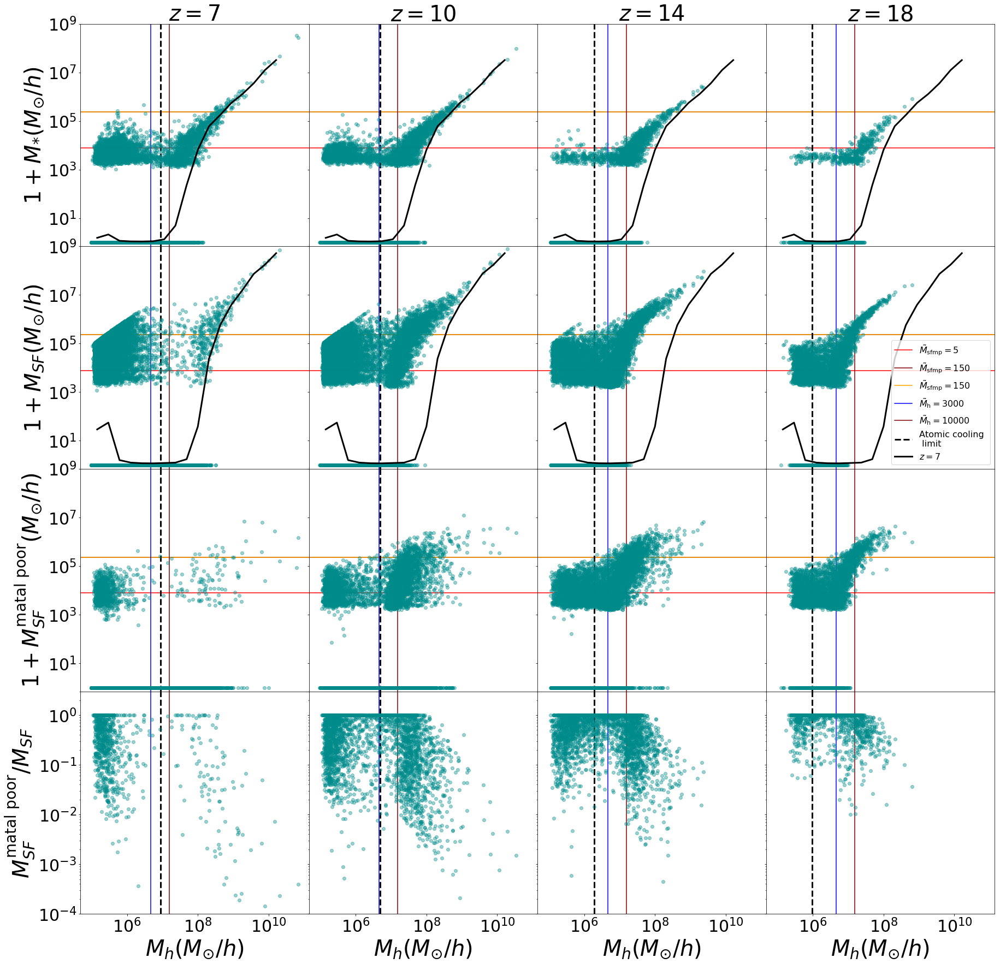

In [27]:



def make_plot(col='black',labl=''):
    i=0
    

    for desired_redshift in [7,10,14,18]:


        GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',desired_redshift)
        GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
        GroupStellarMass0=GroupMassType[:,4]

       #GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
        GroupStellarMass,o=arepo_package.get_group_property(basePath,'GroupStarFormingGasMass',desired_redshift)

        GroupStellarMass2,o=arepo_package.get_group_property(basePath,'GroupStarFormingMetalFreeGasMass',desired_redshift)

        GroupMass1=GroupMassType[:,1]
        GroupMass2=GroupMassType[:,2]
        LowResFraction=GroupMass2/(GroupMass1+GroupMass2)
        mask=(LowResFraction==0) 
        
        
        ax[0,i].errorbar(GroupMass[mask]*1e10,1+GroupStellarMass0[mask]*1e10,marker='o',linewidth=0,alpha=0.4,color=col)
        ax[1,i].errorbar(GroupMass[mask]*1e10,1+GroupStellarMass[mask]*1e10,marker='o',linewidth=0,alpha=0.4,color=col)
        ax[2,i].errorbar(GroupMass[mask]*1e10,1+GroupStellarMass2[mask]*1e10,marker='o',linewidth=0,alpha=0.4,color=col)
        ax[3,i].errorbar(GroupMass[mask]*1e10,GroupStellarMass2[mask]/GroupStellarMass[mask],marker='o',linewidth=0,alpha=0.4,color=col)
       



        ax[3,i].set_xlabel('$M_h(M_{\odot}/h)$',fontsize=40)
        ax[0,i].set_title('$z=%d$'%desired_redshift,fontsize=40)
        
        mu=0.59
        VirialTemperature2=1e4
        AtomicCoolingLimit=(VirialTemperature2/(4e4*(mu/1.2)*(1+o)/10))**3./2*1e8
        for jj in [0,1,2,3]:
            if(jj<3):
                ax[jj,i].axhline(5*1.56e3,color='red',label=r'$\tilde{M}_{\mathrm{sfmp}}=5$')  
                
                ax[jj,i].axhline(150*1.56e3,color='maroon',label=r'$\tilde{M}_{\mathrm{sfmp}}=150$')

                ax[jj,i].axhline(150*1.56e3,color='orange',label=r'$\tilde{M}_{\mathrm{sfmp}}=150$')


            ax[jj,i].axvline(3000*1.56e3,color='blue',label=r'$\tilde{M}_{\mathrm{h}}=3000$')

            ax[jj,i].axvline(10000*1.56e3,color='maroon',label=r'$\tilde{M}_{\mathrm{h}}=10000$')
            

            ax[jj,i].axvline(AtomicCoolingLimit,color='black',linestyle='dashed',label='Atomic cooling \n limit',linewidth=3)

            ax[jj,i].set_yscale('log')
            ax[jj,i].set_xscale('log')
            
            

            ax[jj,i].tick_params(labelsize=30)
            
            if(i>0):
                ax[jj,i].tick_params(labelleft=False)
                

            
        ax[0,i].set_ylim(7e-1,1e9)
        ax[1,i].set_ylim(7e-1,1e9)
        ax[2,i].set_ylim(7e-1,1e9)
        ax[3,i].set_ylim(1e-4,3)
        i+=1
        
    for desired_redshift in [7]:


        GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',desired_redshift)
        GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
        GroupStellarMass0=GroupMassType[:,4]

       #GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
        GroupStellarMass,o=arepo_package.get_group_property(basePath,'GroupStarFormingGasMass',desired_redshift)

        GroupStellarMass2,o=arepo_package.get_group_property(basePath,'GroupStarFormingMetalFreeGasMass',desired_redshift)
        GroupMass1=GroupMassType[:,1]
        GroupMass2=GroupMassType[:,2]
        LowResFraction=GroupMass2/(GroupMass1+GroupMass2)
        mask=(LowResFraction==0) 

        #ax[0,0].errorbar(GroupMass*1e10,1+GroupStellarMass0*1e10,marker='o',linewidth=0,alpha=0.4,color='black')
        for ii in [0,1,2,3]:
            a,b,c=arepo_package.mean_plot2(numpy.log10(GroupMass[mask]*1e10),numpy.log10(1+GroupStellarMass0[mask]*1e10),False,False,min_x,max_x,Nbins)
            ax[0,ii].errorbar(10**a,10**b,color='black',linewidth=3,label='$z=7$')

            a,b,c=arepo_package.mean_plot2(numpy.log10(GroupMass[mask]*1e10),numpy.log10(1+GroupStellarMass[mask]*1e10),False,False,min_x,max_x,Nbins)
            ax[1,ii].errorbar(10**a,10**b,color='black',linewidth=3,label='$z=7$')

            
        
        

        
     

min_x,max_x,Nbins=5,11,20        
        
f,ax=plt.subplots(4,4,figsize=(30,30),sharex=True)
        
Msfmp,Mh=5,3000

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

#make_plot('olive','L25n1024')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

#make_plot('maroon','L12p5n1024')

path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax12_haloindex4_redshift5.00_logbhseedmass3.19_NSC/' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output



make_plot('darkcyan','L6p25n1024')

ax[0,0].set_ylabel('$1+M_{*}(M_{\odot}/h)$',fontsize=40)
ax[1,0].set_ylabel('$1+M_{SF}(M_{\odot}/h)$',fontsize=40)
ax[2,0].set_ylabel('$1+M^{\mathrm{matal \ poor}}_{SF}(M_{\odot}/h)$',fontsize=40)
ax[3,0].set_ylabel('$M^{\mathrm{matal \ poor}}_{SF}/M_{SF}$',fontsize=40)

ax[1,3].legend(loc='lower right',fontsize=16)

plt.subplots_adjust(wspace=0,hspace=0)
plt.savefig('./Paper6_figures/HM_SFGM.png',bbox_inches='tight')



In [8]:
h

0.6771

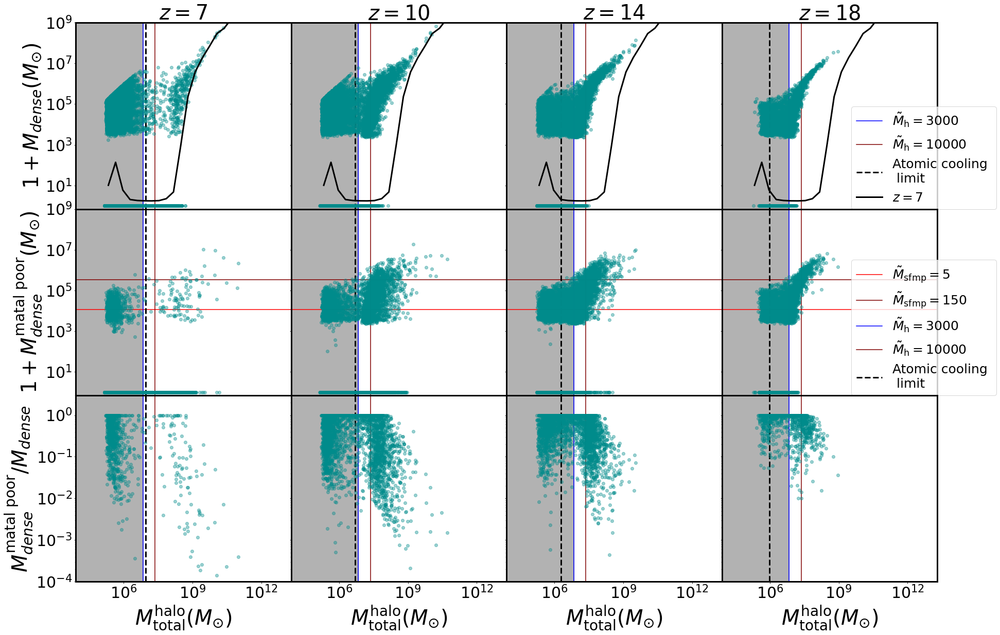

In [11]:



def make_plot(col='black',labl=''):
    i=0
    

    for desired_redshift in [7,10,14,18]:


        GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',desired_redshift)
        GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
        GroupStellarMass0=GroupMassType[:,4]

       #GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
        GroupStellarMass,o=arepo_package.get_group_property(basePath,'GroupStarFormingGasMass',desired_redshift)

        GroupStellarMass2,o=arepo_package.get_group_property(basePath,'GroupStarFormingMetalFreeGasMass',desired_redshift)

        GroupMass1=GroupMassType[:,1]
        GroupMass2=GroupMassType[:,2]
        LowResFraction=GroupMass2/(GroupMass1+GroupMass2)
        mask=(LowResFraction==0) 
        
        
        #ax[0,i].errorbar(GroupMass[mask]*1e10,1+GroupStellarMass0[mask]*1e10,marker='o',linewidth=0,alpha=0.4,color=col)
        ax[0,i].errorbar(GroupMass[mask]*1e10/h,1+GroupStellarMass[mask]*1e10/h,marker='o',linewidth=0,alpha=0.4,color=col)
        ax[1,i].errorbar(GroupMass[mask]*1e10/h,1+GroupStellarMass2[mask]*1e10/h,marker='o',linewidth=0,alpha=0.4,color=col)
        ax[2,i].errorbar(GroupMass[mask]*1e10/h,GroupStellarMass2[mask]/GroupStellarMass[mask],marker='o',linewidth=0,alpha=0.4,color=col)
       



        ax[2,i].set_xlabel('$M^{\mathrm{halo}}_{\mathrm{total}}(M_{\odot})$',fontsize=40)
        ax[0,i].set_title('$z=%d$'%desired_redshift,fontsize=40)
        
        mu=0.59
        VirialTemperature2=1e4
        AtomicCoolingLimit=(VirialTemperature2/(4e4*(mu/1.2)*(1+o)/10))**3./2*1e8
        for jj in [0,1,2]:
            if(jj==1):
                ax[jj,i].axhline(5*1.56e3/h,color='red',label=r'$\tilde{M}_{\mathrm{sfmp}}=5$')  
                
                ax[jj,i].axhline(150*1.56e3/h,color='maroon',label=r'$\tilde{M}_{\mathrm{sfmp}}=150$')

                #ax[jj,i].axhline(150*1.56e3,color='orange',label=r'$\tilde{M}_{\mathrm{sfmp}}=150$')

            if(jj<3):
                ax[jj,i].axvline(3000*1.56e3/h,color='blue',label=r'$\tilde{M}_{\mathrm{h}}=3000$')

                ax[jj,i].axvline(10000*1.56e3/h,color='maroon',label=r'$\tilde{M}_{\mathrm{h}}=10000$')
            

            ax[jj,i].axvline(AtomicCoolingLimit,color='black',linestyle='dashed',label='Atomic cooling \n limit',linewidth=3)

            ax[jj,i].set_yscale('log')
            ax[jj,i].set_xscale('log')
            
            ax[jj,i].axvspan(8e3,3000*1.56e3/h,color='black',alpha=0.3)
            ax[jj,i].set_xlim(8e3,2e13)
            
            

            ax[jj,i].tick_params(labelsize=30)
            
            if(i>0):
                ax[jj,i].tick_params(labelleft=False)
                

            
        #ax[0,i].set_ylim(7e-1,1e9)
        ax[0,i].set_ylim(7e-1,1e9)
        ax[1,i].set_ylim(7e-1,1e9)
        ax[2,i].set_ylim(1e-4,3)
        i+=1
        
    for desired_redshift in [7]:


        GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',desired_redshift)
        GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
        GroupStellarMass0=GroupMassType[:,4]

       #GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
        GroupStellarMass,o=arepo_package.get_group_property(basePath,'GroupStarFormingGasMass',desired_redshift)

        GroupStellarMass2,o=arepo_package.get_group_property(basePath,'GroupStarFormingMetalFreeGasMass',desired_redshift)
        GroupMass1=GroupMassType[:,1]
        GroupMass2=GroupMassType[:,2]
        LowResFraction=GroupMass2/(GroupMass1+GroupMass2)
        mask=(LowResFraction==0) 

        #ax[0,0].errorbar(GroupMass*1e10,1+GroupStellarMass0*1e10,marker='o',linewidth=0,alpha=0.4,color='black')
        for ii in [0,1,2,3]:
            a,b,c=arepo_package.mean_plot2(numpy.log10(GroupMass[mask]*1e10/h),numpy.log10(1+GroupStellarMass[mask]*1e10/h),False,False,min_x,max_x,Nbins)
            ax[0,ii].errorbar(10**a/h,10**b/h,color='black',linewidth=3,label='$z=7$')

            a,b,c=arepo_package.mean_plot2(numpy.log10(GroupMass[mask]*1e10/h),numpy.log10(1+GroupStellarMass2[mask]*1e10/h),False,False,min_x,max_x,Nbins)
            #ax[1,ii].errorbar(10**a,10**b,color='black',linewidth=3,label='$z=7$')

            
        
        

        
     

min_x,max_x,Nbins=5,11,20        
        
f,ax=plt.subplots(3,4,figsize=(30,20),sharex=True)
        
Msfmp,Mh=5,3000

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

#make_plot('olive','L25n1024')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

#make_plot('maroon','L12p5n1024')

path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax12_haloindex4_redshift5.00_logbhseedmass3.19_NSC/' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output



make_plot('darkcyan','L6p25n1024')

#ax[0,0].set_ylabel('$1+M_{*}(M_{\odot}/h)$',fontsize=40)
ax[0,0].set_ylabel('$1+M_{dense}(M_{\odot})$',fontsize=40)
ax[1,0].set_ylabel('$1+M^{\mathrm{metal \ poor}}_{dense}(M_{\odot})$',fontsize=40)
ax[2,0].set_ylabel('$M^{\mathrm{mtal \ poor}}_{dense}/M_{dense}$',fontsize=40)

ax[0,3].legend(loc=(0.6,0),fontsize=25)
ax[1,3].legend(loc=(0.6,0),fontsize=25)


for axx in ax.flatten():
    axx.spines['top'].set_linewidth(3)    # Top axis
    axx.spines['bottom'].set_linewidth(3) # Bottom axis
    axx.spines['left'].set_linewidth(3)   # Left axis
    axx.spines['right'].set_linewidth(3)  # Right axis

plt.subplots_adjust(wspace=0,hspace=0)
plt.savefig('./Paper6_figures/HM_SFGM.png',bbox_inches='tight')



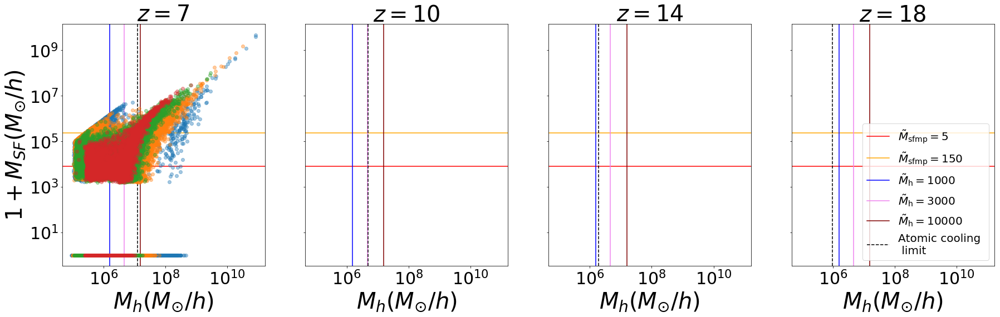

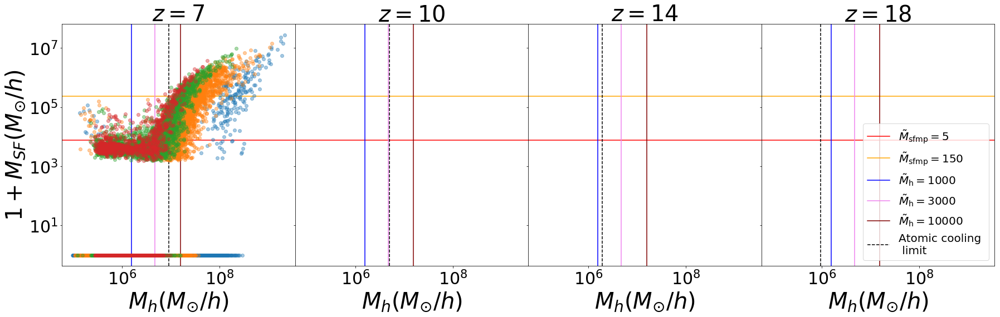

In [14]:



def make_plot(col='black',labl=''):
    i=0
    for desired_redshift in [7,10,14,18]:


        GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',desired_redshift)

        GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
        GroupStellarMass,o=arepo_package.get_group_property(basePath,'GroupStarFormingGasMass',desired_redshift)
        GroupMass1=GroupMassType[:,1]
        GroupMass2=GroupMassType[:,2]
        LowResFraction=GroupMass2/(GroupMass1+GroupMass2)

        mask=(GroupMass>0)&(LowResFraction==0)

        ax[0].errorbar(GroupMass[mask]*1e10,1+GroupStellarMass[mask]*1e10,marker='o',linewidth=0,alpha=0.4)
        
       
        a,b,c=arepo_package.mean_plot2(numpy.log10(GroupMass[mask]*1e10),numpy.log10(1+GroupStellarMass[mask]*1e10),False,False,min_x,max_x,Nbins)
        #ax[i].errorbar(10**a,10**b,color='green',linewidth=8,label=labl)

        ax[i].set_yscale('log')
        ax[i].set_xscale('log')

        ax[i].tick_params(labelsize=30)
        ax[i].set_xlabel('$M_h(M_{\odot}/h)$',fontsize=40)
        ax[i].set_title('$z=%d$'%desired_redshift,fontsize=40)
        
        mu=0.59
        VirialTemperature2=1e4
        AtomicCoolingLimit=(VirialTemperature2/(4e4*(mu/1.2)*(1+o)/10))**3./2*1e8
        ax[i].axhline(5*1.56e3,color='red',label=r'$\tilde{M}_{\mathrm{sfmp}}=5$')     

        ax[i].axhline(150*1.56e3,color='orange',label=r'$\tilde{M}_{\mathrm{sfmp}}=150$')

        ax[i].axvline(1000*1.56e3,color='blue',label=r'$\tilde{M}_{\mathrm{h}}=1000$')

        ax[i].axvline(3000*1.56e3,color='violet',label=r'$\tilde{M}_{\mathrm{h}}=3000$')

        ax[i].axvline(10000*1.56e3,color='maroon',label=r'$\tilde{M}_{\mathrm{h}}=10000$')
        
        ax[i].axvline(AtomicCoolingLimit,color='black',linestyle='dashed',label='Atomic cooling \n limit')
       
        i+=1

min_x,max_x,Nbins=5,11,20        
        
f,ax=plt.subplots(1,4,figsize=(30,8),sharex=True,sharey=True)
        
Msfmp,Mh=150,3000

path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax12_haloindex4_redshift5.00_logbhseedmass3.19_NSC/' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot('darkcyan','L6p25n1024')

ax[0].set_ylabel('$1+M_{SF}(M_{\odot}/h)$',fontsize=40)

ax[3].legend(loc='lower right',fontsize=20)


f,ax=plt.subplots(1,4,figsize=(30,8),sharex=True,sharey=True)
        
Msfmp,Mh=150,3000

path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax12_haloindex4_redshift5.00_logbhseedmass3.19_NSC/' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env_normal/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot('darkcyan','L6p25n1024')

ax[0].set_ylabel('$1+M_{SF}(M_{\odot}/h)$',fontsize=40)

ax[3].legend(loc='lower right',fontsize=20)


plt.subplots_adjust(wspace=0,hspace=0)
#plt.savefig('./Paper6_figures/HM_SFGM.png',bbox_inches='tight')



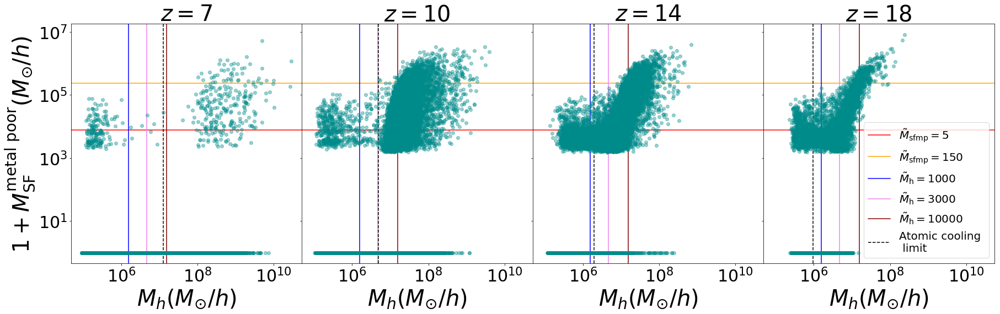

In [18]:



def make_plot(col='black',labl=''):
    i=0
    for desired_redshift in [7,10,14,18]:


        GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',desired_redshift)

        #GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
        GroupStellarMass,o=arepo_package.get_group_property(basePath,'GroupStarFormingMetalFreeGasMass',desired_redshift)




        ax[i].errorbar(GroupMass*1e10,1+GroupStellarMass*1e10,marker='o',linewidth=0,alpha=0.4,color=col)
        
        mask=(GroupMass>0)
        a,b,c=arepo_package.mean_plot2(numpy.log10(GroupMass[mask]*1e10),numpy.log10(1+GroupStellarMass[mask]*1e10),False,False,min_x,max_x,Nbins)
        #ax[i].errorbar(10**a,10**b,color='green',linewidth=8,label=labl)

        ax[i].set_yscale('log')
        ax[i].set_xscale('log')

        ax[i].tick_params(labelsize=30)
        ax[i].set_xlabel('$M_h(M_{\odot}/h)$',fontsize=40)
        ax[i].set_title('$z=%d$'%desired_redshift,fontsize=40)
        
        mu=0.59
        VirialTemperature2=1e4
        AtomicCoolingLimit=(VirialTemperature2/(4e4*(mu/1.2)*(1+o)/10))**3./2*1e8
        
        ax[i].axhline(5*1.56e3,color='red',label=r'$\tilde{M}_{\mathrm{sfmp}}=5$')     

        ax[i].axhline(150*1.56e3,color='orange',label=r'$\tilde{M}_{\mathrm{sfmp}}=150$')

        ax[i].axvline(1000*1.56e3,color='blue',label=r'$\tilde{M}_{\mathrm{h}}=1000$')

        ax[i].axvline(3000*1.56e3,color='violet',label=r'$\tilde{M}_{\mathrm{h}}=3000$')

        ax[i].axvline(10000*1.56e3,color='maroon',label=r'$\tilde{M}_{\mathrm{h}}=10000$')
        
        ax[i].axvline(AtomicCoolingLimit,color='black',linestyle='dashed',label='Atomic cooling \n limit')
       
        i+=1

min_x,max_x,Nbins=5,11,20        
        
f,ax=plt.subplots(1,4,figsize=(30,8),sharex=True,sharey=True)
        
Msfmp,Mh=5,3000

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

#make_plot('olive','L25n1024')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

#make_plot('maroon','L12p5n1024')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output



make_plot('darkcyan','L6p25n1024')

ax[0].set_ylabel('$1+M^{\mathrm{metal\ poor}}_{\mathrm{SF}}(M_{\odot}/h)$',fontsize=40)

ax[3].legend(loc='lower right',fontsize=20)

plt.subplots_adjust(wspace=0,hspace=0)
plt.savefig('./Paper6_figures/HM_SFMPGM.png',bbox_inches='tight')



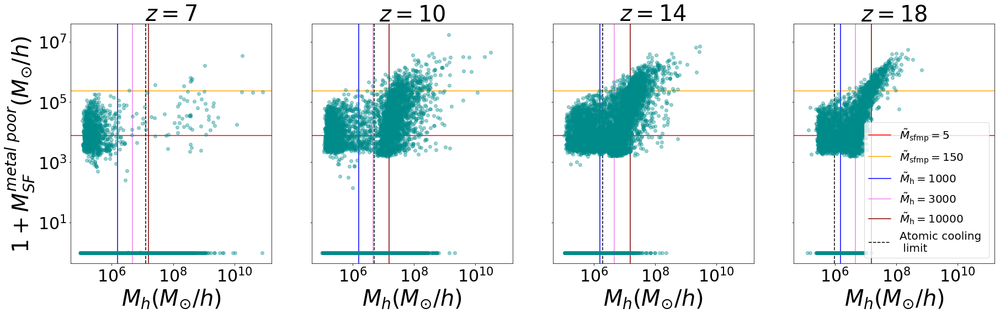

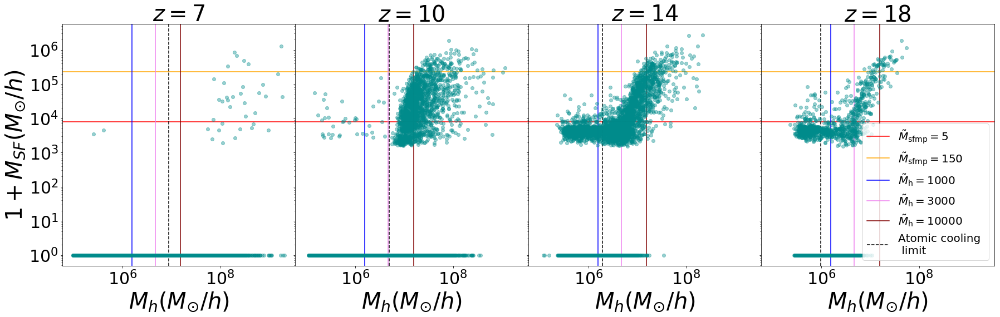

In [12]:



def make_plot(col='black',labl=''):
    i=0
    for desired_redshift in [7,10,14,18]:


        GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',desired_redshift)

        GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
        GroupStellarMass,o=arepo_package.get_group_property(basePath,'GroupStarFormingMetalFreeGasMass',desired_redshift)
        GroupMass1=GroupMassType[:,1]
        GroupMass2=GroupMassType[:,2]
        LowResFraction=GroupMass2/(GroupMass1+GroupMass2)

        mask=(GroupMass>0)&(LowResFraction==0)

        ax[i].errorbar(GroupMass[mask]*1e10,1+GroupStellarMass[mask]*1e10,marker='o',linewidth=0,alpha=0.4,color=col)
        
       
        a,b,c=arepo_package.mean_plot2(numpy.log10(GroupMass[mask]*1e10),numpy.log10(1+GroupStellarMass[mask]*1e10),False,False,min_x,max_x,Nbins)
        #ax[i].errorbar(10**a,10**b,color='green',linewidth=8,label=labl)

        ax[i].set_yscale('log')
        ax[i].set_xscale('log')

        ax[i].tick_params(labelsize=30)
        ax[i].set_xlabel('$M_h(M_{\odot}/h)$',fontsize=40)
        ax[i].set_title('$z=%d$'%desired_redshift,fontsize=40)
        
        mu=0.59
        VirialTemperature2=1e4
        AtomicCoolingLimit=(VirialTemperature2/(4e4*(mu/1.2)*(1+o)/10))**3./2*1e8
        ax[i].axhline(5*1.56e3,color='red',label=r'$\tilde{M}_{\mathrm{sfmp}}=5$')     

        ax[i].axhline(150*1.56e3,color='orange',label=r'$\tilde{M}_{\mathrm{sfmp}}=150$')

        ax[i].axvline(1000*1.56e3,color='blue',label=r'$\tilde{M}_{\mathrm{h}}=1000$')

        ax[i].axvline(3000*1.56e3,color='violet',label=r'$\tilde{M}_{\mathrm{h}}=3000$')

        ax[i].axvline(10000*1.56e3,color='maroon',label=r'$\tilde{M}_{\mathrm{h}}=10000$')
        
        ax[i].axvline(AtomicCoolingLimit,color='black',linestyle='dashed',label='Atomic cooling \n limit')
       
        i+=1

min_x,max_x,Nbins=5,11,20        
        
f,ax=plt.subplots(1,4,figsize=(30,8),sharex=True,sharey=True)
        
Msfmp,Mh=150,3000

path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax12_haloindex4_redshift5.00_logbhseedmass3.19_NSC/' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot('darkcyan','L6p25n1024')

ax[0].set_ylabel('$1+M^{metal \ poor}_{SF}(M_{\odot}/h)$',fontsize=40)

ax[3].legend(loc='lower right',fontsize=20)


f,ax=plt.subplots(1,4,figsize=(30,8),sharex=True,sharey=True)
        
Msfmp,Mh=150,3000

path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax12_haloindex4_redshift5.00_logbhseedmass3.19_NSC/' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env_normal/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot('darkcyan','L6p25n1024')

ax[0].set_ylabel('$1+M_{SF}(M_{\odot}/h)$',fontsize=40)

ax[3].legend(loc='lower right',fontsize=20)


plt.subplots_adjust(wspace=0,hspace=0)
#plt.savefig('./Paper6_figures/HM_SFGM.png',bbox_inches='tight')



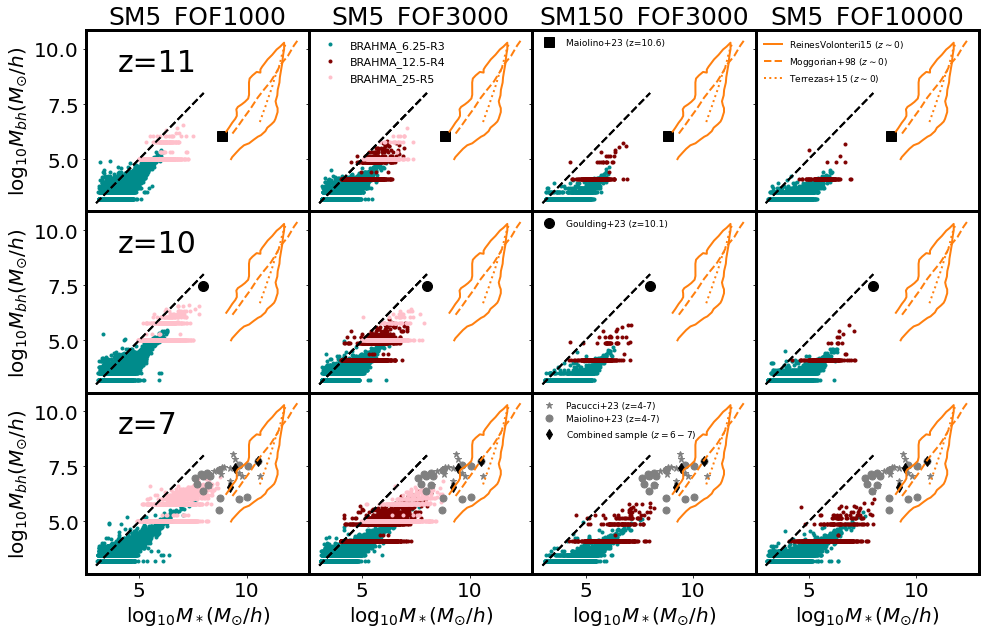

In [50]:



def make_plot(col='black',labl='',labl5='',plot_obs=0,scatter=1,mean=0):
    j=0
    for desired_redshift in [11,10,7]:
        
        
        

        GroupMass,o=arepo_package.get_subhalo_property(basePath,'SubhaloMass',desired_redshift)
        
        GroupMassType,o=arepo_package.get_subhalo_property(basePath,'SubhaloMassType',desired_redshift)
        
        GroupSM=GroupMassType[:,4]

        GroupBHMass,o=arepo_package.get_subhalo_property(basePath,'SubhaloBHMass',desired_redshift)
        #GroupBHMass=GroupMassType[:,4]



        
        mask=(GroupBHMass>0)&(GroupSM>0)
        if(scatter==1):
            ax[j,i].errorbar(numpy.log10(GroupSM[mask]*1e10),numpy.log10(GroupBHMass[mask]*1e10),marker='o',ms=3,linewidth=0,alpha=1,color=col,label=labl)
        if(mean==1):
            a,b,c=arepo_package.mean_plot2(numpy.log10(GroupBHMass[mask]*1e10),numpy.log10(GroupSM[mask]*1e10),False,False,min_x,max_x,Nbins)
            ax[j,i].errorbar(b,a,color=col,linewidth=4,zorder=0)
            ax[j,i].fill_between(b,a-c,a+c,color=col,alpha=0.4)

        #ax[j,i].set_yscale('log')
        #ax[j,i].set_xscale('log')
        x_space=numpy.linspace(3,8)
        ax[j,i].errorbar(x_space,x_space,linewidth=2,color='black',linestyle='dashed')

        ax[j,i].tick_params(labelsize=20)
        
        #data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/volonteri.txt')
        #ax[j,i].errorbar(10**data[:,0],10**data[:,1],linestyle='solid',color='black',linewidth=3,label='Reines+Volonteri15')

        if(j==0):
                ax[j,i].set_title('SM%d_FOF%d'%(Msfmp,Mh),fontsize=25)

        #data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/stellar_mass_bulge_mass_Maggorian1998.txt')
        #ax[j,i].errorbar(10**data[:,0],10**data[:,1],linestyle='dashed',color='black',linewidth=3,label='Maggorian+1998')



        #data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/stellar_mass_bulge_mass_Terrazas_2015.txt')
        #ax[j,i].errorbar(10**data[:,0],10**data[:,1],linestyle='dotted',color='black',linewidth=3,label='Terrazas+2015')

            
        j+=1
f,ax=plt.subplots(3,4,figsize=(16,10),sharex=True,sharey=True)
     




i=0
Msfmp,Mh=5,1000



min_x,max_x,Nbins=3,7,10 
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

make_plot('darkcyan','',scatter=1)




path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('pink','')



i=1
Msfmp,Mh=5,3000

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

make_plot('darkcyan','BRAHMA_6.25-R3')


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('maroon','BRAHMA_12.5-R4')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('pink','BRAHMA_25-R5',plot_obs=1)


i=2
Msfmp,Mh=150,3000


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

make_plot('darkcyan','')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('maroon','')


i=3
Msfmp,Mh=5,10000

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

make_plot('darkcyan','')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('maroon','')


labl5=''
j=2
for i in [0,1,2,3]:
                data=numpy.loadtxt('/home/aklantbhowmick/Aklant/arepo_code_development/observational_data/Pacucci_2023_mbh_mstar.txt')
                if(i==2):
                    labl5='Pacucci+23 (z=4-7)'
                ax[j,i].errorbar(numpy.log10(10**data[:,0]*0.7),numpy.log10(10**data[:,1]*0.7),marker='*',linewidth=0,ms=7,color='grey',label=labl5)

                if(i==2):
                    labl5='Maiolino+23 (z=4-7)'

                data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/Maiolino_SM_BHM.txt')
                ax[j,i].errorbar(numpy.log10(10**data[:,0]*0.7),numpy.log10(10**data[:,1]*0.7),marker='o',linewidth=0,ms=7,color='grey',label=labl5)


                data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/z6-7.txt')
                if(i==2):
                    labl5='Combined sample ($z=6-7$)'
                ax[j,i].errorbar(data[:,3]+numpy.log10(0.7),data[:,1]+numpy.log10(0.7),xerr=data[:,4],yerr=data[:,2],marker='d',linewidth=0,ms=7,color='black',label=labl5)
                labl=''
                labl5=''

j=1
for i in [0,1,2,3]:
                if(i==2):
                    labl5='Goulding+23 (z=10.1)'
                ax[j,i].errorbar([numpy.log10(1.4e8*0.7)],[numpy.log10((4e7*0.7))],marker='o',linewidth=0,ms=10,color='black',label=labl5)
                labl5=''

j=0
for i in [0,1,2,3]:
                if(i==2):
                    labl5='Maiolino+23 (z=10.6)'
                ax[j,i].errorbar([numpy.log10(1e9*0.7)],[numpy.log10(1.6e6*0.7)],marker='s',linewidth=0,ms=10,color='black',label=labl5)
                labl5=''



for j in [0,1,2]:
    for i in [0,1,2,3]:
            labl6=''
        
            if(i==3)&(j==0):
                    labl6='ReinesVolonteri15 ($z \sim 0$)'
            
            data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/volonteri.txt')
            ax[j,i].errorbar(numpy.log10(10**data[:,0]),numpy.log10(10**data[:,1]),linestyle='solid',color='C1',linewidth=2,label=labl6)

            if(i==3)&(j==0):
                    labl6='Moggorian+98 ($z \sim 0$)'

            data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/stellar_mass_bulge_mass_Maggorian1998.txt')
            ax[j,i].errorbar(numpy.log10(10**data[:,0]),numpy.log10(10**data[:,1]),linestyle='dashed',color='C1',linewidth=2,label=labl6)

            if(i==3)&(j==0):
                    labl6='Terrezas+15 ($z \sim 0$)'

            data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/stellar_mass_bulge_mass_Terrazas_2015.txt')
            ax[j,i].errorbar(numpy.log10(10**data[:,0]),numpy.log10(10**data[:,1]),linestyle='dotted',color='C1',linewidth=2,label=labl6)



for i in [0,1,2,3]:
    ax[2,i].set_xlabel('$\log_{10}M_*(M_{\odot}/h)$',fontsize=20)


#ax[0,0].axhline(8e5)

#ax[2,1].legend(loc='lower right',fontsize=11,frameon=False)

ax[0,1].legend(loc='upper left',fontsize=11,frameon=False)
ax[0,2].legend(loc='upper left',fontsize=9,frameon=False)
ax[0,3].legend(loc='upper left',fontsize=9,frameon=False)
ax[1,2].legend(loc='upper left',fontsize=9,frameon=False)
ax[2,2].legend(loc='upper left',fontsize=9,frameon=False)

ax[0,0].set_ylabel('$\log_{10}M_{bh}(M_{\odot}/h)$',fontsize=20)

ax[1,0].set_ylabel('$\log_{10}M_{bh}(M_{\odot}/h)$',fontsize=20)

ax[2,0].set_ylabel('$\log_{10}M_{bh}(M_{\odot}/h)$',fontsize=20)

#ax[0,0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=30)


#ax[2,0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=40)

#ax[3,0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=40)


ax[0,0].text(4,9,'z=11',fontsize=30)

ax[1,0].text(4,9,'z=10',fontsize=30)

ax[2,0].text(4,9,'z=7',fontsize=30)

#ax[0,2].text(1e4,1e7,'SM5_FOF10000',fontsize=30)


for axx in ax.flatten():
    axx.spines['top'].set_linewidth(3)    # Top axis
    axx.spines['bottom'].set_linewidth(3) # Bottom axis
    axx.spines['left'].set_linewidth(3)   # Left axis
    axx.spines['right'].set_linewidth(3) 



plt.subplots_adjust(wspace=0,hspace=0)
plt.savefig('./Paper6_figures/SM_BHM.png',bbox_inches='tight')


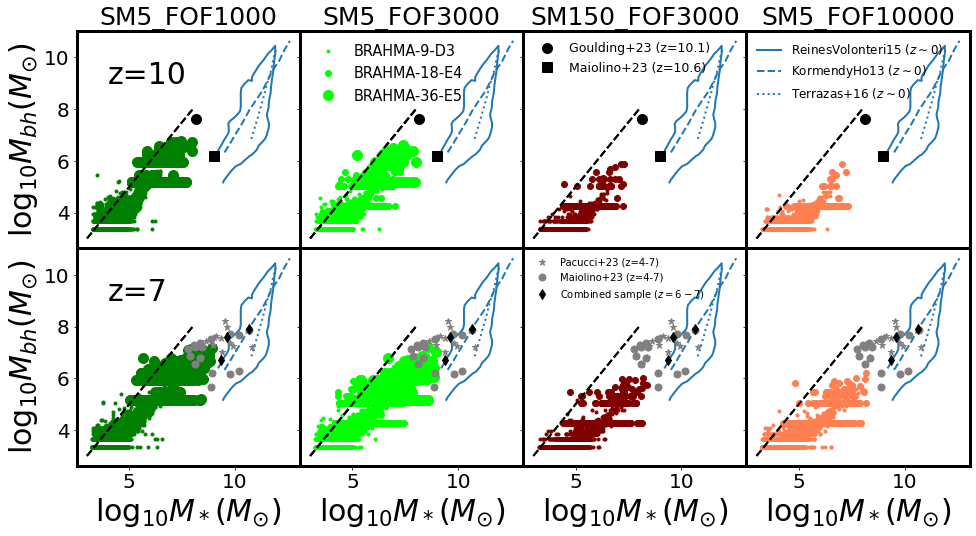

In [32]:



def make_plot(col='black',labl='',labl5='',plot_obs=0,scatter=1,mean=0,marker_size=5):
    j=0
    for desired_redshift in [10,7]:
        
        
        

        GroupMass,o=arepo_package.get_subhalo_property(basePath,'SubhaloMass',desired_redshift)
        
        GroupMassType,o=arepo_package.get_subhalo_property(basePath,'SubhaloMassType',desired_redshift)
        
        GroupSM=GroupMassType[:,4]

        GroupBHMass,o=arepo_package.get_subhalo_property(basePath,'SubhaloBHMass',desired_redshift)
        #GroupBHMass=GroupMassType[:,4]



        
        mask=(GroupBHMass>0)&(GroupSM>0)
        if(scatter==1):
            ax[j,i].errorbar(numpy.log10(GroupSM[mask]*1e10/h),numpy.log10(GroupBHMass[mask]*1e10/h),marker='o',ms=marker_size,linewidth=0,alpha=1,color=col,label=labl)
        if(mean==1):
            a,b,c=arepo_package.mean_plot2(numpy.log10(GroupBHMass[mask]*1e10),numpy.log10(GroupSM[mask]*1e10),False,False,min_x,max_x,Nbins)
            ax[j,i].errorbar(b,a-log10(h),color=col,linewidth=4,zorder=0)
            ax[j,i].fill_between(b,a-log10(h)-c,a-log10(h)+c,color=col,alpha=0.4)

        #ax[j,i].set_yscale('log')
        #ax[j,i].set_xscale('log')
        x_space=numpy.linspace(3,8)
        ax[j,i].errorbar(x_space,x_space,linewidth=2,color='black',linestyle='dashed')

        ax[j,i].tick_params(labelsize=20)
        
        #data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/volonteri.txt')
        #ax[j,i].errorbar(10**data[:,0],10**data[:,1],linestyle='solid',color='black',linewidth=3,label='Reines+Volonteri15')

        if(j==0):
                ax[j,i].set_title('SM%d_FOF%d'%(Msfmp,Mh),fontsize=25)

        #data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/stellar_mass_bulge_mass_Maggorian1998.txt')
        #ax[j,i].errorbar(10**data[:,0],10**data[:,1],linestyle='dashed',color='black',linewidth=3,label='Maggorian+1998')



        #data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/stellar_mass_bulge_mass_Terrazas_2015.txt')
        #ax[j,i].errorbar(10**data[:,0],10**data[:,1],linestyle='dotted',color='black',linewidth=3,label='Terrazas+2015')

            
        j+=1
        

f,ax=plt.subplots(2,4,figsize=(16,8),sharex=True,sharey=True)
     




i=0
Msfmp,Mh=5,1000


marker_size=3
min_x,max_x,Nbins=3,7,10 
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

make_plot('green','',scatter=1,marker_size=marker_size)



marker_size=10
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('green','',marker_size=marker_size)



i=1
Msfmp,Mh=5,3000
marker_size=3
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

make_plot('lime','BRAHMA-9-D3',marker_size=marker_size)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
marker_size=6
make_plot('lime','BRAHMA-18-E4',marker_size=marker_size)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
marker_size=10
make_plot('lime','BRAHMA-36-E5',plot_obs=1,marker_size=marker_size)


i=2
Msfmp,Mh=150,3000


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
marker_size=3
make_plot('maroon','',marker_size=marker_size)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
marker_size=6
make_plot('maroon','',marker_size=marker_size)


i=3
Msfmp,Mh=5,10000

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
marker_size=3
make_plot('coral','',marker_size=marker_size)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
marker_size=6
make_plot('coral','',marker_size=marker_size)


labl5=''
j=1

for j in [0,1]:
    for i in [0,1,2,3]:
            labl6=''
        
            if(i==3)&(j==0):
                    labl6='ReinesVolonteri15 ($z \sim 0$)'
            
            data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/volonteri.txt')
            ax[j,i].errorbar(numpy.log10(10**data[:,0]/h),numpy.log10(10**data[:,1]/h),linestyle='solid',color='C0',linewidth=2,label=labl6)

            if(i==3)&(j==0):
                    labl6='KormendyHo13 ($z \sim 0$)'

            data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/stellar_mass_bulge_mass_Maggorian1998.txt')
            ax[j,i].errorbar(numpy.log10(10**data[:,0]/h),numpy.log10(10**data[:,1]/h),linestyle='dashed',color='C0',linewidth=2,label=labl6)

            if(i==3)&(j==0):
                    labl6='Terrazas+16 ($z \sim 0$)'

            data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/stellar_mass_bulge_mass_Terrazas_2015.txt')
            ax[j,i].errorbar(numpy.log10(10**data[:,0]/h),numpy.log10(10**data[:,1]/h),linestyle='dotted',color='C0',linewidth=2,label=labl6)



for i in [0,1,2,3]:
                data=numpy.loadtxt('/home/aklantbhowmick/Aklant/arepo_code_development/observational_data/Pacucci_2023_mbh_mstar.txt')
                if(i==2):
                    labl5='Pacucci+23 (z=4-7)'
                ax[j,i].errorbar(numpy.log10(10**data[:,0]),numpy.log10(10**data[:,1]),marker='*',linewidth=0,ms=7,color='grey',label=labl5)

                if(i==2):
                    labl5='Maiolino+23 (z=4-7)'

                data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/Maiolino_SM_BHM.txt')
                ax[j,i].errorbar(numpy.log10(10**data[:,0]),numpy.log10(10**data[:,1]),marker='o',linewidth=0,ms=7,color='grey',label=labl5)


                data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/z6-7.txt')
                if(i==2):
                    labl5='Combined sample ($z=6-7$)'
                ax[j,i].errorbar(data[:,3],data[:,1],xerr=data[:,4],yerr=data[:,2],marker='d',linewidth=0,ms=7,color='black',label=labl5)
                labl=''
                labl5=''

j=0
for i in [0,1,2,3]:
                if(i==2):
                    labl5='Goulding+23 (z=10.1)'
                ax[j,i].errorbar([numpy.log10(1.4e8)],[numpy.log10((4e7))],marker='o',linewidth=0,ms=10,color='black',label=labl5)
                labl5=''

j=0
for i in [0,1,2,3]:
                if(i==2):
                    labl5='Maiolino+23 (z=10.6)'
                ax[j,i].errorbar([numpy.log10(1e9)],[numpy.log10(1.6e6)],marker='s',linewidth=0,ms=10,color='black',label=labl5)
                labl5=''






for i in [0,1,2,3]:
    ax[1,i].set_xlabel('$\log_{10}M_*(M_{\odot})$',fontsize=30)


#ax[0,0].axhline(8e5)

#ax[2,1].legend(loc='lower right',fontsize=11,frameon=False)

ax[0,1].legend(loc='upper left',fontsize=14.5,frameon=False)
ax[0,2].legend(loc='upper left',fontsize=12.5,frameon=False)
ax[0,3].legend(loc='upper left',fontsize=12,frameon=False)
ax[1,2].legend(loc='upper left',fontsize=10,frameon=False)
#ax[2,2].legend(loc='upper left',fontsize=9,frameon=False)

ax[0,0].set_ylabel('$\log_{10}M_{bh}(M_{\odot})$',fontsize=30)

ax[1,0].set_ylabel('$\log_{10}M_{bh}(M_{\odot})$',fontsize=30)

#ax[2,0].set_ylabel('$\log_{10}M_{bh}(M_{\odot}/h)$',fontsize=20)

#ax[0,0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=30)


#ax[2,0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=40)

#ax[3,0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=40)


ax[0,0].text(4,9,'z=10',fontsize=30)

ax[1,0].text(4,9,'z=7',fontsize=30)


for axx in ax.flatten():
    axx.spines['top'].set_linewidth(3)    # Top axis
    axx.spines['bottom'].set_linewidth(3) # Bottom axis
    axx.spines['left'].set_linewidth(3)   # Left axis
    axx.spines['right'].set_linewidth(3) 

#ax[2,0].text(4,9,'z=7',fontsize=30)

#ax[0,2].text(1e4,1e7,'SM5_FOF10000',fontsize=30)






plt.subplots_adjust(wspace=0,hspace=0)
plt.savefig('./Paper6_figures/SM_BHM.png',bbox_inches='tight')


In [33]:
import numpy
import arepo_package
def do():
        GroupMass,o=arepo_package.get_subhalo_property(basePath,'SubhaloMass',desired_redshift)
        GroupMassType,o=arepo_package.get_subhalo_property(basePath,'SubhaloMassType',desired_redshift)
        GroupSM=GroupMassType[:,4]
        GroupBHMass,o=arepo_package.get_subhalo_property(basePath,'SubhaloBHMass',desired_redshift)
        numpy.save('./subhalo_data_z%d.npy'%desired_redshift,[GroupBHMass,GroupSM,GroupMass])


basePath=<please add the path to TNG300 and TNG100 >


for desired_redshift in [10,7,5,3,0]:
    do()
        
        #GroupBHMass=GroupMassType[:,4]

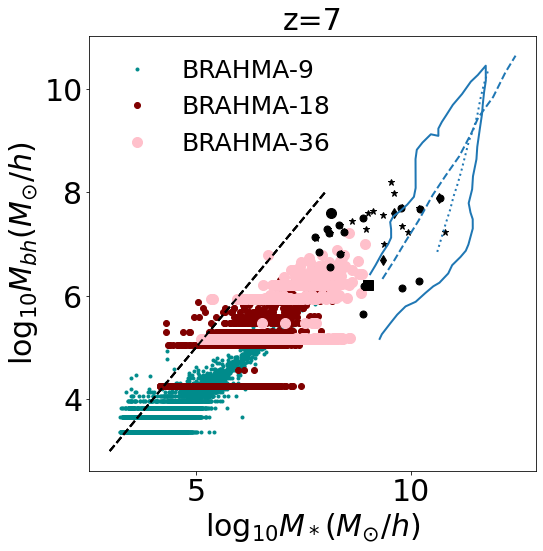

In [31]:



def make_plot(col='black',labl='',labl5='',plot_obs=0,scatter=1,mean=0,marker_size=5):
    j=0
    for desired_redshift in [7]:
        
        
        

        GroupMass,o=arepo_package.get_subhalo_property(basePath,'SubhaloMass',desired_redshift)
        
        GroupMassType,o=arepo_package.get_subhalo_property(basePath,'SubhaloMassType',desired_redshift)
        
        GroupSM=GroupMassType[:,4]

        GroupBHMass,o=arepo_package.get_subhalo_property(basePath,'SubhaloBHMass',desired_redshift)
        #GroupBHMass=GroupMassType[:,4]



        
        mask=(GroupBHMass>0)&(GroupSM>0)
        if(scatter==1):
            ax.errorbar(numpy.log10(GroupSM[mask]*1e10/h),numpy.log10(GroupBHMass[mask]*1e10/h),marker='o',ms=marker_size,linewidth=0,alpha=1,color=col,label=labl)
        if(mean==1):
            a,b,c=arepo_package.mean_plot2(numpy.log10(GroupBHMass[mask]*1e10),numpy.log10(GroupSM[mask]*1e10),False,False,min_x,max_x,Nbins)
            ax.errorbar(b,a-log10(h),color=col,linewidth=4,zorder=0)
            ax.fill_between(b,a-c-log10(h),a+c-log10(h),color=col,alpha=0.4)

        #ax[j,i].set_yscale('log')
        #ax[j,i].set_xscale('log')
        x_space=numpy.linspace(3,8)
        ax.errorbar(x_space,x_space,linewidth=2,color='black',linestyle='dashed')

        ax.tick_params(labelsize=30)
        
        #data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/volonteri.txt')
        #ax[j,i].errorbar(10**data[:,0],10**data[:,1],linestyle='solid',color='black',linewidth=3,label='Reines+Volonteri15')

        if(j==0):
                ax.set_title('SM%d_FOF%d'%(Msfmp,Mh),fontsize=25)

        #data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/stellar_mass_bulge_mass_Maggorian1998.txt')
        #ax[j,i].errorbar(10**data[:,0],10**data[:,1],linestyle='dashed',color='black',linewidth=3,label='Maggorian+1998')



        #data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/stellar_mass_bulge_mass_Terrazas_2015.txt')
        #ax[j,i].errorbar(10**data[:,0],10**data[:,1],linestyle='dotted',color='black',linewidth=3,label='Terrazas+2015')

            
        j+=1
        

f,ax=plt.subplots(1,1,figsize=(8,8),sharex=True,sharey=True)
     




Msfmp,Mh=5,3000
marker_size=3
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

make_plot('darkcyan','BRAHMA-9',marker_size=marker_size)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
marker_size=6
make_plot('maroon','BRAHMA-18',marker_size=marker_size)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
marker_size=10
make_plot('pink','BRAHMA-36',plot_obs=1,marker_size=marker_size)




labl5=''
j=1
for i in [0]:
                data=numpy.loadtxt('/home/aklantbhowmick/Aklant/arepo_code_development/observational_data/Pacucci_2023_mbh_mstar.txt')
                if(i==2):
                    labl5='Pacucci+23 (z=4-7)'
                ax.errorbar(numpy.log10(10**data[:,0]),numpy.log10(10**data[:,1]),marker='*',linewidth=0,ms=7,color='black',label=labl5)

                if(i==2):
                    labl5='Maiolino+23 (z=4-7)'

                data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/Maiolino_SM_BHM.txt')
                ax.errorbar(numpy.log10(10**data[:,0]),numpy.log10(10**data[:,1]),marker='o',linewidth=0,ms=7,color='black',label=labl5)


                data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/z6-7.txt')
                if(i==2):
                    labl5='Combined sample ($z=6-7$)'
                ax.errorbar(data[:,3],data[:,1],xerr=data[:,4],yerr=data[:,2],marker='d',linewidth=0,ms=7,color='black',label=labl5)
                labl=''
                labl5=''

j=0
for i in [0]:
                if(i==2):
                    labl5='Goulding+23 (z=10.1)'
                ax.errorbar([numpy.log10(1.4e8)],[numpy.log10((4e7))],marker='o',linewidth=0,ms=10,color='black',label=labl5)
                labl5=''

j=0
for i in [0]:
                if(i==2):
                    labl5='Maiolino+23 (z=10.6)'
                ax.errorbar([numpy.log10(1e9)],[numpy.log10(1.6e6)],marker='s',linewidth=0,ms=10,color='black',label=labl5)
                labl5=''



for j in [0]:
    for i in [0]:
            labl6=''
        
            if(i==3)&(j==0):
                    labl6='ReinesVolonteri15 ($z \sim 0$)'
            
            data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/volonteri.txt')
            ax.errorbar(numpy.log10(10**data[:,0]),numpy.log10(10**data[:,1]/h),linestyle='solid',color='C0',linewidth=2,label=labl6)

            if(i==3)&(j==0):
                    labl6='KormendyHo13 ($z \sim 0$)'

            data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/stellar_mass_bulge_mass_Maggorian1998.txt')
            ax.errorbar(numpy.log10(10**data[:,0]),numpy.log10(10**data[:,1]/h),linestyle='dashed',color='C0',linewidth=2,label=labl6)

            if(i==3)&(j==0):
                    labl6='Terrezas+15 ($z \sim 0$)'

            data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/stellar_mass_bulge_mass_Terrazas_2015.txt')
            ax.errorbar(numpy.log10(10**data[:,0]),numpy.log10(10**data[:,1]/h),linestyle='dotted',color='C0',linewidth=2,label=labl6)



for i in [0]:
    ax.set_xlabel('$\log_{10}M_*(M_{\odot}/h)$',fontsize=30)


#ax[0,0].axhline(8e5)

#ax[2,1].legend(loc='lower right',fontsize=11,frameon=False)

ax.legend(loc='upper left',fontsize=25,frameon=False)
#ax.legend(loc='upper left',fontsize=12.5,frameon=False)
#ax.legend(loc='upper left',fontsize=12,frameon=False)
#ax.legend(loc='upper left',fontsize=10,frameon=False)
#ax[2,2].legend(loc='upper left',fontsize=9,frameon=False)

ax.set_ylabel('$\log_{10}M_{bh}(M_{\odot}/h)$',fontsize=30)

#ax.set_ylabel('$\log_{10}M_{bh}(M_{\odot}/h)$',fontsize)

#ax[2,0].set_ylabel('$\log_{10}M_{bh}(M_{\odot}/h)$',fontsize=20)

#ax[0,0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=30)


#ax[2,0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=40)

#ax[3,0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=40)


#ax.text(4,9,'z=10',fontsize=30)

ax.set_title('z=7',fontsize=30)

#ax[2,0].text(4,9,'z=7',fontsize=30)

#ax[0,2].text(1e4,1e7,'SM5_FOF10000',fontsize=30)






plt.subplots_adjust(wspace=0,hspace=0)
#plt.savefig('./Paper6_figures/SM_BHM.png',bbox_inches='tight')


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


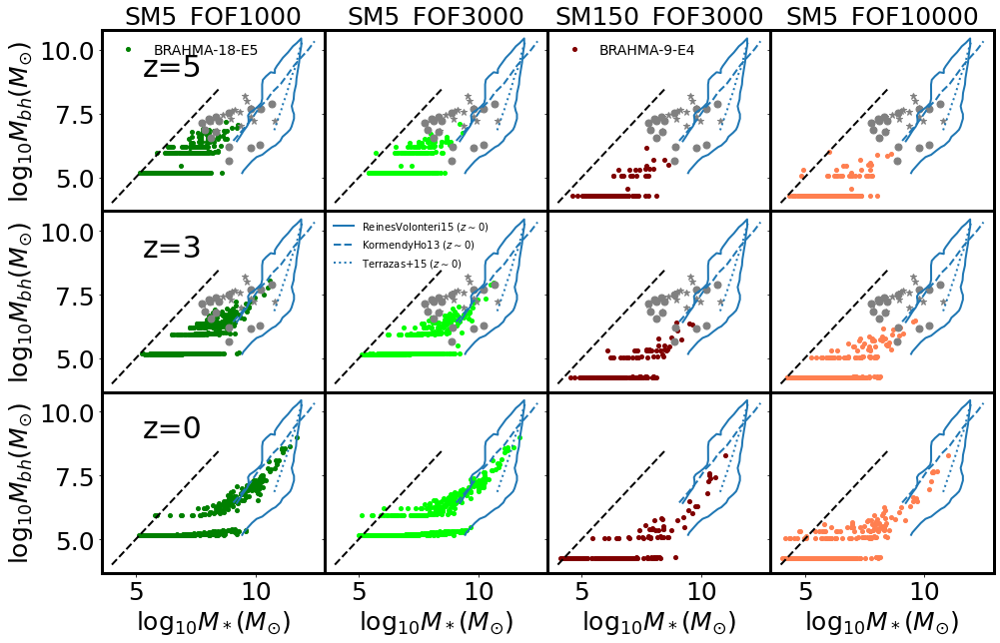

In [30]:



def make_plot(col='black',labl='',labl5='',plot_obs=0,marker_size=8):
    j=0
    for desired_redshift in [5,3,0]:
        
        
        ax=axx[j,k]

        GroupMass,o=arepo_package.get_subhalo_property(basePath,'SubhaloMass',desired_redshift)
        
        GroupMassType,o=arepo_package.get_subhalo_property(basePath,'SubhaloMassType',desired_redshift)
        
        GroupSM=GroupMassType[:,4]

        GroupBHMass,o=arepo_package.get_subhalo_property(basePath,'SubhaloBHMass',desired_redshift)
        #GroupBHMass=GroupMassType[:,4]




        mask=(GroupBHMass>0)&(GroupSM>0)
        ax.errorbar(numpy.log10(GroupSM[mask]*1e10/h),numpy.log10(GroupBHMass[mask]*1e10/h),marker='o',ms=4,linewidth=0,alpha=1,color=col,label=labl)

        #a,b,c=arepo_package.mean_plot2(numpy.log10(GroupBHMass[mask]*1e10),numpy.log10(GroupSM[mask]*1e10),False,False,min_x,max_x,Nbins)
        #ax.errorbar(b,a,color=col,linewidth=8)

        #ax.set_yscale('log')
        #ax.set_xscale('log')
        x_space=numpy.linspace(4,8.5)
        ax.errorbar(x_space,x_space,linewidth=2,color='black',linestyle='dashed')

        ax.tick_params(labelsize=25)
        
        if(j==0):
                ax.set_title('SM%d_FOF%d'%(Msfmp,Mh),fontsize=25)
            
        j+=1
f,axx=plt.subplots(3,4,figsize=(16,10),sharex=True,sharey=True)
min_x,max_x,Nbins=3,7,10      


marker_size=8
k=0
Msfmp,Mh=5,1000

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('green','BRAHMA-18-E5',marker_size=marker_size)




k=1
Msfmp,Mh=5,3000


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot('lime','',marker_size=marker_size)

marker_size=5
k=2
Msfmp,Mh=150,3000


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot('maroon','BRAHMA-9-E4',marker_size=marker_size)

k=3
Msfmp,Mh=5,10000


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot('coral','',marker_size=marker_size)









labl5=''
j=0

for k in [0,1,2,3]:
    for i in [0,1]:
                    ax=axx[i,k]
                    data=numpy.loadtxt('/home/aklantbhowmick/Aklant/arepo_code_development/observational_data/Pacucci_2023_mbh_mstar.txt')
                    if(i==2):
                        labl5='Pacucci+23 (z=4-7)'
                    ax.errorbar(numpy.log10(10**data[:,0]),numpy.log10(10**data[:,1]),marker='*',linewidth=0,ms=7,color='grey',label=labl5)

                    if(i==2):
                        labl5='Maiolino+23 (z=4-7)'

                    data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/Maiolino_SM_BHM.txt')
                    ax.errorbar(numpy.log10(10**data[:,0]),numpy.log10(10**data[:,1]),marker='o',linewidth=0,ms=7,color='grey',label=labl5)


                    data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/z6-7.txt')
                    labl=''
                    labl5=''



    for i in [0,1,2]:
                ax=axx[i,k]
                labl6=''

                if(i==1)&(k==1):
                        labl6='ReinesVolonteri15 ($z \sim 0$)'

                data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/volonteri.txt')
                ax.errorbar(numpy.log10(10**data[:,0]/h),numpy.log10(10**data[:,1]/h),linestyle='solid',color='C0',linewidth=2,label=labl6)

                if(i==1)&(k==1):
                        labl6='KormendyHo13 ($z \sim 0$)'

                data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/stellar_mass_bulge_mass_KoHo2013.txt')
                ax.errorbar(numpy.log10(10**data[:,0]/h),numpy.log10(10**data[:,1]/h),linestyle='dashed',color='C0',linewidth=2,label=labl6)

                if(i==1)&(k==1):
                        labl6='Terrazas+15 ($z \sim 0$)'

                data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/stellar_mass_bulge_mass_Terrazas_2015.txt')
                ax.errorbar(numpy.log10(10**data[:,0]/h),numpy.log10(10**data[:,1]/h),linestyle='dotted',color='C0',linewidth=2,label=labl6)



for i in [0,1,2,3]:
    axx[2,i].set_xlabel('$\log_{10}M_*(M_{\odot})$',fontsize=25)




axx[1,0].set_ylabel('$\log_{10}M_{bh}(M_{\odot})$',fontsize=25)
axx[2,0].set_ylabel('$\log_{10}M_{bh}(M_{\odot})$',fontsize=25)
#axx[3,0].set_ylabel('$\log_{10}M_{bh}(M_{\odot}/h)$',fontsize=20)
axx[0,0].set_ylabel('$\log_{10}M_{bh}(M_{\odot})$',fontsize=25)

#axx[0,0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=30)


#axx[1,0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=40)

#axx[2,0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=40)


#ax[0,0].text(1e4,1e7,'z=7',fontsize=30)

#ax[1,0].text(1e4,1e7,'z=10',fontsize=30)

#ax[2,0].text(1e4,1e7,'z=11',fontsize=30)

#ax[0,2].text(1e4,1e7,'SM5_FOF10000',fontsize=30)

axx[0,0].legend(loc='upper left',fontsize=14,frameon=False)
axx[0,2].legend(loc='upper left',fontsize=14,frameon=False)
axx[1,1].legend(loc='upper left',fontsize=10,frameon=False)
axx[2,1].legend(loc='upper left',fontsize=10,frameon=False)

axx[0,0].text(5.3,9,'z=5',fontsize=30)

axx[1,0].text(5.3,9,'z=3',fontsize=30)

axx[2,0].text(5.3,9,'z=0',fontsize=30)

#axx[2,1].text(5.3,9,'z=0',fontsize=30)
#axx[2,2].text(5.3,9,'z=0.5',fontsize=30)
#axx[2,3].text(5.3,9,'z=0.5',fontsize=30)


for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3) 




plt.subplots_adjust(wspace=0,hspace=0)
plt.savefig('./Paper6_figures/SM_BHM_z0.png',bbox_inches='tight')


In [24]:
total_conv

1.1685655857435003e+47

Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  7
Output redshift:  7.00541704554

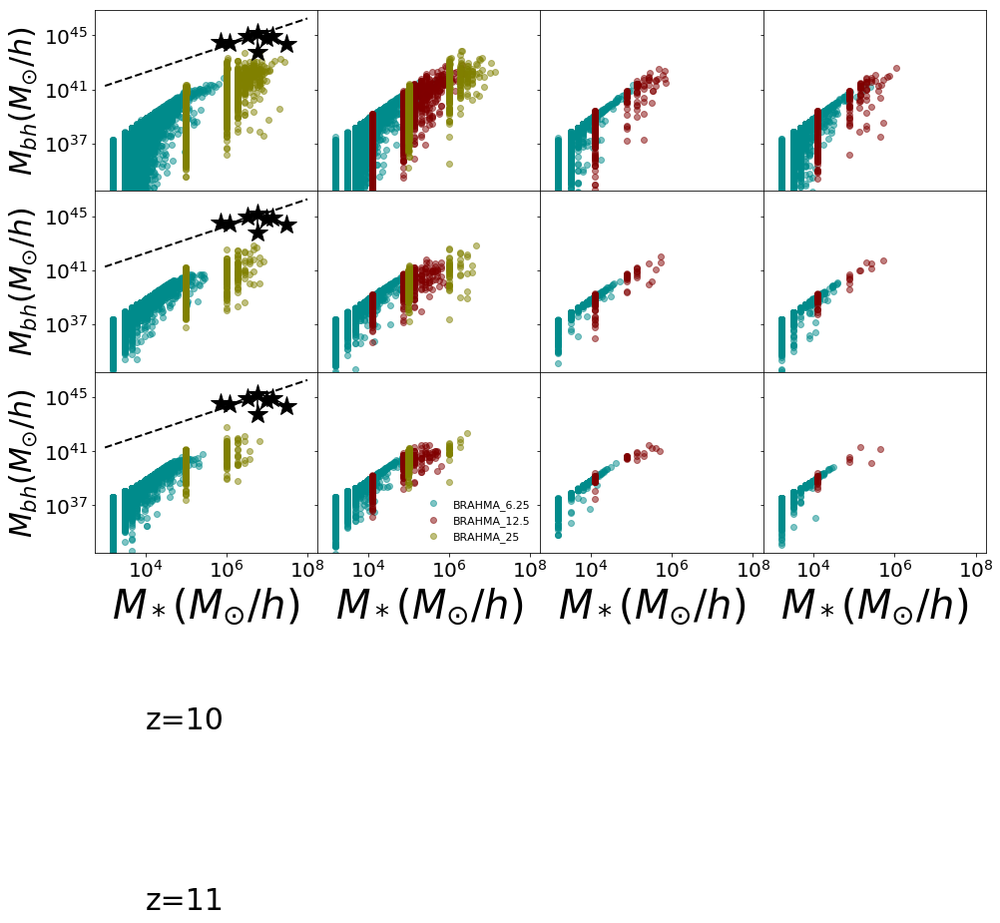

In [31]:



def make_plot(col='black',labl=''):
    j=0
    for desired_redshift in [7,10,11]:
        
        
    
        BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,desired_redshift)
        #GroupBHMass=GroupMassType[:,4]
        BH_Mdot,o=arepo_package.get_particle_property(basePath,'BH_Mdot',5,desired_redshift)
        BH_Lum=BH_Mdot*total_conv




        ax[j,i].errorbar(BH_Mass*1e10,BH_Lum,marker='o',linewidth=0,alpha=0.5,color=col,label=labl)
        #mask=(GroupBHMass>0)&(GroupSM>0)
        #a,b,c=arepo_package.mean_plot2(numpy.log10(GroupBHMass[mask]*1e10),numpy.log10(GroupSM[mask]*1e10),False,False,min_x,max_x,Nbins)
        #ax[j,i].errorbar(10**b,10**a,color=col,linewidth=8)

        ax[j,i].set_yscale('log')
        ax[j,i].set_xscale('log')


        ax[j,i].tick_params(labelsize=20)
        
        #data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/volonteri.txt')
        #ax[j,i].errorbar(10**data[:,0],10**data[:,1],linestyle='solid',color='black',linewidth=3,label='Reines+Volonteri15')



        #data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/stellar_mass_bulge_mass_Maggorian1998.txt')
        #ax[j,i].errorbar(10**data[:,0],10**data[:,1],linestyle='dashed',color='black',linewidth=3,label='Maggorian+1998')



        #data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/stellar_mass_bulge_mass_Terrazas_2015.txt')
        #ax[j,i].errorbar(10**data[:,0],10**data[:,1],linestyle='dotted',color='black',linewidth=3,label='Terrazas+2015')
        #if(desired_redshift==7):
        #    data=numpy.loadtxt('/home/aklantbhowmick/Aklant/arepo_code_development/observational_data/Pacucci_2023_mbh_mstar.txt')
        #    ax[j,i].errorbar(10**data[:,0]*0.7,10**data[:,1]*0.7,marker='*',linewidth=0,ms=7,color='black')

        #if(desired_redshift==10): 
        #    ax[j,i].errorbar([1.4e8*0.7],[4e7*0.7],marker='o',linewidth=0,ms=10,color='black')
            
            
        #if(desired_redshift==11): 
        #    ax[j,i].errorbar([1e9*0.7],[1.6e6*0.7],marker='s',linewidth=0,ms=10,color='black')

            

        
        #if(j==0):
        #    ax[j,i].set_title('SM%d_FOF%d'%(Msfmp,Mh),fontsize=25)
        #    
        #data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/volonteri.txt')
        #ax[j,i].errorbar(10**data[:,0],10**data[:,1],linestyle='solid',color='grey',linewidth=2)



        #data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/stellar_mass_bulge_mass_Maggorian1998.txt')
        #ax[j,i].errorbar(10**data[:,0],10**data[:,1],linestyle='dashed',color='grey',linewidth=2)



        #data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/stellar_mass_bulge_mass_Terrazas_2015.txt')
        #ax[j,i].errorbar(10**data[:,0],10**data[:,1],linestyle='dotted',color='grey',linewidth=2)

            
        j+=1
f,ax=plt.subplots(3,4,figsize=(16,10),sharex=True,sharey=True)
min_x,max_x,Nbins=3,7,10      




i=0
Msfmp,Mh=5,1000

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

make_plot('darkcyan','')



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('olive','')


i=1
Msfmp,Mh=5,3000

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

make_plot('darkcyan','BRAHMA_6.25')


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('maroon','BRAHMA_12.5')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('olive','BRAHMA_25')





i=2
Msfmp,Mh=150,3000


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

make_plot('darkcyan','L6p25n1024')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('maroon','L12p5n1024')




i=3
Msfmp,Mh=5,10000

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

make_plot('darkcyan','L6p25n1024')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('maroon','L12p5n1024')



for i in [0,1,2,3]:
    ax[2,i].set_xlabel('$M_*(M_{\odot}/h)$',fontsize=40)


#ax[0,0].axhline(8e5)

ax[2,1].legend(loc='lower right',fontsize=11,frameon=False)
ax[0,0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=30)

ax[1,0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=30)

ax[2,0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=30)

#ax[2,0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=40)

#ax[3,0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=40)


ax[0,0].text(1e4,1e7,'z=7',fontsize=30)

ax[1,0].text(1e4,1e7,'z=10',fontsize=30)

ax[2,0].text(1e4,1e7,'z=11',fontsize=30)
             
             
data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/mbh_lbolm.txt')
             


BH_masses_for_id=numpy.logspace(3,8)

Lbol_eddington=BH_masses_for_id*1.26e38/0.7

for i in [0,1,2]:
    ax[i,0].errorbar(10**data[:,0]*0.7,10**data[:,1],label='z=4-7',color='black',marker='*',ms=20)
    ax[i,0].errorbar(BH_masses_for_id,Lbol_eddington,label='z=4-7',color='black',ms=20,linewidth=2,linestyle='dashed')


#ax[0,2].text(1e4,1e7,'SM5_FOF10000',fontsize=30)






plt.subplots_adjust(wspace=0,hspace=0)
plt.savefig('./Paper6_figures/BHM_Lum.png',bbox_inches='tight')


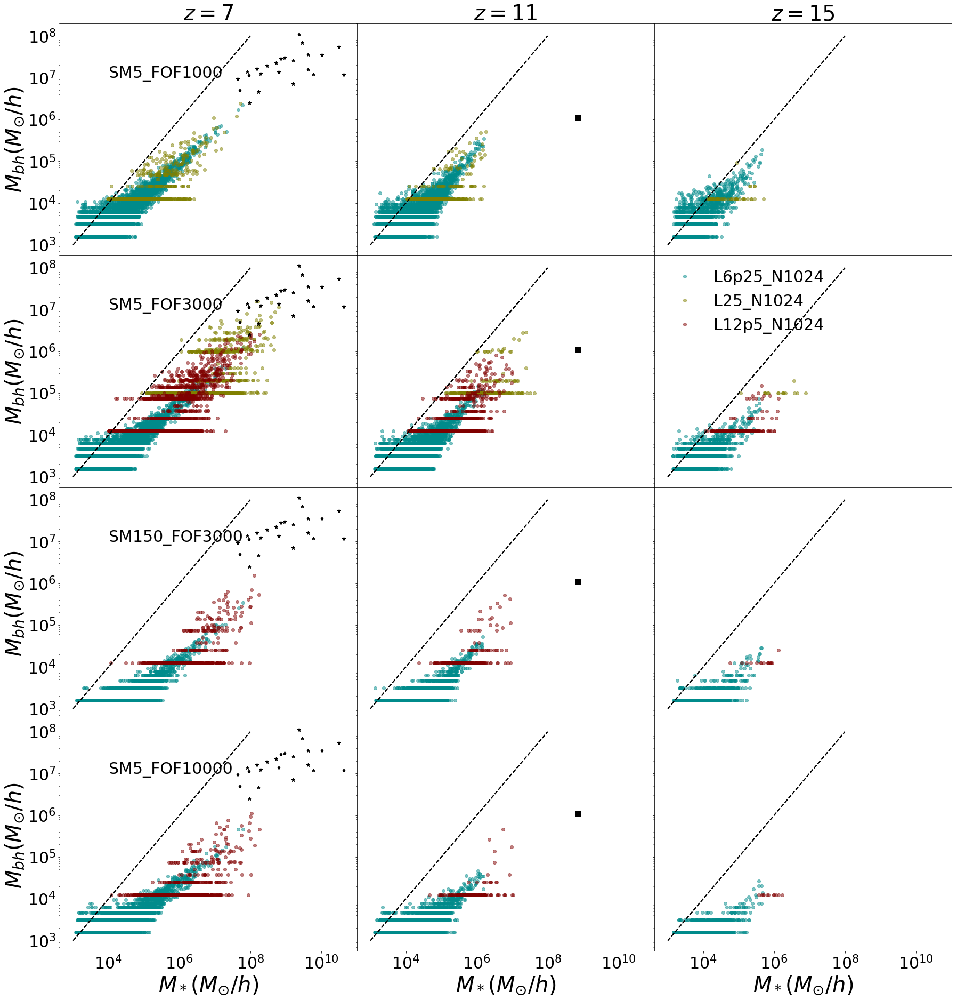

In [21]:



def make_plot(col='black',labl=''):
    i=0
    for desired_redshift in [7,11,15]:
        
        
        

        GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',desired_redshift)
        
        GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
        
        GroupSM=GroupMassType[:,4]

        GroupBHMass,o=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift)
        #GroupBHMass=GroupMassType[:,4]




        ax[j,i].errorbar(GroupSM*1e10,GroupBHMass*1e10,marker='o',linewidth=0,alpha=0.5,color=col,label=labl)
        mask=(GroupBHMass>0)&(GroupSM>0)
        a,b,c=arepo_package.mean_plot2(numpy.log10(GroupBHMass[mask]*1e10),numpy.log10(GroupSM[mask]*1e10),False,False,min_x,max_x,Nbins)
        #ax[j,i].errorbar(10**b,10**a,color=col,linewidth=8)

        ax[j,i].set_yscale('log')
        ax[j,i].set_xscale('log')
        x_space=numpy.logspace(3,8)
        ax[j,i].errorbar(x_space,x_space,linewidth=2,color='black',linestyle='dashed')

        ax[j,i].tick_params(labelsize=30)
        
        #data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/volonteri.txt')
        #ax[j,i].errorbar(10**data[:,0],10**data[:,1],linestyle='solid',color='black',linewidth=3,label='Reines+Volonteri15')



        #data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/stellar_mass_bulge_mass_Maggorian1998.txt')
        #ax[j,i].errorbar(10**data[:,0],10**data[:,1],linestyle='dashed',color='black',linewidth=3,label='Maggorian+1998')



        #data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/stellar_mass_bulge_mass_Terrazas_2015.txt')
        #ax[j,i].errorbar(10**data[:,0],10**data[:,1],linestyle='dotted',color='black',linewidth=3,label='Terrazas+2015')
        if(desired_redshift==7):
            data=numpy.loadtxt('/home/aklantbhowmick/Aklant/arepo_code_development/observational_data/Pacucci_2023_mbh_mstar.txt')
            ax[j,i].errorbar(10**data[:,0]*0.7,10**data[:,1]*0.7,marker='*',linewidth=0,ms=7,color='black')
        
        if(desired_redshift==11): 
            ax[j,i].errorbar([1e9*0.7],[1.6e6*0.7],marker='s',linewidth=0,ms=10,color='black')

            
        if(j==3):
            ax[j,i].set_xlabel('$M_*(M_{\odot}/h)$',fontsize=40)
        
        if(j==0):
            ax[j,i].set_title('$z=%d$'%desired_redshift,fontsize=40)
        i+=1
f,ax=plt.subplots(4,3,figsize=(30,32),sharex=True,sharey=True)
min_x,max_x,Nbins=3,7,10      


j=0
Msfmp,Mh=5,1000

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

make_plot('darkcyan','L6p25_N1024')


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6_lin/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('olive','L25_N1024')





j=1
Msfmp,Mh=5,3000

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

make_plot('darkcyan','L6p25_N1024')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('olive','L25_N1024')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('maroon','L12p5_N1024')



j=2
Msfmp,Mh=150,3000


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

make_plot('darkcyan','L6p25n1024')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('maroon','L12p5n1024')




j=3
Msfmp,Mh=5,10000

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

make_plot('darkcyan','L6p25n1024')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('maroon','L12p5n1024')






#ax[0,0].axhline(8e5)

ax[1,2].legend(loc='upper left',fontsize=30,frameon=False)
ax[0,0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=40)

ax[1,0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=40)

ax[2,0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=40)

ax[3,0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=40)

ax[0,0].text(1e4,1e7,'SM5_FOF1000',fontsize=30)

ax[1,0].text(1e4,1e7,'SM5_FOF3000',fontsize=30)

ax[2,0].text(1e4,1e7,'SM150_FOF3000',fontsize=30)

ax[3,0].text(1e4,1e7,'SM5_FOF10000',fontsize=30)






plt.subplots_adjust(wspace=0,hspace=0)
plt.savefig('./Paper6_figures/SM_BHM.png',bbox_inches='tight')


1000 5 7.005417045544533
[2.2337024e-04 1.7182859e-04 5.1342489e-05 ... 0.0000000e+00 0.0000000e+00
 0.0000000e+00]
1000 5 10.975643294137885
[2.9547195e-05 3.4555655e-05 2.2993952e-05 ... 0.0000000e+00 0.0000000e+00
 0.0000000e+00]
1000 5 14.989173240042412
[1.4698456e-05 1.3127076e-05 1.8761510e-05 ... 0.0000000e+00 0.0000000e+00
 0.0000000e+00]
1000 5 7.005417045544533
[2.3880409e-04 1.2006702e-04 4.9586459e-05 ... 0.0000000e+00 0.0000000e+00
 0.0000000e+00]
1000 5 10.975643294137885
[1.1713933e-05 2.5654064e-05 1.2419756e-05 ... 0.0000000e+00 0.0000000e+00
 0.0000000e+00]
1000 5 14.989173240042412
[0.0000000e+00 0.0000000e+00 1.2501774e-06 ... 0.0000000e+00 0.0000000e+00
 0.0000000e+00]
1000 5 7.005417045544533
[0.00030107 0.00025578 0.00031567 ... 0.         0.         0.        ]
1000 5 10.975643294137885
[6.2521044e-06 1.3758818e-05 8.7559958e-05 ... 0.0000000e+00 0.0000000e+00
 0.0000000e+00]
1000 5 14.989173240042412
[0.0000000e+00 0.0000000e+00 1.2500938e-06 ... 0.0000000e+00

No handles with labels found to put in legend.


10000 5 14.989173240042412
[0. 0. 0. ... 0. 0. 0.]


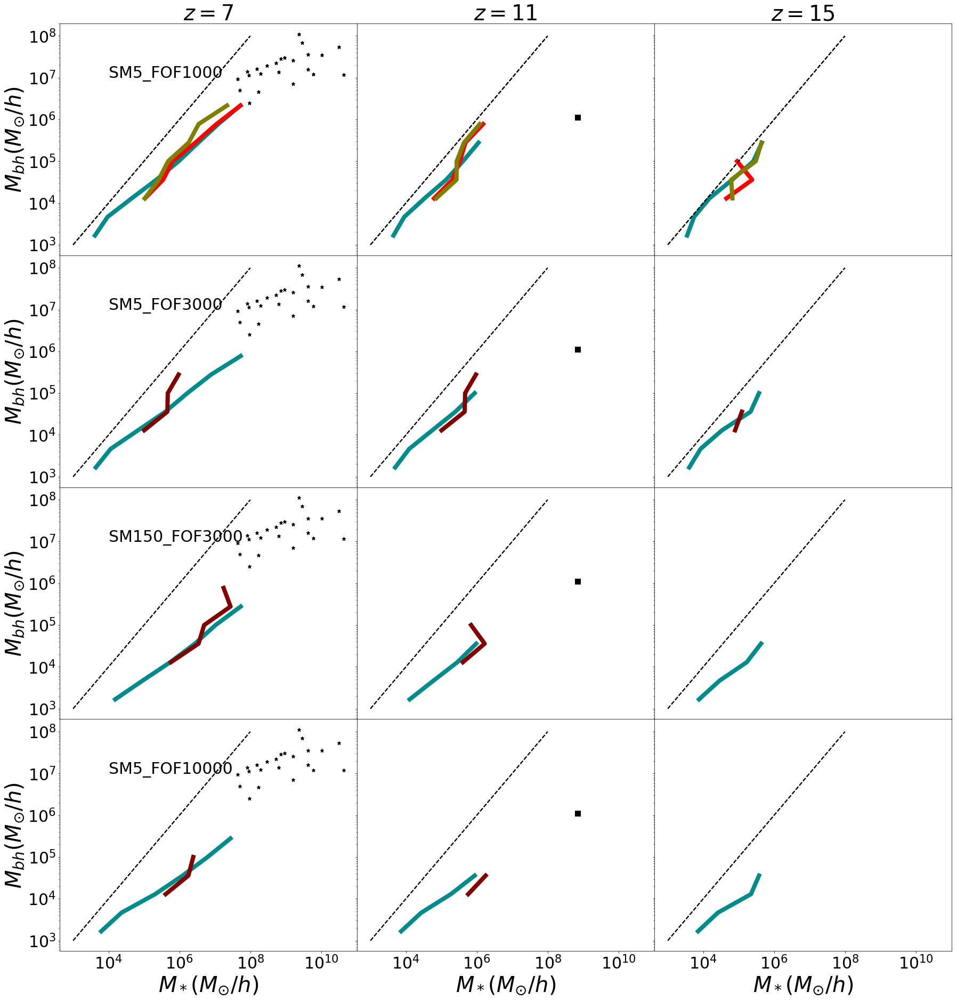

In [22]:



def make_plot(col='black',labl=''):
    i=0
    for desired_redshift in [7,11,15]:
        
        
        
        
        GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',desired_redshift)
        print(Mh,Msfmp,o)
        
        GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
        
        GroupSM=GroupMassType[:,4]

        GroupBHMass,o=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift)
        print(GroupBHMass)
        #GroupBHMass=GroupMassType[:,4]




        #ax[j,i].errorbar(GroupSM*1e10,GroupBHMass*1e10,marker='o',linewidth=0,alpha=0.5,color=col,label=labl)
        mask=(GroupBHMass>0)&(GroupSM>0)
        a,b,c=arepo_package.mean_plot2(numpy.log10(GroupBHMass[mask]*1e10),numpy.log10(GroupSM[mask]*1e10),False,False,min_x,max_x,Nbins)
        ax[j,i].errorbar(10**b,10**a,color=col,linewidth=8)

        ax[j,i].set_yscale('log')
        ax[j,i].set_xscale('log')
        x_space=numpy.logspace(3,8)
        ax[j,i].errorbar(x_space,x_space,linewidth=2,color='black',linestyle='dashed')

        ax[j,i].tick_params(labelsize=30)
        
        #data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/volonteri.txt')
        #ax[j,i].errorbar(10**data[:,0],10**data[:,1],linestyle='solid',color='black',linewidth=3,label='Reines+Volonteri15')



        #data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/stellar_mass_bulge_mass_Maggorian1998.txt')
        #ax[j,i].errorbar(10**data[:,0],10**data[:,1],linestyle='dashed',color='black',linewidth=3,label='Maggorian+1998')



        #data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/stellar_mass_bulge_mass_Terrazas_2015.txt')
        #ax[j,i].errorbar(10**data[:,0],10**data[:,1],linestyle='dotted',color='black',linewidth=3,label='Terrazas+2015')
        if(desired_redshift==7):
            data=numpy.loadtxt('/home/aklantbhowmick/Aklant/arepo_code_development/observational_data/Pacucci_2023_mbh_mstar.txt')
            ax[j,i].errorbar(10**data[:,0]*0.7,10**data[:,1]*0.7,marker='*',linewidth=0,ms=7,color='black')
        
        if(desired_redshift==11): 
            ax[j,i].errorbar([1e9*0.7],[1.6e6*0.7],marker='s',linewidth=0,ms=10,color='black')

            
        if(j==3):
            ax[j,i].set_xlabel('$M_*(M_{\odot}/h)$',fontsize=40)
        
        if(j==0):
            ax[j,i].set_title('$z=%d$'%desired_redshift,fontsize=40)
        i+=1
f,ax=plt.subplots(4,3,figsize=(30,32),sharex=True,sharey=True)
min_x,max_x,Nbins=3,7,10      


j=0
Msfmp,Mh=5,1000

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

make_plot('darkcyan','L6p25_N1024')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6_lin/'%(Msfmp,Mh)
basePath=path_to_output+run+output


make_plot('red','L25_N1024')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('olive','L25_N1024')





j=1
Msfmp,Mh=5,3000

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

make_plot('darkcyan','L6p25_N1024')


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('maroon','L12p5_N1024')



j=2
Msfmp,Mh=150,3000


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

make_plot('darkcyan','L6p25_N1024')


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('maroon','L12p5_N1024')




j=3
Msfmp,Mh=5,10000

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output

make_plot('darkcyan','L6p25_N1024')


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output

make_plot('maroon','L12p5_N1024')






#ax[0,0].axhline(8e5)

ax[1,2].legend(loc='upper left',fontsize=30,frameon=False)
ax[0,0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=40)

ax[1,0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=40)

ax[2,0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=40)

ax[3,0].set_ylabel('$M_{bh}(M_{\odot}/h)$',fontsize=40)

ax[0,0].text(1e4,1e7,'SM5_FOF1000',fontsize=30)

ax[1,0].text(1e4,1e7,'SM5_FOF3000',fontsize=30)

ax[2,0].text(1e4,1e7,'SM150_FOF3000',fontsize=30)

ax[3,0].text(1e4,1e7,'SM5_FOF10000',fontsize=30)






plt.subplots_adjust(wspace=0,hspace=0)
plt.savefig('./Paper6_figures/SM_BHM.png',bbox_inches='tight')


Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output 

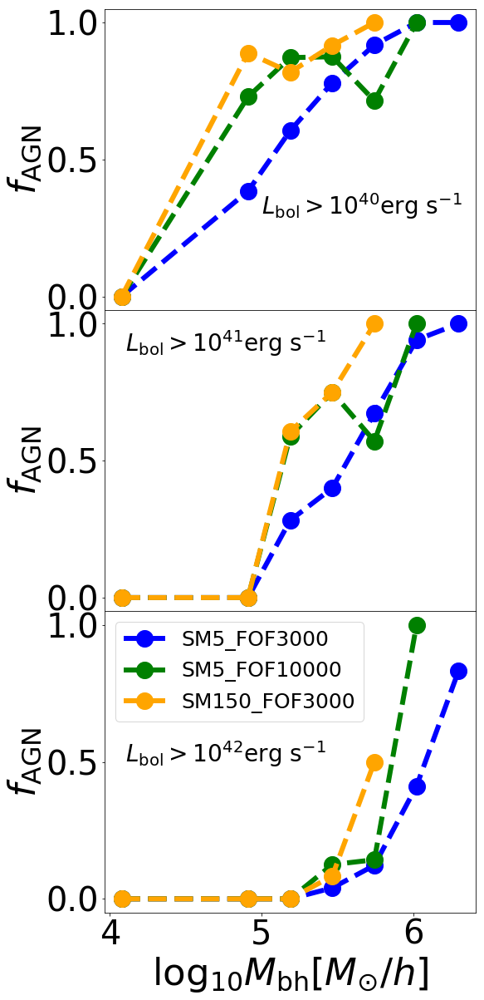

In [68]:
def make_plot(ax1,style='solid',col='black',plot1=True,plot2=True,plot3=True,redo=1):
    
        boxsize=arepo_package.get_box_size(basePath)
        boxsize/=1e3
       
        len1=[]


        len1BH=[]

        
        log_bh_space=[]
        
        log_bh_mass_bins=numpy.linspace(3.8,6.3,10)
        diff_bin=numpy.diff(log_bh_mass_bins)[0]
        
        if(os.path.exists(basePath+'/AGN_BH_occupation_%d_%d.npy'%(lumcut,redshift)) & (redo==0)):
            log_bh_space,len1,len1BH=numpy.load(basePath+'/AGN_BH_occupation_%d_%d.npy'%(lumcut,redshift))
   
        else:
            BHMdot,o=arepo_package.get_particle_property(basePath,'BH_Mdot',5,redshift)
            BHLum=BHMdot*total_conv
            BHMass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift) 
            LogBHMass= numpy.log10(BHMass*1e10)
            for log_bh_mass in log_bh_mass_bins:
                try:
                    mask=(LogBHMass > log_bh_mass-diff_bin/2) & (LogBHMass < log_bh_mass+diff_bin/2)
                    LogBHMassBin=LogBHMass[mask]
                    BHLumBin=BHLum[mask]
                    

                    
                    len1BH.append(len(BHLumBin[BHLumBin>10**lumcut]))
                    len1.append(len(BHLumBin))
                    

 
                    
                    log_bh_space.append(log_bh_mass)
                except:
                    aaa=1



            len1=numpy.array(len1)
            len1BH=numpy.array(len1BH)

            log_bh_space=numpy.array(log_bh_space)

            #numpy.save(basePath+'/zero_gal_occupation_%d.npy'%redshift,[log_stellar_space,len1,len1BH])


        #print(len1,len1BH)
        maskp=len1>0
        err= len1BH/len1*(numpy.sqrt(len1BH)/len1BH + numpy.sqrt(len1)/len1)
        ax1.errorbar(log_bh_space[maskp]+offset,len1BH[maskp]/len1[maskp],color=col,linewidth=6,linestyle=style,label=box_label,marker='o',ms=20)

       
        
        ax1.set_xlabel('$\log_{10}{M_{\mathrm{bh}}}[M_{\odot}/h]$',fontsize=label_fontsize)
        
        ax1.tick_params(labelsize=40)
        #ax1.set_yscale('log')




label_fontsize=45



f,axx=plt.subplots(3,1,figsize=(8,20),sharey=True,sharex=True)

            
mass_cut1=1.56525e3 
mass_cut2=1.25e4
mass_cut3=1e5
levelmax_gas,logseedmass_gas=12,3.19

    
ii=0   
redshift=7
for lumcut in [40,41,42]:


    Mh,Msfmp=3000,5
    box_label='SM5_FOF3000'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii],style='dashed',col='blue',plot1=False,plot2=True,plot3=True)


    ii+=1
    
    
ii=0   
for lumcut in [40,41,42]:


    Mh,Msfmp=10000,5
    offset=0


    box_label='SM5_FOF10000'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii],style='dashed',col='green',plot1=False,plot2=True,plot3=True)

    ii+=1
    
    
ii=0   
for lumcut in [40,41,42]:


    Mh,Msfmp=3000,150
    offset=0


    box_label='SM150_FOF3000'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii],style='dashed',col='orange',plot1=False,plot2=True,plot3=True)

    ii+=1
    

axx[2].legend(loc='upper left',fontsize=25)

#axx[0].set_xlim(4,7.5)

#axx[0].set_ylim(0.1,1.2)

#axx[0].legend(loc='upper left',fontsize=32)
#axx[0].set_title('$M_{bh}>1.5e3 \ M_{\odot}/h$',fontsize=label_fontsize)

       
axx[0].text(5,0.3,'$L_{\mathrm{bol}}>10^{%d}\mathrm{erg \ s^{-1}}$'%40,fontsize=28)

axx[1].text(4.1,0.9,'$L_{\mathrm{bol}}>10^{%d}\mathrm{erg \ s^{-1}}$'%41,fontsize=28)

axx[2].text(4.1,0.5,'$L_{\mathrm{bol}}>10^{%d}\mathrm{erg \ s^{-1}}$'%42,fontsize=28)


#axx[1].set_title('$M_{bh}>1.25e4 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[2].set_title('$M_{bh}>1e5 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[0].set_ylim(1e-1,4000)

#axx[]

axx[0].set_ylabel('$f_{\mathrm{AGN}}$',fontsize=label_fontsize)
axx[1].set_ylabel('$f_{\mathrm{AGN}}$',fontsize=label_fontsize)
axx[2].set_ylabel('$f_{\mathrm{AGN}}$',fontsize=label_fontsize)

plt.subplots_adjust(hspace=0,wspace=0)

plt.savefig('./Paper6_figures/AGN_fractions.png',bbox_inches='tight')


Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output 

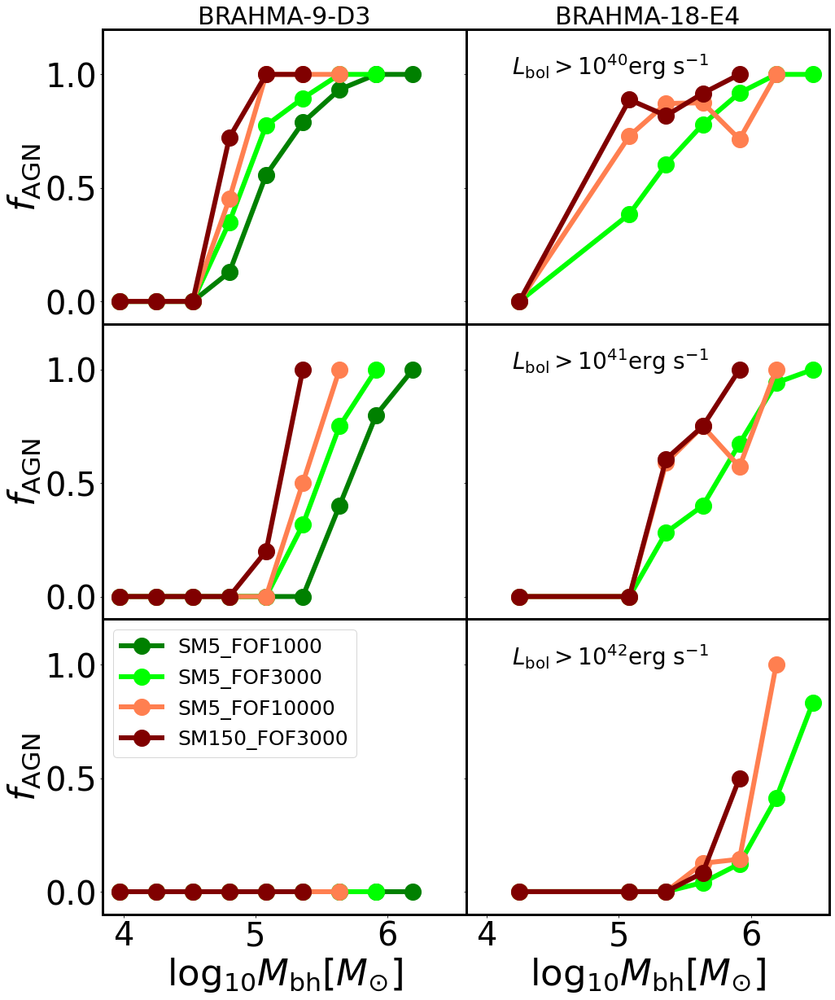

In [61]:
def make_plot(ax1,style='solid',col='black',plot1=True,plot2=True,plot3=True,redo=1):
    
        boxsize=arepo_package.get_box_size(basePath)
        boxsize/=1e3
       
        len1=[]


        len1BH=[]

        
        log_bh_space=[]
        
        log_bh_mass_bins=numpy.linspace(3.8,6.3,10)
        diff_bin=numpy.diff(log_bh_mass_bins)[0]
        
        if(os.path.exists(basePath+'/AGN_BH_occupation_%d_%d.npy'%(lumcut,redshift)) & (redo==0)):
            log_bh_space,len1,len1BH=numpy.load(basePath+'/AGN_BH_occupation_%d_%d.npy'%(lumcut,redshift))
   
        else:
            BHMdot,o=arepo_package.get_particle_property(basePath,'BH_Mdot',5,redshift)
            BHLum=BHMdot*total_conv
            BHMass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift) 
            LogBHMass= numpy.log10(BHMass*1e10)
            for log_bh_mass in log_bh_mass_bins:
                try:
                    mask=(LogBHMass > log_bh_mass-diff_bin/2) & (LogBHMass < log_bh_mass+diff_bin/2)
                    LogBHMassBin=LogBHMass[mask]
                    BHLumBin=BHLum[mask]
                    

                    
                    len1BH.append(len(BHLumBin[BHLumBin>10**lumcut]))
                    len1.append(len(BHLumBin))
                    

 
                    
                    log_bh_space.append(log_bh_mass)
                except:
                    aaa=1



            len1=numpy.array(len1)
            len1BH=numpy.array(len1BH)

            log_bh_space=numpy.array(log_bh_space)

            #numpy.save(basePath+'/zero_gal_occupation_%d.npy'%redshift,[log_stellar_space,len1,len1BH])


        #print(len1,len1BH)
        maskp=len1>0
        err= len1BH/len1*(numpy.sqrt(len1BH)/len1BH + numpy.sqrt(len1)/len1)
        ax1.errorbar(log_bh_space[maskp]+offset-log10(h),len1BH[maskp]/len1[maskp],color=col,linewidth=6,linestyle=style,label=box_label,marker='o',ms=20)

       
        
        ax1.set_xlabel('$\log_{10}{M_{\mathrm{bh}}}[M_{\odot}]$',fontsize=label_fontsize)
        
        ax1.tick_params(labelsize=40)
        ax1.set_ylim(-0.1,1.2)




label_fontsize=45



f,axx=plt.subplots(3,2,figsize=(16,20),sharey=True,sharex=True)

            
mass_cut1=1.56525e3 
mass_cut2=1.25e4
mass_cut3=1e5
levelmax_gas,logseedmass_gas=12,3.19

    
 
redshift=7
offset=0
ii=0 
for lumcut in [40,41,42]:


    Mh,Msfmp=1000,5
    box_label='SM5_FOF1000'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    make_plot(axx[ii,0],style='solid',col='green',plot1=False,plot2=True,plot3=True)


    ii+=1
    

ii=0  
for lumcut in [40,41,42]:


    Mh,Msfmp=3000,5
    box_label='SM5_FOF3000'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    make_plot(axx[ii,0],style='solid',col='lime',plot1=False,plot2=True,plot3=True)


    ii+=1
    
    
ii=0   
for lumcut in [40,41,42]:


    Mh,Msfmp=10000,5
    offset=0


    box_label='SM5_FOF10000'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    make_plot(axx[ii,0],style='solid',col='coral',plot1=False,plot2=True,plot3=True)

    ii+=1
    
    
ii=0   
for lumcut in [40,41,42]:


    Mh,Msfmp=3000,150
    offset=0


    box_label='SM150_FOF3000'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    make_plot(axx[ii,0],style='solid',col='maroon',plot1=False,plot2=True,plot3=True)

    ii+=1
    
    
ii=0   
redshift=7
for lumcut in [40,41,42]:


    Mh,Msfmp=3000,5
    box_label='SM5_FOF3000'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii,1],style='solid',col='lime',plot1=False,plot2=True,plot3=True)


    ii+=1
    
    
ii=0   
for lumcut in [40,41,42]:


    Mh,Msfmp=10000,5
    offset=0


    box_label='SM5_FOF10000'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii,1],style='solid',col='coral',plot1=False,plot2=True,plot3=True)

    ii+=1
    
    
ii=0   
for lumcut in [40,41,42]:


    Mh,Msfmp=3000,150
    offset=0


    box_label='SM150_FOF3000'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii,1],style='solid',col='maroon',plot1=False,plot2=True,plot3=True)

    ii+=1
    

    
axx[0,0].set_title('BRAHMA-9-D3',fontsize=30)

axx[0,1].set_title('BRAHMA-18-E4',fontsize=30)
    
    

axx[2,0].legend(loc='upper left',fontsize=25)

#axx[0].set_xlim(4,7.5)

#axx[0].set_ylim(0.1,1.2)

#axx[0].legend(loc='upper left',fontsize=32)
#axx[0].set_title('$M_{bh}>1.5e3 \ M_{\odot}/h$',fontsize=label_fontsize)

       
axx[0,1].text(3.8-log(h),1.0,'$L_{\mathrm{bol}}>10^{%d}\mathrm{erg \ s^{-1}}$'%40,fontsize=28)

axx[1,1].text(3.8-log(h),1.0,'$L_{\mathrm{bol}}>10^{%d}\mathrm{erg \ s^{-1}}$'%41,fontsize=28)

axx[2,1].text(3.8-log(h),1.0,'$L_{\mathrm{bol}}>10^{%d}\mathrm{erg \ s^{-1}}$'%42,fontsize=28)


#axx[1].set_title('$M_{bh}>1.25e4 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[2].set_title('$M_{bh}>1e5 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[0].set_ylim(1e-1,4000)

#axx[]

axx[0,0].set_ylabel('$f_{\mathrm{AGN}}$',fontsize=label_fontsize)
axx[1,0].set_ylabel('$f_{\mathrm{AGN}}$',fontsize=label_fontsize)
axx[2,0].set_ylabel('$f_{\mathrm{AGN}}$',fontsize=label_fontsize)

plt.subplots_adjust(hspace=0,wspace=0)


for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3) 

plt.savefig('./Paper6_figures/AGN_fractions.png',bbox_inches='tight')


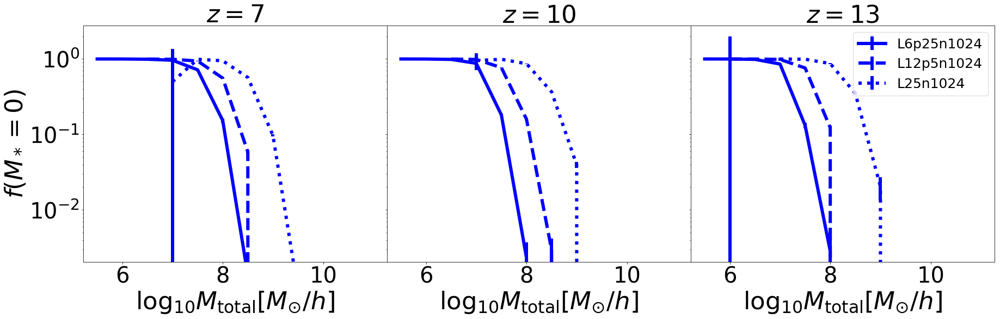

In [26]:
def make_plot(ax1,style='solid',col='black',plot1=True,plot2=True,plot3=True,redo=1):
    
        boxsize=arepo_package.get_box_size(basePath)
        boxsize/=1e3
       
        len1=[]


        len1BH=[]

        
        log_stellar_space=[]
        
        log_stellar_mass_bins=numpy.linspace(4,11,15)
        diff_bin=numpy.diff(log_stellar_mass_bins)[0]
        
        if(os.path.exists(basePath+'/zero_gal_occupation_3.10.npy') & (redo==0)):
            log_stellar_space,len1,len1BH=numpy.load(basePath+'/BH_occupation_3.10_%d.npy'%redshift)
            log_stellar_space,len2,len2BH=numpy.load(basePath+'/BH_occupation_4.10_%d.npy'%redshift)
            log_stellar_space,len3,len3BH=numpy.load(basePath+'/BH_occupation_5.00_%d.npy'%redshift)    
        else:
            SubhaloBHMass,o=arepo_package.get_subhalo_property(basePath,'SubhaloBHMass',redshift)
            SubhaloMassType,o=arepo_package.get_subhalo_property(basePath,'SubhaloMassType',redshift) 
            SubhaloMass,o=arepo_package.get_subhalo_property(basePath,'SubhaloMass',redshift) 
            SubhaloStellarMass=SubhaloMassType[:,4]
            LogSubhaloStellarMass= numpy.log10(SubhaloMass*1e10)
            for log_stellar_mass in log_stellar_mass_bins:
                try:
                    mask=(LogSubhaloStellarMass > log_stellar_mass-diff_bin/2) & (LogSubhaloStellarMass < log_stellar_mass+diff_bin/2)
                    LogSubhaloStellarMassBin=LogSubhaloStellarMass[mask]
                    SubhaloStellarMassBin=SubhaloStellarMass[mask]
                    
                    
                    
                    
                    len1BH.append(len(SubhaloStellarMassBin[SubhaloStellarMassBin==0]))
                   
                    len1.append(len(SubhaloStellarMassBin))
 
                    
                    log_stellar_space.append(log_stellar_mass)
                except:
                    aaa=1



            len1=numpy.array(len1)
            
            len1BH=numpy.array(len1BH)

            log_stellar_space=numpy.array(log_stellar_space)

            #numpy.save(basePath+'/zero_gal_occupation_%d.npy'%redshift,[log_stellar_space,len1,len1BH])


        #print(len1,len1BH)
        maskp=len1>0
        err= len1BH/len1*(numpy.sqrt(len1BH)/len1BH + numpy.sqrt(len1)/len1)
        ax1.errorbar(log_stellar_space[maskp]+offset,len1BH[maskp]/len1[maskp],err[maskp],color=col,linewidth=6,linestyle=style,label=box_label)
        ax1.set_xlabel('$\log_{10}{M_{\mathrm{total}}}[M_{\odot}/h]$',fontsize=label_fontsize)
        
        ax1.tick_params(labelsize=40)
        ax1.set_yscale('log')

       
        ax1.set_title('$z=%d$'%redshift,fontsize=45)



label_fontsize=45



f,axx=plt.subplots(1,3,figsize=(30,8),sharey=True,sharex=True)

            
mass_cut1=1.56525e3 
mass_cut2=1.25e4
mass_cut3=1e5
levelmax_gas,logseedmass_gas=12,3.19
ii=0
for redshift in [7,10,13]:


    Mh,Msfmp=3000,5
    offset=0
    box_label='L6p25n1024'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    make_plot(axx[ii],style='solid',col='blue',plot1=True,plot2=True,plot3=True)

    box_label='L12p5n1024'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii],style='dashed',col='blue',plot1=False,plot2=True,plot3=True)

    box_label='L25n1024'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii],style='dotted',col='blue',plot1=False,plot2=False,plot3=True)
    ii+=1

axx[2].legend(loc='upper right',fontsize=25)

#axx[0].legend(loc='upper left',fontsize=32)
#axx[0].set_title('$M_{bh}>1.5e3 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[1].set_title('$M_{bh}>1.25e4 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[2].set_title('$M_{bh}>1e5 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[0].set_ylim(1e-1,4000)

#axx[]

axx[0].set_ylabel('$f(M_*=0)$',fontsize=label_fontsize)

plt.subplots_adjust(hspace=0,wspace=0)

plt.savefig('./Paper6_figures/zero_star_subhalos.png',bbox_inches='tight')


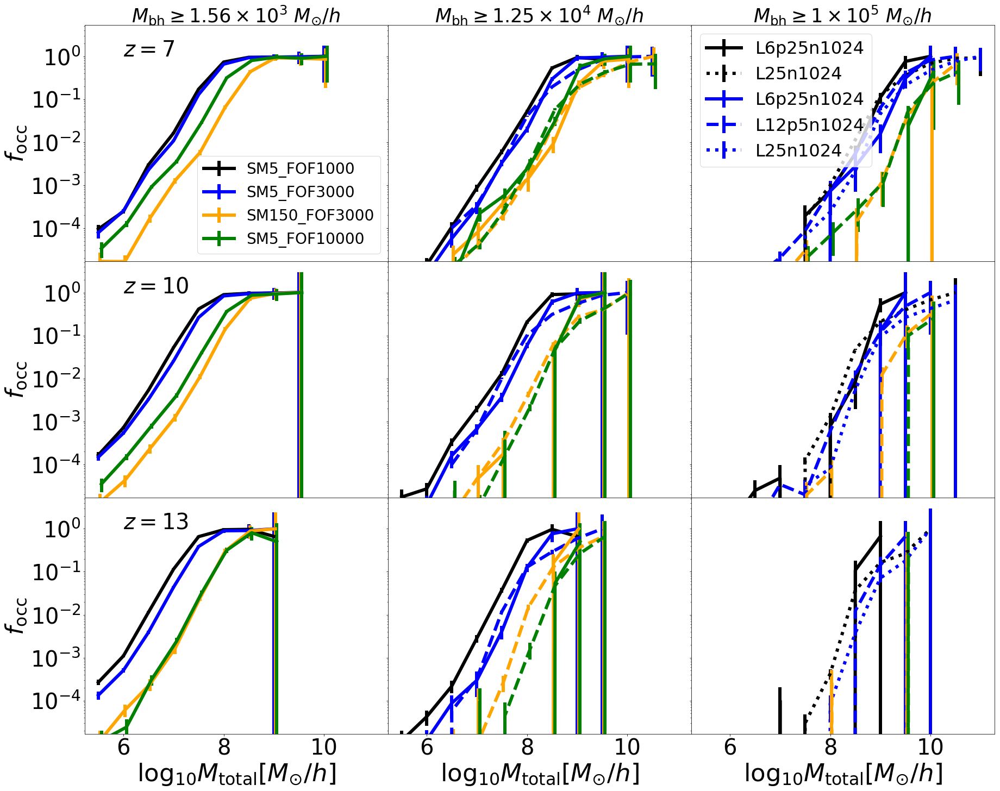

In [72]:
def make_plot(ax1,ax2,ax3,style='solid',col='black',plot1=True,plot2=True,plot3=True,redo=0):
    
        boxsize=arepo_package.get_box_size(basePath)
        boxsize/=1e3
       
        len1=[]
        len2=[]
        len3=[]

        len1BH=[]
        len2BH=[]
        len3BH=[]
        
        log_stellar_space=[]
        
        log_stellar_mass_bins=numpy.linspace(4,11,15)
        diff_bin=numpy.diff(log_stellar_mass_bins)[0]
        
        if(os.path.exists(basePath+'/BH_occupation_3.10.npy') & (redo==0)):
            log_stellar_space,len1,len1BH=numpy.load(basePath+'/BH_occupation_3.10_%d.npy'%redshift)
            log_stellar_space,len2,len2BH=numpy.load(basePath+'/BH_occupation_4.10_%d.npy'%redshift)
            log_stellar_space,len3,len3BH=numpy.load(basePath+'/BH_occupation_5.00_%d.npy'%redshift)    
        else:
            SubhaloBHMass,o=arepo_package.get_subhalo_property(basePath,'SubhaloBHMass',redshift)
            SubhaloMassType,o=arepo_package.get_subhalo_property(basePath,'SubhaloMassType',redshift) 
            SubhaloMass,o=arepo_package.get_subhalo_property(basePath,'SubhaloMass',redshift) 
            SubhaloStellarMass=SubhaloMassType[:,4]
            LogSubhaloStellarMass= numpy.log10(SubhaloMass*1e10)
            for log_stellar_mass in log_stellar_mass_bins:
                try:
                    mask=(LogSubhaloStellarMass > log_stellar_mass-diff_bin/2) & (LogSubhaloStellarMass < log_stellar_mass+diff_bin/2)
                    LogSubhaloStellarMassBin=LogSubhaloStellarMass[mask]
                    SubhaloBHMassBin=SubhaloBHMass[mask]
                    
                    
                    
                    
                    len1BH.append(len(SubhaloBHMassBin[SubhaloBHMassBin>=mass_cut1/1e10]))
                    len2BH.append(len(SubhaloBHMassBin[SubhaloBHMassBin>=mass_cut2/1e10]))
                    len3BH.append(len(SubhaloBHMassBin[SubhaloBHMassBin>=mass_cut3/1e10]))
                    
                    len1.append(len(SubhaloBHMassBin))
                    len2.append(len(SubhaloBHMassBin))
                    len3.append(len(SubhaloBHMassBin))
                    
                    log_stellar_space.append(log_stellar_mass)
                except:
                    aaa=1



            len1=numpy.array(len1)
            len2=numpy.array(len2)
            len3=numpy.array(len3)
            
            len1BH=numpy.array(len1BH)
            len2BH=numpy.array(len2BH)
            len3BH=numpy.array(len3BH)
            log_stellar_space=numpy.array(log_stellar_space)

            numpy.save(basePath+'/BH_occupation_3.10_%d.npy'%redshift,[log_stellar_space,len1,len1BH])
            numpy.save(basePath+'/BH_occupation_4.10_%d.npy'%redshift,[log_stellar_space,len2,len2BH])
            numpy.save(basePath+'/BH_occupation_5.00_%d.npy'%redshift,[log_stellar_space,len3,len3BH])


        if(plot1):
            maskp=len1>0
            #print(log_stellar_space[maskp])
            err= len1BH/len1*(numpy.sqrt(len1BH)/len1BH + numpy.sqrt(len1)/len1)
            ax1.errorbar(log_stellar_space[maskp]+offset,len1BH[maskp]/len1[maskp],err[maskp],color=col,linewidth=6,linestyle=style,label='SM%d_FOF%d'%(Msfmp,Mh))
        if(plot2):
            maskp=len2>0
            err= len2BH/len2*(numpy.sqrt(len2BH)/len2BH + numpy.sqrt(len2)/len2)
            ax2.errorbar(log_stellar_space[maskp]+offset,len2BH[maskp]/len2[maskp],err[maskp],color=col,linewidth=6,linestyle=style)
        if(plot3):
            maskp=len3>0
        
            err= len3BH/len3*(numpy.sqrt(len3BH)/len3BH + numpy.sqrt(len3)/len3)
            ax3.errorbar(log_stellar_space[maskp]+offset,len3BH[maskp]/len3[maskp],err[maskp],color=col,linewidth=6,linestyle=style,label=box_label)
        if(ii==2):
            ax1.set_xlabel('$\log_{10}{M_{\mathrm{total}}}[M_{\odot}/h]$',fontsize=label_fontsize)
            ax2.set_xlabel('$\log_{10}{M_{\mathrm{total}}}[M_{\odot}/h]$',fontsize=label_fontsize)
            ax3.set_xlabel('$\log_{10}{M_{\mathrm{total}}}[M_{\odot}/h]$',fontsize=label_fontsize)
        
        ax1.tick_params(labelsize=40)
        ax1.set_yscale('log')
        ax2.tick_params(labelsize=40)
        ax2.set_yscale('log')
        ax3.tick_params(labelsize=40)
        ax3.set_yscale('log')
        if(ii==0):       
            ax1.set_title(r'$M_{\mathrm{bh}}\geq1.56\times10^3 \ M_{\odot}/h$',fontsize=35)
            ax2.set_title(r'$M_{\mathrm{bh}}\geq1.25\times10^4 \ M_{\odot}/h$',fontsize=35)
            ax3.set_title(r'$M_{\mathrm{bh}}\geq1\times10^5 \ M_{\odot}/h$',fontsize=35)



label_fontsize=45



f,axx=plt.subplots(3,3,figsize=(30,24),sharey=True,sharex=True)

            
mass_cut1=1.56525e3 
mass_cut2=1.25e4
mass_cut3=1e5
levelmax_gas,logseedmass_gas=12,3.19
ii=0
for redshift in [7,10,13]:
    
    Mh,Msfmp=1000,5
    offset=0
    box_label='L6p25n1024'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    make_plot(axx[ii,0],axx[ii,1],axx[ii,2],style='solid',col='black',plot1=True,plot2=True,plot3=True)


    box_label='L25n1024'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii,2],axx[ii,2],axx[ii,2],style='dotted',col='black',plot1=False,plot2=False,plot3=True)



    Mh,Msfmp=3000,5
    offset=0
    box_label='L6p25n1024'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    make_plot(axx[ii,0],axx[ii,1],axx[ii,2],style='solid',col='blue',plot1=True,plot2=True,plot3=True)

    box_label='L12p5n1024'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii,0],axx[ii,1],axx[ii,2],style='dashed',col='blue',plot1=False,plot2=True,plot3=True)

    box_label='L25n1024'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii,2],axx[ii,2],axx[ii,2],style='dotted',col='blue',plot1=False,plot2=False,plot3=True)

    offset+=0.03
    Mh,Msfmp=3000,150
    box_label=''
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    make_plot(axx[ii,0],axx[ii,1],axx[ii,2],style='solid',col='orange',plot1=True,plot2=True,plot3=True)


    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii,2],axx[ii,1],axx[ii,2],style='dashed',col='orange',plot1=False,plot2=True,plot3=True)


    offset+=0.03
    Mh,Msfmp=10000,5

    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    make_plot(axx[ii,0],axx[ii,1],axx[ii,2],style='solid',col='green',plot1=True,plot2=True,plot3=True)

    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii,2],axx[ii,1],axx[ii,2],style='dashed',col='green',plot1=False,plot2=True,plot3=True)
    axx[ii,0].text(6,1,'$z=%d$'%redshift,fontsize=40)
    ii+=1
axx[0,0].legend(loc='lower right',fontsize=28)

axx[0,2].legend(loc='upper left',fontsize=32)
#axx[0].set_title('$M_{bh}>1.5e3 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[1].set_title('$M_{bh}>1.25e4 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[2].set_title('$M_{bh}>1e5 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[0].set_ylim(1e-1,4000)

#axx[]

axx[0,0].set_ylabel('$f_{\mathrm{occ}}$',fontsize=label_fontsize)
axx[1,0].set_ylabel('$f_{\mathrm{occ}}$',fontsize=label_fontsize)

axx[2,0].set_ylabel('$f_{\mathrm{occ}}$',fontsize=label_fontsize)

plt.subplots_adjust(hspace=0,wspace=0)

plt.savefig('./Paper6_figures/BH_occupations.png',bbox_inches='tight')


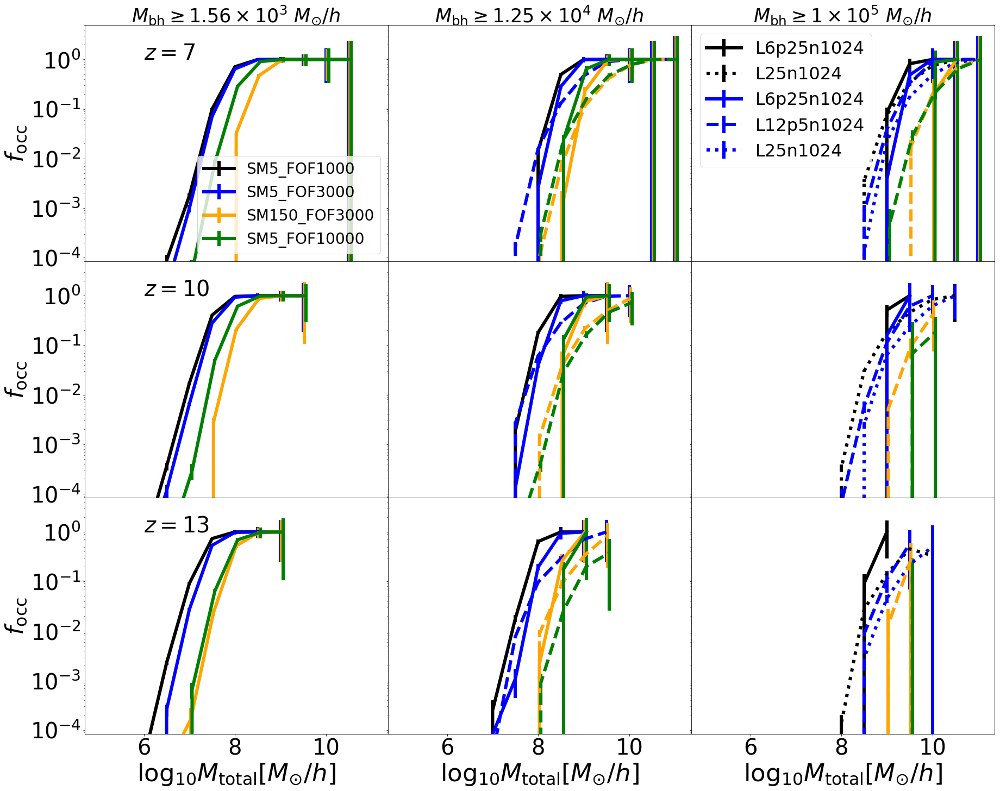

In [73]:
def make_plot(ax1,ax2,ax3,style='solid',col='black',plot1=True,plot2=True,plot3=True,redo=0):
    
        boxsize=arepo_package.get_box_size(basePath)
        boxsize/=1e3
       
        len1=[]
        len2=[]
        len3=[]

        len1BH=[]
        len2BH=[]
        len3BH=[]
        
        log_stellar_space=[]
        
        log_stellar_mass_bins=numpy.linspace(4,11,15)
        diff_bin=numpy.diff(log_stellar_mass_bins)[0]
        
        if(os.path.exists(basePath+'/GrBH_occupation_3.10.npy') & (redo==0)):
            log_stellar_space,len1,len1BH=numpy.load(basePath+'/GrBH_occupation_3.10_%d.npy'%redshift)
            log_stellar_space,len2,len2BH=numpy.load(basePath+'/GrBH_occupation_4.10_%d.npy'%redshift)
            log_stellar_space,len3,len3BH=numpy.load(basePath+'/GrBH_occupation_5.00_%d.npy'%redshift)    
        else:
            SubhaloBHMass,o=arepo_package.get_group_property(basePath,'GroupBHMass',redshift)
            SubhaloMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',redshift) 
            SubhaloMass,o=arepo_package.get_group_property(basePath,'GroupMass',redshift) 
            SubhaloStellarMass=SubhaloMassType[:,4]
            LogSubhaloStellarMass= numpy.log10(SubhaloMass*1e10)
            for log_stellar_mass in log_stellar_mass_bins:
                try:
                    mask=(LogSubhaloStellarMass > log_stellar_mass-diff_bin/2) & (LogSubhaloStellarMass < log_stellar_mass+diff_bin/2)
                    LogSubhaloStellarMassBin=LogSubhaloStellarMass[mask]
                    SubhaloBHMassBin=SubhaloBHMass[mask]
                    
                    
                    
                    
                    len1BH.append(len(SubhaloBHMassBin[SubhaloBHMassBin>=mass_cut1/1e10]))
                    len2BH.append(len(SubhaloBHMassBin[SubhaloBHMassBin>=mass_cut2/1e10]))
                    len3BH.append(len(SubhaloBHMassBin[SubhaloBHMassBin>=mass_cut3/1e10]))
                    
                    len1.append(len(SubhaloBHMassBin))
                    len2.append(len(SubhaloBHMassBin))
                    len3.append(len(SubhaloBHMassBin))
                    
                    log_stellar_space.append(log_stellar_mass)
                except:
                    aaa=1



            len1=numpy.array(len1)
            len2=numpy.array(len2)
            len3=numpy.array(len3)
            
            len1BH=numpy.array(len1BH)
            len2BH=numpy.array(len2BH)
            len3BH=numpy.array(len3BH)
            log_stellar_space=numpy.array(log_stellar_space)

            numpy.save(basePath+'/GrBH_occupation_3.10_%d.npy'%redshift,[log_stellar_space,len1,len1BH])
            numpy.save(basePath+'/GrBH_occupation_4.10_%d.npy'%redshift,[log_stellar_space,len2,len2BH])
            numpy.save(basePath+'/GrBH_occupation_5.00_%d.npy'%redshift,[log_stellar_space,len3,len3BH])


        if(plot1):
            maskp=len1>0
            #print(log_stellar_space[maskp])
            err= len1BH/len1*(numpy.sqrt(len1BH)/len1BH + numpy.sqrt(len1)/len1)
            ax1.errorbar(log_stellar_space[maskp]+offset,len1BH[maskp]/len1[maskp],err[maskp],color=col,linewidth=6,linestyle=style,label='SM%d_FOF%d'%(Msfmp,Mh))
        if(plot2):
            maskp=len2>0
            err= len2BH/len2*(numpy.sqrt(len2BH)/len2BH + numpy.sqrt(len2)/len2)
            ax2.errorbar(log_stellar_space[maskp]+offset,len2BH[maskp]/len2[maskp],err[maskp],color=col,linewidth=6,linestyle=style)
        if(plot3):
            maskp=len3>0
        
            err= len3BH/len3*(numpy.sqrt(len3BH)/len3BH + numpy.sqrt(len3)/len3)
            ax3.errorbar(log_stellar_space[maskp]+offset,len3BH[maskp]/len3[maskp],err[maskp],color=col,linewidth=6,linestyle=style,label=box_label)
        if(ii==2):
            ax1.set_xlabel('$\log_{10}{M_{\mathrm{total}}}[M_{\odot}/h]$',fontsize=label_fontsize)
            ax2.set_xlabel('$\log_{10}{M_{\mathrm{total}}}[M_{\odot}/h]$',fontsize=label_fontsize)
            ax3.set_xlabel('$\log_{10}{M_{\mathrm{total}}}[M_{\odot}/h]$',fontsize=label_fontsize)
        
        ax1.tick_params(labelsize=40)
        ax1.set_yscale('log')
        ax2.tick_params(labelsize=40)
        ax2.set_yscale('log')
        ax3.tick_params(labelsize=40)
        ax3.set_yscale('log')
        if(ii==0):       
            ax1.set_title(r'$M_{\mathrm{bh}}\geq1.56\times10^3 \ M_{\odot}/h$',fontsize=35)
            ax2.set_title(r'$M_{\mathrm{bh}}\geq1.25\times10^4 \ M_{\odot}/h$',fontsize=35)
            ax3.set_title(r'$M_{\mathrm{bh}}\geq1\times10^5 \ M_{\odot}/h$',fontsize=35)



label_fontsize=45



f,axx=plt.subplots(3,3,figsize=(30,24),sharey=True,sharex=True)

            
mass_cut1=1.56525e3 
mass_cut2=1.25e4
mass_cut3=1e5
levelmax_gas,logseedmass_gas=12,3.19
ii=0
for redshift in [7,10,13]:
    
    Mh,Msfmp=1000,5
    offset=0
    box_label='L6p25n1024'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    make_plot(axx[ii,0],axx[ii,1],axx[ii,2],style='solid',col='black',plot1=True,plot2=True,plot3=True)


    box_label='L25n1024'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii,2],axx[ii,2],axx[ii,2],style='dotted',col='black',plot1=False,plot2=False,plot3=True)



    Mh,Msfmp=3000,5
    offset=0
    box_label='L6p25n1024'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    make_plot(axx[ii,0],axx[ii,1],axx[ii,2],style='solid',col='blue',plot1=True,plot2=True,plot3=True)

    box_label='L12p5n1024'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii,0],axx[ii,1],axx[ii,2],style='dashed',col='blue',plot1=False,plot2=True,plot3=True)

    box_label='L25n1024'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii,2],axx[ii,2],axx[ii,2],style='dotted',col='blue',plot1=False,plot2=False,plot3=True)

    offset+=0.03
    Mh,Msfmp=3000,150
    box_label=''
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    make_plot(axx[ii,0],axx[ii,1],axx[ii,2],style='solid',col='orange',plot1=True,plot2=True,plot3=True)


    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii,2],axx[ii,1],axx[ii,2],style='dashed',col='orange',plot1=False,plot2=True,plot3=True)


    offset+=0.03
    Mh,Msfmp=10000,5

    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    make_plot(axx[ii,0],axx[ii,1],axx[ii,2],style='solid',col='green',plot1=True,plot2=True,plot3=True)

    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii,2],axx[ii,1],axx[ii,2],style='dashed',col='green',plot1=False,plot2=True,plot3=True)
    axx[ii,0].text(6,1,'$z=%d$'%redshift,fontsize=40)
    ii+=1
axx[0,0].legend(loc='lower right',fontsize=28)

axx[0,2].legend(loc='upper left',fontsize=32)
#axx[0].set_title('$M_{bh}>1.5e3 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[1].set_title('$M_{bh}>1.25e4 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[2].set_title('$M_{bh}>1e5 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[0].set_ylim(1e-1,4000)

#axx[]

axx[0,0].set_ylabel('$f_{\mathrm{occ}}$',fontsize=label_fontsize)
axx[1,0].set_ylabel('$f_{\mathrm{occ}}$',fontsize=label_fontsize)

axx[2,0].set_ylabel('$f_{\mathrm{occ}}$',fontsize=label_fontsize)

plt.subplots_adjust(hspace=0,wspace=0)

plt.savefig('./Paper6_figures/BH_occupations.png',bbox_inches='tight')


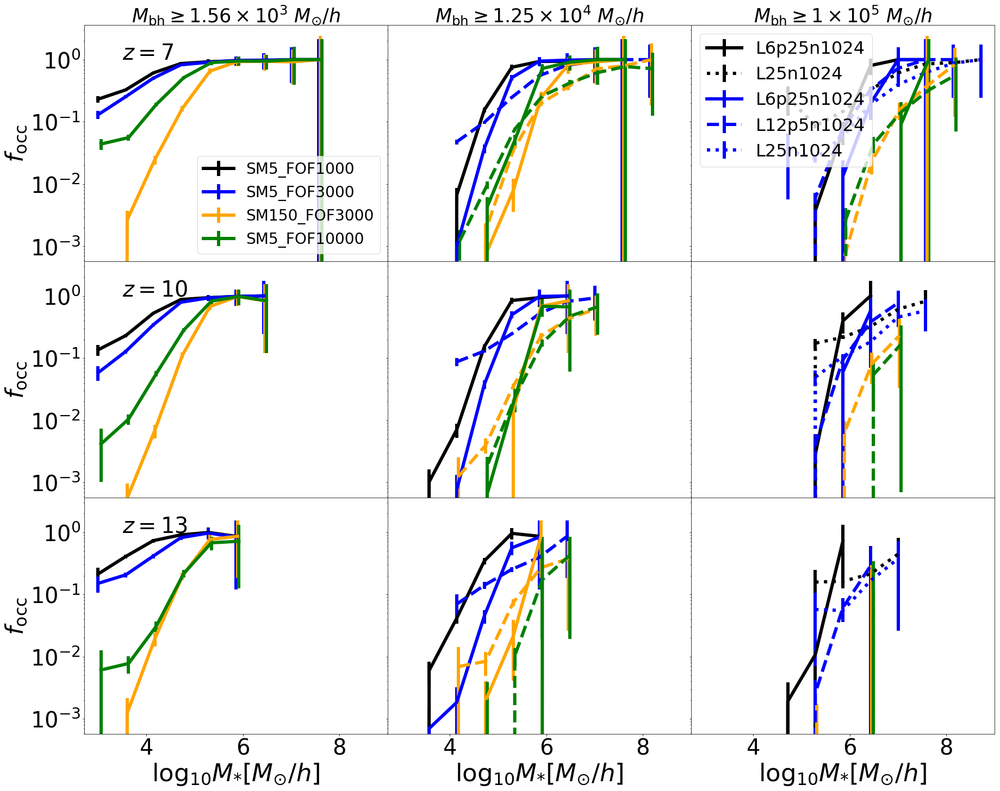

In [48]:
def make_plot(ax1,ax2,ax3,style='solid',col='black',plot1=True,plot2=True,plot3=True,redo=1):
    
        boxsize=arepo_package.get_box_size(basePath)
        boxsize/=1e3
       
        len1=[]
        len2=[]
        len3=[]

        len1BH=[]
        len2BH=[]
        len3BH=[]
        
        if('L6p25n1024' in basePath):
            subhalo_masscut=1e7
        if('L12p5n1024' in basePath):
            subhalo_masscut=8e7
        if('L25n1024' in basePath):
            subhalo_masscut=64e7
        
        
        log_stellar_space=[]
        
        log_stellar_mass_bins=numpy.linspace(3,11,15)
        diff_bin=numpy.diff(log_stellar_mass_bins)[0]
        
        if(os.path.exists(basePath+'/BH_occupation_3.10.npy') & (redo==0)):
            log_stellar_space,len1,len1BH=numpy.load(basePath+'/BH_occupation_3.10_%d.npy'%redshift)
            log_stellar_space,len2,len2BH=numpy.load(basePath+'/BH_occupation_4.10_%d.npy'%redshift)
            log_stellar_space,len3,len3BH=numpy.load(basePath+'/BH_occupation_5.00_%d.npy'%redshift)    
        else:
            SubhaloBHMass,o=arepo_package.get_subhalo_property(basePath,'SubhaloBHMass',redshift)
            SubhaloMassType,o=arepo_package.get_subhalo_property(basePath,'SubhaloMassType',redshift) 
            SubhaloMass,o=arepo_package.get_subhalo_property(basePath,'SubhaloMass',redshift) 
            SubhaloStellarMass=SubhaloMassType[:,4]
            LogSubhaloStellarMass= numpy.log10(SubhaloStellarMass*1e10)

            
            for log_stellar_mass in log_stellar_mass_bins:
                try:
                    mask=(LogSubhaloStellarMass > log_stellar_mass-diff_bin/2) & (LogSubhaloStellarMass < log_stellar_mass+diff_bin/2)
                    mask2=SubhaloMass > subhalo_masscut/1e10
                    mask=mask&mask2
                    LogSubhaloStellarMassBin=LogSubhaloStellarMass[mask]
                    SubhaloBHMassBin=SubhaloBHMass[mask]
                    
                    
                    
                    
                    len1BH.append(len(SubhaloBHMassBin[SubhaloBHMassBin>=mass_cut1/1e10]))
                    len2BH.append(len(SubhaloBHMassBin[SubhaloBHMassBin>=mass_cut2/1e10]))
                    len3BH.append(len(SubhaloBHMassBin[SubhaloBHMassBin>=mass_cut3/1e10]))
                    
                    len1.append(len(SubhaloBHMassBin))
                    len2.append(len(SubhaloBHMassBin))
                    len3.append(len(SubhaloBHMassBin))
                    
                    log_stellar_space.append(log_stellar_mass)
                except:
                    aaa=1



            len1=numpy.array(len1)
            len2=numpy.array(len2)
            len3=numpy.array(len3)
            
            len1BH=numpy.array(len1BH)
            len2BH=numpy.array(len2BH)
            len3BH=numpy.array(len3BH)
            log_stellar_space=numpy.array(log_stellar_space)

            numpy.save(basePath+'/BH_occupation_3.10_%d.npy'%redshift,[log_stellar_space,len1,len1BH])
            numpy.save(basePath+'/BH_occupation_4.10_%d.npy'%redshift,[log_stellar_space,len2,len2BH])
            numpy.save(basePath+'/BH_occupation_5.00_%d.npy'%redshift,[log_stellar_space,len3,len3BH])


        if(plot1):
            maskp=len1>0
            #print(log_stellar_space[maskp])
            err= len1BH/len1*(numpy.sqrt(len1BH)/len1BH + numpy.sqrt(len1)/len1)
            ax1.errorbar(log_stellar_space[maskp]+offset,len1BH[maskp]/len1[maskp],err[maskp],color=col,linewidth=6,linestyle=style,label='SM%d_FOF%d'%(Msfmp,Mh))
        if(plot2):
            maskp=len2>0
            err= len2BH/len2*(numpy.sqrt(len2BH)/len2BH + numpy.sqrt(len2)/len2)
            ax2.errorbar(log_stellar_space[maskp]+offset,len2BH[maskp]/len2[maskp],err[maskp],color=col,linewidth=6,linestyle=style)
        if(plot3):
            maskp=len3>0
        
            err= len3BH/len3*(numpy.sqrt(len3BH)/len3BH + numpy.sqrt(len3)/len3)
            ax3.errorbar(log_stellar_space[maskp]+offset,len3BH[maskp]/len3[maskp],err[maskp],color=col,linewidth=6,linestyle=style,label=box_label)
        if(ii==2):
            ax1.set_xlabel('$\log_{10}{M_{\mathrm{*}}}[M_{\odot}/h]$',fontsize=label_fontsize)
            ax2.set_xlabel('$\log_{10}{M_{\mathrm{*}}}[M_{\odot}/h]$',fontsize=label_fontsize)
            ax3.set_xlabel('$\log_{10}{M_{\mathrm{*}}}[M_{\odot}/h]$',fontsize=label_fontsize)
        
        ax1.tick_params(labelsize=40)
        ax1.set_yscale('log')
        ax2.tick_params(labelsize=40)
        ax2.set_yscale('log')
        ax3.tick_params(labelsize=40)
        ax3.set_yscale('log')
        if(ii==0):       
            ax1.set_title(r'$M_{\mathrm{bh}}\geq1.56\times10^3 \ M_{\odot}/h$',fontsize=35)
            ax2.set_title(r'$M_{\mathrm{bh}}\geq1.25\times10^4 \ M_{\odot}/h$',fontsize=35)
            ax3.set_title(r'$M_{\mathrm{bh}}\geq1\times10^5 \ M_{\odot}/h$',fontsize=35)



label_fontsize=45



f,axx=plt.subplots(3,3,figsize=(30,24),sharey=True,sharex=True)

            
mass_cut1=1.56525e3 
mass_cut2=1.25e4
mass_cut3=1e5
levelmax_gas,logseedmass_gas=12,3.19
ii=0
for redshift in [7,10,13]:

    Mh,Msfmp=1000,5
    offset=0
    box_label='L6p25n1024'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    make_plot(axx[ii,0],axx[ii,1],axx[ii,2],style='solid',col='black',plot1=True,plot2=True,plot3=True)


    box_label='L25n1024'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii,2],axx[ii,2],axx[ii,2],style='dotted',col='black',plot1=False,plot2=False,plot3=True)

    
    Mh,Msfmp=3000,5
    offset=0
    box_label='L6p25n1024'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    make_plot(axx[ii,0],axx[ii,1],axx[ii,2],style='solid',col='blue',plot1=True,plot2=True,plot3=True)

    box_label='L12p5n1024'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii,0],axx[ii,1],axx[ii,2],style='dashed',col='blue',plot1=False,plot2=True,plot3=True)

    box_label='L25n1024'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii,2],axx[ii,2],axx[ii,2],style='dotted',col='blue',plot1=False,plot2=False,plot3=True)

    offset+=0.03
    Mh,Msfmp=3000,150
    box_label=''
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    make_plot(axx[ii,0],axx[ii,1],axx[ii,2],style='solid',col='orange',plot1=True,plot2=True,plot3=True)


    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii,2],axx[ii,1],axx[ii,2],style='dashed',col='orange',plot1=False,plot2=True,plot3=True)


    offset+=0.03
    Mh,Msfmp=10000,5

    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    make_plot(axx[ii,0],axx[ii,1],axx[ii,2],style='solid',col='green',plot1=True,plot2=True,plot3=True)

    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii,2],axx[ii,1],axx[ii,2],style='dashed',col='green',plot1=False,plot2=True,plot3=True)
    axx[ii,0].text(3.5,1,'$z=%d$'%redshift,fontsize=40)
    ii+=1
axx[0,0].legend(loc='lower right',fontsize=28)

axx[0,2].legend(loc='upper left',fontsize=32)
#axx[0].set_title('$M_{bh}>1.5e3 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[1].set_title('$M_{bh}>1.25e4 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[2].set_title('$M_{bh}>1e5 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[0].set_ylim(1e-1,4000)

#axx[]

axx[0,0].set_ylabel('$f_{\mathrm{occ}}$',fontsize=label_fontsize)
axx[1,0].set_ylabel('$f_{\mathrm{occ}}$',fontsize=label_fontsize)

axx[2,0].set_ylabel('$f_{\mathrm{occ}}$',fontsize=label_fontsize)

plt.subplots_adjust(hspace=0,wspace=0)

plt.savefig('./Paper6_figures/BH_occupations_stellar.png',bbox_inches='tight')


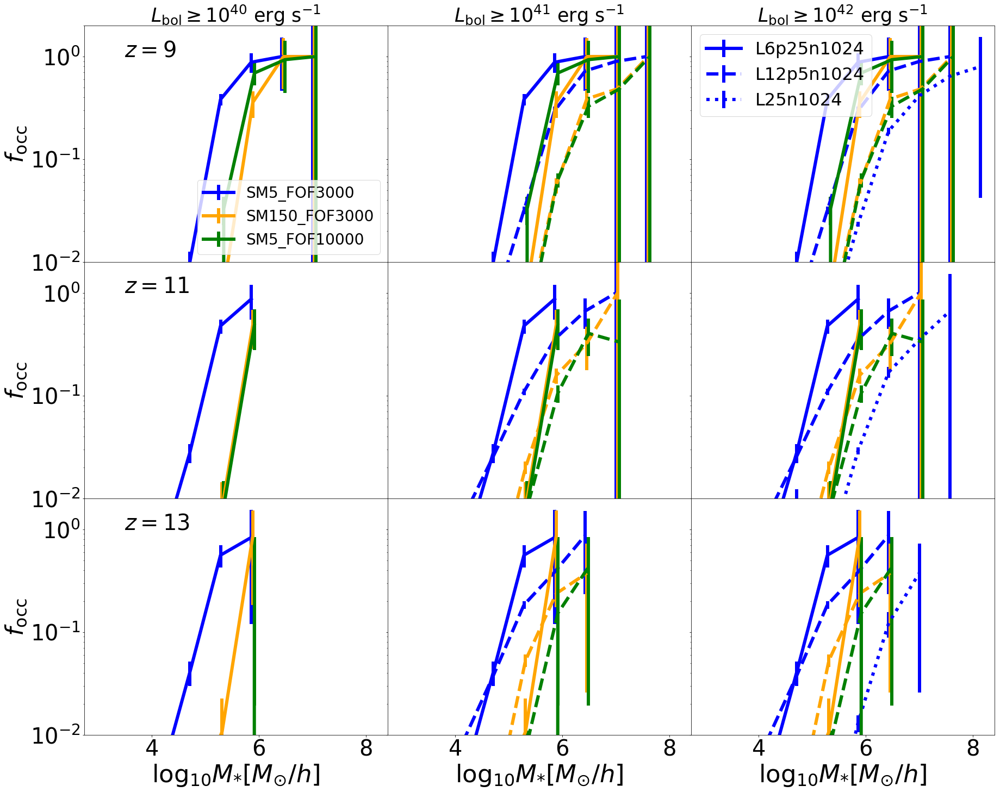

In [68]:
def make_plot(ax1,ax2,ax3,style='solid',col='black',plot1=True,plot2=True,plot3=True,redo=1):
    
        boxsize=arepo_package.get_box_size(basePath)
        boxsize/=1e3
       
        len1=[]
        len2=[]
        len3=[]

        len1BH=[]
        len2BH=[]
        len3BH=[]
        
        log_stellar_space=[]
        
        log_stellar_mass_bins=numpy.linspace(3,11,15)
        diff_bin=numpy.diff(log_stellar_mass_bins)[0]
        
        if(os.path.exists(basePath+'/BH_occupation_3.10.npy') & (redo==0)):
            log_stellar_space,len1,len1BH=numpy.load(basePath+'/BH_occupation_3.10_%d.npy'%redshift)
            log_stellar_space,len2,len2BH=numpy.load(basePath+'/BH_occupation_4.10_%d.npy'%redshift)
            log_stellar_space,len3,len3BH=numpy.load(basePath+'/BH_occupation_5.00_%d.npy'%redshift)    
        else:
            SubhaloBHMdot,o=arepo_package.get_subhalo_property(basePath,'SubhaloBHMdot',redshift)
            SubhaloLum=SubhaloBHMdot*total_conv
            SubhaloMassType,o=arepo_package.get_subhalo_property(basePath,'SubhaloMassType',redshift) 
            SubhaloMass,o=arepo_package.get_subhalo_property(basePath,'SubhaloMass',redshift) 
            SubhaloStellarMass=SubhaloMassType[:,4]
            LogSubhaloStellarMass= numpy.log10(SubhaloStellarMass*1e10)
            for log_stellar_mass in log_stellar_mass_bins:
                try:
                    mask=(LogSubhaloStellarMass > log_stellar_mass-diff_bin/2) & (LogSubhaloStellarMass < log_stellar_mass+diff_bin/2)
                    LogSubhaloStellarMassBin=LogSubhaloStellarMass[mask]
                    SubhaloLumBin=SubhaloLum[mask]
                    
                    
                    
                    
                    len1BH.append(len(SubhaloLumBin[SubhaloLumBin>=mass_cut1]))
                    len2BH.append(len(SubhaloLumBin[SubhaloLumBin>=mass_cut2]))
                    len3BH.append(len(SubhaloLumBin[SubhaloLumBin>=mass_cut3]))
                    
                    len1.append(len(SubhaloLumBin))
                    len2.append(len(SubhaloLumBin))
                    len3.append(len(SubhaloLumBin))
                    
                    log_stellar_space.append(log_stellar_mass)
                except:
                    aaa=1



            len1=numpy.array(len1)
            len2=numpy.array(len2)
            len3=numpy.array(len3)
            
            len1BH=numpy.array(len1BH)
            len2BH=numpy.array(len2BH)
            len3BH=numpy.array(len3BH)
            log_stellar_space=numpy.array(log_stellar_space)

            numpy.save(basePath+'/BH_occupation_3.10_%d.npy'%redshift,[log_stellar_space,len1,len1BH])
            numpy.save(basePath+'/BH_occupation_4.10_%d.npy'%redshift,[log_stellar_space,len2,len2BH])
            numpy.save(basePath+'/BH_occupation_5.00_%d.npy'%redshift,[log_stellar_space,len3,len3BH])


        if(plot1):
            maskp=len1>0
            #print(log_stellar_space[maskp])
            err= len1BH/len1*(numpy.sqrt(len1BH)/len1BH + numpy.sqrt(len1)/len1)
            ax1.errorbar(log_stellar_space[maskp]+offset,len1BH[maskp]/len1[maskp],err[maskp],color=col,linewidth=6,linestyle=style,label='SM%d_FOF%d'%(Msfmp,Mh))
        if(plot2):
            maskp=len2>0
            err= len2BH/len2*(numpy.sqrt(len2BH)/len2BH + numpy.sqrt(len2)/len2)
            ax2.errorbar(log_stellar_space[maskp]+offset,len2BH[maskp]/len2[maskp],err[maskp],color=col,linewidth=6,linestyle=style)
        if(plot3):
            maskp=len3>0
        
            err= len3BH/len3*(numpy.sqrt(len3BH)/len3BH + numpy.sqrt(len3)/len3)
            ax3.errorbar(log_stellar_space[maskp]+offset,len3BH[maskp]/len3[maskp],err[maskp],color=col,linewidth=6,linestyle=style,label=box_label)
        if(ii==2):
            ax1.set_xlabel('$\log_{10}{M_{\mathrm{*}}}[M_{\odot}/h]$',fontsize=label_fontsize)
            ax2.set_xlabel('$\log_{10}{M_{\mathrm{*}}}[M_{\odot}/h]$',fontsize=label_fontsize)
            ax3.set_xlabel('$\log_{10}{M_{\mathrm{*}}}[M_{\odot}/h]$',fontsize=label_fontsize)
        
        ax1.tick_params(labelsize=40)
        ax1.set_yscale('log')
        ax2.tick_params(labelsize=40)
        ax2.set_yscale('log')
        ax3.tick_params(labelsize=40)
        ax3.set_yscale('log')
        if(ii==0):       
            ax1.set_title(r'$L_{\mathrm{bol}}\geq10^{40} \ \mathrm{erg \ s^{-1}}$',fontsize=35)
            ax2.set_title(r'$L_{\mathrm{bol}}\geq10^{41} \ \mathrm{erg \ s^{-1}}$',fontsize=35)
            ax3.set_title(r'$L_{\mathrm{bol}}\geq10^{42} \ \mathrm{erg \ s^{-1}}$',fontsize=35)



label_fontsize=45



f,axx=plt.subplots(3,3,figsize=(30,24),sharey=True,sharex=True)

            
mass_cut1=1e39
mass_cut2=1e39
mass_cut3=1e39
levelmax_gas,logseedmass_gas=12,3.19
ii=0
for redshift in [9,11,13]:


    Mh,Msfmp=3000,5
    offset=0
    box_label='L6p25n1024'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    make_plot(axx[ii,0],axx[ii,1],axx[ii,2],style='solid',col='blue',plot1=True,plot2=True,plot3=True)

    box_label='L12p5n1024'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii,0],axx[ii,1],axx[ii,2],style='dashed',col='blue',plot1=False,plot2=True,plot3=True)

    box_label='L25n1024'
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii,2],axx[ii,2],axx[ii,2],style='dotted',col='blue',plot1=False,plot2=False,plot3=True)

    offset+=0.03
    Mh,Msfmp=3000,150
    box_label=''
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    make_plot(axx[ii,0],axx[ii,1],axx[ii,2],style='solid',col='orange',plot1=True,plot2=True,plot3=True)


    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii,2],axx[ii,1],axx[ii,2],style='dashed',col='orange',plot1=False,plot2=True,plot3=True)


    offset+=0.03
    Mh,Msfmp=10000,5

    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    make_plot(axx[ii,0],axx[ii,1],axx[ii,2],style='solid',col='green',plot1=True,plot2=True,plot3=True)

    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
    run='/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[ii,2],axx[ii,1],axx[ii,2],style='dashed',col='green',plot1=False,plot2=True,plot3=True)
    axx[ii,0].text(3.5,1,'$z=%d$'%redshift,fontsize=40)
    axx[ii,0].set_ylim(1e-2,2)
    ii+=1
axx[0,0].legend(loc='lower right',fontsize=28)

axx[0,2].legend(loc='upper left',fontsize=32)
#axx[0].set_title('$M_{bh}>1.5e3 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[1].set_title('$M_{bh}>1.25e4 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[2].set_title('$M_{bh}>1e5 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[0].set_ylim(1e-1,4000)

#axx[]

axx[0,0].set_ylabel('$f_{\mathrm{occ}}$',fontsize=label_fontsize)
axx[1,0].set_ylabel('$f_{\mathrm{occ}}$',fontsize=label_fontsize)

axx[2,0].set_ylabel('$f_{\mathrm{occ}}$',fontsize=label_fontsize)

plt.subplots_adjust(hspace=0,wspace=0)

#plt.savefig('./Paper6_figures/AGN_occupations_stellar.png',bbox_inches='tight')


19
19
19
19
19
19
19
19


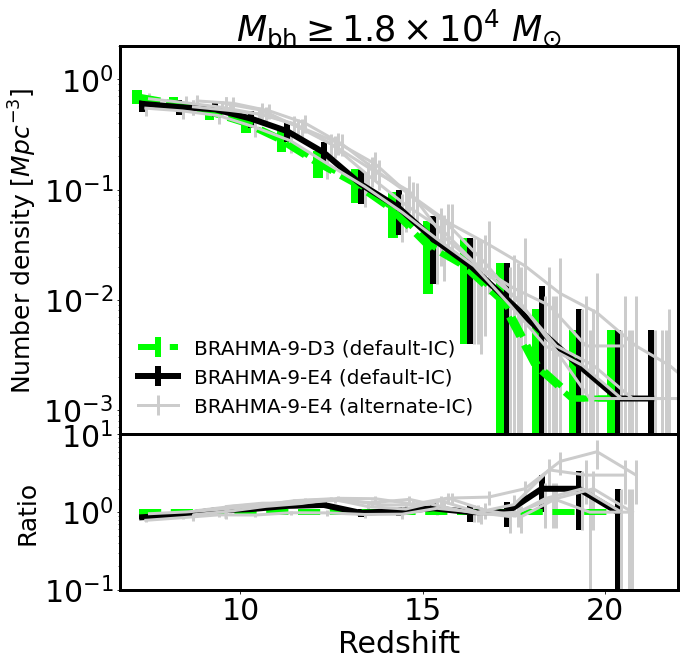

In [10]:
import os
def make_plot(ax1,style='solid',col='black',plot1=True,plot2=True,plot3=True,redo=0,axl=0,divide=0,no_error=0):
        global offset
        global width
        #width-=0.5
        offset+=0.1
        boxsize=arepo_package.get_box_size(basePath)
        boxsize/=1e3
       
        len1=[]
        len2=[]
        len3=[]
        z_space=[]
        
        if(os.path.exists(basePath+'/number_of_BHs_4.10.npy') & (redo==0)):
            z_space,len1=numpy.load(basePath+'/number_of_BHs_4.10.npy')
 
        else:
        
            for redshift in [7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]:
                try:
                    BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
                    len1.append(len(BH_Mass[BH_Mass>=mass_cut1/1e10]))
                    len2.append(len(BH_Mass[BH_Mass>=mass_cut2/1e10]))
                    len3.append(len(BH_Mass[BH_Mass>=mass_cut3/1e10]))
                    z_space.append(o)
                except:
                    len1.append(0)
                    len2.append(0)
                    len3.append(0)
                    z_space.append(0)



            len1=numpy.array(len1)
            len2=numpy.array(len2)
            len3=numpy.array(len3)
            z_space=numpy.array(z_space)

            numpy.save(basePath+'/number_of_BHs_3.10.npy',[z_space,len1])
            numpy.save(basePath+'/number_of_BHs_4.10.npy',[z_space,len2])
            numpy.save(basePath+'/number_of_BHs_5.00.npy',[z_space,len3])


        if(plot1):
            mask=len1>0
            ax1.errorbar(z_space[mask]+offset,len1[mask]/boxsize**3*h**3,numpy.sqrt(len1[mask])/boxsize**3,color=col,linewidth=width,linestyle=style,label=box_label)
            if(axl!=0):
                err=numpy.sqrt(len1[mask])/divide[mask]
                if(no_error==1):
                    err=0
                axl.errorbar(z_space[mask]+offset,(len1[mask]).astype(float)/divide[mask],err,color=col,linewidth=width,linestyle=style)

                
        
        if(plot2):
            ax2.errorbar(z_space,len2/boxsize**3*h**3,numpy.sqrt(len2)/boxsize**3,color=col,linewidth=6,linestyle=style)
        if(plot3):
            ax3.errorbar(z_space,len3/boxsize**3*h**3,numpy.sqrt(len3)/boxsize**3,color=col,linewidth=6,linestyle=style,label=box_label)
        
        
        
        ax1.set_xlabel('Redshift',fontsize=label_fontsize)
        

        ax1.set_yscale('log')

        
        ax1.set_title(r'$M_{\mathrm{bh}} \geq 1.8\times10^4 \ M_{\odot}$',fontsize=35)
        #ax2.set_title(r'$M_{\mathrm{bh}} \geq 1.25\times10^4 \ M_{\odot}/h$',fontsize=35)
        #ax3.set_title(r'$M_{\mathrm{bh}} \geq 1\times10^5 \ M_{\odot}/h$',fontsize=35)
        print(len(len1))        
        return len1

offset=0

label_fontsize=30      
f,axxx=plt.subplots(2,1,figsize=(10,10),sharey=False,sharex=True,gridspec_kw={'height_ratios': [5, 2]})

axx=axxx[0]
mass_cut1=1.25e4
mass_cut2=1.25e4
mass_cut3=1e5
levelmax_gas,logseedmass_gas=12,3.19

Mh,Msfmp=3000,5
width=6
box_label='BRAHMA-9-D3 (default-IC)'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
len1=make_plot(axx,style='dashed',col='lime',plot1=True,plot2=False,plot3=False)


box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
len1=make_plot(axx,style='dashed',col='lime',plot1=True,plot2=False,plot3=False,axl=axxx[1],divide=len1,no_error=1)

box_label='BRAHMA-9-E4 (default-IC)'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6_1e4/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx,style='solid',col='black',plot1=True,plot2=False,plot3=False,axl=axxx[1],divide=len1)



width=3
box_label='BRAHMA-9-E4 (alternate-IC)'
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6_1e4_IC2/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx,style='solid',col='0.8',plot1=True,plot2=False,plot3=False,axl=axxx[1],divide=len1)


box_label=''
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6_1e4_IC3/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx,style='solid',col='0.8',plot1=True,plot2=False,plot3=False,axl=axxx[1],divide=len1)

box_label=''
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6_1e4_IC4/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx,style='solid',col='0.8',plot1=True,plot2=False,plot3=False,axl=axxx[1],divide=len1)

box_label=''
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6_1e4_IC5/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx,style='solid',col='0.8',plot1=True,plot2=False,plot3=False,axl=axxx[1],divide=len1)

box_label=''
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6_1e4_IC6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx,style='solid',col='0.8',plot1=True,plot2=False,plot3=False,axl=axxx[1],divide=len1)


axxx[1].set_yscale('log')

axxx[0].set_xlim(6.7,22)
axxx[1].set_ylim(0.1,10)

axxx[0].tick_params(labelsize=30)
axxx[1].tick_params(labelsize=30)

#output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6_1e4_IC2/'%(Msfmp,Mh)
#basePath=path_to_output+run+output
#make_plot(axx[0],axx[1],axx[2],style='dashed',col='green',plot1=False,plot2=True,plot3=True)


axx.legend(loc='lower left',fontsize=20,frameon=False)

#axx[2].legend(loc='upper right',fontsize=32)
#axx[0].set_title('$M_{bh}>1.5e3 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[1].set_title('$M_{bh}>1.25e4 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[2].set_title('$M_{bh}>1e5 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[0].set_ylim(1e-1,4000)

axxx[1].set_xlabel('Redshift',fontsize=label_fontsize)
axx.set_ylabel('Number density $[Mpc^{-3}]$',fontsize=25)
axxx[1].set_ylabel('Ratio',fontsize=25)

axxx[0].set_ylim(6e-4,2)


for ax in axxx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3) 



plt.subplots_adjust(hspace=0,wspace=0)

plt.savefig('./Paper6_figures/Number_density_cosmic_variance.png',bbox_inches='tight')


[0.008192 0.       0.       0.       0.       0.       0.       0.
 0.       0.       0.       0.       0.       0.       0.       0.
 0.       0.       0.      ]
[2.2528e-02 1.3824e-02 8.1920e-03 3.7120e-03 1.2160e-03 3.2000e-04
 2.5600e-04 6.4000e-05 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00]


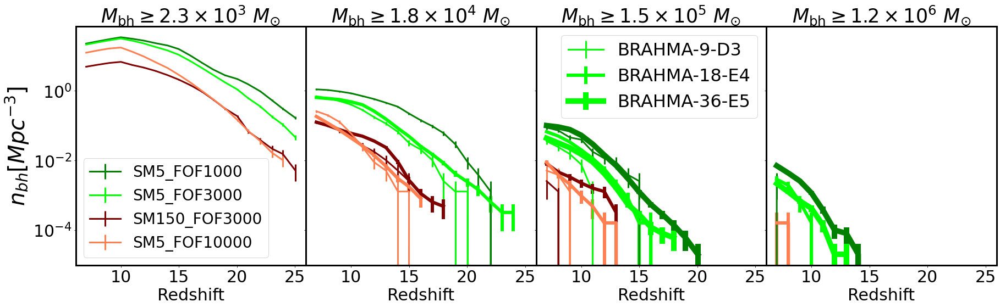

In [10]:
def make_plot(ax1,ax2,ax3,ax4,style='solid',width=6,col='black',plot1=True,plot2=True,plot3=True,plot4=True,redo=0):
    
        boxsize=arepo_package.get_box_size(basePath)
        boxsize/=1e3
       
        len1=[]
        len2=[]
        len3=[]
        len4=[]
        z_space=[]
        
        if(os.path.exists(basePath+'/number_of_BHs_3.10.npy') & (redo==0)):
            z_space,len1=numpy.load(basePath+'/number_of_BHs_3.10.npy')
            z_space,len2=numpy.load(basePath+'/number_of_BHs_4.10.npy')
            z_space,len3=numpy.load(basePath+'/number_of_BHs_5.00.npy')
            z_space,len4=numpy.load(basePath+'/number_of_BHs_5.90.npy')
        else:
        
            for redshift in [7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]:
                try:
                    BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
                    print(max(BH_Mass)*1e10)
                    len1.append(len(BH_Mass[BH_Mass>=mass_cut1/1e10]))
                    len2.append(len(BH_Mass[BH_Mass>=mass_cut2/1e10]))
                    len3.append(len(BH_Mass[BH_Mass>=mass_cut3/1e10]))
                    len4.append(len(BH_Mass[BH_Mass>=mass_cut4/1e10]))
                    z_space.append(o)
                except:
                    aaa=1
            


            len1=numpy.array(len1)
            len2=numpy.array(len2)
            len3=numpy.array(len3)
            len4=numpy.array(len4)
            
            z_space=numpy.array(z_space)

            numpy.save(basePath+'/number_of_BHs_3.10.npy',[z_space,len1])
            numpy.save(basePath+'/number_of_BHs_4.10.npy',[z_space,len2])
            numpy.save(basePath+'/number_of_BHs_5.00.npy',[z_space,len3])
            numpy.save(basePath+'/number_of_BHs_5.90.npy',[z_space,len4])


        if(plot1):
            ax1.errorbar(z_space,len1/boxsize**3*h**3,numpy.sqrt(len1)/boxsize**3*h**3,color=col,linewidth=width,linestyle=style,label='SM%d_FOF%d'%(Msfmp,Mh),marker=' ',ms=20)
        if(plot2):
            ax2.errorbar(z_space,len2/boxsize**3*h**3,numpy.sqrt(len2)/boxsize**3*h**3,color=col,linewidth=width,linestyle=style,marker=' ',ms=20)
        if(plot3):
            ax3.errorbar(z_space,len3/boxsize**3*h**3,numpy.sqrt(len3)/boxsize**3*h**3,color=col,linewidth=width,linestyle=style,label=box_label,marker=' ',ms=20)
        if(plot4):
            ax4.errorbar(z_space,len4/boxsize**3*h**3,numpy.sqrt(len4)/boxsize**3*h**3,color=col,linewidth=width,linestyle=style,label=box_label,marker=' ',ms=20)
        if(Mh==1000):
            print(len4/boxsize**3)
        #print(z_space)
            
        ax1.set_xlabel('Redshift',fontsize=label_fontsize)
        ax2.set_xlabel('Redshift',fontsize=label_fontsize)
        ax3.set_xlabel('Redshift',fontsize=label_fontsize)
        ax4.set_xlabel('Redshift',fontsize=label_fontsize)
        
        ax1.tick_params(labelsize=30)
        ax1.set_yscale('log')
        ax2.tick_params(labelsize=30)
        ax2.set_yscale('log')
        ax3.tick_params(labelsize=30)
        ax3.set_yscale('log')
        ax4.tick_params(labelsize=30)
        ax4.set_yscale('log')
        
        ax1.set_title(r'$M_{\mathrm{bh}} \geq 2.3\times10^3 \ M_{\odot}$',fontsize=35)
        ax2.set_title(r'$M_{\mathrm{bh}} \geq 1.8\times10^4 \ M_{\odot}$',fontsize=35)
        ax3.set_title(r'$M_{\mathrm{bh}} \geq 1.5\times10^5 \ M_{\odot}$',fontsize=35)
        ax4.set_title(r'$M_{\mathrm{bh}} \geq 1.2\times10^6 \ M_{\odot}$',fontsize=35)



label_fontsize=30      
f,axx=plt.subplots(1,4,figsize=(30,8),sharey=True,sharex=True)

            
mass_cut1=1.5625e3 
mass_cut2=1.25e4
mass_cut3=1e5
mass_cut4=8e5
levelmax_gas,logseedmass_gas=12,3.19


Mh,Msfmp=1000,5

box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],axx[2],axx[3],style='solid',width=3,col='green',plot1=True,plot2=True,plot3=True,plot4=True,redo=0)



box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],axx[2],axx[3],style='solid',width=10,col='green',plot1=False,plot2=False,plot3=True,plot4=True,redo=0)


Mh,Msfmp=3000,5

box_label='BRAHMA-9-D3'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],axx[2],axx[3],style='solid',width=3,col='lime',plot1=True,plot2=True,plot3=True,plot4=True,redo=0)


box_label='BRAHMA-18-E4'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],axx[2],axx[3],style='solid',width=6,col='lime',plot1=False,plot2=True,plot3=True,plot4=True)

box_label='BRAHMA-36-E5'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[2],axx[2],axx[2],axx[3],style='solid',width=10,col='lime',plot1=False,plot2=False,plot3=True,plot4=True,redo=0)


Mh,Msfmp=3000,150
box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],axx[2],axx[3],style='solid',width=3,col='maroon',plot1=True,plot2=True,plot3=True,plot4=True)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[2],axx[1],axx[2],axx[3],style='solid',width=6,col='maroon',plot1=False,plot2=True,plot3=True,plot4=True)



Mh,Msfmp=10000,5

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],axx[2],axx[3],style='solid',width=3,col='coral',plot1=True,plot2=True,plot3=True,plot4=True)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[2],axx[1],axx[2],axx[3],style='solid',width=6,col='coral',plot1=False,plot2=True,plot3=True,plot4=True)


axx[0].legend(loc='lower left',fontsize=28)

axx[2].legend(loc='upper right',fontsize=32)
#axx[0].set_title('$M_{bh}>1.5e3 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[1].set_title('$M_{bh}>1.25e4 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[2].set_title('$M_{bh}>1e5 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[0].set_ylim(1e-1,4000)


axx[0].set_ylabel('$n_{bh}[Mpc^{-3}]$',fontsize=40)

plt.subplots_adjust(hspace=0,wspace=0)

for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3) 

plt.savefig('./Paper6_figures/Number_density.png',bbox_inches='tight')


[0.008192 0.       0.       0.       0.       0.       0.       0.
 0.       0.       0.       0.       0.       0.       0.       0.
 0.       0.       0.      ]


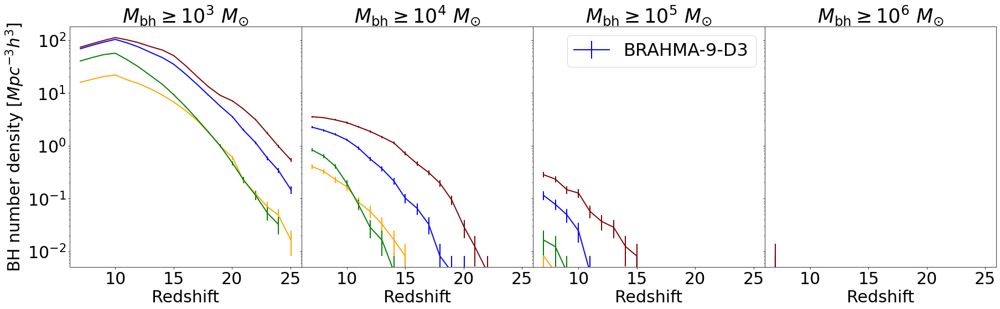

In [30]:
def make_plot(ax1,ax2,ax3,ax4,style='solid',width=6,col='black',plot1=True,plot2=True,plot3=True,plot4=True,redo=0):
    
        boxsize=arepo_package.get_box_size(basePath)
        boxsize/=1e3
       
        len1=[]
        len2=[]
        len3=[]
        len4=[]
        z_space=[]
        
        if(os.path.exists(basePath+'/number_of_BHs_3.10.npy') & (redo==0)):
            z_space,len1=numpy.load(basePath+'/number_of_BHs_3.10.npy')
            z_space,len2=numpy.load(basePath+'/number_of_BHs_4.10.npy')
            z_space,len3=numpy.load(basePath+'/number_of_BHs_5.00.npy')
            z_space,len4=numpy.load(basePath+'/number_of_BHs_5.90.npy')
        else:
        
            for redshift in [7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]:
                try:
                    BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
                    print(max(BH_Mass)*1e10)
                    len1.append(len(BH_Mass[BH_Mass>=mass_cut1/1e10]))
                    len2.append(len(BH_Mass[BH_Mass>=mass_cut2/1e10]))
                    len3.append(len(BH_Mass[BH_Mass>=mass_cut3/1e10]))
                    len4.append(len(BH_Mass[BH_Mass>=mass_cut4/1e10]))
                    z_space.append(o)
                except:
                    aaa=1
            


            len1=numpy.array(len1)
            len2=numpy.array(len2)
            len3=numpy.array(len3)
            len4=numpy.array(len4)
            
            z_space=numpy.array(z_space)

            numpy.save(basePath+'/number_of_BHs_3.10.npy',[z_space,len1])
            numpy.save(basePath+'/number_of_BHs_4.10.npy',[z_space,len2])
            numpy.save(basePath+'/number_of_BHs_5.00.npy',[z_space,len3])
            numpy.save(basePath+'/number_of_BHs_5.90.npy',[z_space,len4])


        if(plot1):
            ax1.errorbar(z_space,len1/boxsize**3,numpy.sqrt(len1)/boxsize**3,color=col,linewidth=width,linestyle=style,label='SM%d_FOF%d'%(Msfmp,Mh),marker=' ',ms=20)
        if(plot2):
            ax2.errorbar(z_space,len2/boxsize**3,numpy.sqrt(len2)/boxsize**3,color=col,linewidth=width,linestyle=style,marker=' ',ms=20)
        if(plot3):
            ax3.errorbar(z_space,len3/boxsize**3,numpy.sqrt(len3)/boxsize**3,color=col,linewidth=width,linestyle=style,label=box_label,marker=' ',ms=20)
        if(plot4):
            ax4.errorbar(z_space,len4/boxsize**3,numpy.sqrt(len4)/boxsize**3,color=col,linewidth=width,linestyle=style,label=box_label,marker=' ',ms=20)
        if(Mh==1000):
            print(len4/boxsize**3)
        #print(z_space)
            
        ax1.set_xlabel('Redshift',fontsize=label_fontsize)
        ax2.set_xlabel('Redshift',fontsize=label_fontsize)
        ax3.set_xlabel('Redshift',fontsize=label_fontsize)
        ax4.set_xlabel('Redshift',fontsize=label_fontsize)
        
        ax1.tick_params(labelsize=30)
        ax1.set_yscale('log')
        ax2.tick_params(labelsize=30)
        ax2.set_yscale('log')
        ax3.tick_params(labelsize=30)
        ax3.set_yscale('log')
        ax4.tick_params(labelsize=30)
        ax4.set_yscale('log')
        
        ax1.set_title(r'$M_{\mathrm{bh}} \geq 10^3 \ M_{\odot}$',fontsize=35)
        ax2.set_title(r'$M_{\mathrm{bh}} \geq 10^4 \ M_{\odot}$',fontsize=35)
        ax3.set_title(r'$M_{\mathrm{bh}} \geq 10^5 \ M_{\odot}$',fontsize=35)
        ax4.set_title(r'$M_{\mathrm{bh}} \geq 10^6 \ M_{\odot}$',fontsize=35)



label_fontsize=30      
f,axx=plt.subplots(1,4,figsize=(30,8),sharey=True,sharex=True)

            
mass_cut1=1.5625e3 
mass_cut2=1.25e4
mass_cut3=1e5
mass_cut4=8e5
levelmax_gas,logseedmass_gas=12,3.19


Mh,Msfmp=1000,5

box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],axx[2],axx[3],style='solid',width=2,col='maroon',plot1=True,plot2=True,plot3=True,plot4=True,redo=0)



box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
#make_plot(axx[0],axx[1],axx[2],axx[3],style='solid',width=10,col='maroon',plot1=False,plot2=False,plot3=True,plot4=True,redo=0)


Mh,Msfmp=3000,5

box_label='BRAHMA-9-D3'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],axx[2],axx[3],style='solid',width=2,col='blue',plot1=True,plot2=True,plot3=True,plot4=True,redo=0)


box_label='BRAHMA-18-E4'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
#make_plot(axx[0],axx[1],axx[2],axx[3],style='solid',width=6,col='blue',plot1=False,plot2=True,plot3=True,plot4=True)

box_label='BRAHMA-36-E5'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
#make_plot(axx[2],axx[2],axx[2],axx[3],style='solid',width=10,col='blue',plot1=False,plot2=False,plot3=True,plot4=True,redo=0)


Mh,Msfmp=3000,150
box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],axx[2],axx[3],style='solid',width=2,col='orange',plot1=True,plot2=True,plot3=True,plot4=True)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
#make_plot(axx[2],axx[1],axx[2],axx[3],style='solid',width=6,col='orange',plot1=False,plot2=True,plot3=True,plot4=True)



Mh,Msfmp=10000,5

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],axx[2],axx[3],style='solid',width=2,col='green',plot1=True,plot2=True,plot3=True,plot4=True)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
#make_plot(axx[2],axx[1],axx[2],axx[3],style='solid',width=6,col='green',plot1=False,plot2=True,plot3=True,plot4=True)


#axx[0].legend(loc='lower left',fontsize=28)

axx[2].legend(loc='upper right',fontsize=32)
#axx[0].set_title('$M_{bh}>1.5e3 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[1].set_title('$M_{bh}>1.25e4 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[2].set_title('$M_{bh}>1e5 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[0].set_ylim(1e-2,500)


axx[0].set_ylabel('BH number density $[Mpc^{-3}h^3]$',fontsize=30)

plt.subplots_adjust(hspace=0,wspace=0)

plt.savefig('./Paper6_figures/Number_density.png',bbox_inches='tight')


[7.53734648e-07 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00]
[1.10973110e-05 7.14445591e-06 4.14688158e-06 2.01288700e-06
 7.90277839e-07 2.84989923e-07 1.41514450e-07 3.84327285e-08
 3.20195220e-08 1.92102417e-08 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]


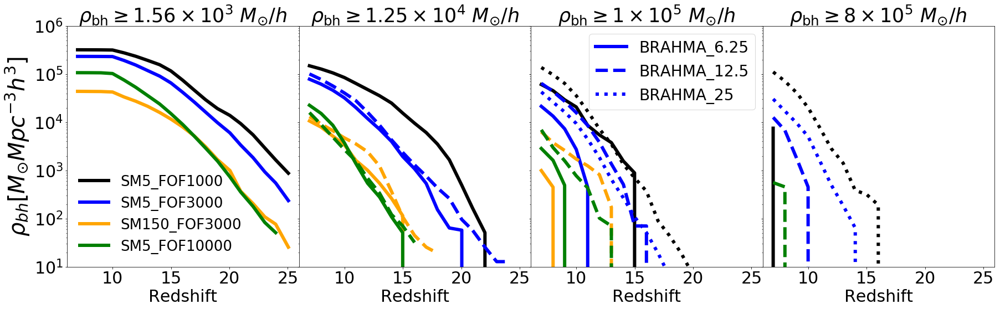

In [26]:
def make_plot(ax1,ax2,ax3,ax4,style='solid',col='black',plot1=True,plot2=True,plot3=True,plot4=True,redo=0):
    
        boxsize=arepo_package.get_box_size(basePath)
        boxsize/=1e3
       
        len1=[]
        len2=[]
        len3=[]
        len4=[]
        z_space=[]
        
        if(os.path.exists(basePath+'/mass_of_BHs_3.10.npy') & (redo==0)):
            z_space,len1=numpy.load(basePath+'/mass_of_BHs_3.10.npy')
            z_space,len2=numpy.load(basePath+'/mass_of_BHs_4.10.npy')
            z_space,len3=numpy.load(basePath+'/mass_of_BHs_5.00.npy')
            z_space,len4=numpy.load(basePath+'/mass_of_BHs_5.90.npy')
        else:
        
            for redshift in [7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]:
                try:
                    BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
                    print(max(BH_Mass)*1e10)
                    len1.append(sum(BH_Mass[BH_Mass>=mass_cut1/1e10]))
                    len2.append(sum(BH_Mass[BH_Mass>=mass_cut2/1e10]))
                    len3.append(sum(BH_Mass[BH_Mass>=mass_cut3/1e10]))
                    len4.append(sum(BH_Mass[BH_Mass>=mass_cut4/1e10]))
                    z_space.append(o)
                except:
                    aaa=1
            


            len1=numpy.array(len1)
            len2=numpy.array(len2)
            len3=numpy.array(len3)
            len4=numpy.array(len4)
            
            z_space=numpy.array(z_space)

            numpy.save(basePath+'/mass_of_BHs_3.10.npy',[z_space,len1])
            numpy.save(basePath+'/mass_of_BHs_4.10.npy',[z_space,len2])
            numpy.save(basePath+'/mass_of_BHs_5.00.npy',[z_space,len3])
            numpy.save(basePath+'/mass_of_BHs_5.90.npy',[z_space,len4])


        if(plot1):
            ax1.errorbar(z_space,len1*1e10/boxsize**3,color=col,linewidth=6,linestyle=style,label='SM%d_FOF%d'%(Msfmp,Mh),marker=' ',ms=20)
        if(plot2):
            ax2.errorbar(z_space,len2*1e10/boxsize**3,color=col,linewidth=6,linestyle=style,marker=' ',ms=20)
        if(plot3):
            ax3.errorbar(z_space,len3*1e10/boxsize**3,color=col,linewidth=6,linestyle=style,label=box_label,marker=' ',ms=20)
        if(plot4):
            ax4.errorbar(z_space,len4*1e10/boxsize**3,color=col,linewidth=6,linestyle=style,label=box_label,marker=' ',ms=20)
        if(Mh==1000):
            print(len4/boxsize**3)
        #print(z_space)
            
        ax1.set_xlabel('Redshift',fontsize=label_fontsize)
        ax2.set_xlabel('Redshift',fontsize=label_fontsize)
        ax3.set_xlabel('Redshift',fontsize=label_fontsize)
        ax4.set_xlabel('Redshift',fontsize=label_fontsize)
        
        ax1.tick_params(labelsize=30)
        ax1.set_yscale('log')
        ax2.tick_params(labelsize=30)
        ax2.set_yscale('log')
        ax3.tick_params(labelsize=30)
        ax3.set_yscale('log')
        ax4.tick_params(labelsize=30)
        ax4.set_yscale('log')
        
        ax1.set_title(r'$\rho_{\mathrm{bh}} \geq 1.56\times10^3 \ M_{\odot}/h$',fontsize=35)
        ax2.set_title(r'$\rho_{\mathrm{bh}} \geq 1.25\times10^4 \ M_{\odot}/h$',fontsize=35)
        ax3.set_title(r'$\rho_{\mathrm{bh}} \geq 1\times10^5 \ M_{\odot}/h$',fontsize=35)
        ax4.set_title(r'$\rho_{\mathrm{bh}} \geq 8\times10^5 \ M_{\odot}/h$',fontsize=35)



label_fontsize=30      
f,axx=plt.subplots(1,4,figsize=(30,8),sharey=True,sharex=True)

            
mass_cut1=1.5625e3 
mass_cut2=1.25e4
mass_cut3=1e5
mass_cut4=8e5
levelmax_gas,logseedmass_gas=12,3.19


Mh,Msfmp=1000,5

box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],axx[2],axx[3],style='solid',col='black',plot1=True,plot2=True,plot3=True,plot4=True)



box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],axx[2],axx[3],style='dotted',col='black',plot1=False,plot2=False,plot3=True,plot4=True)


Mh,Msfmp=3000,5

box_label='BRAHMA_6.25'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],axx[2],axx[3],style='solid',col='blue',plot1=True,plot2=True,plot3=True,plot4=True,redo=0)


box_label='BRAHMA_12.5'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],axx[2],axx[3],style='dashed',col='blue',plot1=False,plot2=True,plot3=True,plot4=True)

box_label='BRAHMA_25'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[2],axx[2],axx[2],axx[3],style='dotted',col='blue',plot1=False,plot2=False,plot3=True,plot4=True)


Mh,Msfmp=3000,150
box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],axx[2],axx[3],style='solid',col='orange',plot1=True,plot2=True,plot3=True,plot4=True)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[2],axx[1],axx[2],axx[3],style='dashed',col='orange',plot1=False,plot2=True,plot3=True,plot4=True)



Mh,Msfmp=10000,5

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],axx[2],axx[3],style='solid',col='green',plot1=True,plot2=True,plot3=True,plot4=True)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[2],axx[1],axx[2],axx[3],style='dashed',col='green',plot1=False,plot2=True,plot3=True,plot4=True)


axx[0].legend(loc='lower left',fontsize=26,frameon=False)

axx[2].legend(loc='upper right',fontsize=28)
#axx[0].set_title('$M_{bh}>1.5e3 \ M_{\odot}/h$',fontsize=label_fontsize)
axx[0].set_ylim(1e1,1e6)

#axx[1].set_title('$M_{bh}>1.25e4 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[2].set_title('$M_{bh}>1e5 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[0].set_ylim(1e-1,4000)


axx[0].set_ylabel(r'$\rho_{bh}[M_{\odot}Mpc^{-3}h^3]$',fontsize=40)

plt.subplots_adjust(hspace=0,wspace=0)

plt.savefig('./Paper6_figures/mass_density.png',bbox_inches='tight')


In [6]:
8e5/0.7

1142857.142857143

[0.008192 0.       0.       0.       0.       0.       0.       0.
 0.       0.       0.       0.       0.       0.       0.       0.
 0.       0.       0.      ]
[0.068608 0.066048 0.060928 0.056832 0.049152 0.04096  0.028672 0.023552
 0.016384 0.008192 0.004608 0.001024 0.       0.       0.       0.
 0.       0.      ]


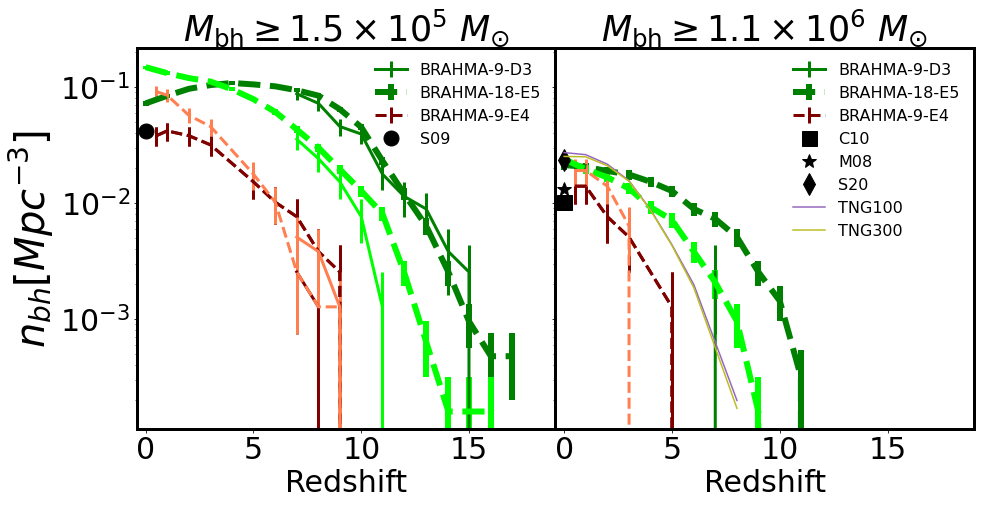

In [7]:
def make_plot(ax3,ax4,style='solid',col='black',width=6,plot1=True,plot2=True,plot3=True,plot4=True,redo=0):
    
        boxsize=arepo_package.get_box_size(basePath)
        boxsize/=1e3
       
        len1=[]
        len2=[]
        len3=[]
        len4=[]
        z_space=[]
        
        if(os.path.exists(basePath+'/number_of_BHs_5.00.npy') & (redo==0)):
            z_space,len3=numpy.load(basePath+'/number_of_BHs_5.00.npy')
            z_space,len4=numpy.load(basePath+'/number_of_BHs_5.90.npy')
        else:
        
            for redshift in [0,1,2,3,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]:
                try:
                    BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
                    
                    #BH_Mdot,o=arepo_package.get_particle_property(basePath,'BH_Mdot',5,redshift)
                    
                    #BH_Lum = BH_Mdot*total_conv

    
                    len3.append(len(BH_Mass[BH_Mass>=mass_cut3/1e10]))
                    len4.append(len(BH_Mass[BH_Mass>=mass_cut4/1e10]))
                    z_space.append(o)
                except:
                    aaa=1
            



            len3=numpy.array(len3)
            len4=numpy.array(len4)
            
            z_space=numpy.array(z_space)


            numpy.save(basePath+'/number_of_BHs_5.00.npy',[z_space,len3])
            numpy.save(basePath+'/number_of_BHs_5.90.npy',[z_space,len4])


        if(plot3):
            ax3.errorbar(z_space,len3/boxsize**3*h**3,numpy.sqrt(len3)/boxsize**3*h**3,color=col,linewidth=width,linestyle=style,label=box_label,marker=' ',ms=20)
        if(plot4):
            ax4.errorbar(z_space,len4/boxsize**3*h**3,numpy.sqrt(len4)/boxsize**3*h**3,color=col,linewidth=width,linestyle=style,label=box_label,marker=' ',ms=20)
        if(Mh==1000):
            print(len4/boxsize**3)
        #print(z_space)
            

        ax3.set_xlabel('Redshift',fontsize=label_fontsize)
        ax4.set_xlabel('Redshift',fontsize=label_fontsize)

        ax3.tick_params(labelsize=30)
        ax3.set_yscale('log')
        ax4.tick_params(labelsize=30)
        ax4.set_yscale('log')
        

        ax3.set_title(r'$M_{\mathrm{bh}} \geq 1.5\times10^5 \ M_{\odot}$',fontsize=35)
        ax4.set_title(r'$M_{\mathrm{bh}} \geq 1.1\times10^6 \ M_{\odot}$',fontsize=35)



label_fontsize=30      
f,axx=plt.subplots(1,2,figsize=(15,7),sharey=True,sharex=True)

            
mass_cut3=1e5
mass_cut4=8e5
levelmax_gas,logseedmass_gas=12,3.19


Mh,Msfmp=1000,5

box_label='BRAHMA-9-D3'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='green',width=3,plot1=True,plot2=True,plot3=True,plot4=True)



box_label='BRAHMA-3.125-D3'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
#make_plot(axx[0],axx[1],style='solid',col='black',plot1=True,plot2=True,plot3=True,plot4=True,redo=1)



box_label='BRAHMA-18-E5'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='dashed',col='green',width=6,plot1=False,plot2=False,plot3=True,plot4=True,redo=0)

Mh,Msfmp=3000,5
box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='lime',width=3,plot1=True,plot2=True,plot3=True,plot4=True)

box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='dashed',col='lime',width=6,plot1=False,plot2=False,plot3=True,plot4=True,redo=0)



Mh,Msfmp=3000,150
box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='maroon',width=3,plot1=True,plot2=True,plot3=True,plot4=True)

box_label='BRAHMA-3.125-R3'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
#make_plot(axx[0],axx[1],style='solid',col='orange',plot1=True,plot2=True,plot3=True,plot4=True,redo=1)



box_label='BRAHMA-9-E4'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='dashed',col='maroon',width=3,plot1=False,plot2=False,plot3=True,plot4=True,redo=0)

box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='dashed',col='maroon',width=3,plot1=False,plot2=False,plot3=True,plot4=True,redo=0)


Mh,Msfmp=10000,5
box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='coral',width=3,plot1=True,plot2=True,plot3=True,plot4=True)

box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='dashed',col='coral',width=3,plot1=False,plot2=False,plot3=True,plot4=True,redo=0)




for ii in [0]:
    
    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S09.txt')
    axx[ii].errorbar([0],[10**data[:,1][0]],marker='o',label='S09',linewidth=0,ms=15,color='black')
for ii in [1]:
    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/C10.txt')
    axx[ii].errorbar([0],[10**data[:,1][0]],marker='s',label='C10',linewidth=0,ms=15,color='black')

    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/M08.txt')
    axx[ii].errorbar([0],[10**data[:,1][0]],marker='*',label='M08',linewidth=0,ms=15,color='black')


    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S20.txt')
    axx[ii].errorbar([0],[10**data[1]],marker='d',label='S20',linewidth=0,ms=15,color='black')
    
    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S09.txt')
    #axx[ii].errorbar(data[:,0],10**data[:,1]/0.7**3,marker='s',label='S09',linewidth=0,ms=10)

    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/C10.txt')
    #axx[ii].errorbar(data[:,0],10**data[:,1]/0.7**3,marker='s',label='C10',linewidth=0,ms=10)

    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/M08.txt')
    #axx[ii].errorbar(data[:,0],10**data[:,1]/0.7**3,marker='s',label='M08',linewidth=0,ms=10)


    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S20.txt')
    #axx[ii].errorbar([data[0]],[10**data[1]/0.7**3],marker='s',label='S20',linewidth=0,ms=10)
    


num_space=[]
z_space=[]
for desired_redshift in [0,1,2,3,4,5,6,8]:
    BHMass,BHMdot,o=numpy.load('/home/aklantbhowmick/TNG100_BH_mass_mdot_z0/TNG100_BH_mass_mdot_z%.6f.npy'%desired_redshift,allow_pickle=True)
    num_space.append(len(BHMass))
    z_space.append(o)
num_space=numpy.array(num_space)
z_space=numpy.array(z_space)
axx[1].errorbar(z_space,num_space/75**3*h**3,color='C4',label='TNG100')

num_space=[]
z_space=[]
for desired_redshift in [0,1,2,3,4,5,6,8]:
    BHMass,BHMdot,o=numpy.load('/home/aklantbhowmick/TNG100_BH_mass_mdot_z0/TNG300_BH_mass_mdot_z%.6f.npy'%desired_redshift,allow_pickle=True)
    num_space.append(len(BHMass))
    z_space.append(o)
num_space=numpy.array(num_space)
z_space=numpy.array(z_space)
axx[1].errorbar(z_space,num_space/205**3*h**3,color='C8',label='TNG300')


axx[1].legend(loc='upper right',fontsize=16,frameon=False)
axx[0].legend(loc='upper right',fontsize=16,frameon=False)

axx[0].set_xlim(-0.4,19)

#axx[2].legend(loc='upper right',fontsize=32)
#axx[0].set_title('$M_{bh}>1.5e3 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[1].set_title('$M_{bh}>1.25e4 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[2].set_title('$M_{bh}>1e5 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[0].set_ylim(1e-1,4000)


axx[0].set_ylabel('$n_{bh}[Mpc^{-3}]$',fontsize=40)

for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3) 

plt.subplots_adjust(hspace=0,wspace=0)

plt.savefig('./Paper6_figures/Number_density_z0.png',bbox_inches='tight')


[0.008192 0.       0.       0.       0.       0.       0.       0.
 0.       0.       0.       0.       0.       0.       0.       0.
 0.       0.       0.      ]
[0.068608 0.066048 0.060928 0.056832 0.049152 0.04096  0.028672 0.023552
 0.016384 0.008192 0.004608 0.001024 0.       0.       0.       0.
 0.       0.      ]


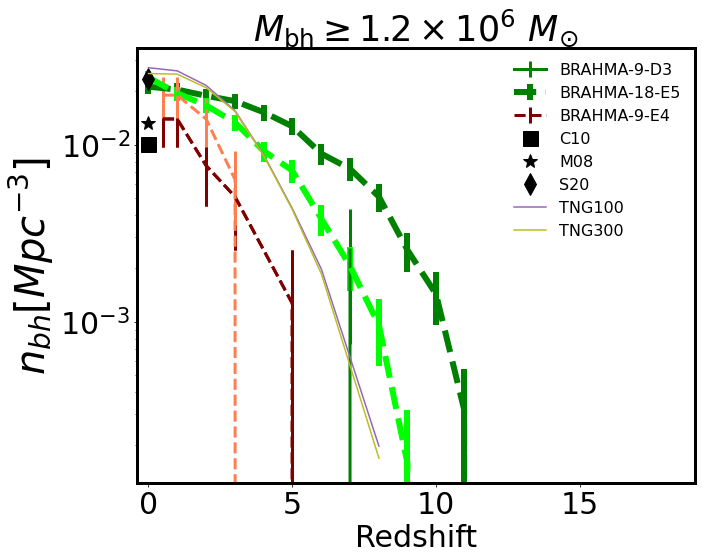

In [14]:
def make_plot(ax3,ax4,style='solid',col='black',width=6,plot1=True,plot2=True,plot3=True,plot4=True,redo=0):
    
        boxsize=arepo_package.get_box_size(basePath)
        boxsize/=1e3
       
        len1=[]
        len2=[]
        len3=[]
        len4=[]
        z_space=[]
        
        if(os.path.exists(basePath+'/number_of_BHs_5.00.npy') & (redo==0)):
            z_space,len3=numpy.load(basePath+'/number_of_BHs_5.00.npy')
            z_space,len4=numpy.load(basePath+'/number_of_BHs_5.90.npy')
        else:
        
            for redshift in [0,1,2,3,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]:
                try:
                    BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
                    
                    #BH_Mdot,o=arepo_package.get_particle_property(basePath,'BH_Mdot',5,redshift)
                    
                    #BH_Lum = BH_Mdot*total_conv

    
                    len3.append(len(BH_Mass[BH_Mass>=mass_cut3/1e10]))
                    len4.append(len(BH_Mass[BH_Mass>=mass_cut4/1e10]))
                    z_space.append(o)
                except:
                    aaa=1
            



            len3=numpy.array(len3)
            len4=numpy.array(len4)
            
            z_space=numpy.array(z_space)


            numpy.save(basePath+'/number_of_BHs_5.00.npy',[z_space,len3])
            numpy.save(basePath+'/number_of_BHs_5.90.npy',[z_space,len4])


        #if(plot3):
            #ax3.errorbar(z_space,len3/boxsize**3*h**3,numpy.sqrt(len3)/boxsize**3*h**3,color=col,linewidth=width,linestyle=style,label=box_label,marker=' ',ms=20)
        if(plot4):
            ax4.errorbar(z_space,len4/boxsize**3*h**3,numpy.sqrt(len4)/boxsize**3*h**3,color=col,linewidth=width,linestyle=style,label=box_label,marker=' ',ms=20)
        if(Mh==1000):
            print(len4/boxsize**3)
        #print(z_space)
            

        #ax3.set_xlabel('Redshift',fontsize=label_fontsize)
        ax4.set_xlabel('Redshift',fontsize=label_fontsize)

        ax3.tick_params(labelsize=30)
        ax3.set_yscale('log')
        ax4.tick_params(labelsize=30)
        ax4.set_yscale('log')
        

        ax3.set_title(r'$M_{\mathrm{bh}} \geq 1.5\times10^5 \ M_{\odot}$',fontsize=35)
        ax4.set_title(r'$M_{\mathrm{bh}} \geq 1.2\times10^6 \ M_{\odot}$',fontsize=35)



label_fontsize=30      
f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

            
mass_cut3=1e5
mass_cut4=8e5
levelmax_gas,logseedmass_gas=12,3.19


Mh,Msfmp=1000,5

box_label='BRAHMA-9-D3'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx,axx,style='solid',col='green',width=3,plot1=True,plot2=True,plot3=True,plot4=True)



box_label='BRAHMA-3.125-D3'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
#make_plot(axx[0],axx[1],style='solid',col='black',plot1=True,plot2=True,plot3=True,plot4=True,redo=1)



box_label='BRAHMA-18-E5'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx,axx,style='dashed',col='green',width=6,plot1=False,plot2=False,plot3=True,plot4=True,redo=0)

Mh,Msfmp=3000,5
box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx,axx,style='solid',col='lime',width=3,plot1=True,plot2=True,plot3=True,plot4=True)

box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx,axx,style='dashed',col='lime',width=6,plot1=False,plot2=False,plot3=True,plot4=True,redo=0)



Mh,Msfmp=3000,150
box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx,axx,style='solid',col='maroon',width=3,plot1=True,plot2=True,plot3=True,plot4=True)

box_label='BRAHMA-3.125-R3'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
#make_plot(axx[0],axx[1],style='solid',col='orange',plot1=True,plot2=True,plot3=True,plot4=True,redo=1)



box_label='BRAHMA-9-E4'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx,axx,style='dashed',col='maroon',width=3,plot1=False,plot2=False,plot3=True,plot4=True,redo=0)

box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx,axx,style='dashed',col='maroon',width=3,plot1=False,plot2=False,plot3=True,plot4=True,redo=0)


Mh,Msfmp=10000,5
box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx,axx,style='solid',col='coral',width=3,plot1=True,plot2=True,plot3=True,plot4=True)

box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx,axx,style='dashed',col='coral',width=3,plot1=False,plot2=False,plot3=True,plot4=True,redo=0)




for ii in [0]:
    
    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S09.txt')
    #axx.errorbar([0],[10**data[:,1][0]],marker='o',label='S09',linewidth=0,ms=15,color='black')
for ii in [1]:
    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/C10.txt')
    axx.errorbar([0],[10**data[:,1][0]],marker='s',label='C10',linewidth=0,ms=15,color='black')

    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/M08.txt')
    axx.errorbar([0],[10**data[:,1][0]],marker='*',label='M08',linewidth=0,ms=15,color='black')


    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S20.txt')
    axx.errorbar([0],[10**data[1]],marker='d',label='S20',linewidth=0,ms=15,color='black')
    
    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S09.txt')
    #axx[ii].errorbar(data[:,0],10**data[:,1]/0.7**3,marker='s',label='S09',linewidth=0,ms=10)

    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/C10.txt')
    #axx[ii].errorbar(data[:,0],10**data[:,1]/0.7**3,marker='s',label='C10',linewidth=0,ms=10)

    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/M08.txt')
    #axx[ii].errorbar(data[:,0],10**data[:,1]/0.7**3,marker='s',label='M08',linewidth=0,ms=10)


    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S20.txt')
    #axx[ii].errorbar([data[0]],[10**data[1]/0.7**3],marker='s',label='S20',linewidth=0,ms=10)
    


num_space=[]
z_space=[]
for desired_redshift in [0,1,2,3,4,5,6,8]:
    BHMass,BHMdot,o=numpy.load('/home/aklantbhowmick/TNG100_BH_mass_mdot_z0/TNG100_BH_mass_mdot_z%.6f.npy'%desired_redshift,allow_pickle=True)
    num_space.append(len(BHMass))
    z_space.append(o)
num_space=numpy.array(num_space)
z_space=numpy.array(z_space)
axx.errorbar(z_space,num_space/75**3*h**3,color='C4',label='TNG100')

num_space=[]
z_space=[]
for desired_redshift in [0,1,2,3,4,5,6,8]:
    BHMass,BHMdot,o=numpy.load('/home/aklantbhowmick/TNG100_BH_mass_mdot_z0/TNG300_BH_mass_mdot_z%.6f.npy'%desired_redshift,allow_pickle=True)
    num_space.append(len(BHMass))
    z_space.append(o)
num_space=numpy.array(num_space)
z_space=numpy.array(z_space)
axx.errorbar(z_space,num_space/205**3*h**3,color='C8',label='TNG300')


axx.legend(loc='upper right',fontsize=16,frameon=False)
axx.legend(loc='upper right',fontsize=16,frameon=False)

axx.set_xlim(-0.4,19)

#axx[2].legend(loc='upper right',fontsize=32)
#axx[0].set_title('$M_{bh}>1.5e3 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[1].set_title('$M_{bh}>1.25e4 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[2].set_title('$M_{bh}>1e5 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[0].set_ylim(1e-1,4000)


axx.set_ylabel('$n_{bh}[Mpc^{-3}]$',fontsize=40)

#for ax in axx.flatten():
axx.spines['top'].set_linewidth(3)    # Top axis
axx.spines['bottom'].set_linewidth(3) # Bottom axis
axx.spines['left'].set_linewidth(3)   # Left axis
axx.spines['right'].set_linewidth(3) 

plt.subplots_adjust(hspace=0,wspace=0)

plt.savefig('./Paper6_figures/Number_density_z0.png',bbox_inches='tight')


[0.068608 0.066048 0.060928 0.056832 0.049152 0.04096  0.028672 0.023552
 0.016384 0.008192 0.004608 0.001024 0.       0.       0.       0.
 0.       0.      ]


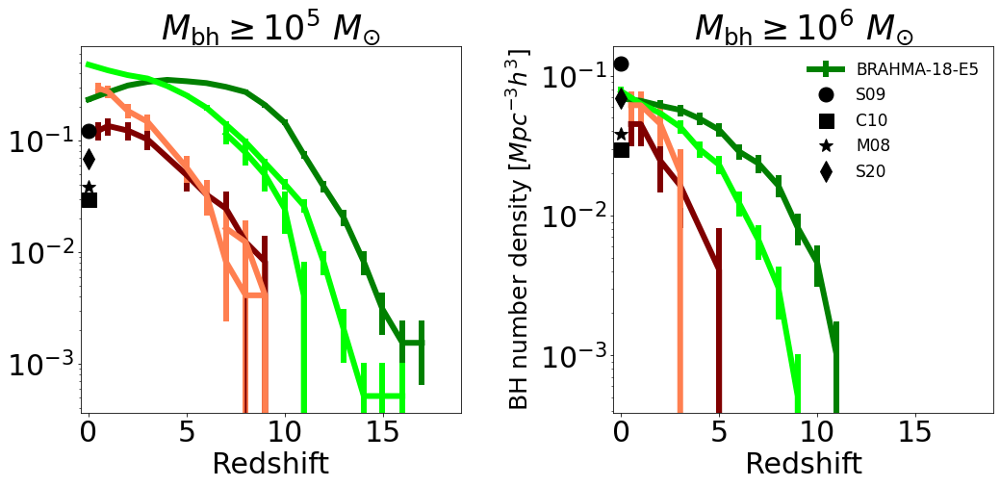

In [31]:
def make_plot(ax3,ax4,style='solid',col='black',width=6,plot1=True,plot2=True,plot3=True,plot4=True,redo=0):
    
        boxsize=arepo_package.get_box_size(basePath)
        boxsize/=1e3
       
        len1=[]
        len2=[]
        len3=[]
        len4=[]
        z_space=[]
        
        if(os.path.exists(basePath+'/number_of_BHs_5.00.npy') & (redo==0)):
            z_space,len3=numpy.load(basePath+'/number_of_BHs_5.00.npy')
            z_space,len4=numpy.load(basePath+'/number_of_BHs_5.90.npy')
        else:
        
            for redshift in [0,1,2,3,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]:
                try:
                    BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
                    
                    #BH_Mdot,o=arepo_package.get_particle_property(basePath,'BH_Mdot',5,redshift)
                    
                    #BH_Lum = BH_Mdot*total_conv

    
                    len3.append(len(BH_Mass[BH_Mass>=mass_cut3/1e10]))
                    len4.append(len(BH_Mass[BH_Mass>=mass_cut4/1e10]))
                    z_space.append(o)
                except:
                    aaa=1
            



            len3=numpy.array(len3)
            len4=numpy.array(len4)
            
            z_space=numpy.array(z_space)


            numpy.save(basePath+'/number_of_BHs_5.00.npy',[z_space,len3])
            numpy.save(basePath+'/number_of_BHs_5.90.npy',[z_space,len4])


        if(plot3):
            ax3.errorbar(z_space,len3/boxsize**3,numpy.sqrt(len3)/boxsize**3,color=col,linewidth=width,linestyle=style,label=box_label,marker=' ',ms=20)
        if(plot4):
            ax4.errorbar(z_space,len4/boxsize**3,numpy.sqrt(len4)/boxsize**3,color=col,linewidth=width,linestyle=style,label=box_label,marker=' ',ms=20)
        if(Mh==1000):
            print(len4/boxsize**3)
        #print(z_space)
            

        ax3.set_xlabel('Redshift',fontsize=label_fontsize)
        ax4.set_xlabel('Redshift',fontsize=label_fontsize)

        ax3.tick_params(labelsize=30)
        ax3.set_yscale('log')
        ax4.tick_params(labelsize=30)
        ax4.set_yscale('log')
        

        ax3.set_title(r'$M_{\mathrm{bh}} \geq 10^5 \ M_{\odot}$',fontsize=35)
        ax4.set_title(r'$M_{\mathrm{bh}} \geq 10^6 \ M_{\odot}$',fontsize=35)



label_fontsize=30      
f,axx=plt.subplots(1,2,figsize=(17,7),sharex=True)

            
mass_cut3=1e5
mass_cut4=8e5
levelmax_gas,logseedmass_gas=12,3.19


Mh,Msfmp=1000,5

box_label='BRAHMA-9-D3'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
#make_plot(axx[0],axx[1],style='solid',col='green',width=2,plot1=True,plot2=True,plot3=True,plot4=True)



box_label='BRAHMA-3.125-D3'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
#make_plot(axx[0],axx[1],style='solid',col='black',plot1=True,plot2=True,plot3=True,plot4=True,redo=1)



box_label='BRAHMA-18-E5'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='green',width=6,plot1=False,plot2=False,plot3=True,plot4=True,redo=0)

Mh,Msfmp=3000,5
box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='lime',width=6,plot1=True,plot2=True,plot3=True,plot4=True)

box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='lime',width=6,plot1=False,plot2=False,plot3=True,plot4=True,redo=0)



Mh,Msfmp=3000,150
box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='maroon',width=2,plot1=True,plot2=True,plot3=True,plot4=True)

box_label='BRAHMA-3.125-D3'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
#make_plot(axx[0],axx[1],style='solid',col='orange',plot1=True,plot2=True,plot3=True,plot4=True,redo=1)



box_label='BRAHMA-9-E4'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
#make_plot(axx[0],axx[1],style='dashed',col='black',width=2,plot1=False,plot2=False,plot3=True,plot4=True,redo=0)

box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='maroon',width=6,plot1=False,plot2=False,plot3=True,plot4=True,redo=0)


Mh,Msfmp=10000,5
box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='coral',width=6,plot1=True,plot2=True,plot3=True,plot4=True)

box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='coral',width=6,plot1=False,plot2=False,plot3=True,plot4=True,redo=0)




for ii in [0,1]:
    
    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S09.txt')
    axx[ii].errorbar([0],[10**data[:,1][0]/0.7**3],marker='o',label='S09',linewidth=0,ms=15,color='black')

    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/C10.txt')
    axx[ii].errorbar([0],[10**data[:,1][0]/0.7**3],marker='s',label='C10',linewidth=0,ms=15,color='black')

    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/M08.txt')
    axx[ii].errorbar([0],[10**data[:,1][0]/0.7**3],marker='*',label='M08',linewidth=0,ms=15,color='black')


    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S20.txt')
    axx[ii].errorbar([0],[10**data[1]/0.7**3],marker='d',label='S20',linewidth=0,ms=15,color='black')
    
    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S09.txt')
    #axx[ii].errorbar(data[:,0],10**data[:,1]/0.7**3,marker='s',label='S09',linewidth=0,ms=10)

    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/C10.txt')
    #axx[ii].errorbar(data[:,0],10**data[:,1]/0.7**3,marker='s',label='C10',linewidth=0,ms=10)

    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/M08.txt')
    #axx[ii].errorbar(data[:,0],10**data[:,1]/0.7**3,marker='s',label='M08',linewidth=0,ms=10)


    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S20.txt')
    #axx[ii].errorbar([data[0]],[10**data[1]/0.7**3],marker='s',label='S20',linewidth=0,ms=10)
    


num_space=[]
z_space=[]
for desired_redshift in [0,1,2,3,4,5,6,8]:
    BHMass,BHMdot,o=numpy.load('/home/aklantbhowmick/TNG100_BH_mass_mdot_z0/TNG100_BH_mass_mdot_z%.6f.npy'%desired_redshift,allow_pickle=True)
    num_space.append(len(BHMass))
    z_space.append(o)
num_space=numpy.array(num_space)
z_space=numpy.array(z_space)
#axx[1].errorbar(z_space,num_space/75**3,color='C4',label='TNG100')

num_space=[]
z_space=[]
for desired_redshift in [0,1,2,3,4,5,6,8]:
    BHMass,BHMdot,o=numpy.load('/home/aklantbhowmick/TNG100_BH_mass_mdot_z0/TNG300_BH_mass_mdot_z%.6f.npy'%desired_redshift,allow_pickle=True)
    num_space.append(len(BHMass))
    z_space.append(o)
num_space=numpy.array(num_space)
z_space=numpy.array(z_space)
#axx[1].errorbar(z_space,num_space/205**3,color='C8',label='TNG300')


axx[1].legend(loc='upper right',fontsize=17,frameon=False)

axx[0].set_xlim(-0.4,19)

#axx[2].legend(loc='upper right',fontsize=32)
#axx[0].set_title('$M_{bh}>1.5e3 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[1].set_title('$M_{bh}>1.25e4 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[2].set_title('$M_{bh}>1e5 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[0].set_ylim(1e-1,4000)


axx[1].set_ylabel('BH number density $[Mpc^{-3}h^3]$',fontsize=25)

plt.subplots_adjust(hspace=0,wspace=0.4)

#plt.savefig('./Paper6_figures/Number_density_z0.png',bbox_inches='tight')


[]
[]


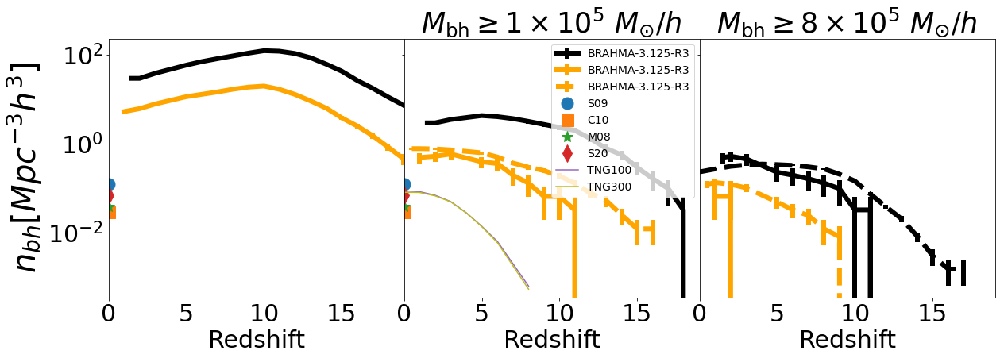

In [120]:
def make_plot(ax1,ax2,ax3,style='solid',col='black',plot1=True,plot2=True,plot3=True,plot4=True,redo=0):
    
        boxsize=arepo_package.get_box_size(basePath)
        boxsize/=1e3
       
        len1=[]
        len2=[]
        len3=[]
        len4=[]
        z_space=[]
        
        if(os.path.exists(basePath+'/number_of_BHs_3.19.npy') & (redo==0)):
            z_space,len1=numpy.load(basePath+'/number_of_BHs_3.19.npy')
            z_space,len2=numpy.load(basePath+'/number_of_BHs_4.10.npy')
            z_space,len3=numpy.load(basePath+'/number_of_BHs_5.00.npy')
        else:
        
            for redshift in [0,1,2,3,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]:
                try:
                    BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
                    
                    #BH_Mdot,o=arepo_package.get_particle_property(basePath,'BH_Mdot',5,redshift)
                    
                    #BH_Lum = BH_Mdot*total_conv

    
                    len1.append(len(BH_Mass[BH_Mass>=mass_cut1/1e10]))
                    len2.append(len(BH_Mass[BH_Mass>=mass_cut2/1e10]))
                    len3.append(len(BH_Mass[BH_Mass>=mass_cut3/1e10]))
                    z_space.append(o)
                except:
                    aaa=1
            



            len1=numpy.array(len1)
            len2=numpy.array(len2)
            len3=numpy.array(len3)
            
            z_space=numpy.array(z_space)


            numpy.save(basePath+'/number_of_BHs_3.19.npy',[z_space,len1])
            numpy.save(basePath+'/number_of_BHs_4.10.npy',[z_space,len2])
            numpy.save(basePath+'/number_of_BHs_5.00.npy',[z_space,len3])

        if(plot1):
            ax1.errorbar(z_space,len1/boxsize**3,numpy.sqrt(len1)/boxsize**3,color=col,linewidth=6,linestyle=style,label=box_label,marker=' ',ms=20)
        if(plot2):
            ax2.errorbar(z_space,len2/boxsize**3,numpy.sqrt(len2)/boxsize**3,color=col,linewidth=6,linestyle=style,label=box_label,marker=' ',ms=20)
        if(plot3):
            ax3.errorbar(z_space,len3/boxsize**3,numpy.sqrt(len3)/boxsize**3,color=col,linewidth=6,linestyle=style,label=box_label,marker=' ',ms=20)
        if(Mh==1000):
            print(len4/boxsize**3)
        #print(z_space)
            
        ax1.set_xlabel('Redshift',fontsize=label_fontsize)
        ax2.set_xlabel('Redshift',fontsize=label_fontsize)
        ax3.set_xlabel('Redshift',fontsize=label_fontsize)

        ax1.tick_params(labelsize=30)
        ax1.set_yscale('log')
        ax2.tick_params(labelsize=30)
        ax2.set_yscale('log')
        ax3.tick_params(labelsize=30)
        ax3.set_yscale('log')
        

        ax2.set_title(r'$M_{\mathrm{bh}} \geq 1\times10^5 \ M_{\odot}/h$',fontsize=35)
        ax3.set_title(r'$M_{\mathrm{bh}} \geq 8\times10^5 \ M_{\odot}/h$',fontsize=35)



label_fontsize=30      
f,axx=plt.subplots(1,3,figsize=(20,6),sharey=True,sharex=True)

mass_cut1=1.56e3            
mass_cut2=1.25e4
mass_cut3=1e5
levelmax_gas,logseedmass_gas=12,3.19


Mh,Msfmp=1000,5

box_label='BRAHMA-3.125-R3'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],axx[2],style='solid',col='black',plot1=True,plot2=True,plot3=True,plot4=True)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],axx[2],style='dashed',col='black',plot1=False,plot2=False,plot3=True,plot4=True,redo=0)


Mh,Msfmp=3000,150

box_label='BRAHMA-3.125-R3'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],axx[2],style='solid',col='orange',plot1=True,plot2=True,plot3=True,plot4=True)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],axx[2],style='dashed',col='orange',plot1=False,plot2=True,plot3=True,plot4=True,redo=0)




for ii in [0,1]:
    
    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S09.txt')
    axx[ii].errorbar([0],[10**data[:,1][0]/0.7**3],marker='o',label='S09',linewidth=0,ms=15)

    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/C10.txt')
    axx[ii].errorbar([0],[10**data[:,1][0]/0.7**3],marker='s',label='C10',linewidth=0,ms=15)

    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/M08.txt')
    axx[ii].errorbar([0],[10**data[:,1][0]/0.7**3],marker='*',label='M08',linewidth=0,ms=15)


    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S20.txt')
    axx[ii].errorbar([0],[10**data[1]/0.7**3],marker='d',label='S20',linewidth=0,ms=15)
    
    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S09.txt')
    #axx[ii].errorbar(data[:,0],10**data[:,1]/0.7**3,marker='s',label='S09',linewidth=0,ms=10)

    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/C10.txt')
    #axx[ii].errorbar(data[:,0],10**data[:,1]/0.7**3,marker='s',label='C10',linewidth=0,ms=10)

    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/M08.txt')
    #axx[ii].errorbar(data[:,0],10**data[:,1]/0.7**3,marker='s',label='M08',linewidth=0,ms=10)


    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S20.txt')
    #axx[ii].errorbar([data[0]],[10**data[1]/0.7**3],marker='s',label='S20',linewidth=0,ms=10)
    


num_space=[]
z_space=[]
for desired_redshift in [0,1,2,3,4,5,6,8]:
    BHMass,BHMdot,o=numpy.load('/home/aklantbhowmick/TNG100_BH_mass_mdot_z0/TNG100_BH_mass_mdot_z%.6f.npy'%desired_redshift,allow_pickle=True)
    num_space.append(len(BHMass))
    z_space.append(o)
num_space=numpy.array(num_space)
z_space=numpy.array(z_space)
axx[1].errorbar(z_space,num_space/75**3,color='C4',label='TNG100')

num_space=[]
z_space=[]
for desired_redshift in [0,1,2,3,4,5,6,8]:
    BHMass,BHMdot,o=numpy.load('/home/aklantbhowmick/TNG100_BH_mass_mdot_z0/TNG300_BH_mass_mdot_z%.6f.npy'%desired_redshift,allow_pickle=True)
    num_space.append(len(BHMass))
    z_space.append(o)
num_space=numpy.array(num_space)
z_space=numpy.array(z_space)
axx[1].errorbar(z_space,num_space/205**3,color='C8',label='TNG300')


axx[1].legend(loc='upper right',fontsize=14)

axx[0].set_xlim(0,19)

#axx[2].legend(loc='upper right',fontsize=32)
#axx[0].set_title('$M_{bh}>1.5e3 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[1].set_title('$M_{bh}>1.25e4 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[2].set_title('$M_{bh}>1e5 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[0].set_ylim(1e-1,4000)


axx[0].set_ylabel('$n_{bh}[Mpc^{-3}h^3]$',fontsize=40)

plt.subplots_adjust(hspace=0,wspace=0)

plt.savefig('./Paper6_figures/Number_density_z0.png',bbox_inches='tight')


In [12]:
data=numpy.loadtxt('/home/aklantbhowmick/analis_data/TNG_no_BH.txt')
data[:,0]

array([0.99905974, 1.16733991, 1.38915708, 1.54976809, 1.71033708,
       1.93202818, 2.13840198, 2.31422523, 2.44407558, 2.64267517,
       2.74199598, 2.85663408, 2.98642139, 3.08582625, 3.29194791,
       3.51330283, 3.7194245 , 3.97908317, 4.10107526, 4.32226209,
       4.52840476, 4.80314961, 4.96338241, 5.16937801, 5.36780951,
       5.573595  , 5.71840545, 5.99375962, 6.43600721])

[7.53734648e-07 7.53734648e-07 7.53734648e-07 7.53734648e-07
 7.53734648e-07 7.53734648e-07 7.53734648e-07 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00]
[1.40303604e-04 1.11569733e-04 5.08973503e-05 2.20707932e-05
 9.26477242e-06 6.20340729e-06 4.62968540e-06 2.93394995e-06
 1.67053401e-06 8.40098619e-07 1.38294622e-07 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00]


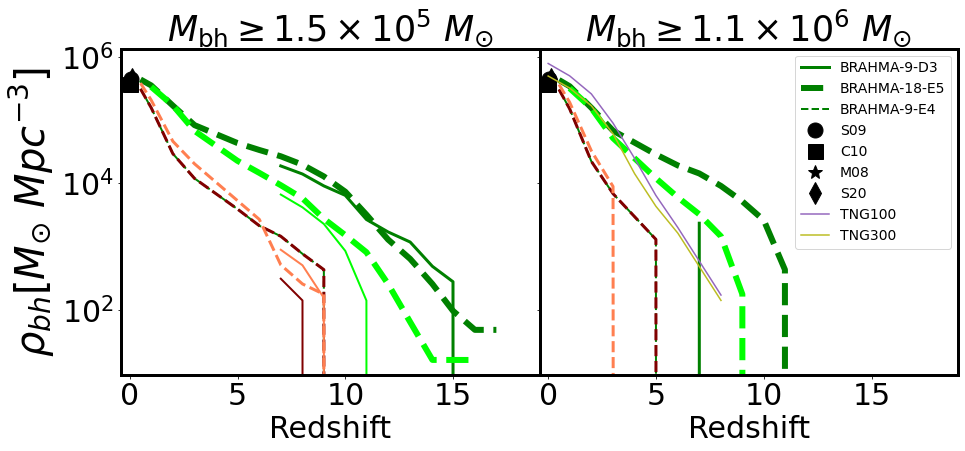

In [19]:
def make_plot(ax3,ax4,style='solid',col='black',width=6,plot1=True,plot2=True,plot3=True,plot4=True,redo=0):
    
        boxsize=arepo_package.get_box_size(basePath)
        boxsize/=1e3
       
        len1=[]
        len2=[]
        len3=[]
        len4=[]
        z_space=[]
        
        if(os.path.exists(basePath+'/mass_of_BHs_5.00.npy') & (redo==0)):
            z_space,len3=numpy.load(basePath+'/mass_of_BHs_5.00.npy')
            z_space,len4=numpy.load(basePath+'/mass_of_BHs_5.90.npy')
        else:
        
            for redshift in [0,1,2,3,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]:
                try:
                    BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
                    
                    #BH_Mdot,o=arepo_package.get_particle_property(basePath,'BH_Mdot',5,redshift)
                    
                    #BH_Lum = BH_Mdot*total_conv

    
                    len3.append(sum(BH_Mass[BH_Mass>=mass_cut3/1e10]))
                    len4.append(sum(BH_Mass[BH_Mass>=mass_cut4/1e10]))
                    z_space.append(o)
                except:
                    aaa=1
            



            len3=numpy.array(len3)
            len4=numpy.array(len4)
            
            z_space=numpy.array(z_space)


            numpy.save(basePath+'/mass_of_BHs_5.00.npy',[z_space,len3])
            numpy.save(basePath+'/mass_of_BHs_5.90.npy',[z_space,len4])


        if(plot3):
            ax3.errorbar(z_space,len3*1e10/boxsize**3*h**3,color=col,linewidth=width,linestyle=style,label=box_label,marker=' ',ms=20)
        if(plot4):
            ax4.errorbar(z_space,len4*1e10/boxsize**3*h**3,color=col,linewidth=width,linestyle=style,label=box_label,marker=' ',ms=20)
        if(Mh==1000):
            print(len4/boxsize**3)
        #print(z_space)
            

        ax3.set_xlabel('Redshift',fontsize=label_fontsize)
        ax4.set_xlabel('Redshift',fontsize=label_fontsize)

        ax3.tick_params(labelsize=30)
        ax3.set_yscale('log')
        ax4.tick_params(labelsize=30)
        ax4.set_yscale('log')
        

        ax3.set_title(r'$M_{\mathrm{bh}} \geq 1.5\times10^5 \ M_{\odot}$',fontsize=35)
        ax4.set_title(r'$M_{\mathrm{bh}} \geq 1.1\times10^6 \ M_{\odot}$',fontsize=35)



label_fontsize=30      
f,axx=plt.subplots(1,2,figsize=(15,6),sharey=True,sharex=True)

            
mass_cut3=1e5
mass_cut4=8e5
levelmax_gas,logseedmass_gas=12,3.19


Mh,Msfmp=1000,5

box_label='BRAHMA-9-D3'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='green',width=3,plot1=True,plot2=True,plot3=True,plot4=True)



box_label='BRAHMA-18-E5'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='dashed',col='green',width=6,plot1=False,plot2=False,plot3=True,plot4=True,redo=0)

Mh,Msfmp=3000,5
box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='lime',width=2,plot1=True,plot2=True,plot3=True,plot4=True)

box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='dashed',col='lime',width=6,plot1=False,plot2=False,plot3=True,plot4=True,redo=0)


Mh,Msfmp=3000,150
box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='maroon',width=2,plot1=True,plot2=True,plot3=True,plot4=True)

box_label='BRAHMA-9-E4'

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='dashed',col='green',width=2,plot1=False,plot2=False,plot3=True,plot4=True,redo=0)

box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='dashed',col='maroon',width=3,plot1=False,plot2=False,plot3=True,plot4=True,redo=0)


Mh,Msfmp=10000,5
box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='coral',width=2,plot1=True,plot2=True,plot3=True,plot4=True)

box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='dashed',col='coral',width=3,plot1=False,plot2=False,plot3=True,plot4=True,redo=0)




for ii in [0,1]:
    
    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/TNG_no_BH.txt')
    #axx[ii].errorbar(data[:,0],10**data[:,1]/0.7**3,marker='',linewidth=2,label='TNG50')

    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S09_mass.txt')
    axx[ii].errorbar([data[:,0][0]],[10**data[:,1][0]],marker='o',label='S09',linewidth=0,ms=15,color='black')

    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/C10_mass.txt')
    axx[ii].errorbar([data[:,0][0]],[10**data[:,1][0]],marker='s',label='C10',linewidth=0,ms=15,color='black')

    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/M08_mass.txt')
    axx[ii].errorbar([data[:,0][0]],[10**data[:,1][0]],marker='*',label='M08',linewidth=0,ms=15,color='black')


    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S20_mass.txt')
    axx[ii].errorbar([data[:,0][0]],[10**data[:,1][0]],marker='d',label='S20',linewidth=0,ms=15,color='black')
   
    
    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S09_mass.txt')
    #axx[ii].errorbar(data[:,0],10**data[:,1]/0.7**3,marker='s',label='S09',linewidth=0,ms=10)

    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/C10_mass.txt')
    #axx[ii].errorbar(data[:,0],10**data[:,1]/0.7**3,marker='s',label='C10',linewidth=0,ms=10)

    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/M08_mass.txt')
    #axx[ii].errorbar(data[:,0],10**data[:,1]/0.7**3,marker='s',label='M08',linewidth=0,ms=10)


    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S20_mass.txt')
    #axx[ii].errorbar(data[:,0],10**data[:,1]/0.7**3,marker='s',label='S20',linewidth=0,ms=10)
 





axx[0].set_xlim(0,19)

num_space=[]
z_space=[]
for desired_redshift in [0,1,2,3,4,5,6,8]:
    BHMass,BHMdot,o=numpy.load('/home/aklantbhowmick/TNG100_BH_mass_mdot_z0/TNG100_BH_mass_mdot_z%.6f.npy'%desired_redshift,allow_pickle=True)
    num_space.append(sum(BHMass)*1e10)
    z_space.append(o)
num_space=numpy.array(num_space)
z_space=numpy.array(z_space)
axx[1].errorbar(z_space,num_space/75**3*h**3,color='C4',label='TNG100')

num_space=[]
z_space=[]
for desired_redshift in [0,1,2,3,4,5,6,8]:
    BHMass,BHMdot,o=numpy.load('/home/aklantbhowmick/TNG100_BH_mass_mdot_z0/TNG300_BH_mass_mdot_z%.6f.npy'%desired_redshift,allow_pickle=True)
    num_space.append(sum(BHMass)*1e10)
    z_space.append(o)
num_space=numpy.array(num_space)
z_space=numpy.array(z_space)
axx[1].errorbar(z_space,num_space/205**3*h**3,color='C8',label='TNG300')

axx[1].legend(loc='upper right',fontsize=14)

axx[0].set_xlim(-0.4,19)

for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)
#axx[2].legend(loc='upper right',fontsize=32)
#axx[0].set_title('$M_{bh}>1.5e3 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[1].set_title('$M_{bh}>1.25e4 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[2].set_title('$M_{bh}>1e5 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[0].set_ylim(1e-1,4000)


axx[0].set_ylabel(r'$\rho_{bh}[M_{\odot} \ Mpc^{-3}]$',fontsize=40)

plt.subplots_adjust(hspace=0,wspace=0)

plt.savefig('./Paper6_figures/mass_density_z0.png',bbox_inches='tight')


[7.53734648e-07 7.53734648e-07 7.53734648e-07 7.53734648e-07
 7.53734648e-07 7.53734648e-07 7.53734648e-07 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00]
[1.40303604e-04 1.11569733e-04 5.08973503e-05 2.20707932e-05
 9.26477242e-06 6.20340729e-06 4.62968540e-06 2.93394995e-06
 1.67053401e-06 8.40098619e-07 1.38294622e-07 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00]


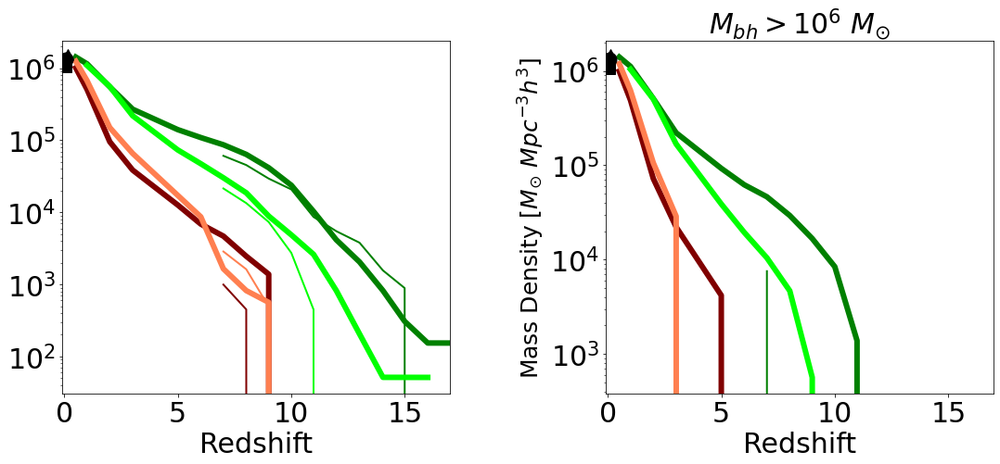

In [32]:
def make_plot(ax3,ax4,style='solid',col='black',width=6,plot1=True,plot2=True,plot3=True,plot4=True,redo=0):
    
        boxsize=arepo_package.get_box_size(basePath)
        boxsize/=1e3
       
        len1=[]
        len2=[]
        len3=[]
        len4=[]
        z_space=[]
        
        if(os.path.exists(basePath+'/mass_of_BHs_5.00.npy') & (redo==0)):
            z_space,len3=numpy.load(basePath+'/mass_of_BHs_5.00.npy')
            z_space,len4=numpy.load(basePath+'/mass_of_BHs_5.90.npy')
        else:
        
            for redshift in [0,1,2,3,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]:
                try:
                    BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
                    
                    #BH_Mdot,o=arepo_package.get_particle_property(basePath,'BH_Mdot',5,redshift)
                    
                    #BH_Lum = BH_Mdot*total_conv

    
                    len3.append(sum(BH_Mass[BH_Mass>=mass_cut3/1e10]))
                    len4.append(sum(BH_Mass[BH_Mass>=mass_cut4/1e10]))
                    z_space.append(o)
                except:
                    aaa=1
            



            len3=numpy.array(len3)
            len4=numpy.array(len4)
            
            z_space=numpy.array(z_space)


            numpy.save(basePath+'/mass_of_BHs_5.00.npy',[z_space,len3])
            numpy.save(basePath+'/mass_of_BHs_5.90.npy',[z_space,len4])


        if(plot3):
            ax3.errorbar(z_space,len3*1e10/boxsize**3,color=col,linewidth=width,linestyle=style,label=box_label,marker=' ',ms=20)
        if(plot4):
            ax4.errorbar(z_space,len4*1e10/boxsize**3,color=col,linewidth=width,linestyle=style,label=box_label,marker=' ',ms=20)
        if(Mh==1000):
            print(len4/boxsize**3)
        #print(z_space)
            

        ax3.set_xlabel('Redshift',fontsize=label_fontsize)
        ax4.set_xlabel('Redshift',fontsize=label_fontsize)

        ax3.tick_params(labelsize=30)
        ax3.set_yscale('log')
        ax4.tick_params(labelsize=30)
        ax4.set_yscale('log')
        

        #ax3.set_title(r'$M_{\mathrm{bh}} \geq 1\times10^5 \ M_{\odot}/h$',fontsize=35)
        #ax4.set_title(r'$M_{\mathrm{bh}} \geq 10^6 \ M_{\odot}$',fontsize=35)



label_fontsize=30      
f,axx=plt.subplots(1,2,figsize=(18,7),sharey=False,sharex=True)

            
mass_cut3=1e5
mass_cut4=8e5
levelmax_gas,logseedmass_gas=12,3.19


Mh,Msfmp=1000,5

box_label='BRAHMA-9-D3'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='green',width=2,plot1=True,plot2=True,plot3=True,plot4=True)



box_label='BRAHMA-18-E5'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='green',width=6,plot1=False,plot2=False,plot3=True,plot4=True,redo=0)

Mh,Msfmp=3000,5
box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='lime',width=2,plot1=True,plot2=True,plot3=True,plot4=True)

box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='lime',width=6,plot1=False,plot2=False,plot3=True,plot4=True,redo=0)


Mh,Msfmp=3000,150
box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='maroon',width=2,plot1=True,plot2=True,plot3=True,plot4=True)

box_label='BRAHMA-9-E4'

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='dashed',col='green',width=2,plot1=False,plot2=False,plot3=True,plot4=True,redo=0)

box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='maroon',width=6,plot1=False,plot2=False,plot3=True,plot4=True,redo=0)


Mh,Msfmp=10000,5
box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='coral',width=2,plot1=True,plot2=True,plot3=True,plot4=True)

box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='coral',width=6,plot1=False,plot2=False,plot3=True,plot4=True,redo=0)





for ii in [0,1]:
    
    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/TNG_no_BH.txt')
    #axx[ii].errorbar(data[:,0],10**data[:,1]/0.7**3,marker='',linewidth=2,label='TNG50')

    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S09_mass.txt')
    axx[ii].errorbar([data[:,0][0]],[10**data[:,1][0]/0.7**3],marker='o',label='S09',linewidth=0,ms=15,color='black')

    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/C10_mass.txt')
    axx[ii].errorbar([data[:,0][0]],[10**data[:,1][0]/0.7**3],marker='s',label='C10',linewidth=0,ms=15,color='black')

    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/M08_mass.txt')
    axx[ii].errorbar([data[:,0][0]],[10**data[:,1][0]/0.7**3],marker='*',label='M08',linewidth=0,ms=15,color='black')


    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S20_mass.txt')
    axx[ii].errorbar([data[:,0][0]],[10**data[:,1][0]/0.7**3],marker='d',label='S20',linewidth=0,ms=15,color='black')
  
    
    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S09_mass.txt')
    #axx[ii].errorbar(data[:,0],10**data[:,1]/0.7**3,marker='s',label='S09',linewidth=0,ms=10)

    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/C10_mass.txt')
    #axx[ii].errorbar(data[:,0],10**data[:,1]/0.7**3,marker='s',label='C10',linewidth=0,ms=10)

    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/M08_mass.txt')
    #axx[ii].errorbar(data[:,0],10**data[:,1]/0.7**3,marker='s',label='M08',linewidth=0,ms=10)


    #data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S20_mass.txt')
    #axx[ii].errorbar(data[:,0],10**data[:,1]/0.7**3,marker='s',label='S20',linewidth=0,ms=10)
 





axx[0].set_xlim(0,19)

num_space=[]
z_space=[]
for desired_redshift in [0,1,2,3,4,5,6,8]:
    BHMass,BHMdot,o=numpy.load('/home/aklantbhowmick/TNG100_BH_mass_mdot_z0/TNG100_BH_mass_mdot_z%.6f.npy'%desired_redshift,allow_pickle=True)
    num_space.append(sum(BHMass)*1e10)
    z_space.append(o)
num_space=numpy.array(num_space)
z_space=numpy.array(z_space)
#axx[1].errorbar(z_space,num_space/75**3,color='C4',label='TNG100')

num_space=[]
z_space=[]
for desired_redshift in [0,1,2,3,4,5,6,8]:
    BHMass,BHMdot,o=numpy.load('/home/aklantbhowmick/TNG100_BH_mass_mdot_z0/TNG300_BH_mass_mdot_z%.6f.npy'%desired_redshift,allow_pickle=True)
    num_space.append(sum(BHMass)*1e10)
    z_space.append(o)
num_space=numpy.array(num_space)
z_space=numpy.array(z_space)
#axx[1].errorbar(z_space,num_space/205**3,color='C8',label='TNG300')

#axx[1].legend(loc='upper right',fontsize=14)


#axx[2].legend(loc='upper right',fontsize=32)
#axx[0].set_title('$M_{bh}>1.5e3 \ M_{\odot}/h$',fontsize=label_fontsize)


axx[1].set_title('$M_{bh}>10^6 \ M_{\odot}$',fontsize=label_fontsize)


#axx[2].set_title('$M_{bh}>1e5 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[0].set_ylim(1e-1,4000)

axx[1].set_xlim(-0.1,17)


axx[1].set_ylabel(r'Mass Density $[M_{\odot} \ Mpc^{-3}h^3]$',fontsize=25)

plt.subplots_adjust(hspace=0,wspace=0.4)

#plt.savefig('./Paper6_figures/mass_density_z0.png',bbox_inches='tight')


In [75]:
Mh,Msfmp=10000,5

box_label=''
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L6p25n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output


arepo_package.get_particle_property(basePath,'BH_Mass',5,20)

Desired redshift:  20
Output redshift:  20.046490988807516
Output snapshot:  5


(array([1.5625395e-07, 1.5625317e-07, 3.1250431e-07, 1.5625237e-07,
        1.5625379e-07, 1.5625072e-07, 1.5625079e-07, 1.5625224e-07,
        1.5625186e-07, 1.5625029e-07, 1.5625305e-07, 1.5625216e-07,
        1.5625236e-07, 1.5625348e-07, 1.5625079e-07, 1.5625416e-07,
        1.5625118e-07, 1.5625277e-07, 1.5625180e-07, 1.5625086e-07,
        1.5625103e-07, 1.5625361e-07, 1.5625309e-07, 1.5625096e-07,
        1.5625119e-07, 1.5625197e-07, 1.5625287e-07, 1.5625092e-07,
        1.5625096e-07, 1.5625079e-07, 1.5625096e-07, 1.5625174e-07,
        1.5625206e-07, 1.5625086e-07, 1.5625010e-07, 1.5625028e-07,
        1.5625351e-07, 1.5625328e-07, 1.5625214e-07, 1.5625014e-07,
        1.5625118e-07, 1.5625000e-07, 1.5625174e-07, 1.5625142e-07,
        1.5625092e-07, 1.5625152e-07, 1.5625082e-07, 1.5625034e-07,
        1.5625081e-07, 1.5625010e-07, 1.5625027e-07, 1.5625018e-07,
        1.5625031e-07, 1.5625047e-07, 1.5625119e-07, 1.5625020e-07,
        1.5625028e-07, 1.5625217e-07, 1.5625000e

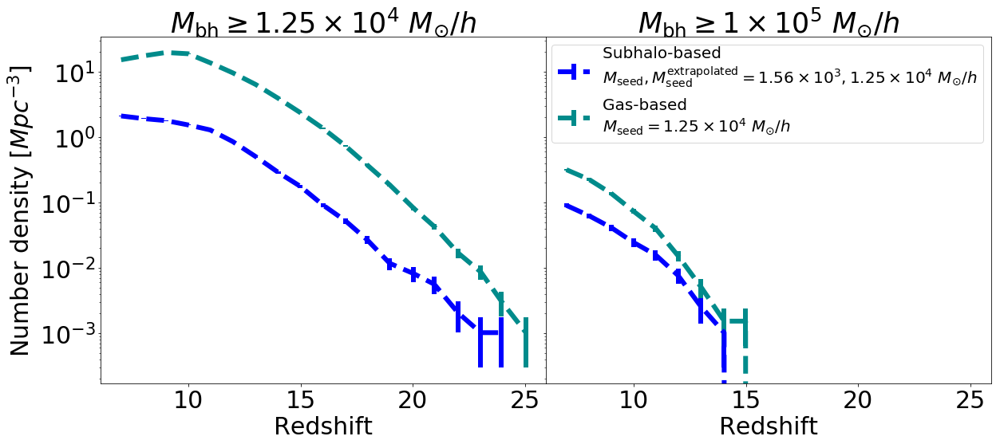

In [33]:
def make_plot(ax1,ax2,ax3,style='solid',col='black',plot1=True,plot2=True,plot3=True,redo=0):
    
        boxsize=arepo_package.get_box_size(basePath)
        boxsize/=1e3
       
        len1=[]
        len2=[]
        len3=[]
        z_space=[]
        
        if(os.path.exists(basePath+'/number_of_BHs_4.10.npy') & (redo==0)):
            #z_space,len1=numpy.load(basePath+'/number_of_BHs_3.10.npy')
            z_space,len2=numpy.load(basePath+'/number_of_BHs_4.10.npy')
            z_space,len3=numpy.load(basePath+'/number_of_BHs_5.00.npy')    
        else:
        
            for redshift in [7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]:
                try:
                    BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
                    len1.append(len(BH_Mass[BH_Mass>=mass_cut1/1e10]))
                    len2.append(len(BH_Mass[BH_Mass>=mass_cut2/1e10]))
                    len3.append(len(BH_Mass[BH_Mass>=mass_cut3/1e10]))
                    z_space.append(o)
                except:
                    aaa=1



            len1=numpy.array(len1)
            len2=numpy.array(len2)
            len3=numpy.array(len3)
            z_space=numpy.array(z_space)

            #numpy.save(basePath+'/number_of_BHs_3.10.npy',[z_space,len1])
            numpy.save(basePath+'/number_of_BHs_4.10.npy',[z_space,len2])
            numpy.save(basePath+'/number_of_BHs_5.00.npy',[z_space,len3])


        #if(plot1):
        #    ax1.errorbar(z_space,len1/boxsize**3,numpy.sqrt(len1)/boxsize**3,color=col,linewidth=6,linestyle=style,label='SM%d_FOF%d'%(Msfmp,Mh))
        if(plot2):
            ax2.errorbar(z_space,len2/boxsize**3,numpy.sqrt(len2)/boxsize**3,color=col,linewidth=6,linestyle=style)
        if(plot3):
            ax3.errorbar(z_space,len3/boxsize**3,numpy.sqrt(len3)/boxsize**3,color=col,linewidth=6,linestyle=style,label=box_label)
        ax1.set_xlabel('Redshift',fontsize=label_fontsize)
        ax2.set_xlabel('Redshift',fontsize=label_fontsize)
        ax3.set_xlabel('Redshift',fontsize=label_fontsize)
        
        ax1.tick_params(labelsize=30)
        ax1.set_yscale('log')
        ax2.tick_params(labelsize=30)
        ax2.set_yscale('log')
        ax3.tick_params(labelsize=30)
        ax3.set_yscale('log')
        
        ax1.set_title(r'$M_{\mathrm{bh}} \geq 1.56\times10^3 \ M_{\odot}/h$',fontsize=35)
        ax2.set_title(r'$M_{\mathrm{bh}} \geq 1.25\times10^4 \ M_{\odot}/h$',fontsize=35)
        ax3.set_title(r'$M_{\mathrm{bh}} \geq 1\times10^5 \ M_{\odot}/h$',fontsize=35)



label_fontsize=30      
f,axx=plt.subplots(1,2,figsize=(20,8),sharey=True,sharex=True)

            
mass_cut1=1.25e4
mass_cut2=1.25e4
mass_cut3=1e5
levelmax_gas,logseedmass_gas=12,3.19

Mh,Msfmp=3000,5




box_label='Subhalo-based \n' + r'$M_{\mathrm{seed}},M^{\mathrm{extrapolated}}_{\mathrm{seed}}=1.56\times10^3,1.25\times10^4 \ M_{\odot}/h$'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[0],axx[1],style='dashed',col='blue',plot1=False,plot2=True,plot3=True)

box_label='Gas-based \n'+ r'$M_{\mathrm{seed}}=1.25\times10^4 \ M_{\odot}/h$'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/L12p5n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed4.10_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[0],axx[0],axx[1],style='dashed',col='darkcyan',plot1=True,plot2=True,plot3=True,redo=0)



#axx[0].legend(loc='lower left',fontsize=28)

axx[1].legend(loc='upper right',fontsize=20)
#axx[0].set_title('$M_{bh}>1.5e3 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[1].set_title('$M_{bh}>1.25e4 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[2].set_title('$M_{bh}>1e5 \ M_{\odot}/h$',fontsize=label_fontsize)


#axx[0].set_ylim(1e-1,4000)


axx[0].set_ylabel('Number density $[Mpc^{-3}]$',fontsize=30)

plt.subplots_adjust(hspace=0,wspace=0)

plt.savefig('./Paper6_figures/Number_density_seed_mass.png',bbox_inches='tight')


In [11]:
def get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=0,HDF5=0,path_to_hdf5='./'):
    if(HDF5):
        fobj=h5py.File(path_to_hdf5)
        scale_fac_complete_sorted=fobj.get('time')[:]
        primary_mass_sorted=fobj.get('mass_out')[:]
        secondary_mass_sorted=fobj.get('mass_in')[:]
    else:
        scale_fac_complete_sorted,primary_mass_sorted,secondary_mass_sorted,primary_id_sorted,secondary_id_sorted,file_id_complete_sorted,N_empty=arepo_package.get_merger_events_from_snapshot(basePath,upto_redshift,HOSTS=0)
    mass_ratio=secondary_mass_sorted/primary_mass_sorted
    #print(mass_ratio[mass_ratio>1.])
        #print(primary_mass_sorted,secondary_mass_sorted)
    merger_redshifts=1./scale_fac_complete_sorted-1.
    #print(merger_redshifts)
    
    #print(merger_redshifts)
    
    #print("###",primary_mass_sorted)
    mask_primary=primary_mass_sorted>=mass_cut/1e10
    mask_secondary=secondary_mass_sorted>=mass_cut/1e10
    mask_total_mass=(primary_mass_sorted+secondary_mass_sorted)>total_mass_cut/1e10
    mask_redshift=merger_redshifts>=redshift_cut
    mask_ratio_cut=mass_ratio>=mass_ratio_cut
    mask=((mask_primary&mask_secondary)&(mask_redshift&mask_ratio_cut))&mask_total_mass
    merger_redshifts=merger_redshifts[mask]
  
   # print("!!!",merger_redshifts)
    bins, dist, dist_err,norm,counts_sum=arepo_package.get_probability_density(merger_redshifts,nbins,min_value,max_value,linear=linear)
   # print(dist)
    dist*=counts_sum

    dist_err*=counts_sum
    dt=numpy.array([T(zz-norm/2,zz+norm/2) for zz in bins])
    

    dz=numpy.diff(bins)[0]
    #print("!!!",dist)    
    dz_dt=numpy.array([dz/T(zz-dz/2,zz+dz/2) for zz in bins])
    
    return bins,dist,dist_err,norm,dz_dt



def get_merger_distributions_hosts(basePath,nbins,min_value,max_value,mass_cut,linear=0,HDF5=0,path_to_hdf5='./'):
    if(HDF5):
        fobj=h5py.File(path_to_hdf5)
        scale_fac_complete_sorted=fobj.get('time')[:]
        primary_mass_sorted=fobj.get('mass_out')[:]
        secondary_mass_sorted=fobj.get('mass_in')[:]
    else:
        scale_fac_complete,BH_id_primary,BH_mass_primary,hosthalomass_primary,hosthalostellarmass_primary,hosthalogasmass_primary,hosthalodmmass_primary,BH_id_secondary,BH_mass_secondary,hosthalomass_secondary,hosthalostellarmass_secondary,hosthalogasmass_secondary,hosthalodmmass_secondary,file_id_complete=arepo_package.get_merger_events_hosts(basePath)        #print(primary_mass_sorted,secondary_mass_sorted)
    merger_redshifts=1./scale_fac_complete-1.
    mask_primary=BH_mass_primary>=mass_cut/1e10
    mask_secondary=BH_mass_secondary>=mass_cut/1e10
    mask=mask_primary&mask_secondary
    
    maskhost1=hosthalomass_primary+hosthalomass_secondary>14.2e10/1e10*h
    maskhost2=hosthalomass_primary>7.1e10/1e10*h
    maskhost3=hosthalodmmass_primary>2e9/1e10*h
    maskhost4=hosthalodmmass_secondary>2e9/1e10*h
    maskhost5=hosthalostellarmass_primary>1e8/1e10*h   
    maskhost6=hosthalostellarmass_secondary>1e8/1e10*h
    
    if(apply_host_cuts==0):
        maskhost=mask
    else:
        maskhost=((((maskhost1&maskhost2)&maskhost3)&maskhost4)&maskhost5)&maskhost6
    
    
    merger_redshifts=merger_redshifts[mask&maskhost]
    
    bins, dist, dist_err,norm,counts_sum=arepo_package.get_probability_density(merger_redshifts,nbins,min_value,max_value,linear=linear)
    
    dt=numpy.array([T(zz-norm/2,zz+norm/2) for zz in bins])
    
    
    dz=numpy.diff(bins)[0]
    
    dz_dt=numpy.array([dz/T(zz-dz/2,zz+dz/2) for zz in bins])
    
    return bins,dist,dist_err,norm,dz_dt

In [12]:
path_to_TNG100='/orange/lblecha/IllustrisTNG/Runs/L75n1820TNG/postprocessing/blackholes/blackhole_mergers.hdf5'

path_to_TNG300='/orange/lblecha/IllustrisTNG/Runs/L205n1250TNG/postprocessing/blackholes/blackhole_mergers.hdf5'
path_to_Illustris='/orange/lblecha/Illustris/L75n1820FP/postprocessing/released/blackhole_mergers.hdf5'

18 7.005417045544533
Total number of mergers 19624


ValueError: operands could not be broadcast together with shapes (19,) (19,14) (19,) 

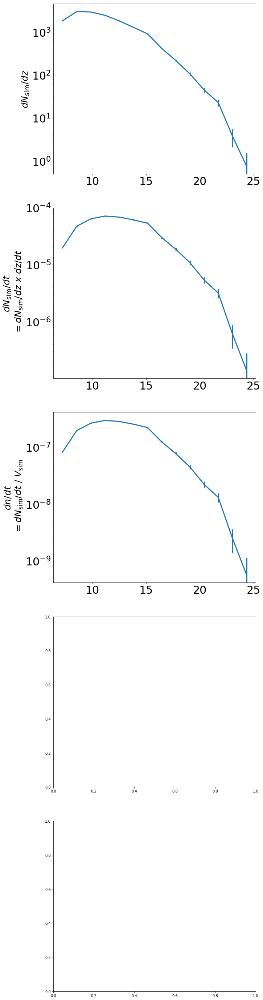

In [33]:

f,ax=plt.subplots(5,1,figsize=(10,50))

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=0
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=0

def do():
    HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_TNG100)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=75**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3





    merger_rate=dist*1.
    merger_rate_err=dist_err*1.
    mask=dist>0
    ax[0].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax[0].set_yscale('log')
    ax[0].set_ylabel('$dN_{\mathrm{sim}}/dz$',fontsize=25)
    ax[0].tick_params(labelsize=30)

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt
    mask=dist>0
    ax[1].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax[1].set_yscale('log')
    ax[1].set_ylabel('$dN_\mathrm{sim}/dt$ \n $=dN_\mathrm{sim}/dz \ x \ dz/dt$',fontsize=25)
    ax[1].tick_params(labelsize=30)


    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume
    mask=dist>0
    ax[2].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax[2].set_yscale('log')
    ax[2].set_ylabel('$dn/dt$ \n $=dN_\mathrm{sim}/dt \ / \ V_{\mathrm{sim}}$',fontsize=25)
    ax[2].tick_params(labelsize=30)

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell
    mask=dist>0
    ax[3].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax[3].set_yscale('log')
    ax[3].set_ylabel('$dN/dz dt$ \n $=dn/dt \ x \ 4 \pi r^2 dr/dz $',fontsize=25)
    ax[3].tick_params(labelsize=30)   

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)
    mask=dist>0
    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax[4].set_yscale('log')
    ax[4].set_ylabel('$d^2 N/dz dt^{\mathrm{obs}}$\n $= dN/dz dt \ / \ (1+z) $',fontsize=25)
    ax[4].set_ylabel('$d^2 N/dz dt \ [\mathrm{yr}^{-1}]$',fontsize=30)
    ax[4].tick_params(labelsize=30)

    ax[4].set_xlabel('Redshift',fontsize=30)


    print (dist)
    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=dist>0
    ax[4].errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3,color=col,linestyle=style)
    ax[4].set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1e3
style='solid'

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='orange'
do()


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio10000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='blue'
do()


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM150_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='green'
do()


'''
mass_cut=1.25e4
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='orange'
do()


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio10000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='blue'
do()


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM150_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='green'
do()


style='solid'

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh10000_double_powerlaw_env_5_0.1_0.3_slope1.6/'

basePath=path_to_output+run+output
col='blue'
do()


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp150_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6/'

basePath=path_to_output+run+output
col='green'
do()
'''
ax[4].set_ylim(0.01,2000)
ax[4].set_xlim(6.8,26)
plt.subplots_adjust(hspace=0.3)


18 7.005417045544533
Total number of mergers 32012
18 7.005417045544533
Total number of mergers 19624
18 7.005417045544533
Total number of mergers 6893
18 7.005417045544533
Total number of mergers 2970
18 7.005417045544533
Total number of mergers 32012
18 7.005417045544533
Total number of mergers 19624
18 7.005417045544533
Total number of mergers 6893
18 7.005417045544533
Total number of mergers 2970
18 7.005417045544533
Total number of mergers 2336
18 7.005417045544533
Total number of mergers 249
27 0.5030475232448832
Total number of mergers 314
18 7.005417045544533
Total number of mergers 264
27 0.5030475232448832
Total number of mergers 729
18 7.005417045544533
Total number of mergers 2336
18 7.005417045544533
Total number of mergers 264
27 0.5030475232448832
Total number of mergers 729
18 7.005417045544533
Total number of mergers 249
27 0.5030475232448832
Total number of mergers 314
18 7.005417045544533
Total number of mergers 1762
18 7.005417045544533
Total number of mergers 537
3

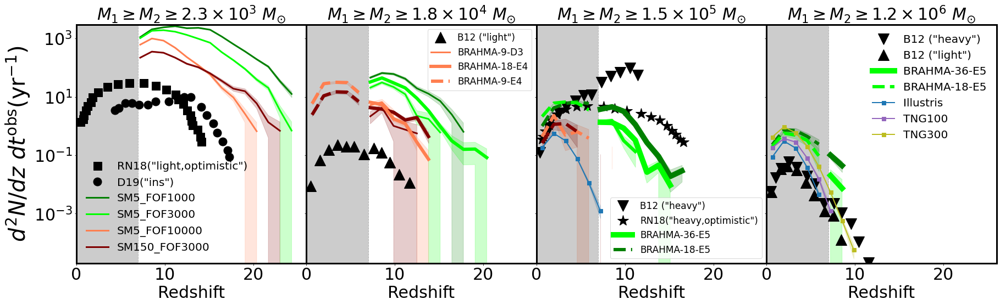

In [13]:

f,axx=plt.subplots(1,4,figsize=(30,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=0
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=0

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark='',max_z=0):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=30)

    ax.set_xlabel('Redshift',fontsize=30)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    fstyle=style
    if(max_z==1):
        fstyle='dashed'
        mask=mask&(bins<7)

    ax.errorbar(bins[mask],merger_rate2[mask],label=labl,linewidth=width,color=col,linestyle=fstyle,marker=mark,ms=7)
    ax.fill_between(bins[mask],merger_rate2[mask]+merger_rate_err2[mask],merger_rate2[mask]-merger_rate_err2[mask],color=col,alpha=0.2)
    
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])


data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/merger_rate_1e6_Barausse_heavy.txt')

axx[3].errorbar(data[:,0],data[:,1],label='B12 ("heavy")',marker='v',ms=20,linestyle='',linewidth=3,color='black')

data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/merger_rate_1e6_Barausse_light.txt')
axx[3].errorbar(data[:,0],data[:,1],label='B12 ("light")',marker='^',ms=20,linestyle='',linewidth=3,color='black')


#data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/merger_rate_ASTRID_all_mergers.txt')
#axx[1].errorbar(data[:,0],data[:,1],label='ASTRID (all mergers)',marker='s',ms=7,linestyle='solid',linewidth=2,color='violet')

data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/merger_rate_1e4_Barausse_heavy.txt')
axx[2].errorbar(data[:,0],data[:,1],label='B12 ("heavy")',marker='v',ms=20,linestyle='',linewidth=3,color='black')


data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/merger_rate_1e4_Barausse_light.txt')
axx[1].errorbar(data[:,0],data[:,1],label='B12 ("light")',marker='^',ms=20,linestyle='',linewidth=3,color='black')

data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/merger_rate_light_RB_optimistic.txt')
axx[0].errorbar(data[:,0],data[:,1]/4,marker='s',ms=15,linestyle='',label='RN18("light,optimistic")',linewidth=3,color='black')

data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/merger_rate_heavy_RB_optimistic.txt')
axx[2].errorbar(data[:,0],data[:,1]/4,marker='*',ms=20,linestyle='',label='RN18("heavy,optimistic")',linewidth=3,color='black')



data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/merger_rate_all_Dayal_correct.txt')
axx[0].errorbar(data[:,0],data[:,1],marker='o',ms=15,linestyle='',label='D19("ins")',linewidth=3,color='black')

 

mass_cut=-1

style='solid'
ax=axx[0]
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='green'
do('SM5_FOF1000',width=3)


style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='green'
#do('',width=4)





style='solid'
ax=axx[0]
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='lime'
do('SM5_FOF3000',width=3)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio10000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='coral'
do('SM5_FOF10000',width=3)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM150_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='maroon'
do('SM150_FOF3000',width=3)

style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM150_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='maroon'
#do('',width=4)


mass_cut=1.25e4
style='solid'
ax=axx[1]


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='green'
do(width=3)

style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='green'
#do('BRAHMA-3.125-R3',width=4)



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='lime'
do(width=3)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio10000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='coral'
do('BRAHMA-9-D3',width=3)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM150_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='maroon'
do(width=3)

style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM150_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='maroon'
#do('',width=4)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='lime'
do(width=6)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp150_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='maroon'
do(width=6)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n512/AREPO/' # name of the simulation runs
output='/output_Msfmp150_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='maroon'
do(width=6,max_z=1)






path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh10000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='coral'
do(labl='BRAHMA-18-E4',width=6)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n512/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh10000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='coral'
do(width=6,labl='BRAHMA-9-E4',max_z=1)



mass_cut=1e5
style='solid'
ax=axx[2]

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='black'
#do()

style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='black'
#do('',width=4)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='blue'
#do(labl='BRAHMA-6.25-R3')


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio10000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='green'
#do(width=3)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM150_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='orange'
#do(width=3)



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='lime'
do(width=6)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh10000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='coral'
do(width=6)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n512/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh10000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='coral'
do(width=6,max_z=1)




path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp150_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='maroon'
do(width=6)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n512/AREPO/' # name of the simulation runs
output='/output_Msfmp150_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='maroon'
do(width=6,max_z=1)




path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L25n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh1000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='green'
do(width=10)



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L25n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='lime'
upto_redshift=7
do(labl='BRAHMA-36-E5',width=10)



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n512/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh1000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='green'
upto_redshift=0
do(labl='BRAHMA-18-E5',width=6,max_z=1)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n512/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='lime'
do(width=6,max_z=1)


#style='solid'

style='solid'
mass_cut=1e5
col='C0'
do(width=2,HDF5=1,path_to_hdf5=path_to_Illustris,box_length=75,mark='s')



mass_cut=8e5
style='solid'
ax=axx[3]

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='green'
#do()

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col=''
#do(labl='',width=3)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio10000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='lime'
#do(width=3)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM150_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='orange'
#do(width=3)



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='lime'
do(labl='',width=6)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh10000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='coral'
do(width=6)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp150_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='maroon'
do(width=6)



style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L25n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh1000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='green'
do(width=10)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n512/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh1000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='green'
do(width=6,max_z=1)



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L25n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
upto_redshift=7
col='lime'
do(width=10,labl='BRAHMA-36-E5')


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n512/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
upto_redshift=0
col='lime'
do(width=6,labl='BRAHMA-18-E5',max_z=1)







style='solid'
mark='s'

col='C0'
do(width=2,HDF5=1,path_to_hdf5=path_to_Illustris,box_length=75,labl='Illustris',mark=mark)

col='C4'
do(width=2,HDF5=1,path_to_hdf5=path_to_TNG100,box_length=75,labl='TNG100',mark=mark)

col='C8'
do(width=2,HDF5=1,path_to_hdf5=path_to_TNG300,box_length=205,labl='TNG300',mark=mark)



for i in [0,1,2,3]:
    axx[i].axvspan(0,7,color='black',alpha=0.2,linestyle='dashed')
    
    


#data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/merger_rate_light_RB_optimistic.txt')
#axx[1].errorbar(data[:,0],data[:,1]/4,marker='o',ms=7,linestyle='',linewidth=3,color='C3')


        
axx[0].set_title(r'$M_1\geq M_2 \geq 2.3\times10^3 \ M_{\odot}$',fontsize=30)
axx[1].set_title(r'$M_1\geq M_2 \geq 1.8\times10^4 \ M_{\odot}$',fontsize=30)
axx[2].set_title(r'$M_1\geq M_2 \geq 1.5\times10^5 \ M_{\odot}$',fontsize=30)
axx[3].set_title(r'$M_1\geq M_2 \geq 1.2\times10^6 \ M_{\odot}$',fontsize=30)





axx[0].set_ylabel('$d^2 N/dz \ dt^{\mathrm{obs}}(\mathrm{yr}^{-1})$',fontsize=40)

axx[0].legend(loc='lower left',fontsize=20,frameon=False)
axx[1].legend(loc='upper right',fontsize=17,frameon=True)
axx[2].legend(loc='lower right',fontsize=17,frameon=True)
axx[3].legend(loc='upper right',fontsize=20,frameon=False)
axx[0].set_ylim(0.00002,3000)
axx[0].set_xlim(0,26)


for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)


plt.subplots_adjust(hspace=0,wspace=0)

plt.savefig('./Paper6_figures/merger_rates.png',bbox_inches='tight')



18 7.005417045544533
Total number of mergers 32012
18 7.005417045544533
Total number of mergers 19624
18 7.005417045544533
Total number of mergers 6893
18 7.005417045544533
Total number of mergers 2970
18 7.005417045544533
Total number of mergers 32012
18 7.005417045544533
Total number of mergers 19624
18 7.005417045544533
Total number of mergers 6893
18 7.005417045544533
Total number of mergers 2970
18 7.005417045544533
Total number of mergers 2336
18 7.005417045544533
Total number of mergers 249
27 0.5030475232448832
Total number of mergers 314
18 7.005417045544533
Total number of mergers 264
18 7.005417045544533
Total number of mergers 32012
18 7.005417045544533
Total number of mergers 19624
18 7.005417045544533
Total number of mergers 2336
18 7.005417045544533
Total number of mergers 264
27 0.5030475232448832
Total number of mergers 729
18 7.005417045544533
Total number of mergers 249
27 0.5030475232448832
Total number of mergers 314
18 7.005417045544533
Total number of mergers 176

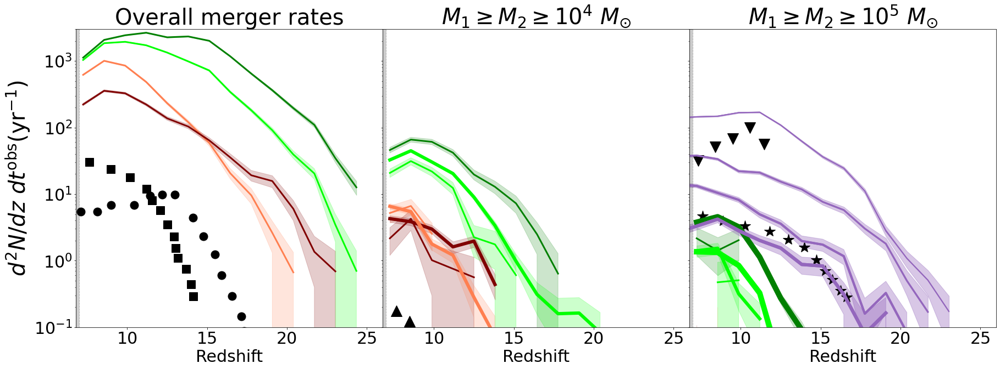

In [25]:

f,axx=plt.subplots(1,3,figsize=(30,10),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=0
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=0

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark='',max_z=0):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=30)

    ax.set_xlabel('Redshift',fontsize=30)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    fstyle=style
    if(max_z==1):
        fstyle='dashed'
        mask=mask&(bins<7)

    ax.errorbar(bins[mask],merger_rate2[mask],label=labl,linewidth=width,color=col,linestyle=fstyle,marker=mark,ms=7)
    ax.fill_between(bins[mask],merger_rate2[mask]+merger_rate_err2[mask],merger_rate2[mask]-merger_rate_err2[mask],color=col,alpha=0.2)
    
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])


#data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/merger_rate_1e6_Barausse_heavy.txt')

#axx[3].errorbar(data[:,0],data[:,1],label='B12 ("heavy")',marker='v',ms=20,linestyle='',linewidth=3,color='black')

#data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/merger_rate_1e6_Barausse_light.txt')
#axx[3].errorbar(data[:,0],data[:,1],label='B12 ("light")',marker='^',ms=20,linestyle='',linewidth=3,color='black')


#data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/merger_rate_ASTRID_all_mergers.txt')
#axx[1].errorbar(data[:,0],data[:,1],label='ASTRID (all mergers)',marker='s',ms=7,linestyle='solid',linewidth=2,color='violet')

data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/merger_rate_1e4_Barausse_heavy.txt')
axx[2].errorbar(data[:,0],data[:,1],label='B12 ("heavy")',marker='v',ms=20,linestyle='',linewidth=3,color='black')


data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/merger_rate_1e4_Barausse_light.txt')
axx[1].errorbar(data[:,0],data[:,1],label='B12 ("light")',marker='^',ms=20,linestyle='',linewidth=3,color='black')

data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/merger_rate_light_RB_optimistic.txt')
axx[0].errorbar(data[:,0],data[:,1]/4,marker='s',ms=15,linestyle='',label='RN18("light,optimistic")',linewidth=3,color='black')

data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/merger_rate_heavy_RB_optimistic.txt')
axx[2].errorbar(data[:,0],data[:,1]/4,marker='*',ms=20,linestyle='',label='RN18("heavy,optimistic")',linewidth=3,color='black')



data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/merger_rate_all_Dayal_correct.txt')
axx[0].errorbar(data[:,0],data[:,1],marker='o',ms=15,linestyle='',label='D19("ins")',linewidth=3,color='black')

 

mass_cut=-1

style='solid'
ax=axx[0]
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='green'
do('SM5_FOF1000',width=3)


style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='green'
#do('',width=4)





style='solid'
ax=axx[0]
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='lime'
do('SM5_FOF3000',width=3)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio10000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='coral'
do('SM5_FOF10000',width=3)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM150_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='maroon'
do('SM150_FOF3000',width=3)

style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM150_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='maroon'
#do('',width=4)


mass_cut=1.25e4
style='solid'
ax=axx[1]


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='green'
do(width=3)

style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='green'
#do('BRAHMA-3.125-R3',width=4)



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='lime'
do(width=3)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio10000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='coral'
do('BRAHMA-9-D3',width=3)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM150_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='maroon'
do(width=3)

style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM150_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='maroon'
#do('',width=4)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='lime'
do(width=6)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp150_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='maroon'
do(width=6)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n512/AREPO/' # name of the simulation runs
output='/output_Msfmp150_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='maroon'
do(width=6,max_z=1)






path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh10000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='coral'
do(labl='BRAHMA-18-E4',width=6)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n512/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh10000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='coral'
#do(width=6,labl='BRAHMA-9-E4',max_z=1)



mass_cut=1e5
style='solid'
ax=axx[2]

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='green'
do(width=3)



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='lime'
do(width=3,labl='BRAHMA-6.25-D3')


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio10000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='green'
#do(width=3)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM150_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='orange'
#do(width=3)



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='lime'
do(labl='BRAHMA-18-E4',width=6)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh10000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='coral'
do(width=6)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n512/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh10000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='coral'
do(width=6,max_z=1)




path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp150_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='maroon'
do(width=6)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n512/AREPO/' # name of the simulation runs
output='/output_Msfmp150_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='maroon'
do(width=6,max_z=1)




path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L25n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh1000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='green'
do(width=10)



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L25n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='lime'
upto_redshift=7
do(labl='BRAHMA-36-E5',width=10)



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n512/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh1000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='green'
upto_redshift=0
#do(labl='BRAHMA-18-E5',width=6,max_z=1)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n512/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='lime'
do(width=6,max_z=1)


#style='solid'

style='solid'
mass_cut=1e5
col='C0'
#do(width=2,HDF5=1,path_to_hdf5=path_to_Illustris,box_length=75,mark='s')


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS2/L12p5n512///' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio10_SFMFGM5_seed5.00_bFOF_LW10_spin_rich/'
basePath=path_to_output+run+output

col='C4'
mass_cut=1
style='solid'
#ax=axx[0]

do(width=6)
mass_cut=1e5
style='solid'
ax=axx[2]
do(width=6)

box_label=''


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS2/L12p5n512///' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio10_SFMFGM5_seed5.00_bFOF_LW10_spin/'
basePath=path_to_output+run+output

col='C4'
mass_cut=1
style='solid'
#ax=axx[0]

do(width=4)
mass_cut=1e5
style='solid'
ax=axx[2]
do(width=4)


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS2/L12p5n512///' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio10_SFMFGM5_seed5.00_bFOF_LW10/'
basePath=path_to_output+run+output

col='C4'
mass_cut=1
style='solid'
#ax=axx[0]

do(width=3)
mass_cut=1e5
style='solid'
ax=axx[2]
do(width=3)

path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS2/L12p5n512///' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='/output_ratio10_SFMFGM5_seed5.00_bFOF/'
basePath=path_to_output+run+output

col='C4'
mass_cut=1
style='solid'
#ax=axx[0]

do(width=2)
mass_cut=1e5
style='solid'
ax=axx[2]
do(width=2)



#style='solid'
#ark='s'

#col='C0'
#do(width=2,HDF5=1,path_to_hdf5=path_to_Illustris,box_length=75,labl='Illustris',mark=mark)

#col='C4'
#do(width=2,HDF5=1,path_to_hdf5=path_to_TNG100,box_length=75,labl='TNG100',mark=mark)

#col='C8'
#do(width=2,HDF5=1,path_to_hdf5=path_to_TNG300,box_length=205,labl='TNG300',mark=mark)



for i in [0,1,2]:
    axx[i].axvspan(0,7,color='black',alpha=0.2,linestyle='dashed')
    
    


#data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/merger_rate_light_RB_optimistic.txt')
#axx[1].errorbar(data[:,0],data[:,1]/4,marker='o',ms=7,linestyle='',linewidth=3,color='C3')


        
axx[0].set_title(r'Overall merger rates',fontsize=40)
axx[1].set_title(r'$M_1\geq M_2 \geq 10^4 \ M_{\odot}$',fontsize=40)
axx[2].set_title(r'$M_1\geq M_2 \geq 10^5 \ M_{\odot}$',fontsize=40)
#axx[3].set_title(r'$M_1\geq M_2 \geq 10^6 \ M_{\odot}$',fontsize=30)





axx[0].set_ylabel('$d^2 N/dz \ dt^{\mathrm{obs}}(\mathrm{yr}^{-1})$',fontsize=40)

#axx[0].legend(loc='lower left',fontsize=25,frameon=False)
#axx[1].legend(loc='upper right',fontsize=25,frameon=False)
#axx[2].legend(loc='upper right',fontsize=25,frameon=False)
#axx[3].legend(loc='upper right',fontsize=20,frameon=False)
axx[0].set_ylim(0.1,3000)
axx[0].set_xlim(6.8,26)
plt.subplots_adjust(hspace=0,wspace=0)

#plt.savefig('./Paper6_figures/merger_rates.png',bbox_inches='tight')



18 7.005417045544533
Total number of mergers 205
16 9.00233985416247


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


Total number of mergers 121


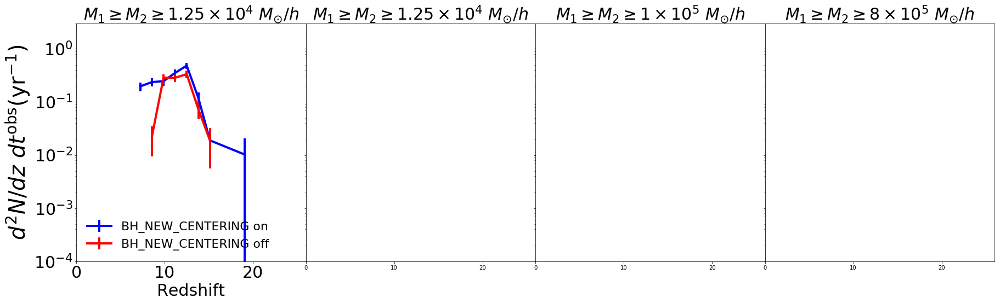

In [55]:

f,axx=plt.subplots(1,4,figsize=(30,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=0
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=7

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark=''):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=30)

    ax.set_xlabel('Redshift',fontsize=30)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=width,color=col,linestyle=style,marker=mark,ms=7)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1.25e4

style='solid'
ax=axx[0]



col='blue'
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4////' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax11_haloindex4_redshift5.00_logbhseedmass4.10_NSC/AREPO/' # name of the simulation runs
output='/output_Msfmp50_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6_unresolved/'
basePath=path_to_output+run+output

do(width=4,labl='BH_NEW_CENTERING on')


col='red'
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4////' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax11_haloindex4_redshift5.00_logbhseedmass4.10_NSC/AREPO/' # name of the simulation runs
output='/output_Msfmp50_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6_unresolved_low_soft/'
basePath=path_to_output+run+output

do(width=4,labl='BH_NEW_CENTERING off')

  


#data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/merger_rate_light_RB_optimistic.txt')
#axx[1].errorbar(data[:,0],data[:,1]/4,marker='o',ms=7,linestyle='',linewidth=3,color='C3')


        
axx[0].set_title(r'$M_1\geq M_2 \geq 1.25\times10^4 \ M_{\odot}/h$',fontsize=30)
axx[1].set_title(r'$M_1\geq M_2 \geq 1.25\times10^4 \ M_{\odot}/h$',fontsize=30)
axx[2].set_title(r'$M_1\geq M_2 \geq 1\times10^5 \ M_{\odot}/h$',fontsize=30)
axx[3].set_title(r'$M_1\geq M_2 \geq 8\times10^5 \ M_{\odot}/h$',fontsize=30)





axx[0].set_ylabel('$d^2 N/dz \ dt^{\mathrm{obs}}(\mathrm{yr}^{-1})$',fontsize=40)

axx[0].legend(loc='lower left',fontsize=22,frameon=False)
axx[1].legend(loc='upper right',fontsize=22,frameon=False)
axx[2].legend(loc='upper right',fontsize=22,frameon=False)
axx[3].legend(loc='upper right',fontsize=22,frameon=False)
axx[0].set_ylim(0.0001,3)
axx[0].set_xlim(0,26)
plt.subplots_adjust(hspace=0,wspace=0)

#plt.savefig('./Paper6_figures/merger_rates.png',bbox_inches='tight')



21 4.0079451114652676
Total number of mergers 4604
21 4.0079451114652676
Total number of mergers 4111
21 4.0079451114652676
Total number of mergers 4604
21 4.0079451114652676
Total number of mergers 4111
21 4.0079451114652676
Total number of mergers 4604
21 4.0079451114652676
Total number of mergers 4111
21 4.0079451114652676
Total number of mergers 4604
21 4.0079451114652676
Total number of mergers 4111


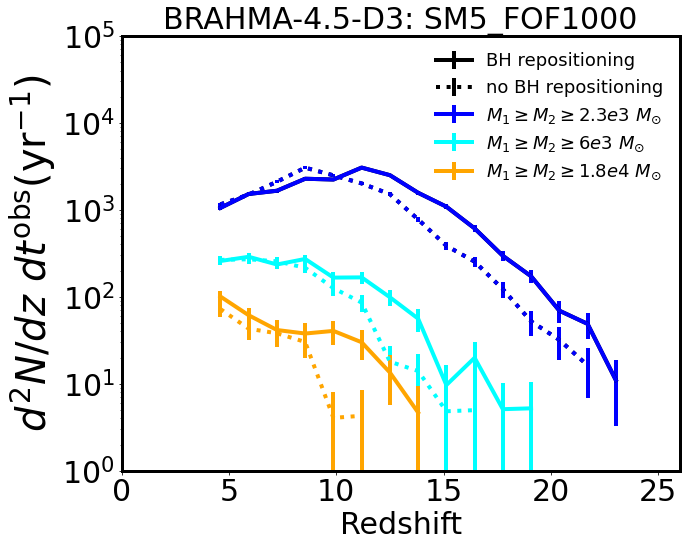

In [14]:

f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=0
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=4

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark=''):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=30)

    ax.set_xlabel('Redshift',fontsize=30)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=width,color=col,linestyle=style,marker=mark,ms=7)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1.56e3

style='solid'
ax=axx

col='black'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
do(width=4,labl=r'BH repositioning')


col='black'
style='dotted'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF_no_repositioning2/' 
basePath=path_to_output+run+output
do(width=4,labl='no BH repositioning')

col='blue'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
do(width=4,labl=r'$M_1\geq M_2 \geq 2.3e3 \ M_{\odot}$')


col='blue'
style='dotted'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF_no_repositioning2/' 
basePath=path_to_output+run+output
do(width=4,labl='')





mass_cut=4e3

style='solid'
ax=axx

col='cyan'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
do(width=4,labl=r'$M_1\geq M_2 \geq 6e3 \ M_{\odot}$')


col='cyan'
style='dotted'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF_no_repositioning2/' 
basePath=path_to_output+run+output
do(width=4,labl='')



mass_cut=1.25e4

style='solid'
ax=axx

col='orange'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
do(width=4,labl=r'$M_1\geq M_2 \geq 1.8e4 \ M_{\odot}$')


col='orange'
style='dotted'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF_no_repositioning2/' 
basePath=path_to_output+run+output
do(width=4,labl='')





#data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/merger_rate_light_RB_optimistic.txt')
#axx[1].errorbar(data[:,0],data[:,1]/4,marker='o',ms=7,linestyle='',linewidth=3,color='C3')


        
axx.set_title('BRAHMA-4.5-D3: SM5_FOF1000',fontsize=30)





axx.set_ylabel('$d^2 N/dz \ dt^{\mathrm{obs}}(\mathrm{yr}^{-1})$',fontsize=40)

axx.legend(loc='upper right',fontsize=18,frameon=False)

axx.set_ylim(1,1e5)
axx.set_xlim(0,26)
plt.subplots_adjust(hspace=0,wspace=0)


axx.spines['top'].set_linewidth(3)    # Top axis
axx.spines['bottom'].set_linewidth(3) # Bottom axis
axx.spines['left'].set_linewidth(3)   # Left axis
axx.spines['right'].set_linewidth(3)

plt.savefig('./Paper6_figures/merger_rates_testing_repositioning.png',bbox_inches='tight')



21 4.0079451114652676
Total number of mergers 4604
16 9.00233985416247
Total number of mergers 1884
18 7.005417045544533
Total number of mergers 2997
11 14.033992144452485
Total number of mergers 6


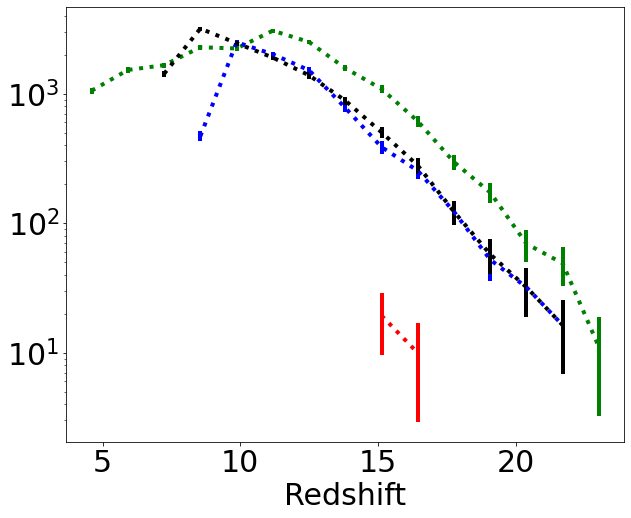

In [11]:

f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=0
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=4

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark=''):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=30)

    ax.set_xlabel('Redshift',fontsize=30)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=width,color=col,linestyle=style,marker=mark,ms=7)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1.56e3

style='solid'
ax=axx


col='green'
style='dotted'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
do(width=4,labl='')

col='blue'
style='dotted'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF_no_repositioning2/' 
basePath=path_to_output+run+output
do(width=4,labl='')

col='black'
style='dotted'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF_discreteDF/' 
basePath=path_to_output+run+output
do(width=4,labl='')


col='red'
style='dotted'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF_discreteDF_HDM4.10/' 
basePath=path_to_output+run+output
do(width=4,labl='')










18 7.005417045544533
Total number of mergers 21917
!!! [16.39211307 14.17714122 12.49767156 ...  7.92717142  7.89023566
  7.04343938]
[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 1.62004747e-01 2.29685959e-01 1.68734709e-01
 1.03030856e-01 5.73087457e-02 2.32426511e-02 1.05806098e-02
 3.64250502e-03 1.31823991e-03 2.77524192e-04 1.73452620e-04
 0.00000000e+00 0.00000000e+00 0.00000000e+00]
18 7.005417045544533
Total number of mergers 2405
!!! [12.43386731  8.84657208  8.07376701 ...  8.09259661  7.60911819
  8.57908399]
[0.         0.         0.         0.         0.         0.18438618
 0.24258011 0.15781939 0.0926675  0.05028714 0.01992509 0.00727424
 0.00347898 0.00126509 0.         0.00031627 0.         0.
 0.        ]
18 7.005417045544533
Total number of mergers 21917


No handles with labels found to put in legend.


!!! [ 8.60464901  7.4324875   8.51405938  7.90340924  8.32438329  8.94032799
  8.57057729 11.97252768  7.59001761  7.48886253  8.10607014  7.58493143
  9.30908721  7.89550265  8.32438329  9.99007928 10.27023624  7.69495293
  9.36111898  9.17562754  9.03200534  8.71909993  9.05580067  7.98818451
  7.51656081  7.06729471  7.11281538  9.3580509   7.97754385  9.28469265
  7.83773565  8.39089204 10.62619127  9.05877898  7.58747459 10.24356674
  7.17189198  8.70471962  9.77097629  7.07446537  7.84035337  7.24848075
  7.82988713  8.15745224  7.50773813  7.36161566  7.55194426 10.13751891
  8.48030881  7.90340924  8.69323014  7.33442124  8.77973211  7.36780877
  7.14169729  8.41037934  9.7010296   7.29011214  7.64488563  7.11521797
  9.3980049   8.291306    9.3580509   8.8087372   9.03200534  9.44429777
  9.16358084  7.71170612  9.44429777  7.3245542   9.25124358  7.23627602
  7.43123898  8.31334453 10.07174782  7.36285407  7.71557724  7.70525908
 10.0750267   7.10561073  7.12002596  9.0916002

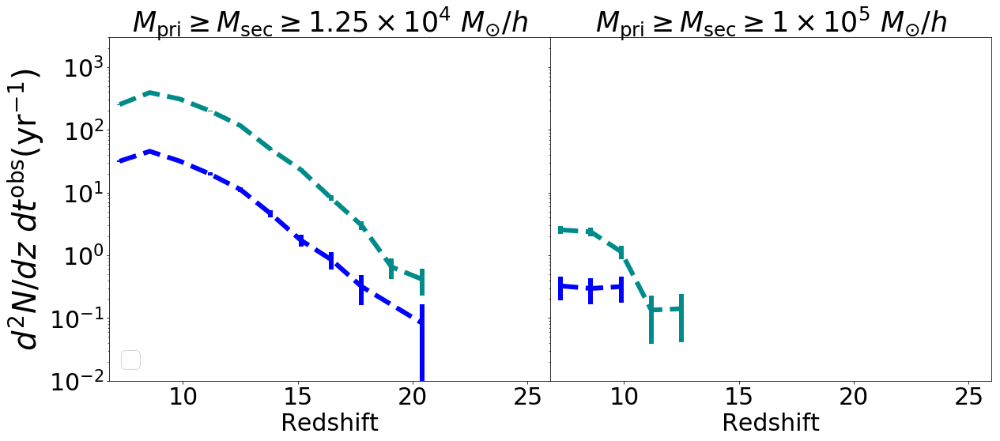

In [36]:

f,axx=plt.subplots(1,2,figsize=(20,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=0
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=0

def do(labl=''):
    HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=75**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=30)

    ax.set_xlabel('Redshift',fontsize=30)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=dist>0
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=6,color=col,linestyle=style)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 
mass_cut=1.25e4
style='dashed'
ax=axx[0]
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM5_seed4.10_bFOF/' 
basePath=path_to_output+run+output
col='darkcyan'
do()


style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='blue'
do()




style='dashed'
ax=axx[1]
mass_cut=1e5

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM5_seed4.10_bFOF/' 
basePath=path_to_output+run+output
col='darkcyan'
do()

style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath=path_to_output+run+output
col='blue'
do()




        
#axx[0].set_title(r'$M_{\mathrm{pri}}\geq M_{\mathrm{sec}} \geq 1.56\times10^3 \ M_{\odot}/h$',fontsize=35)
axx[0].set_title(r'$M_{\mathrm{pri}}\geq M_{\mathrm{sec}} \geq 1.25\times10^4 \ M_{\odot}/h$',fontsize=35)
axx[1].set_title(r'$M_{\mathrm{pri}}\geq M_{\mathrm{sec}} \geq 1\times10^5 \ M_{\odot}/h$',fontsize=35)



axx[0].set_ylabel('$d^2 N/dz \ dt^{\mathrm{obs}}(\mathrm{yr}^{-1})$',fontsize=40)

axx[0].legend(loc='lower left',fontsize=30)
axx[0].set_ylim(0.01,3000)
axx[0].set_xlim(6.8,26)
plt.subplots_adjust(hspace=0,wspace=0)

plt.savefig('./Paper6_figures/merger_rates_seed_mass.png',bbox_inches='tight')



In [41]:

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output

BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,7)

BH_Mass[BH_Mass>8e-4]

Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18


array([], dtype=float32)

17 8.012172948865935
Total number of mergers 16910
17 8.012172948865935
Total number of mergers 210
17 8.012172948865935
Total number of mergers 123
17 8.012172948865935
Total number of mergers 160
16 9.00233985416247
Total number of mergers 139


No handles with labels found to put in legend.


17 8.012172948865935
Total number of mergers 223
17 8.012172948865935
Total number of mergers 260


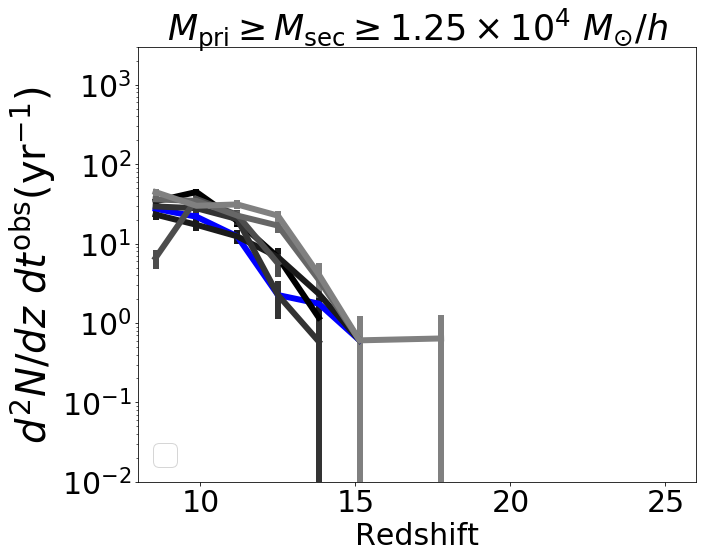

In [66]:

f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=0
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=8

def do(labl=''):
    HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=75**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=30)

    ax.set_xlabel('Redshift',fontsize=30)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=dist>0
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=6,color=col,linestyle=style)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 
mass_cut=1.25e4
style='solid'
ax=axx
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio3000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
col='blue'
do()


#style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n512/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6_1e4/'
basePath=path_to_output+run+output
col='0'
do()

 # name of the simulation runs
output='/output_Msfmp5_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6_1e4_IC2/'
basePath=path_to_output+run+output
col='0.1'
do()

# name of the simulation runs
output='/output_Msfmp5_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6_1e4_IC3/'
basePath=path_to_output+run+output
col='0.2'
do()

output='/output_Msfmp5_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6_1e4_IC4/'
basePath=path_to_output+run+output
col='0.3'
do()

output='/output_Msfmp5_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6_1e4_IC5/'
basePath=path_to_output+run+output
col='0.4'
do()

output='/output_Msfmp5_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6_1e4_IC6/'
basePath=path_to_output+run+output
col='0.5'
do()












        
#axx[0].set_title(r'$M_{\mathrm{pri}}\geq M_{\mathrm{sec}} \geq 1.56\times10^3 \ M_{\odot}/h$',fontsize=35)
axx.set_title(r'$M_{\mathrm{pri}}\geq M_{\mathrm{sec}} \geq 1.25\times10^4 \ M_{\odot}/h$',fontsize=35)
#axx[1].set_title(r'$M_{\mathrm{pri}}\geq M_{\mathrm{sec}} \geq 1\times10^5 \ M_{\odot}/h$',fontsize=35)



axx.set_ylabel('$d^2 N/dz \ dt^{\mathrm{obs}}(\mathrm{yr}^{-1})$',fontsize=40)

axx.legend(loc='lower left',fontsize=30)
axx.set_ylim(0.01,3000)
axx.set_xlim(8,26)
plt.subplots_adjust(hspace=0,wspace=0)

plt.savefig('./Paper6_figures/merger_rates_cosmic_variance.png',bbox_inches='tight')



7
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
3 7
[3.10526316 3.31578947 3.52631579 3.73684211 3.94736842 4.15789474
 4.36842105 4.57894737 4.78947368 5.         5.21052632 5.42105263
 5.63157895 5.84210526 6.05263158 6.26315789 6.47368421 6.68421053
 6.89473684] [1.2226e+04 0.0000e+00 2.6380e+03 1.5670e+03 6.9800e+02 3.3600e+02
 2.5600e+02 1.1100e+02 6.4000e+01 5.7000e+01 2.1000e+01 1.2000e+01
 7.0000e+00 2.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
 0.0000e+00]
9
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
3 7
[3.10526316 3.31578947 3.52631579 3.73684211 3.94736842 4.15789474
 4.36842105 4.57894737 4.78947368 5.         5.21052632 5.42105263
 5.63157895 5.84210526 6.05263158 6.26315789 6.47368421 6.68421053
 6.89473684] [1.8301e+04 0.0000e+00 2.7380e+03 1.5630e+03 7.3300e+02 3.3100e+02
 2.2000e+02 8.3000e+01 6.0000e+01 3.5000e+01 1.4000e+01 1.0000e+01
 1.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0

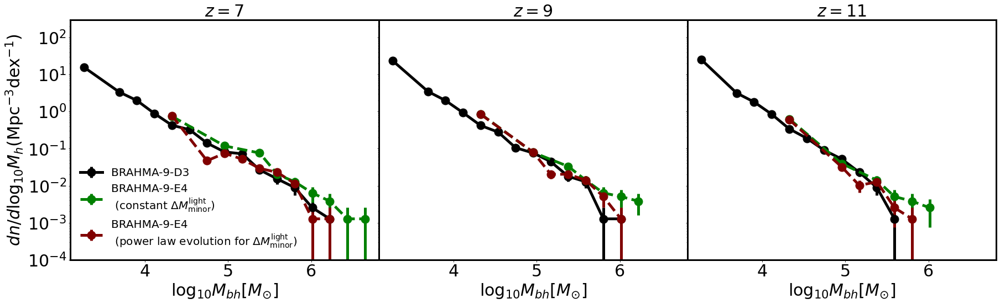

In [44]:
label_fontsize=30
def get_distribution(HM,Nbins,log_HM_min,log_HM_max,linear=0,cumulative=0,density=0):
    #print(HM)
    
    def extract(HM_min,HM_max):
        if (cumulative==1):
            mask=(HM>HM_min)
        else:
            mask=(HM>HM_min)&(HM<HM_max)
        return (HM_min+HM_max)/2,len(HM[mask])
    if (linear):
        HM_bin=numpy.linspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    else:
        HM_bin=numpy.logspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    out=[extract(HM_bin[i],HM_bin[i+1]) for i in range(0,len(HM_bin)-1)]
    #return out
    centers=numpy.array(list(zip(*out))[0])
    counts=numpy.array(list(zip(*out))[1])
    HMF=counts
    dHMF=numpy.sqrt(counts)
    norm=1.#sum(HMF)
    if (density==1):
        norm=numpy.diff(centers)[0]
    return centers,HMF/norm,dHMF/norm


def make_plot(ax,z_desired,basePath_cur,style='solid',col='black',width=6,log_mass_min=3.19,labl=' '):
    global Nbins, log_HM_min, log_HM_max
    redshift_space=[z_desired]

    BH_no_space=[]
    print(z_desired)
    
    boxsize=arepo_package.get_box_size(basePath_cur)/1e3

    for redshift in [z_desired]:
    

        BH_Mass,o=arepo_package.get_particle_property(basePath_cur,'BH_Mass',5,redshift)
        print(log_HM_min,log_HM_max)
        centers,HMF,dHMF=get_distribution(numpy.log10(BH_Mass*1e10), Nbins, log_HM_min, log_HM_max, linear=1,cumulative=0,density=0)
        #print(BH_Mass*1e10)
        print(centers,HMF)
        
        mask=(centers>log_mass_min)&(HMF>0)
        ax.errorbar(centers[mask]-log10(h),HMF[mask]/boxsize**3*h**3,dHMF[mask]/boxsize**3*h**3,linewidth=width,linestyle=style,color=col,label=labl,marker='o',ms=15)
      
    
        ax.set_yscale('log')

        ax.tick_params(labelsize=label_fontsize)
        ax.set_xlabel('$\log_{10}M_{bh}[M_{\odot}]$',fontsize=label_fontsize)


LogTargetGroupBHMass=5.00
levelmax_gas,logseedmass_gas=12,3.19
levelmax,logseedmass=12,3.19


f,axx=plt.subplots(1,3,figsize=(30,8),sharey=True,sharex=True)



def do(col='black',basePath_cur='.',style='solid',width=5,labl=''):
    global Nbins, log_HM_min, log_HM_max
    i=0
    for z_desired in [7,9,11]:
        axx[i].set_title('$z=%d$'%z_desired,fontsize=30)
        Nbins, log_HM_min, log_HM_max = 20, 3, 7   
        log_mass_min=3.00




        make_plot(axx[i],z_desired,basePath_cur,col=col,width=width,log_mass_min=log_mass_min,labl=labl,style=style)

      
        

        axx[i].set_ylim(1e-4,3e2)
        #axx[i,0].axvline(numpy.log10(2e4))
        
        i+=1
global Nbins, log_HM_min, log_HM_max

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output        
        
do('black',basePath_cur=basePath,labl='BRAHMA-9-D3') 


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n512/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh1000_double_powerlaw_env_5_0.1_0.3_slope1.6/' 
basePath=path_to_output+run+output        
        
do('green',basePath_cur=basePath,style='dashed',labl='BRAHMA-9-E4 \n (constant $\Delta M^{\mathrm{light}}_{\mathrm{minor}}$)') 


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n512/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh1000_double_powerlaw_env_5_0.1_0.3_slope1.6_lin/' 
basePath=path_to_output+run+output        
        
do('maroon',basePath_cur=basePath,style='dashed',labl='BRAHMA-9-E4 \n (power law evolution for $\Delta M^{\mathrm{light}}_{\mathrm{minor}}$) ') 

axx[0].legend(loc='lower left',fontsize=label_fontsize-10,frameon=False)

axx[0].set_ylabel('$dn/d\log_{10}M_h(\mathrm{Mpc}^{-3}\mathrm{dex}^{-1})$',fontsize=label_fontsize)

plt.subplots_adjust(wspace=0)


for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)


plt.savefig('./Paper6_figures/mass_function_test.png',bbox_inches='tight')







7
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
3 8
[3.13157895 3.39473684 3.65789474 3.92105263 4.18421053 4.44736842
 4.71052632 4.97368421 5.23684211 5.5        5.76315789 6.02631579
 6.28947368 6.55263158 6.81578947 7.07894737 7.34210526 7.60526316
 7.86842105] [4.64588e+04 1.00244e+04 3.95580e+03 4.65120e+03 1.63400e+03 8.66400e+02
 3.64800e+02 2.66000e+02 9.50000e+01 4.18000e+01 1.90000e+01 7.60000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00
 0.00000e+00]
9
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
3 8
[3.13157895 3.39473684 3.65789474 3.92105263 4.18421053 4.44736842
 4.71052632 4.97368421 5.23684211 5.5        5.76315789 6.02631579
 6.28947368 6.55263158 6.81578947 7.07894737 7.34210526 7.60526316
 7.86842105] [6.95438e+04 1.04044e+04 3.91780e+03 4.80700e+03 1.60360e+03 6.68800e+02
 3.11600e+02 1.86200e+02 5.70000e+01 3.80000e+01 3.80000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 0

3 8
[3.13157895 3.39473684 3.65789474 3.92105263 4.18421053 4.44736842
 4.71052632 4.97368421 5.23684211 5.5        5.76315789 6.02631579
 6.28947368 6.55263158 6.81578947 7.07894737 7.34210526 7.60526316
 7.86842105] [3.71716e+04 1.81260e+03 4.86400e+02 3.83800e+02 5.32000e+01 1.90000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00
 0.00000e+00]
7
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
3 8
[3.13157895 3.39473684 3.65789474 3.92105263 4.18421053 4.44736842
 4.71052632 4.97368421 5.23684211 5.5        5.76315789 6.02631579
 6.28947368 6.55263158 6.81578947 7.07894737 7.34210526 7.60526316
 7.86842105] [0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 3.9482e+03 0.0000e+00
 0.0000e+00 2.2420e+02 1.4820e+02 3.0400e+01 2.6600e+01 3.8000e+00
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
 0.0000e+00]
9
Desired redshift:  9
Output redshif

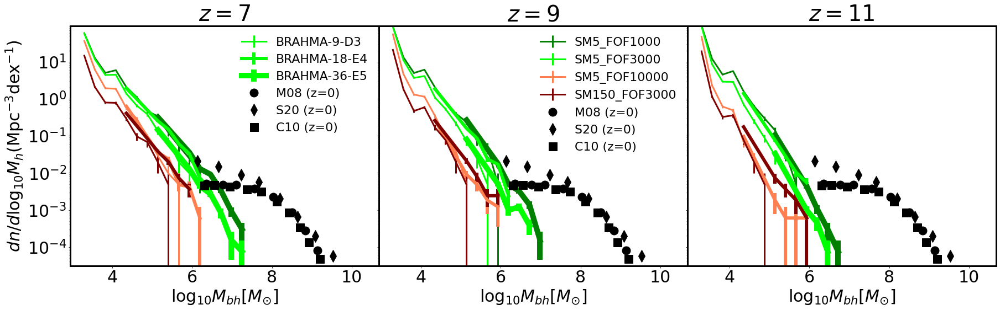

In [16]:
label_fontsize=30
def get_distribution(HM,Nbins,log_HM_min,log_HM_max,linear=0,cumulative=0,density=0):
    #print(HM)
    
    def extract(HM_min,HM_max):
        if (cumulative==1):
            mask=(HM>HM_min)
        else:
            mask=(HM>HM_min)&(HM<HM_max)
        return (HM_min+HM_max)/2,len(HM[mask])
    if (linear):
        HM_bin=numpy.linspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    else:
        HM_bin=numpy.logspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    out=[extract(HM_bin[i],HM_bin[i+1]) for i in range(0,len(HM_bin)-1)]
    #return out
    centers=numpy.array(list(zip(*out))[0])
    counts=numpy.array(list(zip(*out))[1])
    HMF=counts
    dHMF=numpy.sqrt(counts)
    norm=1.#sum(HMF)
    if (density==1):
        norm=numpy.diff(centers)[0]
    return centers,HMF/norm,dHMF/norm


def make_plot(ax,z_desired,basePath_cur,style='solid',col='black',width=6,log_mass_min=3.19,labl=' '):
    global Nbins, log_HM_min, log_HM_max
    redshift_space=[z_desired]

    BH_no_space=[]
    print(z_desired)
    
    boxsize=arepo_package.get_box_size(basePath_cur)/1e3

    for redshift in [z_desired]:
    

        BH_Mass,o=arepo_package.get_particle_property(basePath_cur,'BH_Mass',5,redshift)
        print(log_HM_min,log_HM_max)
        centers,HMF,dHMF=get_distribution(numpy.log10(BH_Mass*1e10), Nbins, log_HM_min, log_HM_max, linear=1,cumulative=0,density=1)
        #print(BH_Mass*1e10)
        print(centers,HMF)
        
        mask=(centers>log_mass_min)&(HMF>0)
        ax.errorbar(centers[mask]-log10(h),HMF[mask]/boxsize**3*h**3,dHMF[mask]/boxsize**3*h**3,linewidth=width,linestyle=style,color=col,label=labl,marker='',ms=15)
      
    
        ax.set_yscale('log')

        ax.tick_params(labelsize=label_fontsize)
        ax.set_xlabel('$\log_{10}M_{bh}[M_{\odot}]$',fontsize=label_fontsize)


LogTargetGroupBHMass=5.00
levelmax_gas,logseedmass_gas=12,3.19
levelmax,logseedmass=12,3.19


f,axx=plt.subplots(1,3,figsize=(30,8),sharey=True,sharex=True)



def do(col='black',basePath_cur='.',style='solid',width=5,labl='',labl2=''):
    global Nbins, log_HM_min, log_HM_max
    i=0
    for z_desired in [7,9,11]:
        axx[i].set_title('$z=%d$'%z_desired,fontsize=40)
        Nbins, log_HM_min, log_HM_max = 20, 3, 8  
        log_mass_min=3.00


        if(z_desired==7):
            flabl=labl
        else:
            flabl=labl2

        make_plot(axx[i],z_desired,basePath_cur,col=col,width=width,log_mass_min=log_mass_min,labl=flabl,style=style)

      
        

        axx[i].set_ylim(1e-4*h**3,3e2*h**3)
        #axx[i,0].axvline(numpy.log10(2e4))
        
        i+=1
global Nbins, log_HM_min, log_HM_max

Msfmp,Mh=5,1000
j=0
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)  
basePath=path_to_output+run+output        
        
do('green',basePath_cur=basePath,labl='',labl2='SM5_FOF1000',width=3) 


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L25n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh) 
basePath=path_to_output+run+output        
        
do('green',basePath_cur=basePath,labl='',width=10) 


Msfmp,Mh=5,3000
j=0
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)  
basePath=path_to_output+run+output         
        
do('lime',basePath_cur=basePath,labl='BRAHMA-9-D3',labl2='SM5_FOF3000',width=3) 


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh) 
basePath=path_to_output+run+output        
                
        
do('lime',basePath_cur=basePath,labl='BRAHMA-18-E4',width=6) 



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L25n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh) 
basePath=path_to_output+run+output        
                
        
do('lime',basePath_cur=basePath,labl='BRAHMA-36-E5',width=10) 


Msfmp,Mh=5,10000
j=0
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)  
basePath=path_to_output+run+output         
        
do('coral',basePath_cur=basePath,labl='',labl2='SM5_FOF10000',width=3) 


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh) 
basePath=path_to_output+run+output        
                
        
do('coral',basePath_cur=basePath,labl='',width=6) 

Msfmp,Mh=150,3000
j=0
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)  
basePath=path_to_output+run+output         
        
do('maroon',basePath_cur=basePath,labl='',labl2='SM150_FOF3000',width=3) 


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh) 
basePath=path_to_output+run+output        
                
        
do('maroon',basePath_cur=basePath,labl='',width=6) 



axx[0].set_ylabel('$dn/d\log_{10}M_h(\mathrm{Mpc}^{-3}\mathrm{dex}^{-1})$',fontsize=label_fontsize)

#axx[0].legend(loc='upper right',fontsize=label_fontsize-5,frameon=False)
#axx[1].legend(loc='upper right',fontsize=label_fontsize-5,frameon=False)

#axx[0].set_ylabel('$dn/d\log_{10}M_h(\mathrm{Mpc}^{-3}h^{3}\mathrm{dex}^{-1})$',fontsize=label_fontsize)

plt.subplots_adjust(wspace=0)

for ii in [0,1,2]:
    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/M08_BHMF.txt')
    axx[ii].errorbar(numpy.log10(10**data[:,0]),10**data[:,1],color='black',label='M08 (z=0)',marker='o',linewidth=0,ms=15)
    #axx[ii].legend(fontsize=25,loc='lower left',frameon=False)
    
    
    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S20_BHMF.txt')
    axx[ii].errorbar(numpy.log10(10**data[:,0]),10**data[:,1],color='black',label='S20 (z=0)',marker='d',linewidth=0,ms=15)
    #axx[ii].legend(fontsize=25,loc='lower left',frameon=False)
    
    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S09_BHMF.txt')
    #axx[ii].errorbar(numpy.log10(10**data[:,0]),10**data[:,1],color='black',label='S09 (z=0)',marker='*',linewidth=0,ms=15)
    #axx[ii].legend(fontsize=25,loc='lower left',frameon=False)
    
    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/C10_BHMF.txt')
    axx[ii].errorbar(numpy.log10(10**data[:,0]),10**data[:,1],color='black',label='C10 (z=0)',marker='s',linewidth=0,ms=15)
 

for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)


axx[0].legend(fontsize=22,loc='upper right',frameon=False)
axx[1].legend(fontsize=22,loc='upper right',frameon=False)
plt.savefig('./Paper6_figures/mass_functions.png',bbox_inches='tight')







7
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
3 8
[3.11363636 3.34090909 3.56818182 3.79545455 4.02272727 4.25
 4.47727273 4.70454545 4.93181818 5.15909091 5.38636364 5.61363636
 5.84090909 6.06818182 6.29545455 6.52272727 6.75       6.97727273
 7.20454545 7.43181818 7.65909091 7.88636364] [5.37944e+04 0.00000e+00 1.61876e+04 3.69160e+03 2.20440e+03 1.54440e+03
 8.40400e+02 4.13600e+02 2.55200e+02 1.40800e+02 6.16000e+01 3.08000e+01
 1.32000e+01 4.40000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00]
7
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
3 8
[3.11363636 3.34090909 3.56818182 3.79545455 4.02272727 4.25
 4.47727273 4.70454545 4.93181818 5.15909091 5.38636364 5.61363636
 5.84090909 6.06818182 6.29545455 6.52272727 6.75       6.97727273
 7.20454545 7.43181818 7.65909091 7.88636364] [    0.      0.      0.      0.      0.      0.      0.      0.  18598.8
     0. 

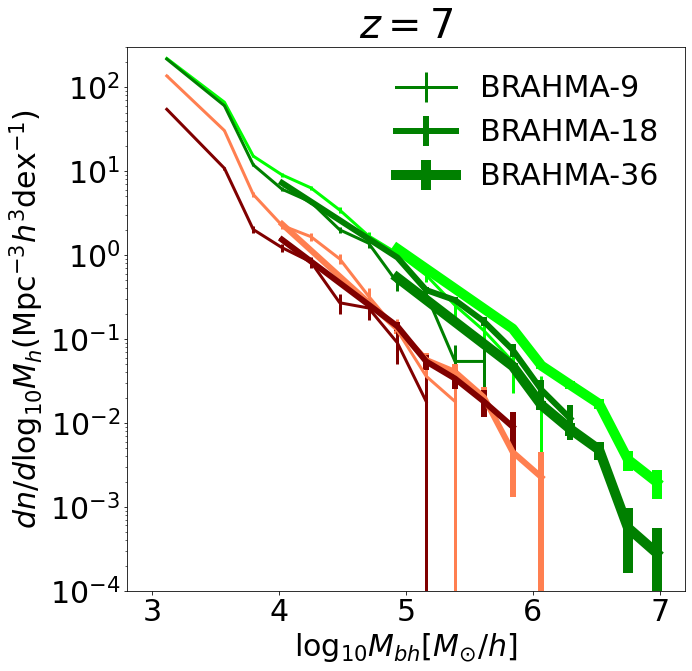

In [41]:
label_fontsize=30
def get_distribution(HM,Nbins,log_HM_min,log_HM_max,linear=0,cumulative=0,density=0):
    #print(HM)
    
    def extract(HM_min,HM_max):
        if (cumulative==1):
            mask=(HM>HM_min)
        else:
            mask=(HM>HM_min)&(HM<HM_max)
        return (HM_min+HM_max)/2,len(HM[mask])
    if (linear):
        HM_bin=numpy.linspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    else:
        HM_bin=numpy.logspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    out=[extract(HM_bin[i],HM_bin[i+1]) for i in range(0,len(HM_bin)-1)]
    #return out
    centers=numpy.array(list(zip(*out))[0])
    counts=numpy.array(list(zip(*out))[1])
    HMF=counts
    dHMF=numpy.sqrt(counts)
    norm=1.#sum(HMF)
    if (density==1):
        norm=numpy.diff(centers)[0]
    return centers,HMF/norm,dHMF/norm


def make_plot(ax,z_desired,basePath_cur,style='solid',col='black',width=6,log_mass_min=3.19,labl=' '):
    global Nbins, log_HM_min, log_HM_max
    redshift_space=[z_desired]

    BH_no_space=[]
    print(z_desired)
    
    boxsize=arepo_package.get_box_size(basePath_cur)/1e3

    for redshift in [z_desired]:
    

        BH_Mass,o=arepo_package.get_particle_property(basePath_cur,'BH_Mass',5,redshift)
        print(log_HM_min,log_HM_max)
        centers,HMF,dHMF=get_distribution(numpy.log10(BH_Mass*1e10), Nbins, log_HM_min, log_HM_max, linear=1,cumulative=0,density=1)
        #print(BH_Mass*1e10)
        print(centers,HMF)
        
        mask=(centers>log_mass_min)&(HMF>0)
        ax.errorbar(centers[mask],HMF[mask]/boxsize**3,dHMF[mask]/boxsize**3,linewidth=width,linestyle=style,color=col,label=labl,marker='',ms=15)
      
    
        ax.set_yscale('log')

        ax.tick_params(labelsize=label_fontsize)
        ax.set_xlabel('$\log_{10}M_{bh}[M_{\odot}/h]$',fontsize=label_fontsize)


LogTargetGroupBHMass=5.00
levelmax_gas,logseedmass_gas=12,3.19
levelmax,logseedmass=12,3.19


f,axx=plt.subplots(1,1,figsize=(10,10),sharey=True,sharex=True)



def do(col='black',basePath_cur='.',style='solid',width=5,labl='',labl2=''):
    global Nbins, log_HM_min, log_HM_max
    i=0
    for z_desired in [7]:
        axx.set_title('$z=%d$'%z_desired,fontsize=40)
        Nbins, log_HM_min, log_HM_max = 23, 3, 8  
        log_mass_min=3.00


        if(z_desired==7):
            flabl=labl
        else:
            flabl=labl2

        make_plot(axx,z_desired,basePath_cur,col=col,width=width,log_mass_min=log_mass_min,labl=flabl,style=style)

      
        

        axx.set_ylim(1e-4,3e2)
        #axx[i,0].axvline(numpy.log10(2e4))
        
        i+=1
global Nbins, log_HM_min, log_HM_max

Msfmp,Mh=5,1000
j=0
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)  
basePath=path_to_output+run+output        
        
do('lime',basePath_cur=basePath,labl='',labl2='SM5_FOF1000',width=3) 


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L25n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh) 
basePath=path_to_output+run+output        
        
do('lime',basePath_cur=basePath,labl='',width=10) 


Msfmp,Mh=5,3000
j=0
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)  
basePath=path_to_output+run+output         
        
do('green',basePath_cur=basePath,labl='BRAHMA-9',labl2='SM5_FOF3000',width=3) 


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh) 
basePath=path_to_output+run+output        
                
        
do('green',basePath_cur=basePath,labl='BRAHMA-18',width=6) 



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L25n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh) 
basePath=path_to_output+run+output        
                
        
do('green',basePath_cur=basePath,labl='BRAHMA-36',width=10) 


Msfmp,Mh=5,10000
j=0
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)  
basePath=path_to_output+run+output         
        
do('coral',basePath_cur=basePath,labl='',labl2='SM5_FOF10000',width=3) 


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh) 
basePath=path_to_output+run+output        
                
        
do('coral',basePath_cur=basePath,labl='',width=6) 

Msfmp,Mh=150,3000
j=0
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)  
basePath=path_to_output+run+output         
        
do('maroon',basePath_cur=basePath,labl='',labl2='SM150_FOF3000',width=3) 


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh) 
basePath=path_to_output+run+output        
                
        
do('maroon',basePath_cur=basePath,labl='',width=6) 



axx.set_ylabel('$dn/d\log_{10}M_h(\mathrm{Mpc}^{-3}h^{3}\mathrm{dex}^{-1})$',fontsize=label_fontsize)

#axx[0].legend(loc='upper right',fontsize=label_fontsize-5,frameon=False)
#axx[1].legend(loc='upper right',fontsize=label_fontsize-5,frameon=False)

#axx[0].set_ylabel('$dn/d\log_{10}M_h(\mathrm{Mpc}^{-3}h^{3}\mathrm{dex}^{-1})$',fontsize=label_fontsize)

plt.subplots_adjust(wspace=0)

axx.set_ylim(1e-4,3e2)

axx.set_xlim(2.8,7.2)

axx.legend(fontsize=30,loc='upper right',frameon=False)
#axx[1].legend(fontsize=22,loc='upper right',frameon=False)
#plt.savefig('./Paper6_figures/mass_functions.png',bbox_inches='tight')







0
Desired redshift:  0
Output redshift:  2.220446049250313e-16
Output snapshot:  32
3 8
[3.16666667 3.5        3.83333333 4.16666667 4.5        4.83333333
 5.16666667 5.5        5.83333333 6.16666667 6.5        6.83333333
 7.16666667 7.5        7.83333333] [  0.   0.   0.   0.   0.   0. 798.   0.  78. 105.  90.  84.  48.  18.
  15.]
3
Desired redshift:  3
Output redshift:  3.008131071630377
Output snapshot:  22
3 8
[3.16666667 3.5        3.83333333 4.16666667 4.5        4.83333333
 5.16666667 5.5        5.83333333 6.16666667 6.5        6.83333333
 7.16666667 7.5        7.83333333] [   0.    0.    0.    0.    0.    0. 1392.    0.  237.  192.   87.   30.
   15.    3.    3.]
5
Desired redshift:  5
Output redshift:  4.995933468164624
Output snapshot:  20
3 8
[3.16666667 3.5        3.83333333 4.16666667 4.5        4.83333333
 5.16666667 5.5        5.83333333 6.16666667 6.5        6.83333333
 7.16666667 7.5        7.83333333] [   0.    0.    0.    0.    0.    0. 1548.    0.  204.  159.   51.

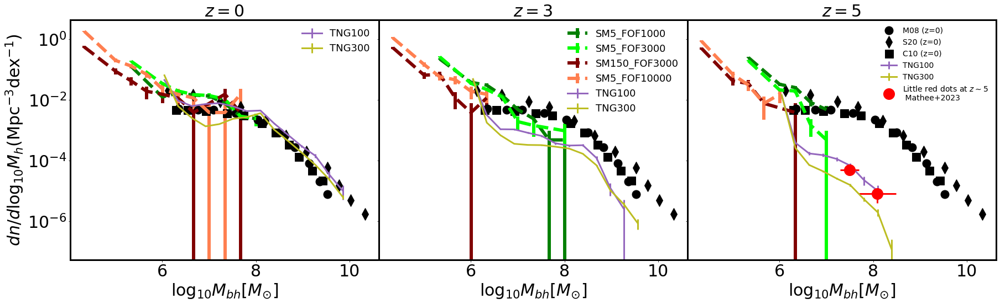

In [15]:
label_fontsize=30



def get_distribution(HM,Nbins,log_HM_min,log_HM_max,linear=0,cumulative=0,density=0):
    #print(HM)
    
    def extract(HM_min,HM_max):
        if (cumulative==1):
            mask=(HM>HM_min)
        else:
            mask=(HM>HM_min)&(HM<HM_max)
        return (HM_min+HM_max)/2,len(HM[mask])
    if (linear):
        HM_bin=numpy.linspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    else:
        HM_bin=numpy.logspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    out=[extract(HM_bin[i],HM_bin[i+1]) for i in range(0,len(HM_bin)-1)]
    #return out
    centers=numpy.array(list(zip(*out))[0])
    counts=numpy.array(list(zip(*out))[1])
    HMF=counts
    dHMF=numpy.sqrt(counts)
    norm=1.#sum(HMF)
    if (density==1):
        norm=numpy.diff(centers)[0]
    return centers,HMF/norm,dHMF/norm


def make_plot(ax,z_desired,basePath_cur,style='dashed',col='black',width=6,log_mass_min=3.19,labl=' '):
    global Nbins, log_HM_min, log_HM_max
    redshift_space=[z_desired]

    BH_no_space=[]
    print(z_desired)
    
    boxsize=arepo_package.get_box_size(basePath_cur)/1e3

    for redshift in [z_desired]:
    

        BH_Mass,o=arepo_package.get_particle_property(basePath_cur,'BH_Mass',5,redshift)
        print(log_HM_min,log_HM_max)
        centers,HMF,dHMF=get_distribution(numpy.log10(BH_Mass*1e10), Nbins, log_HM_min, log_HM_max, linear=1,cumulative=0,density=1)
        #print(BH_Mass*1e10)
        print(centers,HMF)
        
        mask=(centers>log_mass_min)&(HMF>0)
        ax.errorbar(centers[mask]-log10(h),HMF[mask]/boxsize**3*h**3,dHMF[mask]/boxsize**3*h**3,linewidth=width,linestyle=style,color=col,label=labl,marker='',ms=15)
      
    
        ax.set_yscale('log')

        ax.tick_params(labelsize=label_fontsize)
        ax.set_xlabel('$\log_{10}M_{bh}[M_{\odot}]$',fontsize=label_fontsize)


LogTargetGroupBHMass=5.00
levelmax_gas,logseedmass_gas=12,3.19
levelmax,logseedmass=12,3.19


f,axx=plt.subplots(1,3,figsize=(30,8),sharey=True,sharex=True)

for ii in [2]:
    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/M08_BHMF.txt')
    axx[ii].errorbar(numpy.log10(10**data[:,0]),10**data[:,1],color='black',label='M08 (z=0)',marker='o',linewidth=0,ms=15)
    #axx[ii].legend(fontsize=25,loc='lower left',frameon=False)
    
    
    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S20_BHMF.txt')
    axx[ii].errorbar(numpy.log10(10**data[:,0]),10**data[:,1],color='black',label='S20 (z=0)',marker='d',linewidth=0,ms=15)
    #axx[ii].legend(fontsize=25,loc='lower left',frameon=False)
    
    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S09_BHMF.txt')
    #axx[ii].errorbar(numpy.log10(10**data[:,0]),10**data[:,1],color='black',label='S09 (z=0)',marker='*',linewidth=0,ms=15)
    #axx[ii].legend(fontsize=25,loc='lower left',frameon=False)
    
    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/C10_BHMF.txt')
    axx[ii].errorbar(numpy.log10(10**data[:,0]),10**data[:,1],color='black',label='C10 (z=0)',marker='s',linewidth=0,ms=15)
    #axx[ii].legend(fontsize=25,loc='lower left',frameon=False)
 
for ii in [0,1]:
    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/M08_BHMF.txt')
    axx[ii].errorbar(numpy.log10(10**data[:,0]),10**data[:,1],color='black',label='',marker='o',linewidth=0,ms=15)
    #axx[ii].legend(fontsize=25,loc='lower left',frameon=False)
    
    
    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S20_BHMF.txt')
    axx[ii].errorbar(numpy.log10(10**data[:,0]),10**data[:,1],color='black',label='',marker='d',linewidth=0,ms=15)
    #axx[ii].legend(fontsize=25,loc='lower left',frameon=False)
    
    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S09_BHMF.txt')
    #axx[ii].errorbar(numpy.log10(10**data[:,0]),10**data[:,1],color='black',label='',marker='*',linewidth=0,ms=15)
    #axx[ii].legend(fontsize=25,loc='lower left',frameon=False)
    
    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/C10_BHMF.txt')
    axx[ii].errorbar(numpy.log10(10**data[:,0]),10**data[:,1],color='black',label='',marker='s',linewidth=0,ms=15)
    #axx[ii].legend(fontsize=25,loc='lower left',frameon=False)
 

def do(col='black',basePath_cur='.',style='dashed',width=5,labl='',labl2=''):
    global Nbins, log_HM_min, log_HM_max
    i=0
    for z_desired in [0,3,5]:
        axx[i].set_title('$z=%d$'%z_desired,fontsize=30)
        Nbins, log_HM_min, log_HM_max = 16, 3, 8  
        log_mass_min=3.00


        if(z_desired==1):
            flabl=labl
        elif(z_desired==3):
            flabl=labl2
        else:
            flabl=''

        make_plot(axx[i],z_desired,basePath_cur,col=col,width=width,log_mass_min=log_mass_min,labl=flabl,style=style)

      
        

        #axx[i].set_ylim(1e-3,3)
        #axx[i,0].axvline(numpy.log10(2e4))
        
        i+=1
global Nbins, log_HM_min, log_HM_max

Msfmp,Mh=5,1000
j=0
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n512/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh) 
basePath=path_to_output+run+output        
do('green',basePath_cur=basePath,labl='BRAHMA-12.5-R5',labl2='SM5_FOF1000',width=6) 


Msfmp,Mh=5,3000
j=0
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n512/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh) 
basePath=path_to_output+run+output             
do('lime',basePath_cur=basePath,labl='BRAHMA-12.5-R5',labl2='SM5_FOF3000',width=6) 


Msfmp,Mh=150,3000
j=0
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n512/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh) 
basePath=path_to_output+run+output             
do('maroon',basePath_cur=basePath,labl='BRAHMA-6.25-R4',labl2='SM150_FOF3000',width=6) 

Msfmp,Mh=5,10000
j=0
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n512/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh) 
basePath=path_to_output+run+output             
do('coral',basePath_cur=basePath,labl='BRAHMA-6.25-R4',labl2='SM5_FOF10000',width=6) 




axx[0].set_ylabel('$dn/d\log_{10}M_h(\mathrm{Mpc}^{-3}\mathrm{dex}^{-1})$',fontsize=label_fontsize)

#axx[1].legend(loc='upper right',fontsize=label_fontsize-5,frameon=False)

#axx[0].set_ylabel('$dn/d\log_{10}M_h(\mathrm{Mpc}^{-3}h^{3}\mathrm{dex}^{-1})$',fontsize=label_fontsize)

plt.subplots_adjust(wspace=0)


'''    
    data=numpy.loadtxt('../arepo_code_development/observational_data/BHMF_z0_actualdata3.txt')
    axx[ii].errorbar(numpy.log10(data[:,0]*0.7),data[:,1]/0.7**3*numpy.log(10),color='orange',label='Marconi+ 2004',marker='o',linewidth=0,ms=10)
    axx[ii].legend(fontsize=25,loc='lower left',frameon=False)


    data=numpy.loadtxt('../arepo_code_development/observational_data/BHMF_S13_z0_2.txt')
    axx[ii].errorbar(numpy.log10(data[:,0]*0.7),data[:,1]/0.7**3,color='orange',label='Shankar+ 2013',marker=' ',linewidth=2,ms=10,linestyle='solid')
    axx[ii].legend(fontsize=25,loc='lower left',frameon=False)



    data=numpy.loadtxt('../arepo_code_development/observational_data/BHMF_Merloni_z0.txt')
    axx[ii].errorbar(numpy.log10(data[:,0]*0.7),data[:,1]/0.7**3,color='orange',label='Merloni+ 2008 (z=0.1)',marker=' ',linewidth=2,ms=10,linestyle='dashed')
    axx[ii].legend(fontsize=25,loc='lower left',frameon=False
    

    
    

'''
style='solid'
width=3
Nbins, log_HM_min, log_HM_max = 15, 5.90,10
log_mass_min=5.90
ii=0
for desired_redshift in [0,3,5]:
    BHMass,BHMdot,o=numpy.load('/home/aklantbhowmick/TNG100_BH_mass_mdot_z0/TNG100_BH_mass_mdot_z%.6f.npy'%desired_redshift,allow_pickle=True)
    centers,HMF,dHMF=get_distribution(numpy.log10(BHMass*1e10), Nbins, log_HM_min, log_HM_max, linear=1,cumulative=0,density=1)
    mask=(centers>log_mass_min)&(HMF>0)
    boxsize=75.
    axx[ii].errorbar(centers[mask],HMF[mask]/boxsize**3*h**3,dHMF[mask]/boxsize**3*h**3,linewidth=width,linestyle=style,color='C4',label='TNG100',marker='')
      
    BHMass,BHMdot,o=numpy.load('/home/aklantbhowmick/TNG100_BH_mass_mdot_z0/TNG300_BH_mass_mdot_z%.6f.npy'%desired_redshift,allow_pickle=True)
    centers,HMF,dHMF=get_distribution(numpy.log10(BHMass*1e10), Nbins, log_HM_min, log_HM_max, linear=1,cumulative=0,density=1)
    mask=(centers>log_mass_min)&(HMF>0)
    boxsize=205.
    axx[ii].errorbar(centers[mask],HMF[mask]/boxsize**3*h**3,dHMF[mask]/boxsize**3*h**3,linewidth=width,linestyle=style,color='C8',label='TNG300',marker='')
    ii+=1

data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/red_dots.txt')

data_right=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/red_dots_right.txt')

data_left=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/red_dots_left.txt')


data_up=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/red_dots_up.txt')

data_down=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/red_dots_down.txt')

axx[2].errorbar(data[:,0],10**data[:,1],xerr=[data[:,0]-data_left[:,0],data_right[:,0]-data[:,0]],yerr=[10**data[:,1]-10**data_down[:,1],10**data_up[:,1]-10**data[:,1]],marker='o',ms=20,linewidth=3,linestyle='',label='Little red dots at $z\sim5$ \n Mathee+2023',color='red')

axx[0].legend(loc='upper right',fontsize=label_fontsize-12,frameon=False)

axx[1].legend(loc='upper right',fontsize=label_fontsize-12,frameon=False)

axx[2].legend(loc='upper right',fontsize=label_fontsize-16,frameon=False)

for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)

plt.savefig('./Paper6_figures/mass_functions_z0.png',bbox_inches='tight')







0
Desired redshift:  0
Output redshift:  2.220446049250313e-16
Output snapshot:  32
3 8
[3.16666667 3.5        3.83333333 4.16666667 4.5        4.83333333
 5.16666667 5.5        5.83333333 6.16666667 6.5        6.83333333
 7.16666667 7.5        7.83333333] [  0.   0.   0.   0.   0.   0. 798.   0.  78. 105.  90.  84.  48.  18.
  15.]
3
Desired redshift:  3
Output redshift:  3.008131071630377
Output snapshot:  22
3 8
[3.16666667 3.5        3.83333333 4.16666667 4.5        4.83333333
 5.16666667 5.5        5.83333333 6.16666667 6.5        6.83333333
 7.16666667 7.5        7.83333333] [   0.    0.    0.    0.    0.    0. 1392.    0.  237.  192.   87.   30.
   15.    3.    3.]
5
Desired redshift:  5
Output redshift:  4.995933468164624
Output snapshot:  20
3 8
[3.16666667 3.5        3.83333333 4.16666667 4.5        4.83333333
 5.16666667 5.5        5.83333333 6.16666667 6.5        6.83333333
 7.16666667 7.5        7.83333333] [   0.    0.    0.    0.    0.    0. 1548.    0.  204.  159.   51.

"\nstyle='solid'\nwidth=3\nNbins, log_HM_min, log_HM_max = 15, 5.90,10\nlog_mass_min=5.90\nii=0\nfor desired_redshift in [0]:\n    BHMass,BHMdot,o=numpy.load('/home/aklantbhowmick/TNG100_BH_mass_mdot_z0/TNG100_BH_mass_mdot_z%.6f.npy'%desired_redshift,allow_pickle=True)\n    centers,HMF,dHMF=get_distribution(numpy.log10(BHMass*1e10), Nbins, log_HM_min, log_HM_max, linear=1,cumulative=0,density=1)\n    mask=(centers>log_mass_min)&(HMF>0)\n    boxsize=75.\n    axx.errorbar(centers[mask],HMF[mask]/boxsize**3,dHMF[mask]/boxsize**3,linewidth=width,linestyle=style,color='C4',label='TNG100',marker='')\n      \n    BHMass,BHMdot,o=numpy.load('/home/aklantbhowmick/TNG100_BH_mass_mdot_z0/TNG300_BH_mass_mdot_z%.6f.npy'%desired_redshift,allow_pickle=True)\n    centers,HMF,dHMF=get_distribution(numpy.log10(BHMass*1e10), Nbins, log_HM_min, log_HM_max, linear=1,cumulative=0,density=1)\n    mask=(centers>log_mass_min)&(HMF>0)\n    boxsize=205.\n    axx.errorbar(centers[mask],HMF[mask]/boxsize**3,dHMF[m

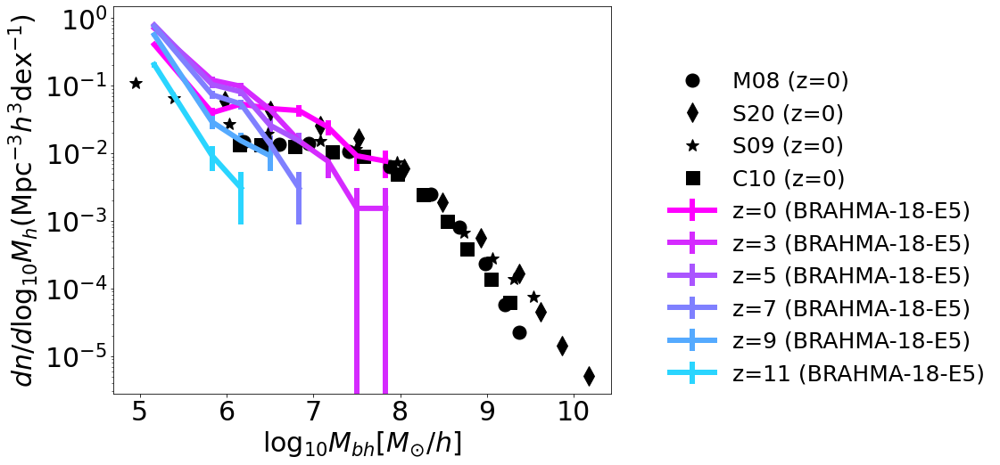

In [28]:
label_fontsize=30
def get_distribution(HM,Nbins,log_HM_min,log_HM_max,linear=0,cumulative=0,density=0):
    #print(HM)
    
    def extract(HM_min,HM_max):
        if (cumulative==1):
            mask=(HM>HM_min)
        else:
            mask=(HM>HM_min)&(HM<HM_max)
        return (HM_min+HM_max)/2,len(HM[mask])
    if (linear):
        HM_bin=numpy.linspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    else:
        HM_bin=numpy.logspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    out=[extract(HM_bin[i],HM_bin[i+1]) for i in range(0,len(HM_bin)-1)]
    #return out
    centers=numpy.array(list(zip(*out))[0])
    counts=numpy.array(list(zip(*out))[1])
    HMF=counts
    dHMF=numpy.sqrt(counts)
    norm=1.#sum(HMF)
    if (density==1):
        norm=numpy.diff(centers)[0]
    return centers,HMF/norm,dHMF/norm


def make_plot(ax,z_desired,basePath_cur,style='solid',col='black',width=6,log_mass_min=3.19,labl=' '):
    global Nbins, log_HM_min, log_HM_max
    redshift_space=[z_desired]

    BH_no_space=[]
    print(z_desired)
    
    boxsize=arepo_package.get_box_size(basePath_cur)/1e3

    for redshift in [z_desired]:
    

        BH_Mass,o=arepo_package.get_particle_property(basePath_cur,'BH_Mass',5,redshift)
        print(log_HM_min,log_HM_max)
        centers,HMF,dHMF=get_distribution(numpy.log10(BH_Mass*1e10), Nbins, log_HM_min, log_HM_max, linear=1,cumulative=0,density=1)
        #print(BH_Mass*1e10)
        print(centers,HMF)
        
        mask=(centers>log_mass_min)&(HMF>0)
        ax.errorbar(centers[mask],HMF[mask]/boxsize**3,dHMF[mask]/boxsize**3,linewidth=width,linestyle=style,color=col,label=labl,marker='',ms=15)
      
    
        ax.set_yscale('log')

        ax.tick_params(labelsize=label_fontsize)
        ax.set_xlabel('$\log_{10}M_{bh}[M_{\odot}/h]$',fontsize=label_fontsize)


LogTargetGroupBHMass=5.00
levelmax_gas,logseedmass_gas=12,3.19
levelmax,logseedmass=12,3.19


f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)


for ii in [2]:
    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/M08_BHMF.txt')
    axx.errorbar(numpy.log10(10**data[:,0]*0.7),10**data[:,1]/0.7**3,color='black',label='M08 (z=0)',marker='o',linewidth=0,ms=15)
    #axx[ii].legend(fontsize=25,loc='lower left',frameon=False)
    
    
    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S20_BHMF.txt')
    axx.errorbar(numpy.log10(10**data[:,0]*0.7),10**data[:,1]/0.7**3,color='black',label='S20 (z=0)',marker='d',linewidth=0,ms=15)
    #axx[ii].legend(fontsize=25,loc='lower left',frameon=False)
    
    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/S09_BHMF.txt')
    axx.errorbar(numpy.log10(10**data[:,0]*0.7),10**data[:,1]/0.7**3,color='black',label='S09 (z=0)',marker='*',linewidth=0,ms=15)
    #axx[ii].legend(fontsize=25,loc='lower left',frameon=False)
    
    data=numpy.loadtxt('/home/aklantbhowmick/analis_data/C10_BHMF.txt')
    axx.errorbar(numpy.log10(10**data[:,0]*0.7),10**data[:,1]/0.7**3,color='black',label='C10 (z=0)',marker='s',linewidth=0,ms=15)
    #axx[ii].legend(fontsize=25,loc='lower left',frameon=False)
 


def do(col='black',basePath_cur='.',style='solid',width=5,labl='',labl2=''):
    global Nbins, log_HM_min, log_HM_max
    i=0
    for z_desired in [0,3,5,7,9,11]:
        #axx.set_title('$z=%d$'%z_desired,fontsize=30)
        Nbins, log_HM_min, log_HM_max = 16, 3, 8  
        log_mass_min=3.00


        if(z_desired==1):
            flabl=labl
        elif(z_desired==3):
            flabl=labl2
        else:
            flabl=''
            
        flabl='z=%d (BRAHMA-18-E5)'%z_desired

        make_plot(axx,z_desired,basePath_cur,col=cm.cool_r(colors[i]),width=width,log_mass_min=log_mass_min,labl=flabl,style=style)

      
        

        #axx[i].set_ylim(1e-3,3)
        #axx[i,0].axvline(numpy.log10(2e4))
        
        i+=1
        
colors=numpy.linspace(0,1,7)  
global Nbins, log_HM_min, log_HM_max

Msfmp,Mh=5,1000
j=0
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n512/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh) 
basePath=path_to_output+run+output        
do('maroon',basePath_cur=basePath,labl='BRAHMA-12.5-R5',labl2='SM5_FOF1000',width=6) 


axx.set_ylabel('$dn/d\log_{10}M_h(\mathrm{Mpc}^{-3}h^{3}\mathrm{dex}^{-1})$',fontsize=label_fontsize)

axx.legend(loc=(1.1,0),fontsize=label_fontsize-5,frameon=False)

#axx[0].set_ylabel('$dn/d\log_{10}M_h(\mathrm{Mpc}^{-3}h^{3}\mathrm{dex}^{-1})$',fontsize=label_fontsize)

plt.subplots_adjust(wspace=0)


    

'''
style='solid'
width=3
Nbins, log_HM_min, log_HM_max = 15, 5.90,10
log_mass_min=5.90
ii=0
for desired_redshift in [0]:
    BHMass,BHMdot,o=numpy.load('/home/aklantbhowmick/TNG100_BH_mass_mdot_z0/TNG100_BH_mass_mdot_z%.6f.npy'%desired_redshift,allow_pickle=True)
    centers,HMF,dHMF=get_distribution(numpy.log10(BHMass*1e10), Nbins, log_HM_min, log_HM_max, linear=1,cumulative=0,density=1)
    mask=(centers>log_mass_min)&(HMF>0)
    boxsize=75.
    axx.errorbar(centers[mask],HMF[mask]/boxsize**3,dHMF[mask]/boxsize**3,linewidth=width,linestyle=style,color='C4',label='TNG100',marker='')
      
    BHMass,BHMdot,o=numpy.load('/home/aklantbhowmick/TNG100_BH_mass_mdot_z0/TNG300_BH_mass_mdot_z%.6f.npy'%desired_redshift,allow_pickle=True)
    centers,HMF,dHMF=get_distribution(numpy.log10(BHMass*1e10), Nbins, log_HM_min, log_HM_max, linear=1,cumulative=0,density=1)
    mask=(centers>log_mass_min)&(HMF>0)
    boxsize=205.
    axx.errorbar(centers[mask],HMF[mask]/boxsize**3,dHMF[mask]/boxsize**3,linewidth=width,linestyle=style,color='C8',label='TNG300',marker='')
    ii+=1

    

data=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/red_dots.txt')

data_right=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/red_dots_right.txt')

data_left=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/red_dots_left.txt')


data_up=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/red_dots_up.txt')

data_down=numpy.loadtxt('/home/aklantbhowmick/Aklant/observational_data/red_dots_down.txt')

axx.errorbar(data[:,0],10**data[:,1]/0.7**3,xerr=[data[:,0]-data_left[:,0],data_right[:,0]-data[:,0]],yerr=[10**data[:,1]-10**data_down[:,1],10**data_up[:,1]-10**data[:,1]],marker='o',ms=20,linewidth=3,linestyle='',label='Little red dots at $z\sim5$ \n Mathee+2023',color='red')

#axx[0].legend(loc='upper right',fontsize=label_fontsize-12,frameon=False)

#axx[1].legend(loc='upper right',fontsize=label_fontsize-12,frameon=False)

#axx[2].legend(loc='upper right',fontsize=label_fontsize-16,frameon=False)

#plt.savefig('./Paper6_figures/mass_functions_z0.png',bbox_inches='tight')
'''






Efective volume in levelmax 11: 15625.0
Desired redshift:  1
Output redshift:  0.9972942257819404
Output snapshot:  12
Efective volume in levelmax 11: 15625.0
Desired redshift:  1
Output redshift:  0.9972942257819404
Output snapshot:  25
Efective volume in levelmax 11: 1953.125
Desired redshift:  1
Output redshift:  2.0020281392528516
Output snapshot:  23


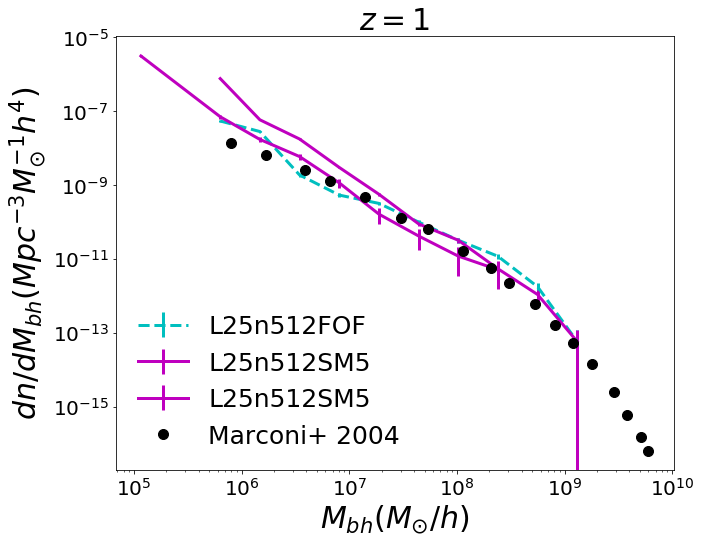

In [38]:
MIN,MAX,NBINS=3,10,20
tick_fontsize=20
levelmax=11
f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True)

#ax.set_title("BH_NEW_CENTERING is 'on'",fontsize=30)

ratio=3000

i=0
for desired_redshift in [1]:
    ax=axx
    ax.set_title('$z=%d$'%desired_redshift,fontsize=30)
    
    
    path_to_output='/orange//lblecha/aklantbhowmick/arepo_runs_aklant/' # this is the folder containing the simulation run
    run='/L25_n512/' # name of the simulation runs
    basePath=path_to_output+run+'/output/'
    M,MF,dMF=arepo_package.get_mass_function_for_zoom(basePath,levelmax,desired_redshift,'BH_Mass',MIN,MAX,NBINS,zoom_volume=0)
    mask=(MF>0)&(dMF>0)
    ax.errorbar(M[mask],MF[mask],dMF[mask],linewidth=3,marker=' ',ms=10,label='L25n512FOF',linestyle='dashed',color='c')
    
    path_to_output='/orange//lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//' # this is the folder containing the simulation run
    run='/density_and_metallicity_based_criterion_L25n512/AREPO' # name of the simulation runs
    basePath=path_to_output+run+'/output_debug6_test_painted0p5_ratio3000_SFMFGM5/'
    M,MF,dMF=arepo_package.get_mass_function_for_zoom(basePath,levelmax,desired_redshift,'BH_Mass',MIN,MAX,NBINS,zoom_volume=0)
    mask=(MF>0)&(dMF>0)
    ax.errorbar(M[mask],MF[mask],dMF[mask],linewidth=3,marker=' ',ms=10,label='L25n512SM5',color='m')

    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L12p5n512/AREPO/' # name of the simulation runs
    output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh) 
    basePath=path_to_output+run+output 
    M,MF,dMF=arepo_package.get_mass_function_for_zoom(basePath,levelmax,desired_redshift,'BH_Mass',MIN,MAX,NBINS,zoom_volume=0)
    mask=(MF>0)&(dMF>0)
    ax.errorbar(M[mask],MF[mask],dMF[mask],linewidth=3,marker=' ',ms=10,label='L25n512SM5',color='m')

    
    
    ax.set_yscale('log')
    ax.set_xscale('log')



    ax.set_xlabel('$M_{bh} (M_{\odot}/h)$',fontsize=label_fontsize)
    ax.tick_params(labelsize=tick_fontsize)
    i+=1
    
    
data=numpy.loadtxt('../arepo_code_development/observational_data/BHMF_z0_actualdata3.txt')
axx.errorbar(data[:,0]*0.7,data[:,1]/data[:,0]/0.7**4,color='black',label='Marconi+ 2004',marker='o',linewidth=0,ms=10)
axx.legend(fontsize=25,loc='lower left',frameon=False)

axx.set_ylabel('$dn/dM_{bh} (Mpc^{-3} M_{\odot}^{-1} h^4)$',fontsize=label_fontsize)
plt.subplots_adjust(wspace=0)
plt.savefig('./BHMF_observations_z0.png',bbox_inches='tight')

7
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
3 8
[3.13157895 3.39473684 3.65789474 3.92105263 4.18421053 4.44736842
 4.71052632 4.97368421 5.23684211 5.5        5.76315789 6.02631579
 6.28947368 6.55263158 6.81578947 7.07894737 7.34210526 7.60526316
 7.86842105] [1.2018e+04 2.4360e+03 9.0900e+02 9.2600e+02 2.8600e+02 1.3500e+02
 7.9000e+01 2.8000e+01 1.5000e+01 4.0000e+00 2.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
 0.0000e+00]
9
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
3 8
[3.13157895 3.39473684 3.65789474 3.92105263 4.18421053 4.44736842
 4.71052632 4.97368421 5.23684211 5.5        5.76315789 6.02631579
 6.28947368 6.55263158 6.81578947 7.07894737 7.34210526 7.60526316
 7.86842105] [1.8106e+04 2.2920e+03 7.5900e+02 8.5300e+02 2.2400e+02 1.1000e+02
 4.5000e+01 1.5000e+01 5.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0

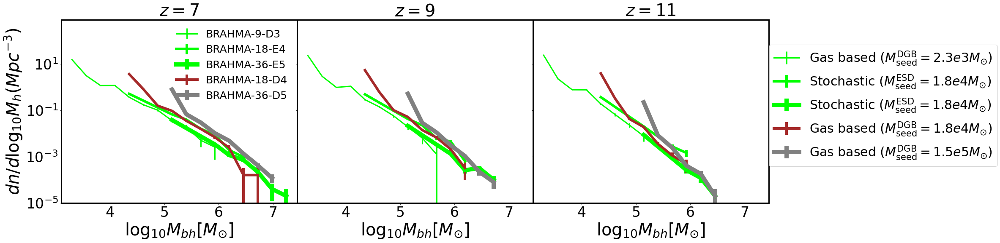

In [40]:
label_fontsize=30
def get_distribution(HM,Nbins,log_HM_min,log_HM_max,linear=0,cumulative=0,density=0):
    #print(HM)
    
    def extract(HM_min,HM_max):
        if (cumulative==1):
            mask=(HM>HM_min)
        else:
            mask=(HM>HM_min)&(HM<HM_max)
        return (HM_min+HM_max)/2,len(HM[mask])
    if (linear):
        HM_bin=numpy.linspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    else:
        HM_bin=numpy.logspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    out=[extract(HM_bin[i],HM_bin[i+1]) for i in range(0,len(HM_bin)-1)]
    #return out
    centers=numpy.array(list(zip(*out))[0])
    counts=numpy.array(list(zip(*out))[1])
    HMF=counts
    dHMF=numpy.sqrt(counts)
    norm=1.#sum(HMF)
    if (density==1):
        norm=numpy.diff(centers)[0]
    return centers,HMF/norm,dHMF/norm


def make_plot(ax,z_desired,basePath_cur,style='solid',col='black',width=6,log_mass_min=3.19,labl=' '):
    global Nbins, log_HM_min, log_HM_max
    redshift_space=[z_desired]

    BH_no_space=[]
    print(z_desired)
    
    boxsize=arepo_package.get_box_size(basePath_cur)/1e3

    for redshift in [z_desired]:
    

        BH_Mass,o=arepo_package.get_particle_property(basePath_cur,'BH_Mass',5,redshift)
        print(log_HM_min,log_HM_max)
        centers,HMF,dHMF=get_distribution(numpy.log10(BH_Mass*1e10), Nbins, log_HM_min, log_HM_max, linear=1,cumulative=0,density=0)
        #print(BH_Mass*1e10)
        print(centers,HMF)
        
        mask=(centers>log_mass_min)&(HMF>0)
        ax.errorbar(centers[mask]-log10(h),HMF[mask]/boxsize**3*h**3,dHMF[mask]/boxsize**3*h**3,linewidth=width,linestyle=style,color=col,label=labl,marker='',ms=15)
      
    
        ax.set_yscale('log')

        ax.tick_params(labelsize=label_fontsize+3)
        ax.set_xlabel('$\log_{10}M_{bh}[M_{\odot}]$',fontsize=40)


LogTargetGroupBHMass=5.00
levelmax_gas,logseedmass_gas=12,3.19
levelmax,logseedmass=12,3.19


f,axx=plt.subplots(1,3,figsize=(30,8),sharey=True,sharex=True)



def do(col='black',basePath_cur='.',style='solid',width=5,labl='',labl2=''):
    global Nbins, log_HM_min, log_HM_max
    i=0
    for z_desired in [7,9,11]:
        axx[i].set_title('$z=%d$'%z_desired,fontsize=40)
        Nbins, log_HM_min, log_HM_max = 20, 3, 8  
        log_mass_min=3.00


        if(z_desired==7):
            flabl=labl
        else:
            flabl=labl2

        make_plot(axx[i],z_desired,basePath_cur,col=col,width=width,log_mass_min=log_mass_min,labl=flabl,style=style)

      
        

        axx[i].set_ylim(1e-5,8e2)
        #axx[i,0].axvline(numpy.log10(2e4))
        
        i+=1
global Nbins, log_HM_min, log_HM_max


Msfmp,Mh=5,3000
j=0

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output 
                
        
do('lime',basePath_cur=basePath,style='solid',labl='BRAHMA-9-D3',labl2='Gas based ($M^{\mathrm{DGB}}_{\mathrm{seed}}=2.3e3 M_{\odot}$)',width=3) 



Msfmp,Mh=5,3000
j=0


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh) 
basePath=path_to_output+run+output 

do('lime',basePath_cur=basePath,style='solid',labl='BRAHMA-18-E4',labl2='Stochastic ($M^{\mathrm{ESD}}_{\mathrm{seed}}=1.8e4 M_{\odot}$)',width=6) 

Msfmp,Mh=5,3000
j=0


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L25n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh) 
basePath=path_to_output+run+output 

do('lime',basePath_cur=basePath,style='solid',labl='BRAHMA-36-E5',labl2='Stochastic ($M^{\mathrm{ESD}}_{\mathrm{seed}}=1.8e4 M_{\odot}$)',width=10) 




Msfmp,Mh=5,3000
j=0

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L12p5n1024/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed4.10_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output 
                
        
do('brown',basePath_cur=basePath,style='solid',labl='BRAHMA-18-D4',labl2='Gas based ($M^{\mathrm{DGB}}_{\mathrm{seed}}=1.8e4 M_{\odot}$)',width=6) 


Msfmp,Mh=5,3000
j=0

path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS2////' # this is the folder containing the simulation run
run='/L25n1024/AREPO/' # name of the simulation runs
output='/output_ratio%d_SFMFGM%d_seed5.00_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output 
                
        
do('grey',basePath_cur=basePath,style='solid',labl='BRAHMA-36-D5',labl2='Gas based ($M^{\mathrm{DGB}}_{\mathrm{seed}}=1.5e5 M_{\odot}$)',width=10) 




for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)

axx[0].set_ylabel('$dn/d\log_{10}M_h (Mpc^{-3})$',fontsize=40)

axx[0].legend(loc='upper right',fontsize=25,frameon=False)
axx[2].legend(loc=(1.,0.2),fontsize=30,frameon=True)

plt.subplots_adjust(wspace=0)
    
plt.savefig('./Paper6_figures/mass_functions_test2.png',bbox_inches='tight')








7
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
3 8
[3.17857143 3.53571429 3.89285714 4.25       4.60714286 4.96428571
 5.32142857 5.67857143 6.03571429 6.39285714 6.75       7.10714286
 7.46428571 7.82142857] [902. 374. 191. 108.  49.  15.   8.   4.   5.   1.   3.   0.   0.   0.]
9
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
3 8
[3.17857143 3.53571429 3.89285714 4.25       4.60714286 4.96428571
 5.32142857 5.67857143 6.03571429 6.39285714 6.75       7.10714286
 7.46428571 7.82142857] [1710.  564.  279.  137.   65.   17.   13.    6.    4.    3.    0.    0.
    0.    0.]
11
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
3 8
[3.17857143 3.53571429 3.89285714 4.25       4.60714286 4.96428571
 5.32142857 5.67857143 6.03571429 6.39285714 6.75       7.10714286
 7.46428571 7.82142857] [2.877e+03 6.840e+02 2.930e+02 1.460e+02 5.400e+01 2.800e+01 1.500e+01
 7.000e+00 1.000e+00 0.000e+00 0.000e+00 0

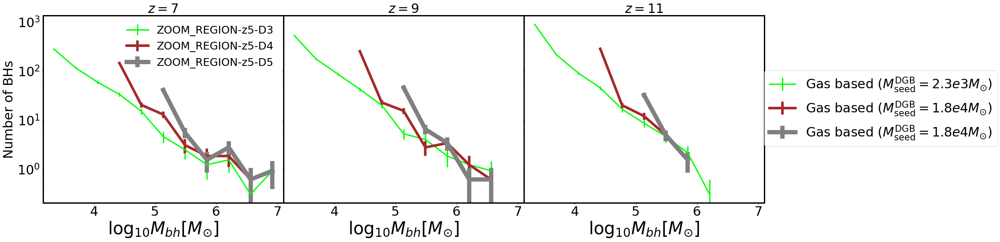

In [43]:
label_fontsize=30
def get_distribution(HM,Nbins,log_HM_min,log_HM_max,linear=0,cumulative=0,density=0):
    #print(HM)
    
    def extract(HM_min,HM_max):
        if (cumulative==1):
            mask=(HM>HM_min)
        else:
            mask=(HM>HM_min)&(HM<HM_max)
        return (HM_min+HM_max)/2,len(HM[mask])
    if (linear):
        HM_bin=numpy.linspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    else:
        HM_bin=numpy.logspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    out=[extract(HM_bin[i],HM_bin[i+1]) for i in range(0,len(HM_bin)-1)]
    #return out
    centers=numpy.array(list(zip(*out))[0])
    counts=numpy.array(list(zip(*out))[1])
    HMF=counts
    dHMF=numpy.sqrt(counts)
    norm=1.#sum(HMF)
    if (density==1):
        norm=numpy.diff(centers)[0]
    return centers,HMF/norm,dHMF/norm


def make_plot(ax,z_desired,basePath_cur,style='solid',col='black',width=6,log_mass_min=3.19,labl=' '):
    global Nbins, log_HM_min, log_HM_max
    redshift_space=[z_desired]

    BH_no_space=[]
    print(z_desired)
    
    boxsize=1

    for redshift in [z_desired]:
    

        BH_Mass,o=arepo_package.get_particle_property(basePath_cur,'BH_Mass',5,redshift)
        print(log_HM_min,log_HM_max)
        centers,HMF,dHMF=get_distribution(numpy.log10(BH_Mass*1e10), Nbins, log_HM_min, log_HM_max, linear=1,cumulative=0,density=0)
        #print(BH_Mass*1e10)
        print(centers,HMF)
        
        mask=(centers>log_mass_min)&(HMF>0)
        ax.errorbar(centers[mask]-log10(h),HMF[mask]/boxsize**3*h**3,dHMF[mask]/boxsize**3*h**3,linewidth=width,linestyle=style,color=col,label=labl,marker='',ms=15)
      
    
        ax.set_yscale('log')

        ax.tick_params(labelsize=label_fontsize)
        ax.set_xlabel('$\log_{10}M_{bh}[M_{\odot}]$',fontsize=40)


LogTargetGroupBHMass=5.00
levelmax_gas,logseedmass_gas=12,3.19
levelmax,logseedmass=12,3.19


f,axx=plt.subplots(1,3,figsize=(30,8),sharey=True,sharex=True)



def do(col='black',basePath_cur='.',style='solid',width=5,labl='',labl2=''):
    global Nbins, log_HM_min, log_HM_max
    i=0
    for z_desired in [7,9,11]:
        axx[i].set_title('$z=%d$'%z_desired,fontsize=30)
        Nbins, log_HM_min, log_HM_max = 15, 3, 8  
        log_mass_min=3.00


        if(z_desired==7):
            flabl=labl
        else:
            flabl=labl2

        make_plot(axx[i],z_desired,basePath_cur,col=col,width=width,log_mass_min=log_mass_min,labl=flabl,style=style)

      
        

        #axx[i].set_ylim(1e-4,3e2)
        #axx[i,0].axvline(numpy.log10(2e4))
        
        i+=1
global Nbins, log_HM_min, log_HM_max



Msfmp,Mh=5,3000
j=0

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/////' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax12_haloindex4_redshift5.00_logbhseedmass3.19_NSC/AREPO/' # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio3000_SFMFGM5/' 
basePath=path_to_output+run+output 

do('lime',basePath_cur=basePath,style='solid',labl='ZOOM_REGION-z5-D3',labl2='Gas based ($M^{\mathrm{DGB}}_{\mathrm{seed}}=2.3e3 M_{\odot}$)',width=3) 

Msfmp,Mh=5,3000
j=0

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/////' # this is the folder containing the simulation run
run='/LMAX11_ZOOM_REGION_z5/AREPO/RUNS' # name of the simulation runs
output='/Mh3000_Msfmp5_LogMseed4.10/' 
basePath=path_to_output+run+output 
                
        
do('brown',basePath_cur=basePath,style='solid',labl='ZOOM_REGION-z5-D4',labl2='Gas based ($M^{\mathrm{DGB}}_{\mathrm{seed}}=1.8e4 M_{\odot}$)',width=6) 



Msfmp,Mh=5,3000
j=0

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/////' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/AREPO/' # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio3000_SFMFGM5/' 
basePath=path_to_output+run+output 


do('grey',basePath_cur=basePath,style='solid',labl='ZOOM_REGION-z5-D5',labl2='Gas based ($M^{\mathrm{DGB}}_{\mathrm{seed}}=1.8e4 M_{\odot}$)',width=10) 


axx[0].set_ylabel('Number of BHs',fontsize=30)

axx[0].legend(loc='upper right',fontsize=25,frameon=False)
axx[2].legend(loc=(1.,0.3),fontsize=30,frameon=True)


plt.subplots_adjust(wspace=0)

for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)
plt.savefig('./Paper6_figures/mass_functions_test3.png',bbox_inches='tight')








7
Desired redshift:  7
Output redshift:  9.996590466186332
Output snapshot:  15
[3709441.    1002708.9   1901843.8    100758.58   100543.336 4616355.5
  101697.75  1001012.25  1902883.9    100490.98   100439.445 2806668.
  101190.664  100353.39  1903236.2   1001183.25   101006.086 2803057.5
  100486.95   100500.4    100776.52   100379.71   100021.27  1901272.2
  100259.94   100372.234 1901005.5    100522.055  100668.945 1000950.06
 1001568.8    100243.445 1001274.56   100299.23   100713.98  1000821.
  100041.65   100442.266  100348.44   100202.86   100053.26   100288.67
  100062.28  1002771.1    100191.984  100157.734 1000788.3    100318.99
  100049.34   100579.125  100361.81   100083.445  100015.68  1000605.1
  100377.1   2800406.     100172.016  100409.87   100228.95   100429.43
  100044.71  1000524.06   100237.61   100040.4    100098.04  1000880.4
  100060.35  1900760.1    100390.586  100043.99   100076.55   100052.766
  100099.39   100287.695  100332.02  1000526.1    100141.28   10

[ 100914.63  1901489.2    101158.83  2807428.5    100103.61   100167.305
 1000534.3   1902495.4    100241.6    100885.375  100807.97   100130.45
 1001131.7    100109.62   100416.88   100142.89  1000576.06   100377.54
 1001236.7    100187.88   100233.99   100240.875  100321.69   100231.35
  100047.11   100216.17  1000426.     100109.31   100158.62   100000.
  100249.41  1000546.06   100266.22   100062.23  1901290.1    100120.58
  100514.88  1001429.    1000353.75  1000289.6    100014.61   100377.23
  100116.75   100041.125  100114.25   100500.54   100026.05   100216.766
  100309.91   100108.55   100219.65   100183.516  100098.695  100107.58
  100015.66   100363.18  1000104.6    100179.62   100576.93   100368.07
  100245.24   100068.5    100243.59   100004.77   100174.26   100060.89
  100121.7    100078.48   100215.4    100084.62   100027.375  100106.19
  100040.09   100122.94   100065.73   100131.875  100255.9    100339.
  100123.41   100004.72   100507.47   100087.85   100089.54   1002

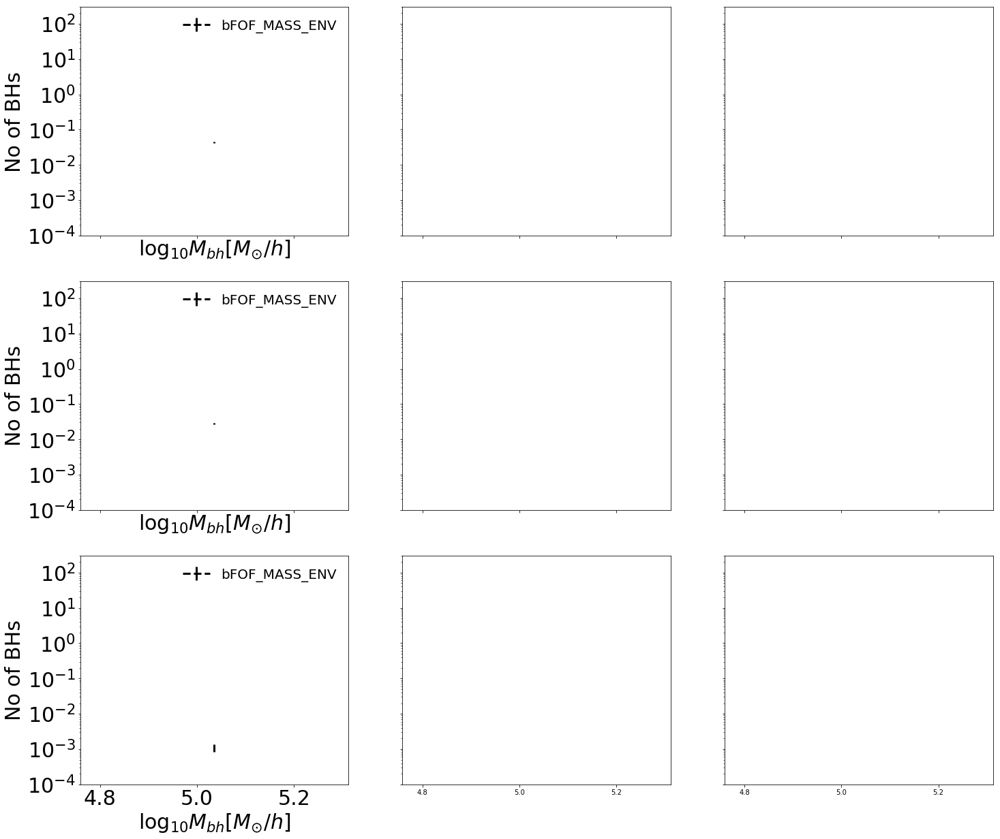

In [75]:
f,axx=plt.subplots(3,3,figsize=(24,21),sharey=True,sharex=True)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L25n1024/AREPO/' # name of the simulation runs
output='/output_Msfmp5_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6//' 
basePath=path_to_output+run+output        
        
do('black',basePath_cur=basePath,style='dashed') 